In [ ]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn import metrics

from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from scipy import stats
from numpy import linalg as ln
from IPython.display import display, HTML, Image
import plotly.express as px
from sklearn.linear_model import LinearRegression

import warnings
warnings.filterwarnings('ignore')

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Data loaded successfully
Total samples: 121
Room temperature samples: 61
Refrigerated samples: 60

Varieties found:
Variedad
Morada      24
Amarilla    24
6KUR        24
14BER       24
Blanca      24
Name: count, dtype: int64

Sample data:
   Week         Treatment  Variedad  Repetición     L*    a*     b*
0     1  Room Temperature    Morada         1.0  33.70  2.83   7.78
1     1  Room Temperature    Morada         2.0  35.18  5.87   6.66
2     1  Room Temperature    Morada         3.0  33.48  3.33   7.19
3     1  Room Temperature  Amarilla         1.0  56.41  2.75  36.23
4     1  Room Temperature  Amarilla         2.0  60.23  1.46  38.15


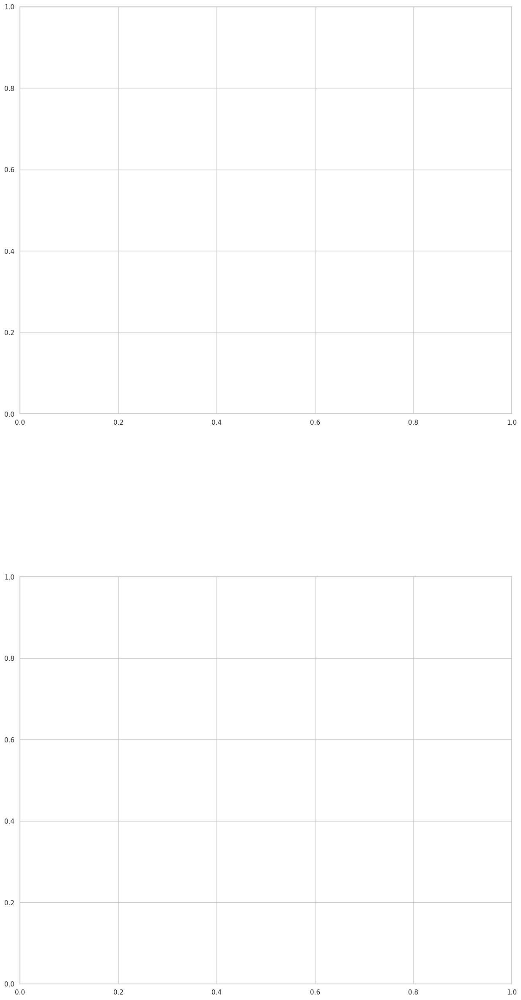

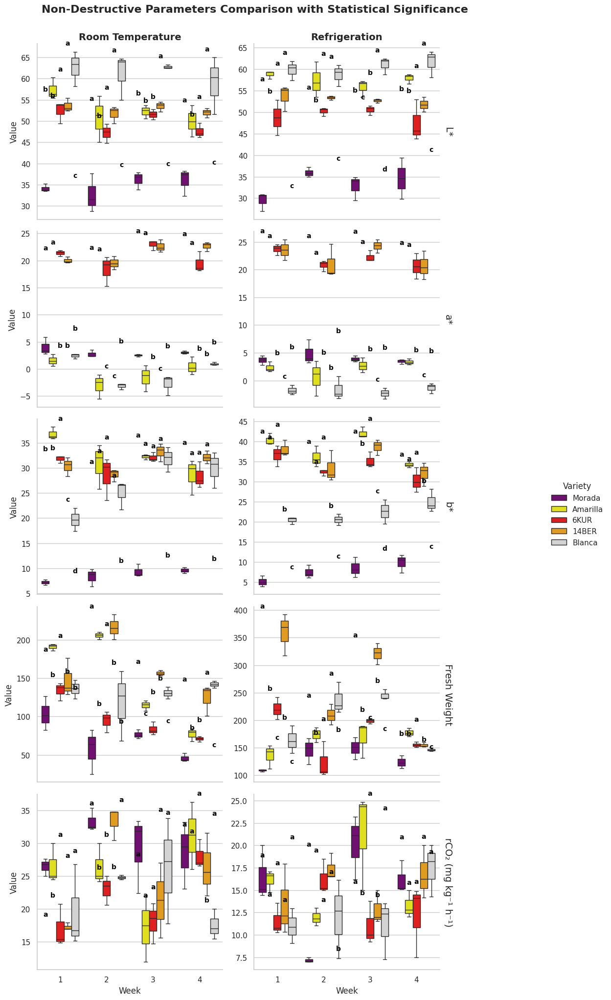

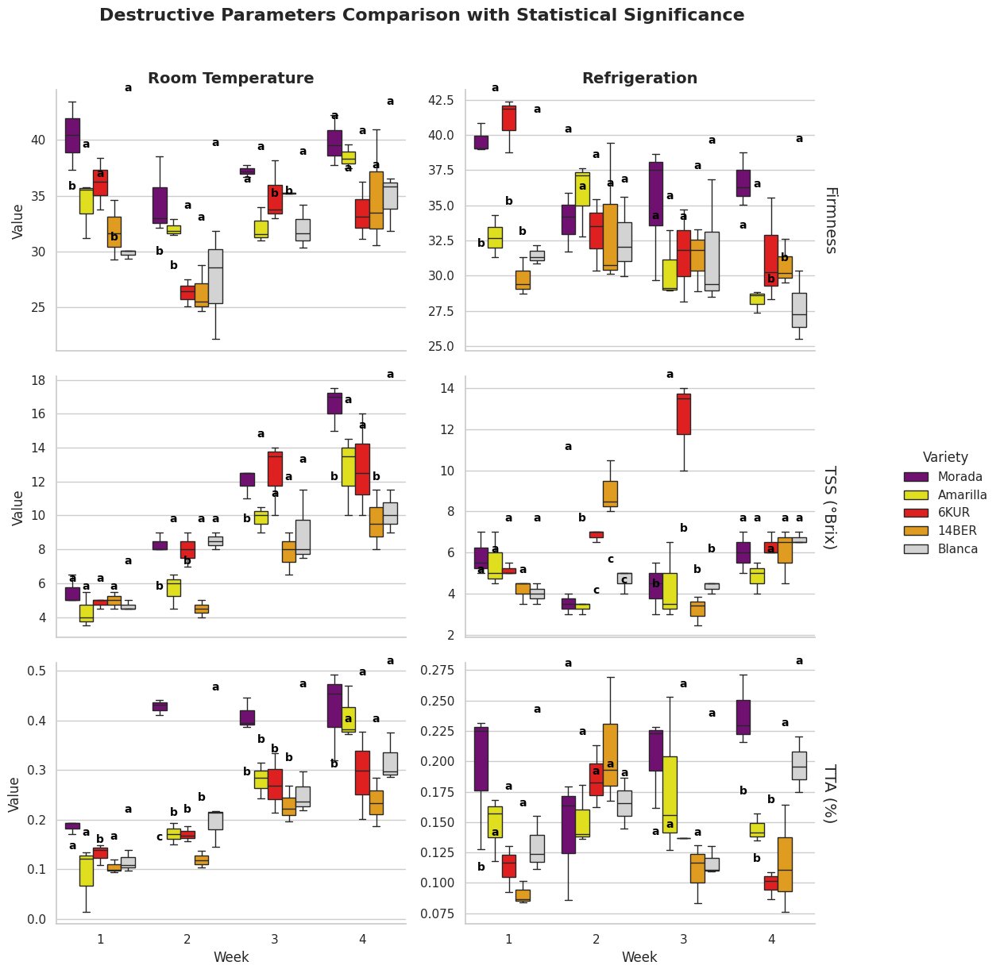

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import os
from itertools import product

# Estilo
plt.style.use('default')
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [12, 20]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.titleweight'] = 'bold'

# Paleta de colores (variedades en inglés)
variety_palette = {
    "6KUR": "red",
    "14BER": "orange",
    "Amarilla": "yellow",
    "Blanca": "lightgray",
    "Morada": "purple"
}

# Traducción de parámetros
param_translation = {
    'L*': 'L*',
    'a*': 'a*',
    'b*': 'b*',
    'Peso_Fresco': 'Fresh Weight',
    'Firmeza': 'Firmness',
    'Respiración': 'rCO₂ (mg kg⁻¹ h⁻¹)',
    'IC': 'IC',
    'SST_Corregido': 'TSS (°Brix)',
    'ATT': 'TTA (%)'
}

def load_carrot_data(file_path, week):
    """Cargar datos de zanahorias desde archivos Excel"""
    try:
        amb_data = pd.read_excel(file_path, sheet_name='Ambiente')
        refri_data = pd.read_excel(file_path, sheet_name='Refrigeración')

        amb_data['Week'] = week
        amb_data['Treatment'] = 'Room Temperature'
        refri_data['Week'] = week
        refri_data['Treatment'] = 'Refrigeration'

        combined_data = pd.concat([amb_data, refri_data], ignore_index=True)
        combined_data.columns = combined_data.columns.str.strip()

        combined_data['Variedad'] = combined_data['Variedad'].str.strip()
        combined_data['Variedad'] = combined_data['Variedad'].replace({
            'YELLOW': 'Yellow',
            'WHITE': 'White',
            'PURPLE': 'Purple'
        })

        numeric_cols = ['L*', 'a*', 'b*', 'Diametro', 'Longitud', 'Peso_Fresco',
                       'Peso_fresco_kg', 'm', 'Respiración', 'ATAN', 'Hue',
                       'Croma', 'Firmeza', 'SST', 'SST_Corregido', 'NaOH',
                       'Acidez_Peso_Muestra', 'Factor_D', 'ATT']

        for col in numeric_cols:
            if col in combined_data.columns:
                combined_data[col] = pd.to_numeric(combined_data[col], errors='coerce')

        # Renombrar columnas a inglés
        combined_data = combined_data.rename(columns=param_translation)

        return combined_data
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return pd.DataFrame()

def perform_tukey_test(data, group_col, value_col):
    data = data.dropna(subset=[value_col])
    if len(data[value_col].unique()) < 2:
        return {group: '' for group in data[group_col].unique()}
    try:
        tukey = pairwise_tukeyhsd(endog=data[value_col], groups=data[group_col], alpha=0.05)
        tukey_df = pd.DataFrame(tukey._results_table.data[1:], columns=tukey._results_table.data[0])
        group_means = data.groupby(group_col)[value_col].mean()
        sorted_groups = group_means.sort_values(ascending=False).index.tolist()
        letters = {group: '' for group in data[group_col].unique()}
        current_letter = 'a'

        for group in sorted_groups:
            if letters[group] == '':
                letters[group] = current_letter
                similar_groups = [group]
                for other_group in sorted_groups:
                    if other_group != group and letters[other_group] == '':
                        reject = tukey_df[((tukey_df['group1'] == group) & (tukey_df['group2'] == other_group)) |
                                      ((tukey_df['group1'] == other_group) & (tukey_df['group2'] == group))]['reject'].values
                        if len(reject) > 0 and not reject[0]:
                            similar_groups.append(other_group)
                for g in similar_groups:
                    letters[g] = current_letter
                current_letter = chr(ord(current_letter) + 1)

        return letters
    except Exception as e:
        print(f"Error in Tukey test for {value_col}: {e}")
        return {group: '' for group in data[group_col].unique()}

def plot_parameters_with_significance(data, destructive_params, non_destructive_params):
    non_destructive_melt = data.melt(
        id_vars=['Week', 'Treatment', 'Variedad', 'Repetición'],
        value_vars=non_destructive_params,
        var_name='Parameter',
        value_name='Value'
    ).dropna()

    destructive_melt = data.melt(
        id_vars=['Week', 'Treatment', 'Variedad', 'Repetición'],
        value_vars=destructive_params,
        var_name='Parameter',
        value_name='Value'
    ).dropna()

    fig = plt.figure(figsize=(15, 30))
    gs = fig.add_gridspec(2, 1, hspace=0.4)

    # Función auxiliar mejorada para agregar letras de significancia
    def add_significance_letters(ax, data, x_var, y_var, hue_var, palette):
        # Obtener las categorías únicas
        x_categories = sorted(data[x_var].unique())
        hue_categories = sorted(data[hue_var].unique())
        n_hues = len(hue_categories)

        # Ancho de cada grupo de boxplots
        group_width = 0.8
        box_width = group_width / n_hues

        for x_idx, x_val in enumerate(x_categories):
            subset = data[data[x_var] == x_val]
            if len(subset[hue_var].unique()) < 2:
                continue

            letters = perform_tukey_test(subset, hue_var, y_var)

            for hue_idx, hue_val in enumerate(hue_categories):
                hue_data = subset[subset[hue_var] == hue_val][y_var].dropna()
                if len(hue_data) == 0:
                    continue

                # Calcular posición x exacta (centro de la caja)
                x_pos = x_idx + (hue_idx - (n_hues-1)/2) * box_width

                # Calcular posición y (parte superior de la caja + 3% del rango y)
                q1 = np.percentile(hue_data, 25)
                q3 = np.percentile(hue_data, 75)
                iqr = q3 - q1
                upper_whisker = q3 + 1.5*iqr
                y_max = np.max(hue_data[hue_data <= upper_whisker])
                y_range = ax.get_ylim()[1] - ax.get_ylim()[0]
                y_pos = y_max + 0.03 * y_range

                # Agregar la letra (negra, centrada, encima de la caja)
                ax.text(x_pos, y_pos, letters[hue_val],
                        ha='center', va='bottom',
                        fontweight='bold', fontsize=10,
                        color='black')  # Letras siempre negras

    # Gráficos no destructivos
    ax1 = fig.add_subplot(gs[0, 0])
    g1 = sns.FacetGrid(non_destructive_melt, row='Parameter', col='Treatment',
                      margin_titles=True, height=4, aspect=1.2, sharey=False, sharex=True)
    g1.map_dataframe(sns.boxplot, x='Week', y='Value', hue='Variedad',
                    palette=variety_palette, dodge=True, width=0.8, fliersize=3, linewidth=1)

    # Agregar letras de significancia a cada subplot
    for (row_val, col_val), ax in g1.axes_dict.items():
        subset = non_destructive_melt[
            (non_destructive_melt['Parameter'] == row_val) &
            (non_destructive_melt['Treatment'] == col_val)
        ]
        if not subset.empty:
            add_significance_letters(ax, subset, 'Week', 'Value', 'Variedad', variety_palette)
            ax.set_xticks(range(len(subset['Week'].unique())))
            ax.set_xticklabels(sorted(subset['Week'].unique()))

    g1.set_titles(col_template="{col_name}", row_template="{row_name}", size=14)
    g1.set_axis_labels("Week", "Value")
    g1.fig.suptitle('Non-Destructive Parameters Comparison with Statistical Significance',
                   y=1.02, fontsize=16, fontweight='bold')
    g1.add_legend(title='Variety', bbox_to_anchor=(1.05, 0.5), loc='center left')

    # Gráficos destructivos
    ax2 = fig.add_subplot(gs[1, 0])
    g2 = sns.FacetGrid(destructive_melt, row='Parameter', col='Treatment',
                      margin_titles=True, height=4, aspect=1.2, sharey=False, sharex=True)
    g2.map_dataframe(sns.boxplot, x='Week', y='Value', hue='Variedad',
                    palette=variety_palette, dodge=True, width=0.8, fliersize=3, linewidth=1)

    # Agregar letras de significancia a cada subplot
    for (row_val, col_val), ax in g2.axes_dict.items():
        subset = destructive_melt[
            (destructive_melt['Parameter'] == row_val) &
            (destructive_melt['Treatment'] == col_val)
        ]
        if not subset.empty:
            add_significance_letters(ax, subset, 'Week', 'Value', 'Variedad', variety_palette)
            ax.set_xticks(range(len(subset['Week'].unique())))
            ax.set_xticklabels(sorted(subset['Week'].unique()))

    g2.set_titles(col_template="{col_name}", row_template="{row_name}", size=14)
    g2.set_axis_labels("Week", "Value")
    g2.fig.suptitle('Destructive Parameters Comparison with Statistical Significance',
                   y=1.02, fontsize=16, fontweight='bold')
    g2.add_legend(title='Variety', bbox_to_anchor=(1.05, 0.5), loc='center left')

    plt.tight_layout()
    plt.show()

# Ejecución principal
if __name__ == "__main__":
    files_weeks = [
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/7 10.xlsx", 1),
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 15 10 24  Colab_CadenaF_TAmb.xlsx", 2),
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 21 10 024.xlsx", 3),
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/ Muestreo 28 10 024.xlsx", 4)
    ]

    try:
        all_data = []
        for file_path, week in files_weeks:
            data = load_carrot_data(file_path, week)
            if not data.empty:
                all_data.append(data)

        data = pd.concat(all_data, ignore_index=True)
        data = data.dropna(how='all')
        data['Variedad'] = data['Variedad'].str.strip()

        print("Data loaded successfully")
        print(f"Total samples: {len(data)}")
        print(f"Room temperature samples: {len(data[data['Treatment'] == 'Room Temperature'])}")
        print(f"Refrigerated samples: {len(data[data['Treatment'] == 'Refrigeration'])}")
        print("\nVarieties found:")
        print(data['Variedad'].value_counts())
        print("\nSample data:")
        print(data[['Week', 'Treatment', 'Variedad', 'Repetición', 'L*', 'a*', 'b*']].head())

        non_destructive_params = ['L*', 'a*', 'b*', 'Fresh Weight', 'rCO₂ (mg kg⁻¹ h⁻¹)']
        destructive_params = ['Firmness', 'TSS (°Brix)', 'TTA (%)']

        plot_parameters_with_significance(data, destructive_params, non_destructive_params)

    except Exception as e:
        print(f"Execution error: {e}")

In [3]:
!pip install pandas openpyxl rpy2

In [4]:
import pandas as pd
import numpy as np

files_weeks = [
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/7 10.xlsx", 1),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 15 10 24  Colab_CadenaF_TAmb.xlsx", 2),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 21 10 024.xlsx", 3),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/ Muestreo 28 10 024.xlsx", 4)
]

param_translation = {
    'Peso_Fresco': 'Fresh_Weight',
    'Firmeza': 'Firmness',
    'Respiración': 'Respiration',
    'SST_Corregido': 'TSS',
    'ATT': 'TTA'
}

def load_carrot_data(file_path, week):
    amb_data = pd.read_excel(file_path, sheet_name='Ambiente')
    refri_data = pd.read_excel(file_path, sheet_name='Refrigeración')

    amb_data['Week'] = week
    amb_data['Treatment'] = 'Room_Temperature'

    refri_data['Week'] = week
    refri_data['Treatment'] = 'Refrigeration'

    combined_data = pd.concat([amb_data, refri_data], ignore_index=True)
    combined_data.columns = combined_data.columns.str.strip()

    combined_data['Variedad'] = combined_data['Variedad'].astype(str).str.strip()
    combined_data['Variedad'] = combined_data['Variedad'].replace({
        'YELLOW': 'Yellow',
        'WHITE': 'White',
        'PURPLE': 'Purple'
    })

    numeric_cols = ['L*', 'a*', 'b*', 'Diametro', 'Longitud', 'Peso_Fresco',
                    'Peso_fresco_kg', 'm', 'Respiración', 'ATAN', 'Hue',
                    'Croma', 'Firmeza', 'SST', 'SST_Corregido', 'NaOH',
                    'Acidez_Peso_Muestra', 'Factor_D', 'ATT']

    for col in numeric_cols:
        if col in combined_data.columns:
            combined_data[col] = pd.to_numeric(combined_data[col], errors='coerce')

    combined_data = combined_data.rename(columns=param_translation)
    return combined_data

all_data = []
for file_path, week in files_weeks:
    df = load_carrot_data(file_path, week)
    all_data.append(df)

data = pd.concat(all_data, ignore_index=True)
data = data.dropna(how='all').copy()

# Factores
data['Variedad'] = data['Variedad'].astype(str).str.strip()
data['Treatment'] = data['Treatment'].astype(str)
data['Week'] = data['Week'].astype(str)
data['Repetición'] = data['Repetición'].astype(str)

print(data.shape)
print(data[['Variedad', 'Treatment', 'Week', 'Repetición']].head())

(121, 25)
   Variedad         Treatment Week Repetición
0    Morada  Room_Temperature    1        1.0
1    Morada  Room_Temperature    1        2.0
2    Morada  Room_Temperature    1        3.0
3  Amarilla  Room_Temperature    1        1.0
4  Amarilla  Room_Temperature    1        2.0


In [5]:
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter

# Activar conversión pandas <-> R
pandas2ri.activate()

# Instalar paquetes R si no están
ro.r('''
if (!requireNamespace("ARTool", quietly=TRUE)) install.packages("ARTool")
if (!requireNamespace("emmeans", quietly=TRUE)) install.packages("emmeans")
if (!requireNamespace("readxl", quietly=TRUE)) install.packages("readxl")
if (!requireNamespace("writexl", quietly=TRUE)) install.packages("writexl")
''')

# Pasar dataframe a R
with localconverter(ro.default_converter + pandas2ri.converter):
    ro.globalenv['data_py'] = data

ro.r('''
library(ARTool)
library(emmeans)

data_r <- data_py

data_r$Variedad <- as.factor(data_r$Variedad)
data_r$Treatment <- as.factor(data_r$Treatment)
data_r$Week <- as.factor(data_r$Week)
data_r$Repetición <- as.factor(data_r$Repetición)
''')

(as ‘lib’ is unspecified)





































	‘/tmp/RtmpHwUYxd/downloaded_packages’

(as ‘lib’ is unspecified)







	‘/tmp/RtmpHwUYxd/downloaded_packages’

  method           from
  na.action.merMod car 

Caution: You lose important information if you filter this package's results.
See '? untidy'



In [6]:
def run_art(variable):
    r_code = f'''
    library(ARTool)
    library(emmeans)

    df <- data_r[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    df <- df[!is.na(df${variable}), ]

    model_art <- art(`{variable}` ~ Variedad * Treatment * Week, data = df)
    anova_tab <- anova(model_art)
    anova_df <- as.data.frame(anova_tab)
    anova_df$Effect <- rownames(anova_df)
    rownames(anova_df) <- NULL

    # eta² parcial
    anova_df$partial_eta2 <- (anova_df$`F value` * anova_df$Df) /
                             ((anova_df$`F value` * anova_df$Df) + anova_df$Df.res)
    anova_df$Variable <- "{variable}"

    emm_var <- emmeans(model_art, ~ Variedad | Treatment * Week)
    posthoc_var <- as.data.frame(pairs(emm_var, adjust = "bonferroni"))
    posthoc_var$ComparisonType <- "Variedad within Treatment*Week"
    posthoc_var$Variable <- "{variable}"

    emm_week <- emmeans(model_art, ~ Week | Variedad * Treatment)
    posthoc_week <- as.data.frame(pairs(emm_week, adjust = "bonferroni"))
    posthoc_week$ComparisonType <- "Week within Variedad*Treatment"
    posthoc_week$Variable <- "{variable}"

    emm_treat <- emmeans(model_art, ~ Treatment | Variedad * Week)
    posthoc_treat <- as.data.frame(pairs(emm_treat, adjust = "bonferroni"))
    posthoc_treat$ComparisonType <- "Treatment within Variedad*Week"
    posthoc_treat$Variable <- "{variable}"

    posthoc_all <- rbind(posthoc_var, posthoc_week, posthoc_treat)

    result <- list(anova = anova_df, posthoc = posthoc_all)
    '''

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_df = ro.conversion.rpy2py(ro.r('result$anova'))
        posthoc_df = ro.conversion.rpy2py(ro.r('result$posthoc'))

    return anova_df, posthoc_df

In [7]:
data = data.dropna(how='all').copy()

# Renombrar columnas a nombres seguros para R
safe_names = {
    'L*': 'L_star',
    'a*': 'a_star',
    'b*': 'b_star',
    'Fresh Weight': 'Fresh_Weight',
    'rCO₂ (mg kg⁻¹ h⁻¹)': 'Respiration',
    'Firmness': 'Firmness',
    'TSS (°Brix)': 'TSS',
    'TTA (%)': 'TTA'
}

data = data.rename(columns=safe_names)

# Factores
data['Variedad'] = data['Variedad'].astype(str).str.strip()
data['Treatment'] = data['Treatment'].astype(str)
data['Week'] = data['Week'].astype(str)
data['Repetición'] = data['Repetición'].astype(str)

print(data.columns.tolist())

['Tiempo', 'Variedad', 'Repetición', 'L_star', 'a_star', 'b_star', 'Diametro', 'Longitud', 'Fresh_Weight', 'Peso_fresco_kg', 'm', 'Respiration', 'IC', 'ATAN', 'Hue', 'Croma', 'Firmness', 'SST', 'TSS', 'NaOH', 'Acidez_Peso_Muestra', 'Factor_D', 'TTA', 'Week', 'Treatment']


In [8]:
response_vars = [
    'L_star', 'a_star', 'b_star',
    'Fresh_Weight',
    'Respiration',
    'Firmness',
    'TSS',
    'TTA'
]

In [9]:
def run_art(variable):
    r_code = f"""
    library(ARTool)
    library(emmeans)

    df <- data_r[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    df <- df[!is.na(df[["{variable}"]]), ]

    formula_art <- as.formula("{variable} ~ Variedad * Treatment * Week")
    model_art <- art(formula_art, data = df)

    anova_tab <- anova(model_art)
    anova_df <- as.data.frame(anova_tab)
    anova_df$Effect <- rownames(anova_df)
    rownames(anova_df) <- NULL

    anova_df$partial_eta2 <- (anova_df$`F value` * anova_df$Df) /
                             ((anova_df$`F value` * anova_df$Df) + anova_df$Df.res)
    anova_df$Variable <- "{variable}"

    emm_var <- emmeans(model_art, ~ Variedad | Treatment * Week)
    posthoc_var <- as.data.frame(pairs(emm_var, adjust = "bonferroni"))
    posthoc_var$ComparisonType <- "Variedad within Treatment*Week"
    posthoc_var$Variable <- "{variable}"

    emm_week <- emmeans(model_art, ~ Week | Variedad * Treatment)
    posthoc_week <- as.data.frame(pairs(emm_week, adjust = "bonferroni"))
    posthoc_week$ComparisonType <- "Week within Variedad*Treatment"
    posthoc_week$Variable <- "{variable}"

    emm_treat <- emmeans(model_art, ~ Treatment | Variedad * Week)
    posthoc_treat <- as.data.frame(pairs(emm_treat, adjust = "bonferroni"))
    posthoc_treat$ComparisonType <- "Treatment within Variedad*Week"
    posthoc_treat$Variable <- "{variable}"

    posthoc_all <- rbind(posthoc_var, posthoc_week, posthoc_treat)
    result <- list(anova = anova_df, posthoc = posthoc_all)
    """

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_df = ro.conversion.rpy2py(ro.r('result$anova'))
        posthoc_df = ro.conversion.rpy2py(ro.r('result$posthoc'))

    return anova_df, posthoc_df

In [10]:
with localconverter(ro.default_converter + pandas2ri.converter):
    ro.globalenv['data_py'] = data

ro.r('''
library(ARTool)
library(emmeans)

data_r <- data_py
data_r$Variedad <- as.factor(data_r$Variedad)
data_r$Treatment <- as.factor(data_r$Treatment)
data_r$Week <- as.factor(data_r$Week)
data_r$Repetición <- as.factor(data_r$Repetición)
''')

In [2]:
# ============================================================
# BLOQUE ÚNICO CORREGIDO: PYTHON + R (rpy2) PARA ART
# - Usa art() para ANOVA
# - Usa artlm() + emmeans() para posthoc
# - Maneja errores por variable
# - Guarda resultados en Excel
# ============================================================

# Si estás en Colab y no has instalado esto, descomenta:
# !pip install pandas openpyxl rpy2

import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")

# -----------------------------
# 1. RUTAS DE TUS ARCHIVOS
# -----------------------------
files_weeks = [
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/7 10.xlsx", 1),
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 15 10 24  Colab_CadenaF_TAmb.xlsx", 2),
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 21 10 024.xlsx", 3),
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/ Muestreo 28 10 024.xlsx", 4)
]

# -----------------------------
# 2. FUNCIÓN DE CARGA
# -----------------------------
def load_carrot_data(file_path, week):
    amb_data = pd.read_excel(file_path, sheet_name='Ambiente')
    refri_data = pd.read_excel(file_path, sheet_name='Refrigeración')

    amb_data['Week'] = week
    amb_data['Treatment'] = 'Room_Temperature'

    refri_data['Week'] = week
    refri_data['Treatment'] = 'Refrigeration'

    combined_data = pd.concat([amb_data, refri_data], ignore_index=True)
    combined_data.columns = combined_data.columns.str.strip()

    if 'Variedad' in combined_data.columns:
        combined_data['Variedad'] = combined_data['Variedad'].astype(str).str.strip()
        combined_data['Variedad'] = combined_data['Variedad'].replace({
            'YELLOW': 'Yellow',
            'WHITE': 'White',
            'PURPLE': 'Purple',
            'Amarilla': 'Yellow',
            'Blanca': 'White',
            'Morada': 'Purple'
        })

    numeric_cols = [
        'L*', 'a*', 'b*', 'Diametro', 'Longitud', 'Peso_Fresco',
        'Peso_fresco_kg', 'm', 'Respiración', 'ATAN', 'Hue',
        'Croma', 'Firmeza', 'SST', 'SST_Corregido', 'NaOH',
        'Acidez_Peso_Muestra', 'Factor_D', 'ATT'
    ]

    for col in numeric_cols:
        if col in combined_data.columns:
            combined_data[col] = pd.to_numeric(combined_data[col], errors='coerce')

    return combined_data

# -----------------------------
# 3. CARGAR Y UNIR TODOS LOS DATOS
# -----------------------------
all_data = []
for file_path, week in files_weeks:
    try:
        df = load_carrot_data(file_path, week)
        all_data.append(df)
        print(f"✅ Cargado: {file_path}")
    except Exception as e:
        print(f"❌ Error cargando {file_path}: {e}")

data = pd.concat(all_data, ignore_index=True)
data = data.dropna(how='all').copy()

# -----------------------------
# 4. RENOMBRAR COLUMNAS A NOMBRES SEGUROS
# -----------------------------
safe_names = {
    'L*': 'L_star',
    'a*': 'a_star',
    'b*': 'b_star',
    'Peso_Fresco': 'Fresh_Weight',
    'Respiración': 'Respiration',
    'Firmeza': 'Firmness',
    'SST_Corregido': 'TSS',
    'ATT': 'TTA'
}
data = data.rename(columns={k: v for k, v in safe_names.items() if k in data.columns})

# Asegurar columna de repetición
if 'Repetición' not in data.columns:
    if 'Repeticion' in data.columns:
        data = data.rename(columns={'Repeticion': 'Repetición'})
    else:
        data['Repetición'] = data.groupby(['Variedad', 'Treatment', 'Week']).cumcount() + 1

# Factores como texto
data['Variedad'] = data['Variedad'].astype(str).str.strip()
data['Treatment'] = data['Treatment'].astype(str).str.strip()
data['Week'] = data['Week'].astype(str).str.strip()
data['Repetición'] = data['Repetición'].astype(str).str.strip()

print("\nColumnas disponibles:")
print(data.columns.tolist())

print("\nResumen rápido:")
print(data[['Variedad', 'Treatment', 'Week', 'Repetición']].head())

# -----------------------------
# 5. VARIABLES RESPUESTA
# -----------------------------
candidate_vars = [
    'L_star', 'a_star', 'b_star',
    'Fresh_Weight',
    'Respiration',
    'Firmness',
    'TSS',
    'TTA'
]
response_vars = [v for v in candidate_vars if v in data.columns]

print("\nVariables a analizar:")
print(response_vars)

if len(response_vars) == 0:
    raise ValueError("No se encontraron variables respuesta válidas. Revisa nombres de columnas.")

# -----------------------------
# 6. PREPARAR rpy2 Y R
# -----------------------------
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r(r'''
options(repos = c(CRAN = "https://cloud.r-project.org"))
pkgs <- c("ARTool", "emmeans", "writexl")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}
''')

with localconverter(ro.default_converter + pandas2ri.converter):
    ro.globalenv['data_py'] = data

ro.r(r'''
suppressPackageStartupMessages({
  library(ARTool)
  library(emmeans)
  library(writexl)
})

data_r <- data_py

# Factores
data_r$Variedad <- droplevels(as.factor(data_r$Variedad))
data_r$Treatment <- droplevels(as.factor(data_r$Treatment))
data_r$Week <- droplevels(as.factor(data_r$Week))
data_r$Repetición <- droplevels(as.factor(data_r$Repetición))

# Contrastes recomendados
options(contrasts = c("contr.sum", "contr.poly"))
''')

# -----------------------------
# 7. FUNCIÓN PARA CORRER ART
# -----------------------------
def run_art(variable):
    r_code = f"""
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
    }})

    # Subconjunto con la variable actual
    df <- data_r[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    df <- df[!is.na(df[["{variable}"]]), ]
    df <- droplevels(df)

    if (nrow(df) == 0) {{
      stop("No hay datos no NA para la variable {variable}")
    }}

    # Revisar número de niveles útiles
    if (nlevels(df$Variedad) < 2 || nlevels(df$Treatment) < 2 || nlevels(df$Week) < 2) {{
      stop("No hay suficientes niveles en uno de los factores para {variable}")
    }}

    # Modelo ART global
    formula_art <- as.formula("{variable} ~ Variedad * Treatment * Week")
    model_art <- art(formula_art, data = df)

    # ANOVA ART
    anova_tab <- anova(model_art)
    anova_df <- as.data.frame(anova_tab)
    anova_df$Effect <- rownames(anova_df)
    rownames(anova_df) <- NULL

    if (all(c("F value", "Df", "Df.res") %in% names(anova_df))) {{
      anova_df$partial_eta2 <- (anova_df[["F value"]] * anova_df[["Df"]]) /
                               ((anova_df[["F value"]] * anova_df[["Df"]]) + anova_df[["Df.res"]])
    }} else {{
      anova_df$partial_eta2 <- NA_real_
    }}
    anova_df$Variable <- "{variable}"

    # -------------------------
    # POSTHOC CORRECTO CON artlm()
    # -------------------------
    posthoc_list <- list()

    # A) Comparar Variedad dentro de Treatment x Week
    fit_var <- tryCatch(artlm(model_art, "Variedad"), error = function(e) NULL)
    if (!is.null(fit_var)) {{
      tmp <- tryCatch({{
        emm_var <- emmeans(fit_var, ~ Variedad | Treatment * Week)
        out <- as.data.frame(pairs(emm_var, adjust = "bonferroni"))
        out$ComparisonType <- "Variedad within Treatment*Week"
        out$Variable <- "{variable}"
        out
      }}, error = function(e) NULL)
      if (!is.null(tmp)) posthoc_list[[length(posthoc_list) + 1]] <- tmp
    }}

    # B) Comparar Week dentro de Variedad x Treatment
    fit_week <- tryCatch(artlm(model_art, "Week"), error = function(e) NULL)
    if (!is.null(fit_week)) {{
      tmp <- tryCatch({{
        emm_week <- emmeans(fit_week, ~ Week | Variedad * Treatment)
        out <- as.data.frame(pairs(emm_week, adjust = "bonferroni"))
        out$ComparisonType <- "Week within Variedad*Treatment"
        out$Variable <- "{variable}"
        out
      }}, error = function(e) NULL)
      if (!is.null(tmp)) posthoc_list[[length(posthoc_list) + 1]] <- tmp
    }}

    # C) Comparar Treatment dentro de Variedad x Week
    fit_treat <- tryCatch(artlm(model_art, "Treatment"), error = function(e) NULL)
    if (!is.null(fit_treat)) {{
      tmp <- tryCatch({{
        emm_treat <- emmeans(fit_treat, ~ Treatment | Variedad * Week)
        out <- as.data.frame(pairs(emm_treat, adjust = "bonferroni"))
        out$ComparisonType <- "Treatment within Variedad*Week"
        out$Variable <- "{variable}"
        out
      }}, error = function(e) NULL)
      if (!is.null(tmp)) posthoc_list[[length(posthoc_list) + 1]] <- tmp
    }}

    if (length(posthoc_list) > 0) {{
      posthoc_all <- do.call(rbind, posthoc_list)
    }} else {{
      posthoc_all <- data.frame(
        contrast = character(),
        estimate = numeric(),
        SE = numeric(),
        df = numeric(),
        t.ratio = numeric(),
        p.value = numeric(),
        ComparisonType = character(),
        Variable = character()
      )
    }}

    result <- list(
      anova = anova_df,
      posthoc = posthoc_all
    )
    """
    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_df = ro.conversion.rpy2py(ro.r('result$anova'))
        posthoc_df = ro.conversion.rpy2py(ro.r('result$posthoc'))

    return anova_df, posthoc_df

# -----------------------------
# 8. CORRER TODAS LAS VARIABLES
# -----------------------------
all_anova = []
all_posthoc = []
errors = []

for var in response_vars:
    try:
        print(f"\n🔄 Corriendo ART para: {var}")
        anova_df, posthoc_df = run_art(var)
        all_anova.append(anova_df)
        all_posthoc.append(posthoc_df)
        print(f"✅ Terminado: {var}")
    except Exception as e:
        print(f"❌ Error en {var}: {e}")
        errors.append((var, str(e)))

# -----------------------------
# 9. UNIR Y GUARDAR RESULTADOS
# -----------------------------
anova_results = pd.concat(all_anova, ignore_index=True) if all_anova else pd.DataFrame()
posthoc_results = pd.concat(all_posthoc, ignore_index=True) if all_posthoc else pd.DataFrame()
errors_df = pd.DataFrame(errors, columns=["Variable", "Error"]) if errors else pd.DataFrame(columns=["Variable", "Error"])

output_file = "Resultados_ART_Zanahoria.xlsx"

with pd.ExcelWriter(output_file, engine="openpyxl") as writer:
    data.to_excel(writer, sheet_name="Data_Used", index=False)
    anova_results.to_excel(writer, sheet_name="ART_ANOVA", index=False)
    posthoc_results.to_excel(writer, sheet_name="POSTHOC_BONFERRONI", index=False)
    errors_df.to_excel(writer, sheet_name="Errors", index=False)

print("\n====================================")
print(f"Archivo guardado: {output_file}")
print("====================================")

print("\nVista previa ANOVA:")
print(anova_results.head() if not anova_results.empty else "Sin resultados ANOVA")

print("\nVista previa POSTHOC:")
print(posthoc_results.head() if not posthoc_results.empty else "Sin resultados posthoc")

if not errors_df.empty:
    print("\nErrores encontrados:")
    print(errors_df)
else:
    print("\nSin errores.")

✅ Cargado: /content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/7 10.xlsx
✅ Cargado: /content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 15 10 24  Colab_CadenaF_TAmb.xlsx
✅ Cargado: /content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 21 10 024.xlsx
✅ Cargado: /content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/ Muestreo 28 10 024.xlsx

Columnas disponibles:
['Tiempo', 'Variedad', 'Repetición', 'L_star', 'a_star', 'b_star', 'Diametro', 'Longitud', 'Fresh_Weight', 'Peso_fresco_kg', 'm', 'Respiration', 'IC', 'ATAN', 'Hue', 'Croma', 'Firmness', 'SST', 'TSS', 'NaOH', 'Acidez_Peso_Muestra', 'Factor_D', 'TTA', 'Week', 'Treatment']

Resumen rápido:
  Variedad         Treatment Week Repetición
0   Purple  Room_Temperature    1        1.0
1   Purple  Room_Temperature    1        2.0
2   Purple  Room_Temperature    1        3.0
3   Yellow  Room_Temperature    1        1.0
4   Yellow  Room_Temperature    1        2.0

Variables a analiza

(as ‘lib’ is unspecified)





















































	‘/tmp/Rtmpv0SDXv/downloaded_packages’

(as ‘lib’ is unspecified)








	‘/tmp/Rtmpv0SDXv/downloaded_packages’




🔄 Corriendo ART para: L_star
✅ Terminado: L_star

🔄 Corriendo ART para: a_star
✅ Terminado: a_star

🔄 Corriendo ART para: b_star
✅ Terminado: b_star

🔄 Corriendo ART para: Fresh_Weight
✅ Terminado: Fresh_Weight

🔄 Corriendo ART para: Respiration
✅ Terminado: Respiration

🔄 Corriendo ART para: Firmness
✅ Terminado: Firmness

🔄 Corriendo ART para: TSS


  there are aliased coefficients in the model



✅ Terminado: TSS

🔄 Corriendo ART para: TTA
❌ Error en TTA: Error in Anova_III_lm(mod, error, singular.ok = singular.ok, ...) : 
  there are aliased coefficients in the model


Archivo guardado: Resultados_ART_Zanahoria.xlsx

Vista previa ANOVA:
                 Term    Df  Df.res         Sum Sq     Sum Sq.res     F value  \
0            Variedad   4.0    80.0  124005.750000   19377.000000  127.992723   
1           Treatment   1.0    80.0     720.300000  139628.000000    0.412697   
2                Week   3.0    80.0    8635.250000  131970.000000    1.744892   
3  Variedad:Treatment   4.0    80.0   27466.033333  113319.333333    4.847546   
4       Variedad:Week  12.0    80.0   28475.150000  113618.000000    1.670812   

         Pr(>F)              Effect  partial_eta2 Variable  
0  6.066890e-34            Variedad      0.864858   L_star  
1  5.224408e-01           Treatment      0.005132   L_star  
2  1.644861e-01                Week      0.061415   L_star  
3  1.494594e-03  Varied

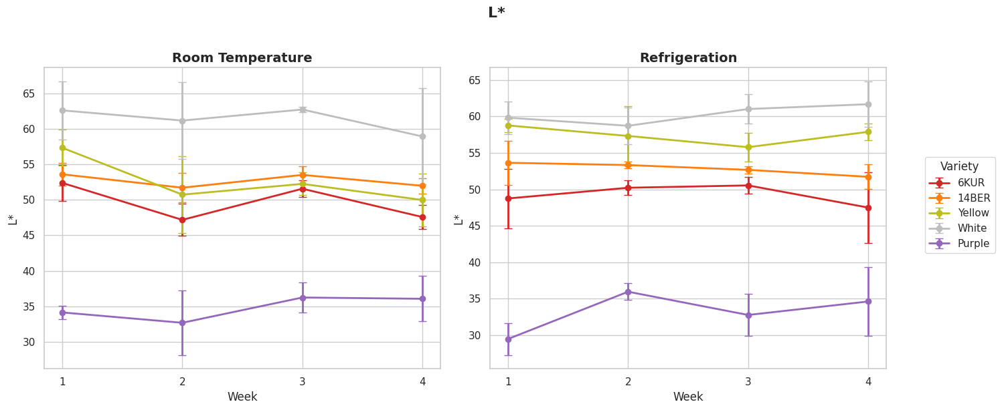

Guardado: figuras_art/L_star_lineplot.png


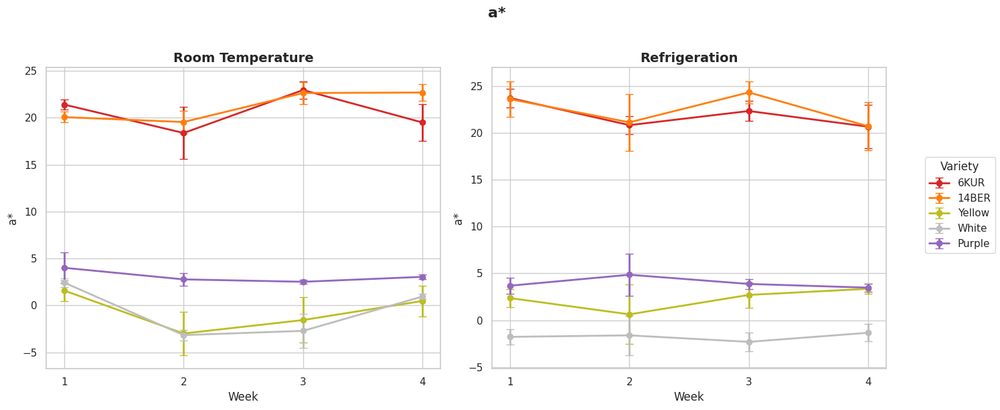

Guardado: figuras_art/a_star_lineplot.png


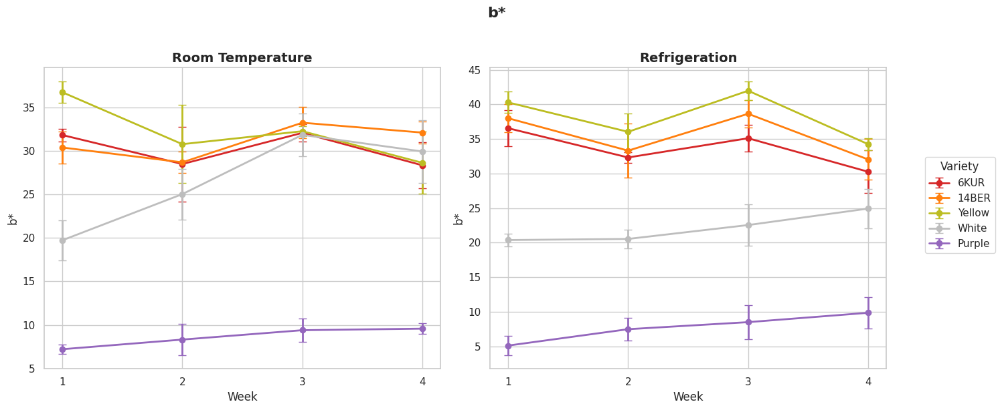

Guardado: figuras_art/b_star_lineplot.png


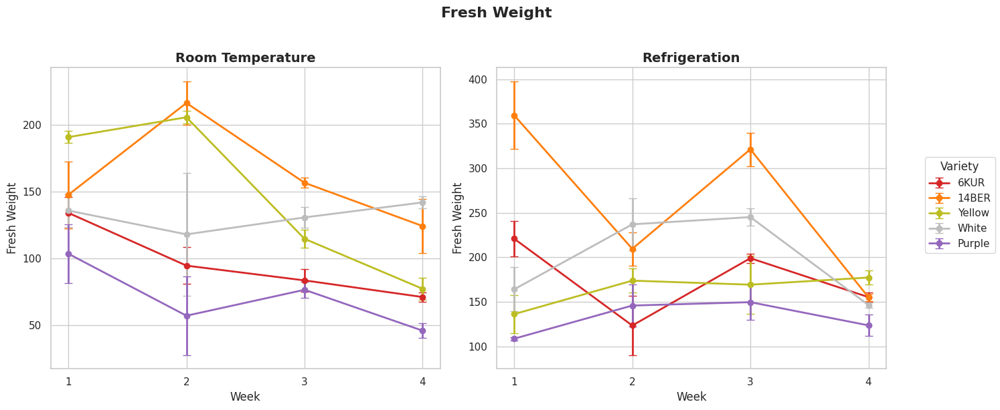

Guardado: figuras_art/Fresh_Weight_lineplot.png


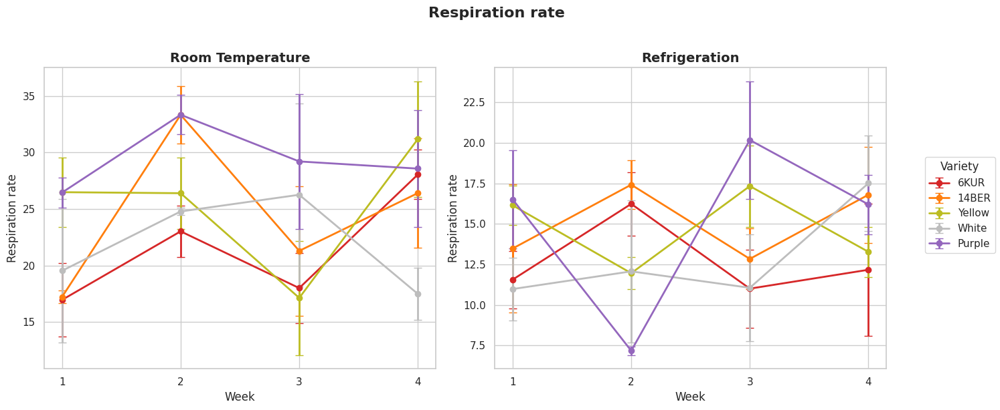

Guardado: figuras_art/Respiration_lineplot.png


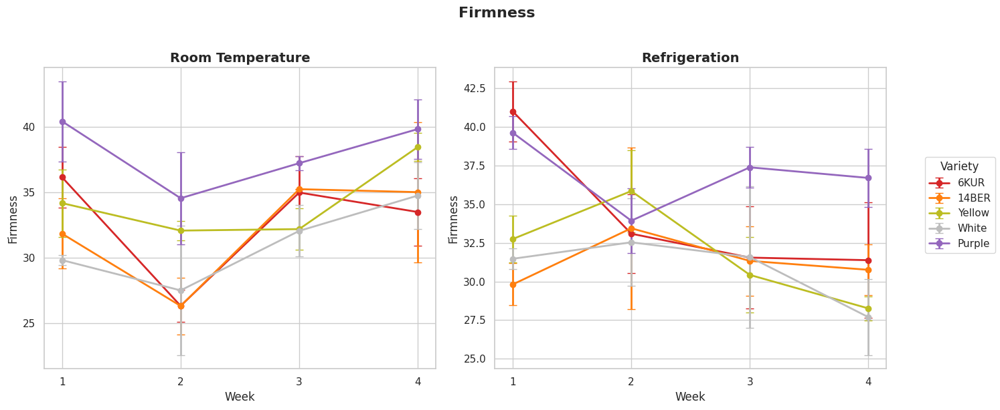

Guardado: figuras_art/Firmness_lineplot.png


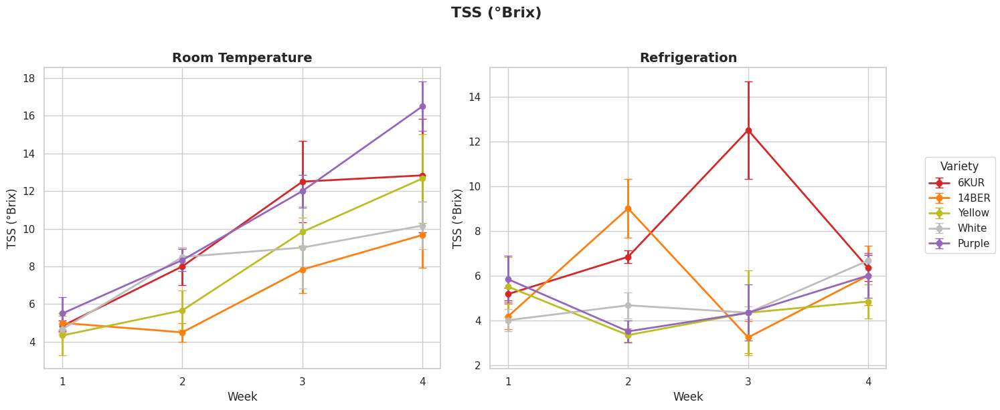

Guardado: figuras_art/TSS_lineplot.png


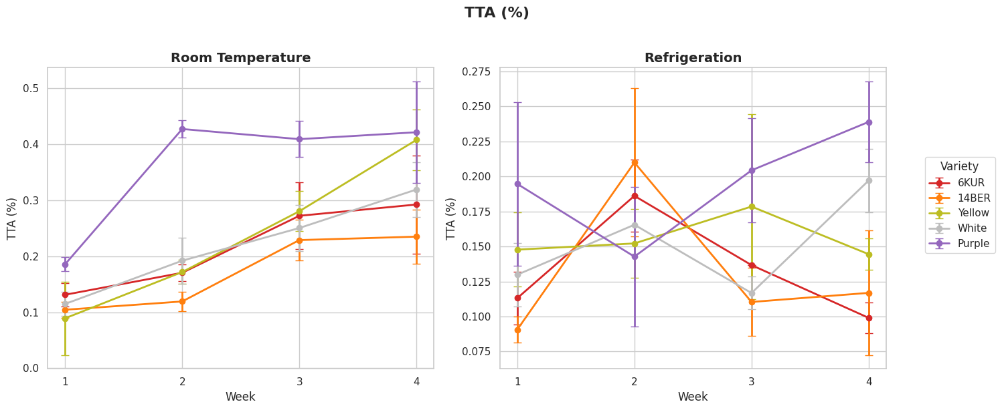

Guardado: figuras_art/TTA_lineplot.png


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

# =========================
# CONFIGURACIÓN
# =========================
sns.set_theme(style="whitegrid")
plt.rcParams["figure.figsize"] = (12, 7)
plt.rcParams["font.size"] = 12
plt.rcParams["axes.titlesize"] = 14
plt.rcParams["axes.titleweight"] = "bold"

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#bcbd22",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

# =========================
# CARGAR RESULTADOS
# =========================
file_path = "Resultados_ART_Zanahoria.xlsx"

data_used = pd.read_excel(file_path, sheet_name="Data_Used")
anova_results = pd.read_excel(file_path, sheet_name="ART_ANOVA")
posthoc_results = pd.read_excel(file_path, sheet_name="POSTHOC_BONFERRONI")

# Ordenar factores
week_order = ["1", "2", "3", "4"]
treatment_order = ["Room_Temperature", "Refrigeration"]
variety_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]

data_used["Week"] = data_used["Week"].astype(str)
data_used["Treatment"] = pd.Categorical(data_used["Treatment"], categories=treatment_order, ordered=True)
data_used["Variedad"] = pd.Categorical(data_used["Variedad"], categories=variety_order, ordered=True)

# Variables disponibles
response_vars = [
    'L_star', 'a_star', 'b_star',
    'Fresh_Weight', 'Respiration',
    'Firmness', 'TSS', 'TTA'
]
response_vars = [v for v in response_vars if v in data_used.columns]

# Etiquetas bonitas
pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "Respiration rate",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)",
    "TTA": "TTA (%)"
}

# Crear carpeta de salida
os.makedirs("figuras_art", exist_ok=True)

# =========================
# FUNCIÓN DE RESUMEN
# =========================
def summarize_data(df, variable):
    summary = (
        df.groupby(["Treatment", "Week", "Variedad"], observed=False)[variable]
        .agg(["mean", "std", "count"])
        .reset_index()
    )
    summary["se"] = summary["std"] / np.sqrt(summary["count"])
    return summary

# =========================
# FUNCIÓN PARA GRAFICAR
# =========================
def plot_variable(variable):
    if variable not in data_used.columns:
        print(f"Variable {variable} no encontrada")
        return

    df_var = data_used.dropna(subset=[variable]).copy()
    summary = summarize_data(df_var, variable)

    fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=False)

    for i, treatment in enumerate(treatment_order):
        ax = axes[i]
        sub = summary[summary["Treatment"] == treatment].copy()

        for var in variety_order:
            s = sub[sub["Variedad"] == var].copy()
            if s.empty:
                continue

            s = s.sort_values("Week")
            x = np.arange(len(s["Week"]))

            ax.errorbar(
                x=x,
                y=s["mean"],
                yerr=s["std"],
                marker="o",
                linewidth=2,
                capsize=4,
                label=var,
                color=palette.get(var, None)
            )

        ax.set_xticks(np.arange(len(week_order)))
        ax.set_xticklabels(week_order)
        ax.set_title(treatment.replace("_", " "))
        ax.set_xlabel("Week")
        ax.set_ylabel(pretty_labels.get(variable, variable))

    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, title="Variety", loc="center right")
    fig.suptitle(f"{pretty_labels.get(variable, variable)}", y=1.02, fontsize=16, fontweight="bold")
    plt.tight_layout(rect=[0, 0, 0.9, 1])

    out_path = f"figuras_art/{variable}_lineplot.png"
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"Guardado: {out_path}")

# =========================
# GRAFICAR TODAS
# =========================
for var in response_vars:
    plot_variable(var)

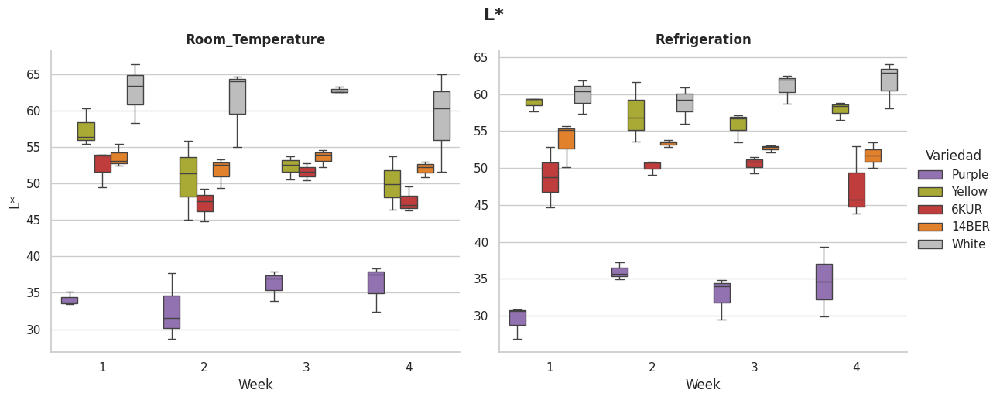

Guardado: figuras_boxplot/L_star_boxplot.png


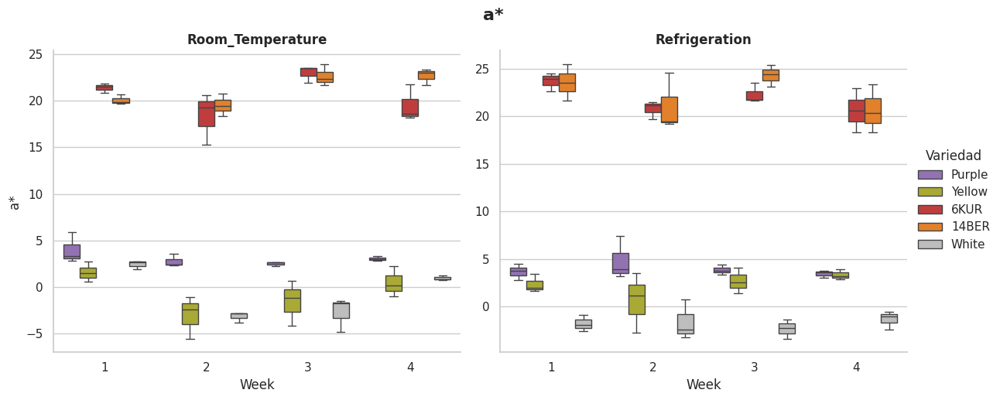

Guardado: figuras_boxplot/a_star_boxplot.png


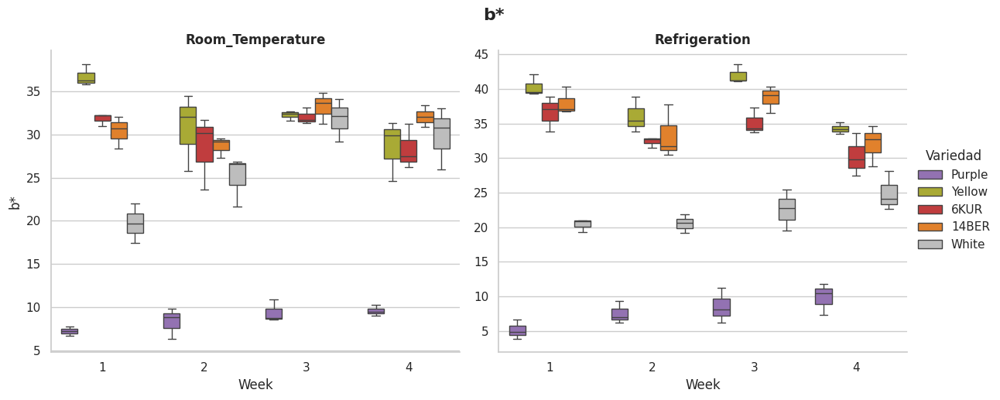

Guardado: figuras_boxplot/b_star_boxplot.png


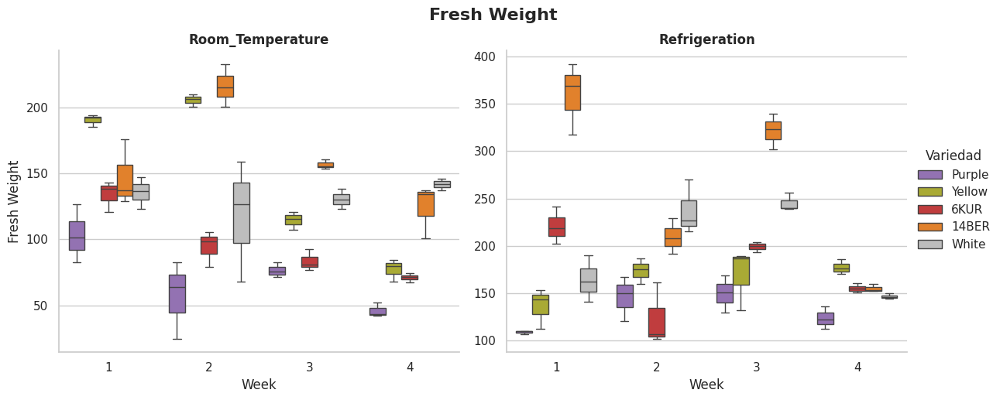

Guardado: figuras_boxplot/Fresh_Weight_boxplot.png


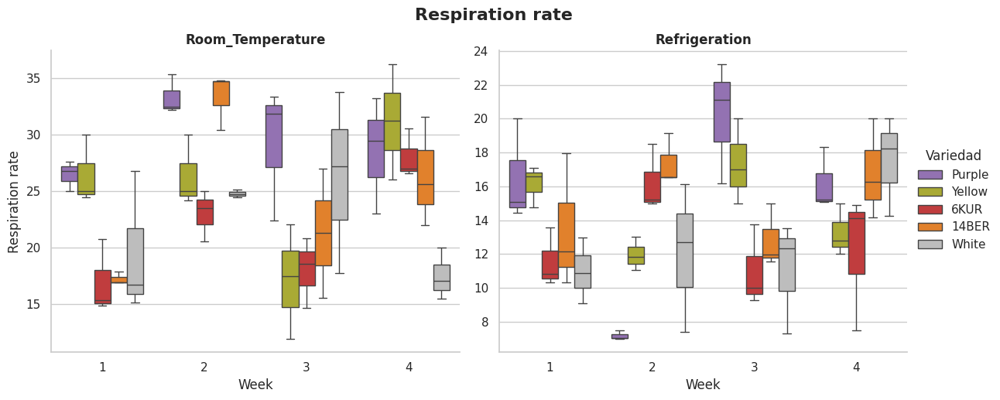

Guardado: figuras_boxplot/Respiration_boxplot.png


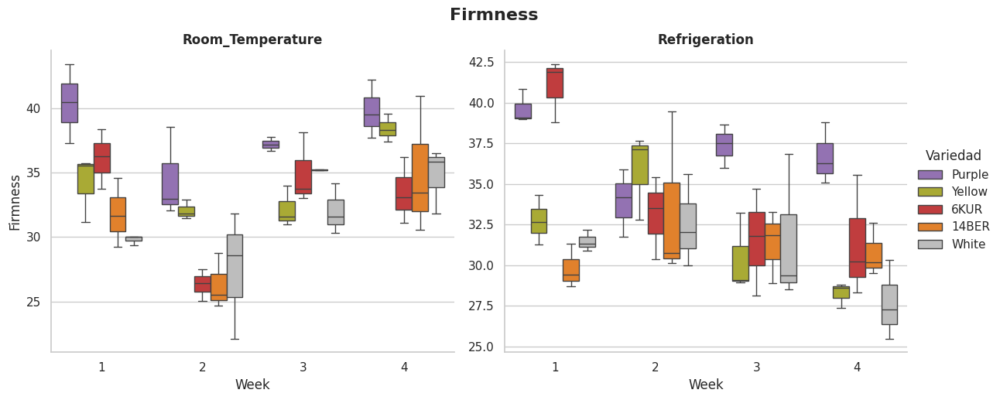

Guardado: figuras_boxplot/Firmness_boxplot.png


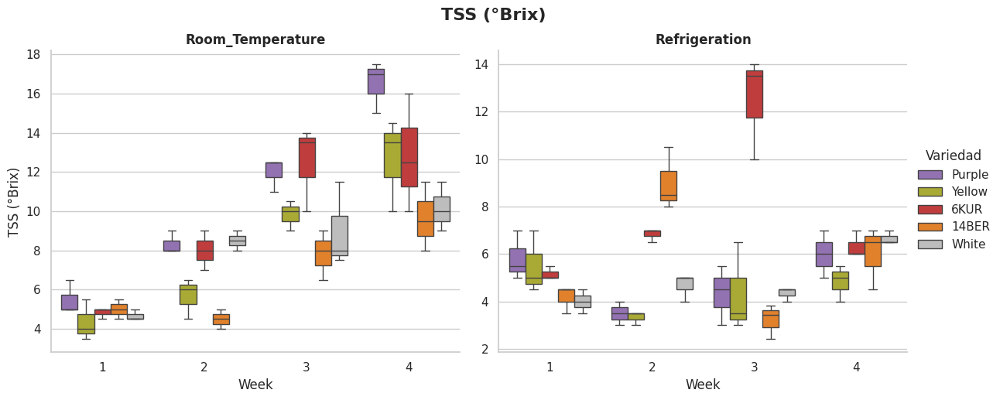

Guardado: figuras_boxplot/TSS_boxplot.png


In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

sns.set_theme(style="whitegrid")
plt.rcParams["figure.figsize"] = (14, 8)
plt.rcParams["font.size"] = 12

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#bcbd22",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

file_path = "Resultados_ART_Zanahoria.xlsx"
data_used = pd.read_excel(file_path, sheet_name="Data_Used")

data_used["Week"] = data_used["Week"].astype(str)

pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "Respiration rate",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)",
    "TTA": "TTA (%)"
}

response_vars = [
    'L_star', 'a_star', 'b_star',
    'Fresh_Weight', 'Respiration',
    'Firmness', 'TSS'
]

os.makedirs("figuras_boxplot", exist_ok=True)

for variable in response_vars:
    df = data_used.dropna(subset=[variable]).copy()

    g = sns.catplot(
        data=df,
        x="Week",
        y=variable,
        hue="Variedad",
        col="Treatment",
        kind="box",
        palette=palette,
        height=5,
        aspect=1.2,
        sharey=False
    )

    g.set_titles("{col_name}")
    g.set_axis_labels("Week", pretty_labels.get(variable, variable))
    g.fig.suptitle(pretty_labels.get(variable, variable), y=1.03, fontsize=16, fontweight="bold")

    out_path = f"figuras_boxplot/{variable}_boxplot.png"
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()
    print(f"Guardado: {out_path}")

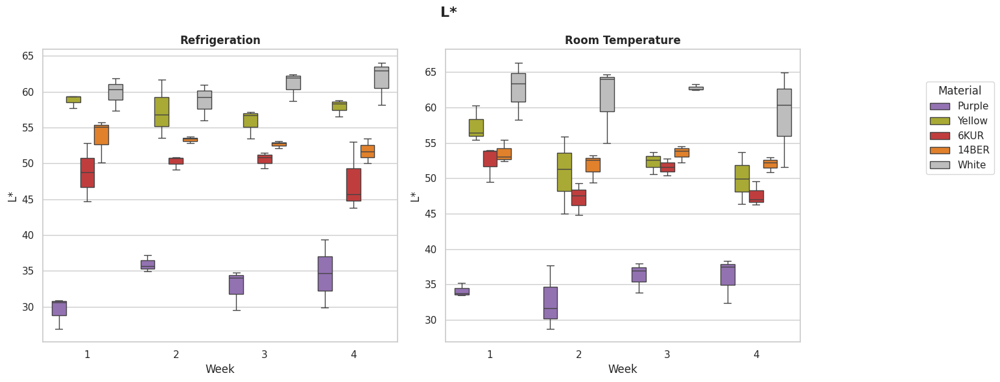

Guardado: figuras_boxplot/L_star_boxplot.png


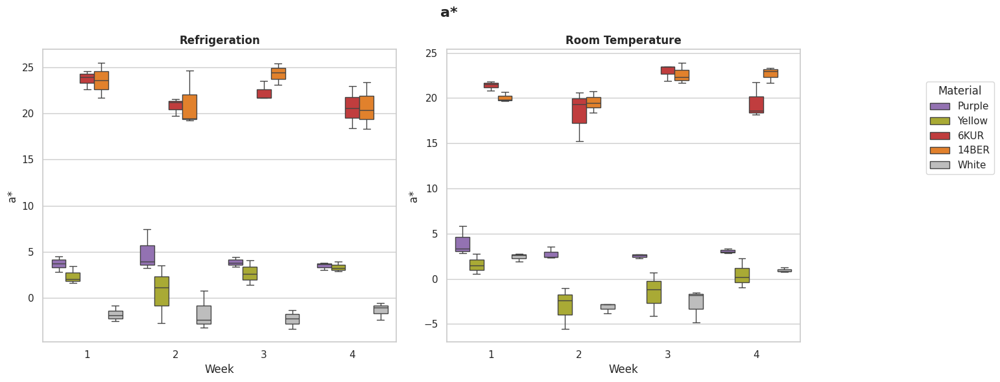

Guardado: figuras_boxplot/a_star_boxplot.png


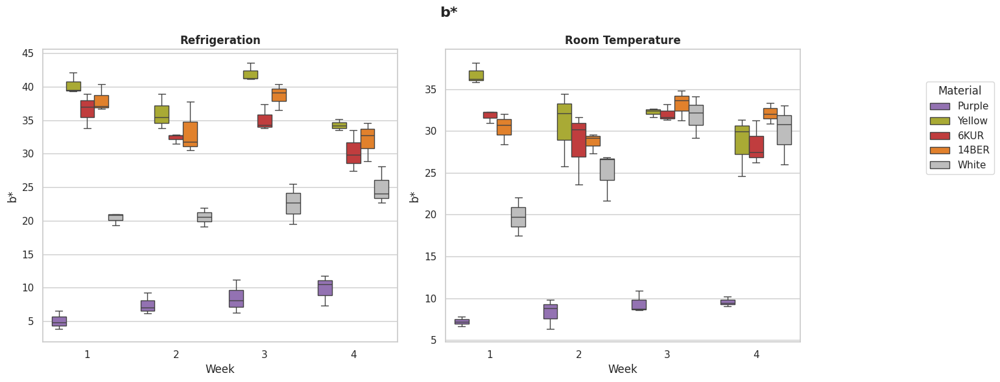

Guardado: figuras_boxplot/b_star_boxplot.png


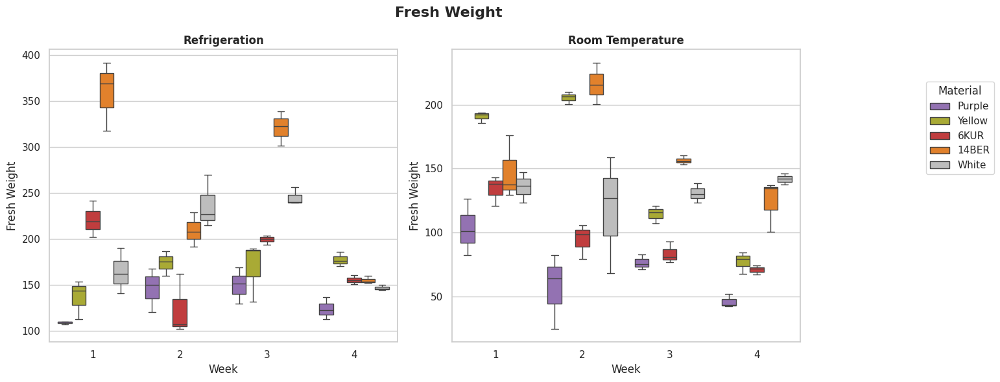

Guardado: figuras_boxplot/Fresh_Weight_boxplot.png


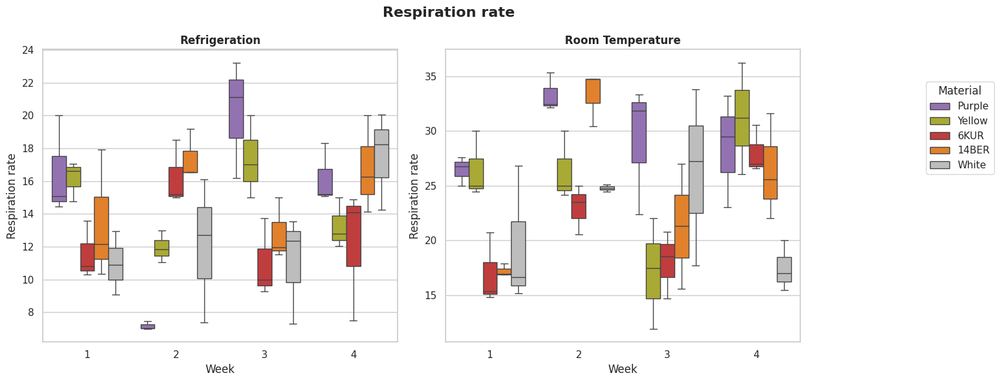

Guardado: figuras_boxplot/Respiration_boxplot.png


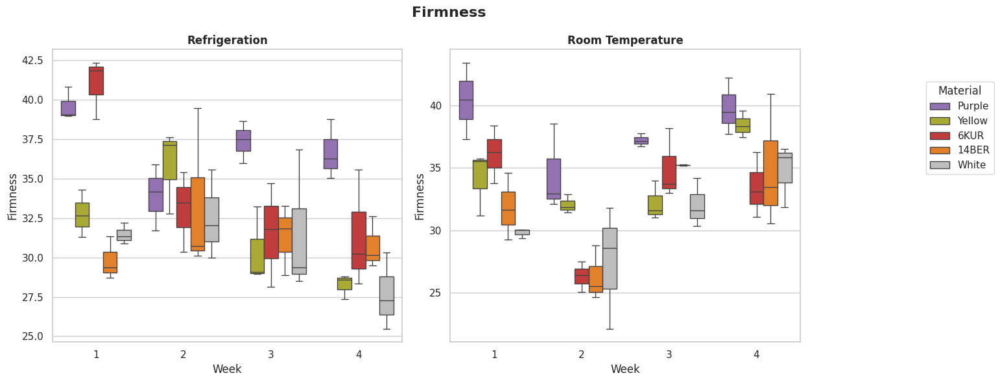

Guardado: figuras_boxplot/Firmness_boxplot.png


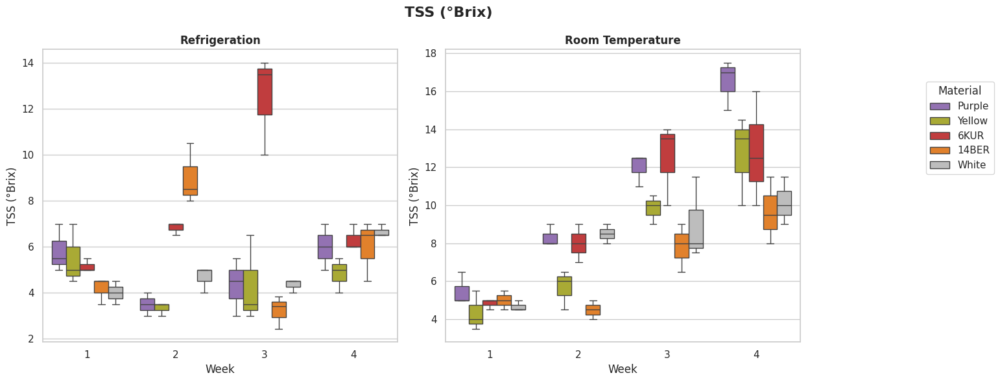

Guardado: figuras_boxplot/TSS_boxplot.png


In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

sns.set_theme(style="whitegrid")
plt.rcParams["figure.figsize"] = (14, 6)
plt.rcParams["font.size"] = 12

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#bcbd22",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

file_path = "Resultados_ART_Zanahoria.xlsx"
data_used = pd.read_excel(file_path, sheet_name="Data_Used")

data_used["Week"] = data_used["Week"].astype(str)

pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "Respiration rate",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)",
    "TTA": "TTA (%)"
}

response_vars = [
    'L_star', 'a_star', 'b_star',
    'Fresh_Weight', 'Respiration',
    'Firmness', 'TSS'
]

os.makedirs("figuras_boxplot", exist_ok=True)

for variable in response_vars:
    df = data_used.dropna(subset=[variable]).copy()

    # Crear figura con 2 paneles
    fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=False)

    treatments = df["Treatment"].unique()

    for i, treatment in enumerate(sorted(treatments)):
        sub = df[df["Treatment"] == treatment]

        sns.boxplot(
            data=sub,
            x="Week",
            y=variable,
            hue="Variedad",
            palette=palette,
            ax=axes[i]
        )

        axes[i].set_title(treatment.replace("_", " "))
        axes[i].set_xlabel("Week")
        axes[i].set_ylabel(pretty_labels.get(variable, variable))

        # 👇 quitar leyenda duplicada
        axes[i].legend_.remove()

    # 👇 leyenda única
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, title="Material",
               bbox_to_anchor=(1.02, 0.8), loc='upper left')

    fig.suptitle(pretty_labels.get(variable, variable),
                 fontsize=16, fontweight="bold")

    plt.tight_layout(rect=[0, 0, 0.9, 1])

    out_path = f"figuras_boxplot/{variable}_boxplot.png"
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()

    print(f"Guardado: {out_path}")

Procesando L_star...
OK: L_star
Procesando a_star...
OK: a_star
Procesando b_star...
OK: b_star
Procesando Fresh_Weight...
OK: Fresh_Weight
Procesando Respiration...
OK: Respiration
Procesando Firmness...
OK: Firmness
Procesando TSS...
OK: TSS
Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx
Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx

TABLA ART COMPLETA:
                    Effect    Df  Df.res     F_value       p_value  \
0                 Variedad   4.0    80.0  127.992723  6.066890e-34   
1                Treatment   1.0    80.0    0.412697  5.224408e-01   
2                     Week   3.0    80.0    1.744892  1.644861e-01   
3       Variedad:Treatment   4.0    80.0    4.847546  1.494594e-03   
4            Variedad:Week  12.0    80.0    1.670812  8.917519e-02   
5           Treatment:Week   3.0    80.0    3.782941  1.360106e-02   
6  Variedad:Treatment:Week  12.0    80.0    0.735282  7.130399e-01   

   partial_eta2 p_value_formatted    Size  
0      0.864858        <0.001 ***   

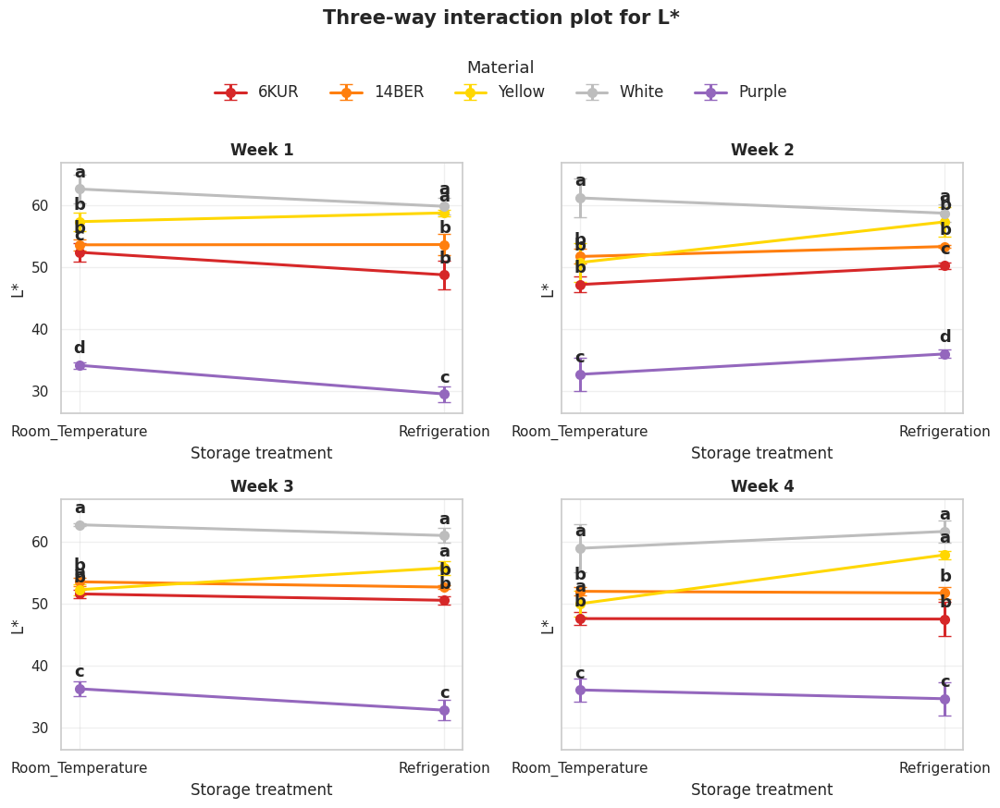

Figura guardada: Interaction_3way_L_star.png


In [9]:
# ============================================================
# CREAR RESULTADOS ART COMPLETOS + LETRAS + INTERACTION PLOT
# ============================================================

import os
import string
import itertools
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

# =========================
# CONFIGURACIÓN
# =========================
input_file = "Resultados_ART_Zanahoria.xlsx"
variable = "L_star"   # cambia a: a_star, b_star, Fresh_Weight, Respiration, Firmness, TSS

response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)"
}

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

week_order = ["1", "2", "3", "4"]
treatment_order = ["Room_Temperature", "Refrigeration"]
material_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]

# =========================
# CARGAR DATOS
# =========================
df = pd.read_excel(input_file, sheet_name="Data_Used")

df["Week"] = df["Week"].astype(str)
df["Treatment"] = df["Treatment"].astype(str)
df["Variedad"] = df["Variedad"].astype(str)
df["Repetición"] = df["Repetición"].astype(str)

# =========================
# RPY2: ART + EMMEANS FDR
# =========================
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r("""
options(repos = c(CRAN = "https://cloud.r-project.org"))

pkgs <- c("ARTool", "emmeans")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}

suppressPackageStartupMessages({
  library(ARTool)
  library(emmeans)
})
""")

def run_art_full(df_in, variable):
    df_in = df_in.dropna(subset=["Variedad", "Treatment", "Week", "Repetición", variable]).copy()

    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py"] = df_in

    r_code = f"""
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
    }})

    d <- df_py[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    d$Variedad <- factor(as.character(d$Variedad),
      levels = c("6KUR", "14BER", "Yellow", "White", "Purple"))

    d$Treatment <- factor(as.character(d$Treatment),
      levels = c("Room_Temperature", "Refrigeration"))

    d$Week <- factor(as.character(d$Week),
      levels = c("1", "2", "3", "4"))

    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    mod <- art(as.formula("{variable} ~ Variedad * Treatment * Week"), data = d)

    anova_df <- as.data.frame(anova(mod))
    anova_df$Effect <- rownames(anova_df)
    rownames(anova_df) <- NULL
    anova_df$Variable <- "{variable}"

    if (all(c("F value", "Df", "Df.res") %in% names(anova_df))) {{
      anova_df$partial_eta2 <- (anova_df[["F value"]] * anova_df[["Df"]]) /
                               ((anova_df[["F value"]] * anova_df[["Df"]]) + anova_df[["Df.res"]])
    }} else {{
      anova_df$partial_eta2 <- NA_real_
    }}

    fit <- artlm(mod, "Variedad")
    emm <- emmeans(fit, ~ Variedad | Treatment * Week)

    pairs_df <- as.data.frame(pairs(emm, adjust = "fdr"))
    pairs_df$Variable <- "{variable}"
    """

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_out = ro.conversion.rpy2py(ro.r("anova_df"))
        posthoc_out = ro.conversion.rpy2py(ro.r("pairs_df"))

    return anova_out, posthoc_out

# =========================
# CORRER ART PARA TODAS
# =========================
anova_list = []
posthoc_list = []

for var in response_vars:
    try:
        print(f"Procesando {var}...")
        a, p = run_art_full(df.copy(), var)
        anova_list.append(a)
        posthoc_list.append(p)
        print(f"OK: {var}")
    except Exception as e:
        print(f"Error en {var}: {e}")

anova_final = pd.concat(anova_list, ignore_index=True)
posthoc_final = pd.concat(posthoc_list, ignore_index=True)

anova_final = anova_final.rename(columns={
    "F value": "F_value",
    "Pr(>F)": "p_value"
})

posthoc_final = posthoc_final.rename(columns={
    "p.value": "p_value"
})

# =========================
# GUARDAR EXCEL COMPLETO
# =========================
with pd.ExcelWriter("RESULTADOS_ART_FDR_COMPLETO.xlsx", engine="openpyxl") as writer:
    df.to_excel(writer, sheet_name="Data_Used", index=False)
    anova_final.to_excel(writer, sheet_name="ANOVA_ART", index=False)
    posthoc_final.to_excel(writer, sheet_name="POSTHOC_FDR", index=False)

print("Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx")

# =========================
# GENERAR LETRAS
# =========================
def parse_contrast(txt):
    parts = [p.strip() for p in str(txt).split(" - ")]
    if len(parts) != 2:
        return None, None
    return parts[0], parts[1]

def make_letters(df_panel, posthoc_panel, alpha=0.05):
    groups = [g for g in material_order if g in df_panel["Variedad"].unique()]
    means = df_panel.groupby("Variedad")["Value"].mean()

    pvals = {}
    for _, row in posthoc_panel.iterrows():
        a, b = parse_contrast(row["contrast"])
        if a is not None:
            pvals[frozenset([a, b])] = row["p_value"]

    letters = {g: "" for g in groups}
    current_letter = "a"
    assigned = set()

    sorted_groups = means.reindex(groups).sort_values(ascending=False).index.tolist()

    for g in sorted_groups:
        if g in assigned:
            continue

        letters[g] += current_letter
        assigned.add(g)

        for h in sorted_groups:
            if h == g or h in assigned:
                continue

            p = pvals.get(frozenset([g, h]), np.nan)

            if pd.notna(p) and p >= alpha:
                letters[h] += current_letter
                assigned.add(h)

        current_letter = chr(ord(current_letter) + 1)

    return letters

plot_df = df.melt(
    id_vars=["Week", "Treatment", "Variedad", "Repetición"],
    value_vars=response_vars,
    var_name="Variable",
    value_name="Value"
).dropna()

letters_rows = []

for var in response_vars:
    for treatment in treatment_order:
        for week in week_order:
            df_panel = plot_df[
                (plot_df["Variable"] == var) &
                (plot_df["Treatment"] == treatment) &
                (plot_df["Week"] == week)
            ]

            ph_panel = posthoc_final[
                (posthoc_final["Variable"] == var) &
                (posthoc_final["Treatment"] == treatment) &
                (posthoc_final["Week"] == week)
            ]

            if df_panel.empty:
                continue

            letters_map = make_letters(df_panel, ph_panel)

            for mat, let in letters_map.items():
                letters_rows.append({
                    "Variable": var,
                    "Treatment": treatment,
                    "Week": week,
                    "Variedad": mat,
                    "Letters": let
                })

letters_df = pd.DataFrame(letters_rows)
letters_df.to_excel("LETRAS_ART_FDR_COMPLETO.xlsx", index=False)

print("Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx")

# =========================
# TABLA ANOVA COMPLETA VARIABLE
# =========================
anova_var = anova_final[anova_final["Variable"] == variable].copy()

def format_p(p):
    if p < 0.001:
        return "<0.001 ***"
    elif p < 0.01:
        return f"{p:.3f} **"
    elif p < 0.05:
        return f"{p:.3f} *"
    else:
        return f"{p:.3f}"

def effect_size(x):
    if x >= 0.14:
        return "Large"
    elif x >= 0.06:
        return "Medium"
    else:
        return "Small"

anova_table = anova_var[["Effect", "Df", "Df.res", "F_value", "p_value", "partial_eta2"]].copy()
anova_table["p_value_formatted"] = anova_table["p_value"].apply(format_p)
anova_table["Size"] = anova_table["partial_eta2"].apply(effect_size)

anova_table.to_excel(f"Tabla_ART_completa_{variable}.xlsx", index=False)

print("\nTABLA ART COMPLETA:")
print(anova_table)

# =========================
# GRÁFICA INTERACCIÓN 3 VÍAS
# =========================
sns.set_theme(style="whitegrid")

summary = (
    df.groupby(["Week", "Treatment", "Variedad"], observed=False)[variable]
    .agg(["mean", "std", "count"])
    .reset_index()
)

summary["se"] = summary["std"] / np.sqrt(summary["count"])

fig, axes = plt.subplots(2, 2, figsize=(11, 8), sharey=True)
axes = axes.flatten()

for i, week in enumerate(week_order):
    ax = axes[i]

    sub = summary[summary["Week"] == week].copy()

    for mat in material_order:
        sm = sub[sub["Variedad"] == mat].copy()

        if sm.empty:
            continue

        sm["Treatment"] = pd.Categorical(
            sm["Treatment"],
            categories=treatment_order,
            ordered=True
        )
        sm = sm.sort_values("Treatment")

        ax.errorbar(
            sm["Treatment"],
            sm["mean"],
            yerr=sm["se"],
            marker="o",
            linewidth=2.2,
            capsize=5,
            markersize=7,
            color=palette[mat],
            label=mat
        )

        # Letras
        let_sub = letters_df[
            (letters_df["Variable"] == variable) &
            (letters_df["Week"] == week) &
            (letters_df["Variedad"] == mat)
        ]

        for j, tr in enumerate(treatment_order):
            row = let_sub[let_sub["Treatment"] == tr]
            y_val = sm[sm["Treatment"] == tr]["mean"]

            if not row.empty and len(y_val) > 0:
                ax.text(
                    j,
                    y_val.iloc[0] + 1.3,
                    str(row.iloc[0]["Letters"]),
                    ha="center",
                    va="bottom",
                    fontsize=13,
                    fontweight="bold"
                )

    ax.set_title(f"Week {week}", fontweight="bold")
    ax.set_xlabel("Storage treatment")
    ax.set_ylabel(pretty_labels.get(variable, variable))
    ax.grid(True, alpha=0.3)

handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    title="Material",
    loc="upper center",
    bbox_to_anchor=(0.5, 1.04),
    ncol=5,
    fontsize=12,
    title_fontsize=13,
    frameon=False
)

fig.suptitle(
    f"Three-way interaction plot for {pretty_labels.get(variable, variable)}",
    fontsize=15,
    fontweight="bold",
    y=1.09
)

plt.tight_layout(rect=[0, 0, 1, 0.98])

out_path = f"Interaction_3way_{variable}.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Figura guardada: {out_path}")

Procesando L_star...
OK: L_star
Procesando a_star...
OK: a_star
Procesando b_star...
OK: b_star
Procesando Fresh_Weight...
OK: Fresh_Weight
Procesando Respiration...
OK: Respiration
Procesando Firmness...
OK: Firmness
Procesando TSS...
OK: TSS
Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx
Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx

TABLA ART COMPLETA:
                     Effect    Df  Df.res     F_value       p_value  \
7                  Variedad   4.0    80.0  153.082459  1.180091e-36   
8                 Treatment   1.0    80.0   13.972306  3.468557e-04   
9                      Week   3.0    80.0    8.470989  5.919112e-05   
10       Variedad:Treatment   4.0    80.0    5.846899  3.523412e-04   
11            Variedad:Week  12.0    80.0    3.555839  2.975568e-04   
12           Treatment:Week   3.0    80.0    2.499293  6.546049e-02   
13  Variedad:Treatment:Week  12.0    80.0    2.273194  1.538704e-02   

    partial_eta2 p_value_formatted    Size  
7       0.884448        <0.

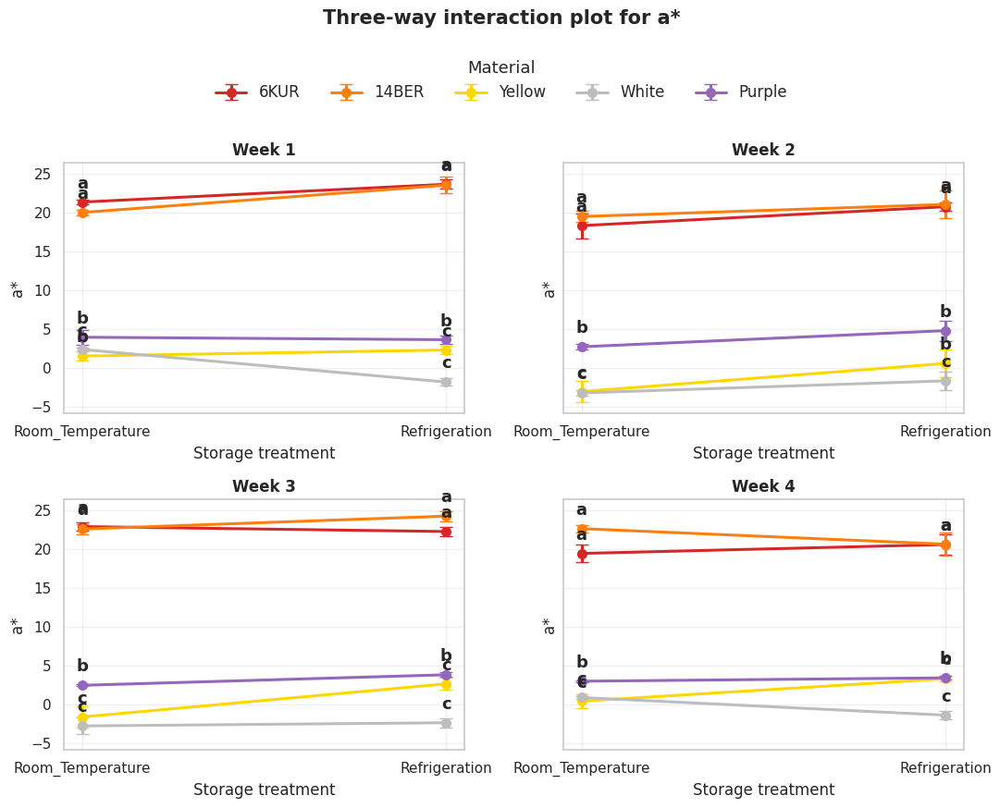

Figura guardada: Interaction_3way_a_star.png


In [10]:
# ============================================================
# CREAR RESULTADOS ART COMPLETOS + LETRAS + INTERACTION PLOT
# ============================================================

import os
import string
import itertools
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

# =========================
# CONFIGURACIÓN
# =========================
input_file = "Resultados_ART_Zanahoria.xlsx"
variable = "a_star"   # cambia a: a_star, b_star, Fresh_Weight, Respiration, Firmness, TSS

response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)"
}

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

week_order = ["1", "2", "3", "4"]
treatment_order = ["Room_Temperature", "Refrigeration"]
material_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]

# =========================
# CARGAR DATOS
# =========================
df = pd.read_excel(input_file, sheet_name="Data_Used")

df["Week"] = df["Week"].astype(str)
df["Treatment"] = df["Treatment"].astype(str)
df["Variedad"] = df["Variedad"].astype(str)
df["Repetición"] = df["Repetición"].astype(str)

# =========================
# RPY2: ART + EMMEANS FDR
# =========================
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r("""
options(repos = c(CRAN = "https://cloud.r-project.org"))

pkgs <- c("ARTool", "emmeans")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}

suppressPackageStartupMessages({
  library(ARTool)
  library(emmeans)
})
""")

def run_art_full(df_in, variable):
    df_in = df_in.dropna(subset=["Variedad", "Treatment", "Week", "Repetición", variable]).copy()

    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py"] = df_in

    r_code = f"""
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
    }})

    d <- df_py[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    d$Variedad <- factor(as.character(d$Variedad),
      levels = c("6KUR", "14BER", "Yellow", "White", "Purple"))

    d$Treatment <- factor(as.character(d$Treatment),
      levels = c("Room_Temperature", "Refrigeration"))

    d$Week <- factor(as.character(d$Week),
      levels = c("1", "2", "3", "4"))

    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    mod <- art(as.formula("{variable} ~ Variedad * Treatment * Week"), data = d)

    anova_df <- as.data.frame(anova(mod))
    anova_df$Effect <- rownames(anova_df)
    rownames(anova_df) <- NULL
    anova_df$Variable <- "{variable}"

    if (all(c("F value", "Df", "Df.res") %in% names(anova_df))) {{
      anova_df$partial_eta2 <- (anova_df[["F value"]] * anova_df[["Df"]]) /
                               ((anova_df[["F value"]] * anova_df[["Df"]]) + anova_df[["Df.res"]])
    }} else {{
      anova_df$partial_eta2 <- NA_real_
    }}

    fit <- artlm(mod, "Variedad")
    emm <- emmeans(fit, ~ Variedad | Treatment * Week)

    pairs_df <- as.data.frame(pairs(emm, adjust = "fdr"))
    pairs_df$Variable <- "{variable}"
    """

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_out = ro.conversion.rpy2py(ro.r("anova_df"))
        posthoc_out = ro.conversion.rpy2py(ro.r("pairs_df"))

    return anova_out, posthoc_out

# =========================
# CORRER ART PARA TODAS
# =========================
anova_list = []
posthoc_list = []

for var in response_vars:
    try:
        print(f"Procesando {var}...")
        a, p = run_art_full(df.copy(), var)
        anova_list.append(a)
        posthoc_list.append(p)
        print(f"OK: {var}")
    except Exception as e:
        print(f"Error en {var}: {e}")

anova_final = pd.concat(anova_list, ignore_index=True)
posthoc_final = pd.concat(posthoc_list, ignore_index=True)

anova_final = anova_final.rename(columns={
    "F value": "F_value",
    "Pr(>F)": "p_value"
})

posthoc_final = posthoc_final.rename(columns={
    "p.value": "p_value"
})

# =========================
# GUARDAR EXCEL COMPLETO
# =========================
with pd.ExcelWriter("RESULTADOS_ART_FDR_COMPLETO.xlsx", engine="openpyxl") as writer:
    df.to_excel(writer, sheet_name="Data_Used", index=False)
    anova_final.to_excel(writer, sheet_name="ANOVA_ART", index=False)
    posthoc_final.to_excel(writer, sheet_name="POSTHOC_FDR", index=False)

print("Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx")

# =========================
# GENERAR LETRAS
# =========================
def parse_contrast(txt):
    parts = [p.strip() for p in str(txt).split(" - ")]
    if len(parts) != 2:
        return None, None
    return parts[0], parts[1]

def make_letters(df_panel, posthoc_panel, alpha=0.05):
    groups = [g for g in material_order if g in df_panel["Variedad"].unique()]
    means = df_panel.groupby("Variedad")["Value"].mean()

    pvals = {}
    for _, row in posthoc_panel.iterrows():
        a, b = parse_contrast(row["contrast"])
        if a is not None:
            pvals[frozenset([a, b])] = row["p_value"]

    letters = {g: "" for g in groups}
    current_letter = "a"
    assigned = set()

    sorted_groups = means.reindex(groups).sort_values(ascending=False).index.tolist()

    for g in sorted_groups:
        if g in assigned:
            continue

        letters[g] += current_letter
        assigned.add(g)

        for h in sorted_groups:
            if h == g or h in assigned:
                continue

            p = pvals.get(frozenset([g, h]), np.nan)

            if pd.notna(p) and p >= alpha:
                letters[h] += current_letter
                assigned.add(h)

        current_letter = chr(ord(current_letter) + 1)

    return letters

plot_df = df.melt(
    id_vars=["Week", "Treatment", "Variedad", "Repetición"],
    value_vars=response_vars,
    var_name="Variable",
    value_name="Value"
).dropna()

letters_rows = []

for var in response_vars:
    for treatment in treatment_order:
        for week in week_order:
            df_panel = plot_df[
                (plot_df["Variable"] == var) &
                (plot_df["Treatment"] == treatment) &
                (plot_df["Week"] == week)
            ]

            ph_panel = posthoc_final[
                (posthoc_final["Variable"] == var) &
                (posthoc_final["Treatment"] == treatment) &
                (posthoc_final["Week"] == week)
            ]

            if df_panel.empty:
                continue

            letters_map = make_letters(df_panel, ph_panel)

            for mat, let in letters_map.items():
                letters_rows.append({
                    "Variable": var,
                    "Treatment": treatment,
                    "Week": week,
                    "Variedad": mat,
                    "Letters": let
                })

letters_df = pd.DataFrame(letters_rows)
letters_df.to_excel("LETRAS_ART_FDR_COMPLETO.xlsx", index=False)

print("Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx")

# =========================
# TABLA ANOVA COMPLETA VARIABLE
# =========================
anova_var = anova_final[anova_final["Variable"] == variable].copy()

def format_p(p):
    if p < 0.001:
        return "<0.001 ***"
    elif p < 0.01:
        return f"{p:.3f} **"
    elif p < 0.05:
        return f"{p:.3f} *"
    else:
        return f"{p:.3f}"

def effect_size(x):
    if x >= 0.14:
        return "Large"
    elif x >= 0.06:
        return "Medium"
    else:
        return "Small"

anova_table = anova_var[["Effect", "Df", "Df.res", "F_value", "p_value", "partial_eta2"]].copy()
anova_table["p_value_formatted"] = anova_table["p_value"].apply(format_p)
anova_table["Size"] = anova_table["partial_eta2"].apply(effect_size)

anova_table.to_excel(f"Tabla_ART_completa_{variable}.xlsx", index=False)

print("\nTABLA ART COMPLETA:")
print(anova_table)

# =========================
# GRÁFICA INTERACCIÓN 3 VÍAS
# =========================
sns.set_theme(style="whitegrid")

summary = (
    df.groupby(["Week", "Treatment", "Variedad"], observed=False)[variable]
    .agg(["mean", "std", "count"])
    .reset_index()
)

summary["se"] = summary["std"] / np.sqrt(summary["count"])

fig, axes = plt.subplots(2, 2, figsize=(11, 8), sharey=True)
axes = axes.flatten()

for i, week in enumerate(week_order):
    ax = axes[i]

    sub = summary[summary["Week"] == week].copy()

    for mat in material_order:
        sm = sub[sub["Variedad"] == mat].copy()

        if sm.empty:
            continue

        sm["Treatment"] = pd.Categorical(
            sm["Treatment"],
            categories=treatment_order,
            ordered=True
        )
        sm = sm.sort_values("Treatment")

        ax.errorbar(
            sm["Treatment"],
            sm["mean"],
            yerr=sm["se"],
            marker="o",
            linewidth=2.2,
            capsize=5,
            markersize=7,
            color=palette[mat],
            label=mat
        )

        # Letras
        let_sub = letters_df[
            (letters_df["Variable"] == variable) &
            (letters_df["Week"] == week) &
            (letters_df["Variedad"] == mat)
        ]

        for j, tr in enumerate(treatment_order):
            row = let_sub[let_sub["Treatment"] == tr]
            y_val = sm[sm["Treatment"] == tr]["mean"]

            if not row.empty and len(y_val) > 0:
                ax.text(
                    j,
                    y_val.iloc[0] + 1.3,
                    str(row.iloc[0]["Letters"]),
                    ha="center",
                    va="bottom",
                    fontsize=13,
                    fontweight="bold"
                )

    ax.set_title(f"Week {week}", fontweight="bold")
    ax.set_xlabel("Storage treatment")
    ax.set_ylabel(pretty_labels.get(variable, variable))
    ax.grid(True, alpha=0.3)

handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    title="Material",
    loc="upper center",
    bbox_to_anchor=(0.5, 1.04),
    ncol=5,
    fontsize=12,
    title_fontsize=13,
    frameon=False
)

fig.suptitle(
    f"Three-way interaction plot for {pretty_labels.get(variable, variable)}",
    fontsize=15,
    fontweight="bold",
    y=1.09
)

plt.tight_layout(rect=[0, 0, 1, 0.98])

out_path = f"Interaction_3way_{variable}.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Figura guardada: {out_path}")

Procesando L_star...
OK: L_star
Procesando a_star...
OK: a_star
Procesando b_star...
OK: b_star
Procesando Fresh_Weight...
OK: Fresh_Weight
Procesando Respiration...
OK: Respiration
Procesando Firmness...
OK: Firmness
Procesando TSS...
OK: TSS
Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx
Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx

TABLA ART COMPLETA:
                     Effect    Df  Df.res     F_value       p_value  \
14                 Variedad   4.0    80.0  104.259056  6.407294e-31   
15                Treatment   1.0    80.0   14.548652  2.675504e-04   
16                     Week   3.0    80.0   11.887788  1.618961e-06   
17       Variedad:Treatment   4.0    80.0   23.249322  9.000368e-13   
18            Variedad:Week  12.0    80.0    6.990335  1.686515e-08   
19           Treatment:Week   3.0    80.0    1.578144  2.011452e-01   
20  Variedad:Treatment:Week  12.0    80.0    2.454817  8.859248e-03   

    partial_eta2 p_value_formatted   Size  
14      0.839046        <0.0

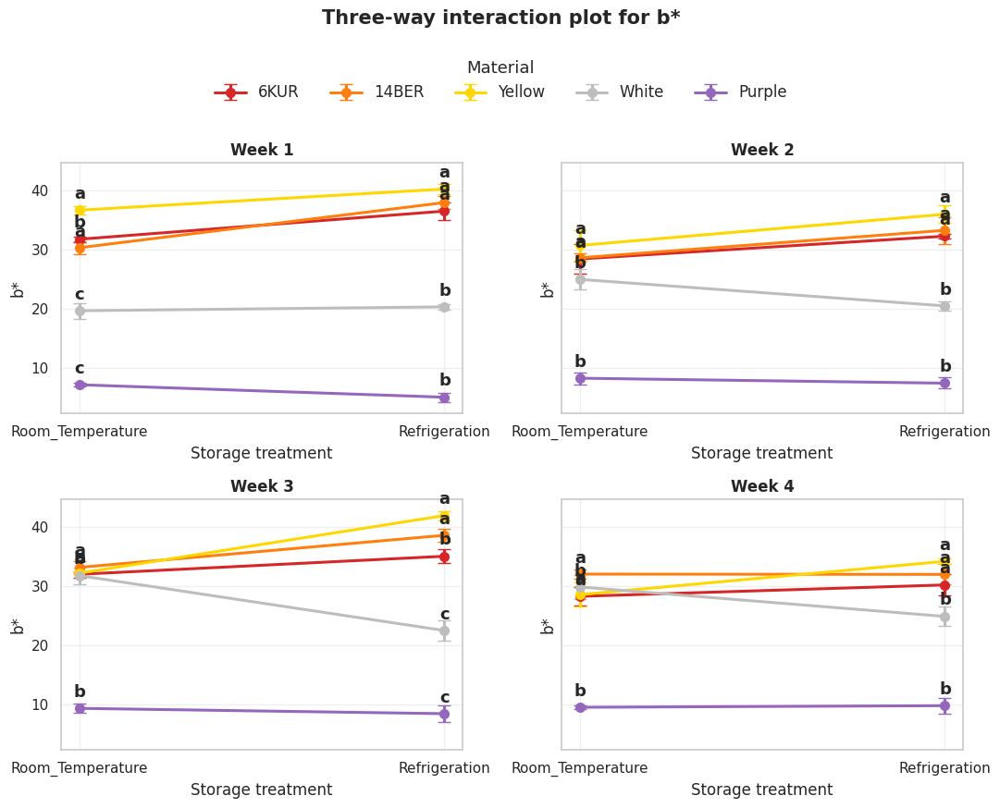

Figura guardada: Interaction_3way_b_star.png


In [11]:
# ============================================================
# CREAR RESULTADOS ART COMPLETOS + LETRAS + INTERACTION PLOT
# ============================================================

import os
import string
import itertools
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

# =========================
# CONFIGURACIÓN
# =========================
input_file = "Resultados_ART_Zanahoria.xlsx"
variable = "b_star"   # cambia a: a_star, b_star, Fresh_Weight, Respiration, Firmness, TSS

response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)"
}

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

week_order = ["1", "2", "3", "4"]
treatment_order = ["Room_Temperature", "Refrigeration"]
material_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]

# =========================
# CARGAR DATOS
# =========================
df = pd.read_excel(input_file, sheet_name="Data_Used")

df["Week"] = df["Week"].astype(str)
df["Treatment"] = df["Treatment"].astype(str)
df["Variedad"] = df["Variedad"].astype(str)
df["Repetición"] = df["Repetición"].astype(str)

# =========================
# RPY2: ART + EMMEANS FDR
# =========================
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r("""
options(repos = c(CRAN = "https://cloud.r-project.org"))

pkgs <- c("ARTool", "emmeans")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}

suppressPackageStartupMessages({
  library(ARTool)
  library(emmeans)
})
""")

def run_art_full(df_in, variable):
    df_in = df_in.dropna(subset=["Variedad", "Treatment", "Week", "Repetición", variable]).copy()

    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py"] = df_in

    r_code = f"""
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
    }})

    d <- df_py[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    d$Variedad <- factor(as.character(d$Variedad),
      levels = c("6KUR", "14BER", "Yellow", "White", "Purple"))

    d$Treatment <- factor(as.character(d$Treatment),
      levels = c("Room_Temperature", "Refrigeration"))

    d$Week <- factor(as.character(d$Week),
      levels = c("1", "2", "3", "4"))

    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    mod <- art(as.formula("{variable} ~ Variedad * Treatment * Week"), data = d)

    anova_df <- as.data.frame(anova(mod))
    anova_df$Effect <- rownames(anova_df)
    rownames(anova_df) <- NULL
    anova_df$Variable <- "{variable}"

    if (all(c("F value", "Df", "Df.res") %in% names(anova_df))) {{
      anova_df$partial_eta2 <- (anova_df[["F value"]] * anova_df[["Df"]]) /
                               ((anova_df[["F value"]] * anova_df[["Df"]]) + anova_df[["Df.res"]])
    }} else {{
      anova_df$partial_eta2 <- NA_real_
    }}

    fit <- artlm(mod, "Variedad")
    emm <- emmeans(fit, ~ Variedad | Treatment * Week)

    pairs_df <- as.data.frame(pairs(emm, adjust = "fdr"))
    pairs_df$Variable <- "{variable}"
    """

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_out = ro.conversion.rpy2py(ro.r("anova_df"))
        posthoc_out = ro.conversion.rpy2py(ro.r("pairs_df"))

    return anova_out, posthoc_out

# =========================
# CORRER ART PARA TODAS
# =========================
anova_list = []
posthoc_list = []

for var in response_vars:
    try:
        print(f"Procesando {var}...")
        a, p = run_art_full(df.copy(), var)
        anova_list.append(a)
        posthoc_list.append(p)
        print(f"OK: {var}")
    except Exception as e:
        print(f"Error en {var}: {e}")

anova_final = pd.concat(anova_list, ignore_index=True)
posthoc_final = pd.concat(posthoc_list, ignore_index=True)

anova_final = anova_final.rename(columns={
    "F value": "F_value",
    "Pr(>F)": "p_value"
})

posthoc_final = posthoc_final.rename(columns={
    "p.value": "p_value"
})

# =========================
# GUARDAR EXCEL COMPLETO
# =========================
with pd.ExcelWriter("RESULTADOS_ART_FDR_COMPLETO.xlsx", engine="openpyxl") as writer:
    df.to_excel(writer, sheet_name="Data_Used", index=False)
    anova_final.to_excel(writer, sheet_name="ANOVA_ART", index=False)
    posthoc_final.to_excel(writer, sheet_name="POSTHOC_FDR", index=False)

print("Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx")

# =========================
# GENERAR LETRAS
# =========================
def parse_contrast(txt):
    parts = [p.strip() for p in str(txt).split(" - ")]
    if len(parts) != 2:
        return None, None
    return parts[0], parts[1]

def make_letters(df_panel, posthoc_panel, alpha=0.05):
    groups = [g for g in material_order if g in df_panel["Variedad"].unique()]
    means = df_panel.groupby("Variedad")["Value"].mean()

    pvals = {}
    for _, row in posthoc_panel.iterrows():
        a, b = parse_contrast(row["contrast"])
        if a is not None:
            pvals[frozenset([a, b])] = row["p_value"]

    letters = {g: "" for g in groups}
    current_letter = "a"
    assigned = set()

    sorted_groups = means.reindex(groups).sort_values(ascending=False).index.tolist()

    for g in sorted_groups:
        if g in assigned:
            continue

        letters[g] += current_letter
        assigned.add(g)

        for h in sorted_groups:
            if h == g or h in assigned:
                continue

            p = pvals.get(frozenset([g, h]), np.nan)

            if pd.notna(p) and p >= alpha:
                letters[h] += current_letter
                assigned.add(h)

        current_letter = chr(ord(current_letter) + 1)

    return letters

plot_df = df.melt(
    id_vars=["Week", "Treatment", "Variedad", "Repetición"],
    value_vars=response_vars,
    var_name="Variable",
    value_name="Value"
).dropna()

letters_rows = []

for var in response_vars:
    for treatment in treatment_order:
        for week in week_order:
            df_panel = plot_df[
                (plot_df["Variable"] == var) &
                (plot_df["Treatment"] == treatment) &
                (plot_df["Week"] == week)
            ]

            ph_panel = posthoc_final[
                (posthoc_final["Variable"] == var) &
                (posthoc_final["Treatment"] == treatment) &
                (posthoc_final["Week"] == week)
            ]

            if df_panel.empty:
                continue

            letters_map = make_letters(df_panel, ph_panel)

            for mat, let in letters_map.items():
                letters_rows.append({
                    "Variable": var,
                    "Treatment": treatment,
                    "Week": week,
                    "Variedad": mat,
                    "Letters": let
                })

letters_df = pd.DataFrame(letters_rows)
letters_df.to_excel("LETRAS_ART_FDR_COMPLETO.xlsx", index=False)

print("Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx")

# =========================
# TABLA ANOVA COMPLETA VARIABLE
# =========================
anova_var = anova_final[anova_final["Variable"] == variable].copy()

def format_p(p):
    if p < 0.001:
        return "<0.001 ***"
    elif p < 0.01:
        return f"{p:.3f} **"
    elif p < 0.05:
        return f"{p:.3f} *"
    else:
        return f"{p:.3f}"

def effect_size(x):
    if x >= 0.14:
        return "Large"
    elif x >= 0.06:
        return "Medium"
    else:
        return "Small"

anova_table = anova_var[["Effect", "Df", "Df.res", "F_value", "p_value", "partial_eta2"]].copy()
anova_table["p_value_formatted"] = anova_table["p_value"].apply(format_p)
anova_table["Size"] = anova_table["partial_eta2"].apply(effect_size)

anova_table.to_excel(f"Tabla_ART_completa_{variable}.xlsx", index=False)

print("\nTABLA ART COMPLETA:")
print(anova_table)

# =========================
# GRÁFICA INTERACCIÓN 3 VÍAS
# =========================
sns.set_theme(style="whitegrid")

summary = (
    df.groupby(["Week", "Treatment", "Variedad"], observed=False)[variable]
    .agg(["mean", "std", "count"])
    .reset_index()
)

summary["se"] = summary["std"] / np.sqrt(summary["count"])

fig, axes = plt.subplots(2, 2, figsize=(11, 8), sharey=True)
axes = axes.flatten()

for i, week in enumerate(week_order):
    ax = axes[i]

    sub = summary[summary["Week"] == week].copy()

    for mat in material_order:
        sm = sub[sub["Variedad"] == mat].copy()

        if sm.empty:
            continue

        sm["Treatment"] = pd.Categorical(
            sm["Treatment"],
            categories=treatment_order,
            ordered=True
        )
        sm = sm.sort_values("Treatment")

        ax.errorbar(
            sm["Treatment"],
            sm["mean"],
            yerr=sm["se"],
            marker="o",
            linewidth=2.2,
            capsize=5,
            markersize=7,
            color=palette[mat],
            label=mat
        )

        # Letras
        let_sub = letters_df[
            (letters_df["Variable"] == variable) &
            (letters_df["Week"] == week) &
            (letters_df["Variedad"] == mat)
        ]

        for j, tr in enumerate(treatment_order):
            row = let_sub[let_sub["Treatment"] == tr]
            y_val = sm[sm["Treatment"] == tr]["mean"]

            if not row.empty and len(y_val) > 0:
                ax.text(
                    j,
                    y_val.iloc[0] + 1.3,
                    str(row.iloc[0]["Letters"]),
                    ha="center",
                    va="bottom",
                    fontsize=13,
                    fontweight="bold"
                )

    ax.set_title(f"Week {week}", fontweight="bold")
    ax.set_xlabel("Storage treatment")
    ax.set_ylabel(pretty_labels.get(variable, variable))
    ax.grid(True, alpha=0.3)

handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    title="Material",
    loc="upper center",
    bbox_to_anchor=(0.5, 1.04),
    ncol=5,
    fontsize=12,
    title_fontsize=13,
    frameon=False
)

fig.suptitle(
    f"Three-way interaction plot for {pretty_labels.get(variable, variable)}",
    fontsize=15,
    fontweight="bold",
    y=1.09
)

plt.tight_layout(rect=[0, 0, 1, 0.98])

out_path = f"Interaction_3way_{variable}.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Figura guardada: {out_path}")

Procesando L_star...
OK: L_star
Procesando a_star...
OK: a_star
Procesando b_star...
OK: b_star
Procesando Fresh_Weight...
OK: Fresh_Weight
Procesando Respiration...
OK: Respiration
Procesando Firmness...
OK: Firmness
Procesando TSS...
OK: TSS
Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx
Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx

TABLA ART COMPLETA:
                     Effect    Df  Df.res     F_value       p_value  \
21                 Variedad   4.0    80.0  109.000959  1.442257e-31   
22                Treatment   1.0    80.0  238.229608  1.057122e-25   
23                     Week   3.0    80.0   33.842801  3.171583e-14   
24       Variedad:Treatment   4.0    80.0   18.620172  7.513042e-11   
25            Variedad:Week  12.0    80.0   11.783907  2.883238e-13   
26           Treatment:Week   3.0    80.0   18.510016  3.261265e-09   
27  Variedad:Treatment:Week  12.0    80.0   22.433124  8.682404e-21   

    partial_eta2 p_value_formatted   Size  
21      0.844962        <0.0

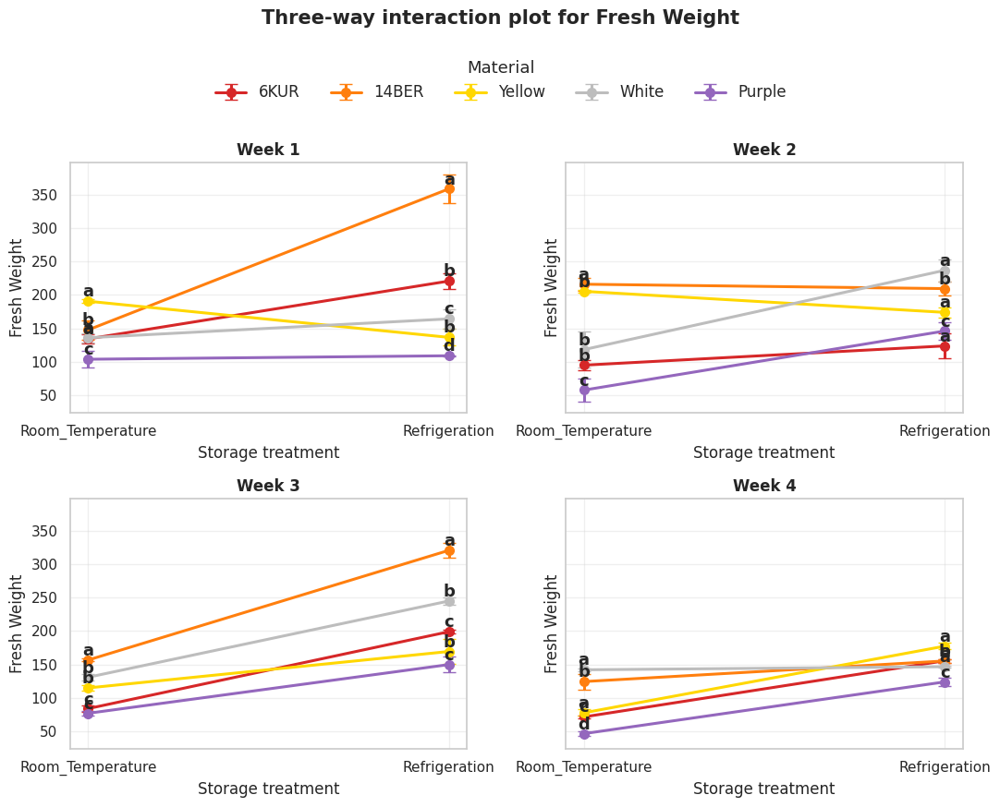

Figura guardada: Interaction_3way_Fresh_Weight.png


In [12]:
# ============================================================
# CREAR RESULTADOS ART COMPLETOS + LETRAS + INTERACTION PLOT
# ============================================================

import os
import string
import itertools
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

# =========================
# CONFIGURACIÓN
# =========================
input_file = "Resultados_ART_Zanahoria.xlsx"
variable = "Fresh_Weight"   # cambia a: a_star, b_star, Fresh_Weight, Respiration, Firmness, TSS

response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)"
}

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

week_order = ["1", "2", "3", "4"]
treatment_order = ["Room_Temperature", "Refrigeration"]
material_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]

# =========================
# CARGAR DATOS
# =========================
df = pd.read_excel(input_file, sheet_name="Data_Used")

df["Week"] = df["Week"].astype(str)
df["Treatment"] = df["Treatment"].astype(str)
df["Variedad"] = df["Variedad"].astype(str)
df["Repetición"] = df["Repetición"].astype(str)

# =========================
# RPY2: ART + EMMEANS FDR
# =========================
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r("""
options(repos = c(CRAN = "https://cloud.r-project.org"))

pkgs <- c("ARTool", "emmeans")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}

suppressPackageStartupMessages({
  library(ARTool)
  library(emmeans)
})
""")

def run_art_full(df_in, variable):
    df_in = df_in.dropna(subset=["Variedad", "Treatment", "Week", "Repetición", variable]).copy()

    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py"] = df_in

    r_code = f"""
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
    }})

    d <- df_py[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    d$Variedad <- factor(as.character(d$Variedad),
      levels = c("6KUR", "14BER", "Yellow", "White", "Purple"))

    d$Treatment <- factor(as.character(d$Treatment),
      levels = c("Room_Temperature", "Refrigeration"))

    d$Week <- factor(as.character(d$Week),
      levels = c("1", "2", "3", "4"))

    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    mod <- art(as.formula("{variable} ~ Variedad * Treatment * Week"), data = d)

    anova_df <- as.data.frame(anova(mod))
    anova_df$Effect <- rownames(anova_df)
    rownames(anova_df) <- NULL
    anova_df$Variable <- "{variable}"

    if (all(c("F value", "Df", "Df.res") %in% names(anova_df))) {{
      anova_df$partial_eta2 <- (anova_df[["F value"]] * anova_df[["Df"]]) /
                               ((anova_df[["F value"]] * anova_df[["Df"]]) + anova_df[["Df.res"]])
    }} else {{
      anova_df$partial_eta2 <- NA_real_
    }}

    fit <- artlm(mod, "Variedad")
    emm <- emmeans(fit, ~ Variedad | Treatment * Week)

    pairs_df <- as.data.frame(pairs(emm, adjust = "fdr"))
    pairs_df$Variable <- "{variable}"
    """

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_out = ro.conversion.rpy2py(ro.r("anova_df"))
        posthoc_out = ro.conversion.rpy2py(ro.r("pairs_df"))

    return anova_out, posthoc_out

# =========================
# CORRER ART PARA TODAS
# =========================
anova_list = []
posthoc_list = []

for var in response_vars:
    try:
        print(f"Procesando {var}...")
        a, p = run_art_full(df.copy(), var)
        anova_list.append(a)
        posthoc_list.append(p)
        print(f"OK: {var}")
    except Exception as e:
        print(f"Error en {var}: {e}")

anova_final = pd.concat(anova_list, ignore_index=True)
posthoc_final = pd.concat(posthoc_list, ignore_index=True)

anova_final = anova_final.rename(columns={
    "F value": "F_value",
    "Pr(>F)": "p_value"
})

posthoc_final = posthoc_final.rename(columns={
    "p.value": "p_value"
})

# =========================
# GUARDAR EXCEL COMPLETO
# =========================
with pd.ExcelWriter("RESULTADOS_ART_FDR_COMPLETO.xlsx", engine="openpyxl") as writer:
    df.to_excel(writer, sheet_name="Data_Used", index=False)
    anova_final.to_excel(writer, sheet_name="ANOVA_ART", index=False)
    posthoc_final.to_excel(writer, sheet_name="POSTHOC_FDR", index=False)

print("Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx")

# =========================
# GENERAR LETRAS
# =========================
def parse_contrast(txt):
    parts = [p.strip() for p in str(txt).split(" - ")]
    if len(parts) != 2:
        return None, None
    return parts[0], parts[1]

def make_letters(df_panel, posthoc_panel, alpha=0.05):
    groups = [g for g in material_order if g in df_panel["Variedad"].unique()]
    means = df_panel.groupby("Variedad")["Value"].mean()

    pvals = {}
    for _, row in posthoc_panel.iterrows():
        a, b = parse_contrast(row["contrast"])
        if a is not None:
            pvals[frozenset([a, b])] = row["p_value"]

    letters = {g: "" for g in groups}
    current_letter = "a"
    assigned = set()

    sorted_groups = means.reindex(groups).sort_values(ascending=False).index.tolist()

    for g in sorted_groups:
        if g in assigned:
            continue

        letters[g] += current_letter
        assigned.add(g)

        for h in sorted_groups:
            if h == g or h in assigned:
                continue

            p = pvals.get(frozenset([g, h]), np.nan)

            if pd.notna(p) and p >= alpha:
                letters[h] += current_letter
                assigned.add(h)

        current_letter = chr(ord(current_letter) + 1)

    return letters

plot_df = df.melt(
    id_vars=["Week", "Treatment", "Variedad", "Repetición"],
    value_vars=response_vars,
    var_name="Variable",
    value_name="Value"
).dropna()

letters_rows = []

for var in response_vars:
    for treatment in treatment_order:
        for week in week_order:
            df_panel = plot_df[
                (plot_df["Variable"] == var) &
                (plot_df["Treatment"] == treatment) &
                (plot_df["Week"] == week)
            ]

            ph_panel = posthoc_final[
                (posthoc_final["Variable"] == var) &
                (posthoc_final["Treatment"] == treatment) &
                (posthoc_final["Week"] == week)
            ]

            if df_panel.empty:
                continue

            letters_map = make_letters(df_panel, ph_panel)

            for mat, let in letters_map.items():
                letters_rows.append({
                    "Variable": var,
                    "Treatment": treatment,
                    "Week": week,
                    "Variedad": mat,
                    "Letters": let
                })

letters_df = pd.DataFrame(letters_rows)
letters_df.to_excel("LETRAS_ART_FDR_COMPLETO.xlsx", index=False)

print("Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx")

# =========================
# TABLA ANOVA COMPLETA VARIABLE
# =========================
anova_var = anova_final[anova_final["Variable"] == variable].copy()

def format_p(p):
    if p < 0.001:
        return "<0.001 ***"
    elif p < 0.01:
        return f"{p:.3f} **"
    elif p < 0.05:
        return f"{p:.3f} *"
    else:
        return f"{p:.3f}"

def effect_size(x):
    if x >= 0.14:
        return "Large"
    elif x >= 0.06:
        return "Medium"
    else:
        return "Small"

anova_table = anova_var[["Effect", "Df", "Df.res", "F_value", "p_value", "partial_eta2"]].copy()
anova_table["p_value_formatted"] = anova_table["p_value"].apply(format_p)
anova_table["Size"] = anova_table["partial_eta2"].apply(effect_size)

anova_table.to_excel(f"Tabla_ART_completa_{variable}.xlsx", index=False)

print("\nTABLA ART COMPLETA:")
print(anova_table)

# =========================
# GRÁFICA INTERACCIÓN 3 VÍAS
# =========================
sns.set_theme(style="whitegrid")

summary = (
    df.groupby(["Week", "Treatment", "Variedad"], observed=False)[variable]
    .agg(["mean", "std", "count"])
    .reset_index()
)

summary["se"] = summary["std"] / np.sqrt(summary["count"])

fig, axes = plt.subplots(2, 2, figsize=(11, 8), sharey=True)
axes = axes.flatten()

for i, week in enumerate(week_order):
    ax = axes[i]

    sub = summary[summary["Week"] == week].copy()

    for mat in material_order:
        sm = sub[sub["Variedad"] == mat].copy()

        if sm.empty:
            continue

        sm["Treatment"] = pd.Categorical(
            sm["Treatment"],
            categories=treatment_order,
            ordered=True
        )
        sm = sm.sort_values("Treatment")

        ax.errorbar(
            sm["Treatment"],
            sm["mean"],
            yerr=sm["se"],
            marker="o",
            linewidth=2.2,
            capsize=5,
            markersize=7,
            color=palette[mat],
            label=mat
        )

        # Letras
        let_sub = letters_df[
            (letters_df["Variable"] == variable) &
            (letters_df["Week"] == week) &
            (letters_df["Variedad"] == mat)
        ]

        for j, tr in enumerate(treatment_order):
            row = let_sub[let_sub["Treatment"] == tr]
            y_val = sm[sm["Treatment"] == tr]["mean"]

            if not row.empty and len(y_val) > 0:
                ax.text(
                    j,
                    y_val.iloc[0] + 1.3,
                    str(row.iloc[0]["Letters"]),
                    ha="center",
                    va="bottom",
                    fontsize=13,
                    fontweight="bold"
                )

    ax.set_title(f"Week {week}", fontweight="bold")
    ax.set_xlabel("Storage treatment")
    ax.set_ylabel(pretty_labels.get(variable, variable))
    ax.grid(True, alpha=0.3)

handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    title="Material",
    loc="upper center",
    bbox_to_anchor=(0.5, 1.04),
    ncol=5,
    fontsize=12,
    title_fontsize=13,
    frameon=False
)

fig.suptitle(
    f"Three-way interaction plot for {pretty_labels.get(variable, variable)}",
    fontsize=15,
    fontweight="bold",
    y=1.09
)

plt.tight_layout(rect=[0, 0, 1, 0.98])

out_path = f"Interaction_3way_{variable}.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Figura guardada: {out_path}")

In [17]:
# =========================
# OFFSETS PARA EVITAR SOLAPO
# =========================
x_offsets = np.linspace(-0.08, 0.08, len(material_order))
y_step = 0.8   # separación vertical

for hi, mat in enumerate(material_order):

    sm_mat = sm[sm["Variedad"] == mat]

    if sm_mat.empty:
        continue

    let_sub = letters_df[
        (letters_df["Variable"] == variable) &
        (letters_df["Week"] == week) &
        (letters_df["Variedad"] == mat)
    ]

    for j, tr in enumerate(treatment_order):

        row = let_sub[let_sub["Treatment"] == tr]
        y_val = sm_mat[sm_mat["Treatment"] == tr]["mean"]

        if not row.empty and len(y_val) > 0:

            # 🔥 desplazamiento horizontal
            x_pos = j + x_offsets[hi]

            # 🔥 escalonamiento vertical
            y_pos = y_val.iloc[0] + 1.5 + (hi * y_step)

            ax.text(
                x_pos,
                y_pos,
                str(row.iloc[0]["Letters"]),
                ha="center",
                va="bottom",
                fontsize=13,
                fontweight="bold"
            )

Procesando L_star...
OK: L_star
Procesando a_star...
OK: a_star
Procesando b_star...
OK: b_star
Procesando Fresh_Weight...
OK: Fresh_Weight
Procesando Respiration...
OK: Respiration
Procesando Firmness...
OK: Firmness
Procesando TSS...
OK: TSS
Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx
Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx

TABLA ART COMPLETA:
                     Effect    Df  Df.res     F_value       p_value  \
28                 Variedad   4.0    80.0    9.212436  3.568515e-06   
29                Treatment   1.0    80.0  224.497985  6.216968e-25   
30                     Week   3.0    80.0    6.841453  3.669652e-04   
31       Variedad:Treatment   4.0    80.0    2.910681  2.652841e-02   
32            Variedad:Week  12.0    80.0    3.685151  2.002418e-04   
33           Treatment:Week   3.0    80.0    9.635082  1.679278e-05   
34  Variedad:Treatment:Week  12.0    80.0    4.703824  9.423484e-06   

    partial_eta2 p_value_formatted    Size  
28      0.315360        <0.

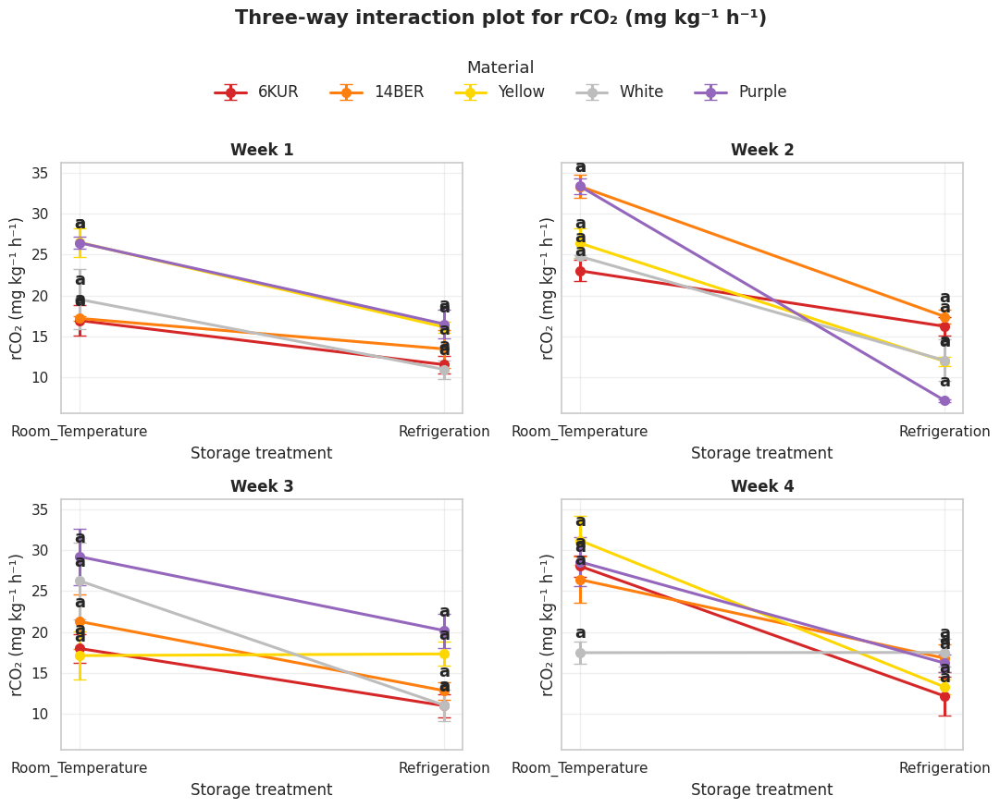

Figura guardada: Interaction_3way_Respiration.png


In [18]:
# ============================================================
# CREAR RESULTADOS ART COMPLETOS + LETRAS + INTERACTION PLOT
# ============================================================

import os
import string
import itertools
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

# =========================
# CONFIGURACIÓN
# =========================
input_file = "Resultados_ART_Zanahoria.xlsx"
variable = "Respiration"   # cambia a: a_star, b_star, Fresh_Weight, Respiration, Firmness, TSS

response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)"
}

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

week_order = ["1", "2", "3", "4"]
treatment_order = ["Room_Temperature", "Refrigeration"]
material_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]

# =========================
# CARGAR DATOS
# =========================
df = pd.read_excel(input_file, sheet_name="Data_Used")

df["Week"] = df["Week"].astype(str)
df["Treatment"] = df["Treatment"].astype(str)
df["Variedad"] = df["Variedad"].astype(str)
df["Repetición"] = df["Repetición"].astype(str)

# =========================
# RPY2: ART + EMMEANS FDR
# =========================
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r("""
options(repos = c(CRAN = "https://cloud.r-project.org"))

pkgs <- c("ARTool", "emmeans")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}

suppressPackageStartupMessages({
  library(ARTool)
  library(emmeans)
})
""")

def run_art_full(df_in, variable):
    df_in = df_in.dropna(subset=["Variedad", "Treatment", "Week", "Repetición", variable]).copy()

    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py"] = df_in

    r_code = f"""
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
    }})

    d <- df_py[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    d$Variedad <- factor(as.character(d$Variedad),
      levels = c("6KUR", "14BER", "Yellow", "White", "Purple"))

    d$Treatment <- factor(as.character(d$Treatment),
      levels = c("Room_Temperature", "Refrigeration"))

    d$Week <- factor(as.character(d$Week),
      levels = c("1", "2", "3", "4"))

    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    mod <- art(as.formula("{variable} ~ Variedad * Treatment * Week"), data = d)

    anova_df <- as.data.frame(anova(mod))
    anova_df$Effect <- rownames(anova_df)
    rownames(anova_df) <- NULL
    anova_df$Variable <- "{variable}"

    if (all(c("F value", "Df", "Df.res") %in% names(anova_df))) {{
      anova_df$partial_eta2 <- (anova_df[["F value"]] * anova_df[["Df"]]) /
                               ((anova_df[["F value"]] * anova_df[["Df"]]) + anova_df[["Df.res"]])
    }} else {{
      anova_df$partial_eta2 <- NA_real_
    }}

    fit <- artlm(mod, "Variedad")
    emm <- emmeans(fit, ~ Variedad | Treatment * Week)

    pairs_df <- as.data.frame(pairs(emm, adjust = "fdr"))
    pairs_df$Variable <- "{variable}"
    """

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_out = ro.conversion.rpy2py(ro.r("anova_df"))
        posthoc_out = ro.conversion.rpy2py(ro.r("pairs_df"))

    return anova_out, posthoc_out

# =========================
# CORRER ART PARA TODAS
# =========================
anova_list = []
posthoc_list = []

for var in response_vars:
    try:
        print(f"Procesando {var}...")
        a, p = run_art_full(df.copy(), var)
        anova_list.append(a)
        posthoc_list.append(p)
        print(f"OK: {var}")
    except Exception as e:
        print(f"Error en {var}: {e}")

anova_final = pd.concat(anova_list, ignore_index=True)
posthoc_final = pd.concat(posthoc_list, ignore_index=True)

anova_final = anova_final.rename(columns={
    "F value": "F_value",
    "Pr(>F)": "p_value"
})

posthoc_final = posthoc_final.rename(columns={
    "p.value": "p_value"
})

# =========================
# GUARDAR EXCEL COMPLETO
# =========================
with pd.ExcelWriter("RESULTADOS_ART_FDR_COMPLETO.xlsx", engine="openpyxl") as writer:
    df.to_excel(writer, sheet_name="Data_Used", index=False)
    anova_final.to_excel(writer, sheet_name="ANOVA_ART", index=False)
    posthoc_final.to_excel(writer, sheet_name="POSTHOC_FDR", index=False)

print("Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx")

# =========================
# GENERAR LETRAS
# =========================
def parse_contrast(txt):
    parts = [p.strip() for p in str(txt).split(" - ")]
    if len(parts) != 2:
        return None, None
    return parts[0], parts[1]

def make_letters(df_panel, posthoc_panel, alpha=0.05):
    groups = [g for g in material_order if g in df_panel["Variedad"].unique()]
    means = df_panel.groupby("Variedad")["Value"].mean()

    pvals = {}
    for _, row in posthoc_panel.iterrows():
        a, b = parse_contrast(row["contrast"])
        if a is not None:
            pvals[frozenset([a, b])] = row["p_value"]

    letters = {g: "" for g in groups}
    current_letter = "a"
    assigned = set()

    sorted_groups = means.reindex(groups).sort_values(ascending=False).index.tolist()

    for g in sorted_groups:
        if g in assigned:
            continue

        letters[g] += current_letter
        assigned.add(g)

        for h in sorted_groups:
            if h == g or h in assigned:
                continue

            p = pvals.get(frozenset([g, h]), np.nan)

            if pd.notna(p) and p >= alpha:
                letters[h] += current_letter
                assigned.add(h)

        current_letter = chr(ord(current_letter) + 1)

    return letters

plot_df = df.melt(
    id_vars=["Week", "Treatment", "Variedad", "Repetición"],
    value_vars=response_vars,
    var_name="Variable",
    value_name="Value"
).dropna()

letters_rows = []

for var in response_vars:
    for treatment in treatment_order:
        for week in week_order:
            df_panel = plot_df[
                (plot_df["Variable"] == var) &
                (plot_df["Treatment"] == treatment) &
                (plot_df["Week"] == week)
            ]

            ph_panel = posthoc_final[
                (posthoc_final["Variable"] == var) &
                (posthoc_final["Treatment"] == treatment) &
                (posthoc_final["Week"] == week)
            ]

            if df_panel.empty:
                continue

            letters_map = make_letters(df_panel, ph_panel)

            for mat, let in letters_map.items():
                letters_rows.append({
                    "Variable": var,
                    "Treatment": treatment,
                    "Week": week,
                    "Variedad": mat,
                    "Letters": let
                })

letters_df = pd.DataFrame(letters_rows)
letters_df.to_excel("LETRAS_ART_FDR_COMPLETO.xlsx", index=False)

print("Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx")

# =========================
# TABLA ANOVA COMPLETA VARIABLE
# =========================
anova_var = anova_final[anova_final["Variable"] == variable].copy()

def format_p(p):
    if p < 0.001:
        return "<0.001 ***"
    elif p < 0.01:
        return f"{p:.3f} **"
    elif p < 0.05:
        return f"{p:.3f} *"
    else:
        return f"{p:.3f}"

def effect_size(x):
    if x >= 0.14:
        return "Large"
    elif x >= 0.06:
        return "Medium"
    else:
        return "Small"

anova_table = anova_var[["Effect", "Df", "Df.res", "F_value", "p_value", "partial_eta2"]].copy()
anova_table["p_value_formatted"] = anova_table["p_value"].apply(format_p)
anova_table["Size"] = anova_table["partial_eta2"].apply(effect_size)

anova_table.to_excel(f"Tabla_ART_completa_{variable}.xlsx", index=False)

print("\nTABLA ART COMPLETA:")
print(anova_table)

# =========================
# GRÁFICA INTERACCIÓN 3 VÍAS
# =========================
sns.set_theme(style="whitegrid")

summary = (
    df.groupby(["Week", "Treatment", "Variedad"], observed=False)[variable]
    .agg(["mean", "std", "count"])
    .reset_index()
)

summary["se"] = summary["std"] / np.sqrt(summary["count"])

fig, axes = plt.subplots(2, 2, figsize=(11, 8), sharey=True)
axes = axes.flatten()

for i, week in enumerate(week_order):
    ax = axes[i]

    sub = summary[summary["Week"] == week].copy()

    for mat in material_order:
        sm = sub[sub["Variedad"] == mat].copy()

        if sm.empty:
            continue

        sm["Treatment"] = pd.Categorical(
            sm["Treatment"],
            categories=treatment_order,
            ordered=True
        )
        sm = sm.sort_values("Treatment")

        ax.errorbar(
            sm["Treatment"],
            sm["mean"],
            yerr=sm["se"],
            marker="o",
            linewidth=2.2,
            capsize=5,
            markersize=7,
            color=palette[mat],
            label=mat
        )

        # Letras
        let_sub = letters_df[
            (letters_df["Variable"] == variable) &
            (letters_df["Week"] == week) &
            (letters_df["Variedad"] == mat)
        ]

        for j, tr in enumerate(treatment_order):
            row = let_sub[let_sub["Treatment"] == tr]
            y_val = sm[sm["Treatment"] == tr]["mean"]

            if not row.empty and len(y_val) > 0:
                ax.text(
                    j,
                    y_val.iloc[0] + 1.3,
                    str(row.iloc[0]["Letters"]),
                    ha="center",
                    va="bottom",
                    fontsize=13,
                    fontweight="bold"
                )

    ax.set_title(f"Week {week}", fontweight="bold")
    ax.set_xlabel("Storage treatment")
    ax.set_ylabel(pretty_labels.get(variable, variable))
    ax.grid(True, alpha=0.3)

handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    title="Material",
    loc="upper center",
    bbox_to_anchor=(0.5, 1.04),
    ncol=5,
    fontsize=12,
    title_fontsize=13,
    frameon=False
)

fig.suptitle(
    f"Three-way interaction plot for {pretty_labels.get(variable, variable)}",
    fontsize=15,
    fontweight="bold",
    y=1.09
)

plt.tight_layout(rect=[0, 0, 1, 0.98])

out_path = f"Interaction_3way_{variable}.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Figura guardada: {out_path}")

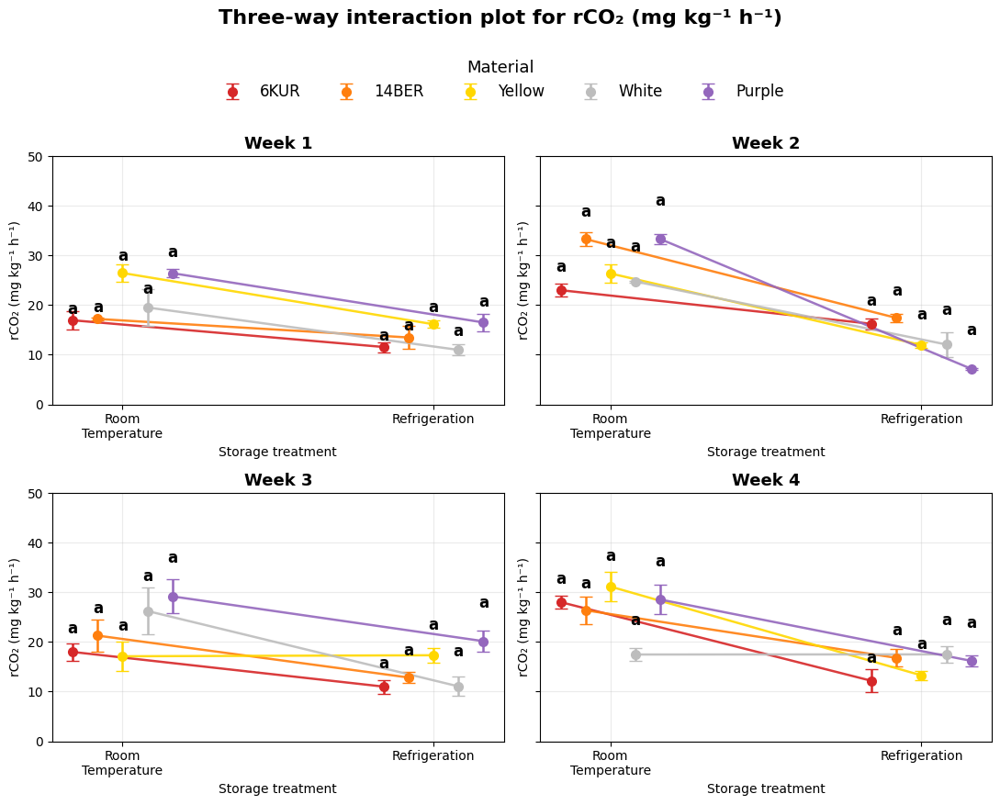

Guardado: figuras_paper_interaction/Interaction_3way_Respiration.png


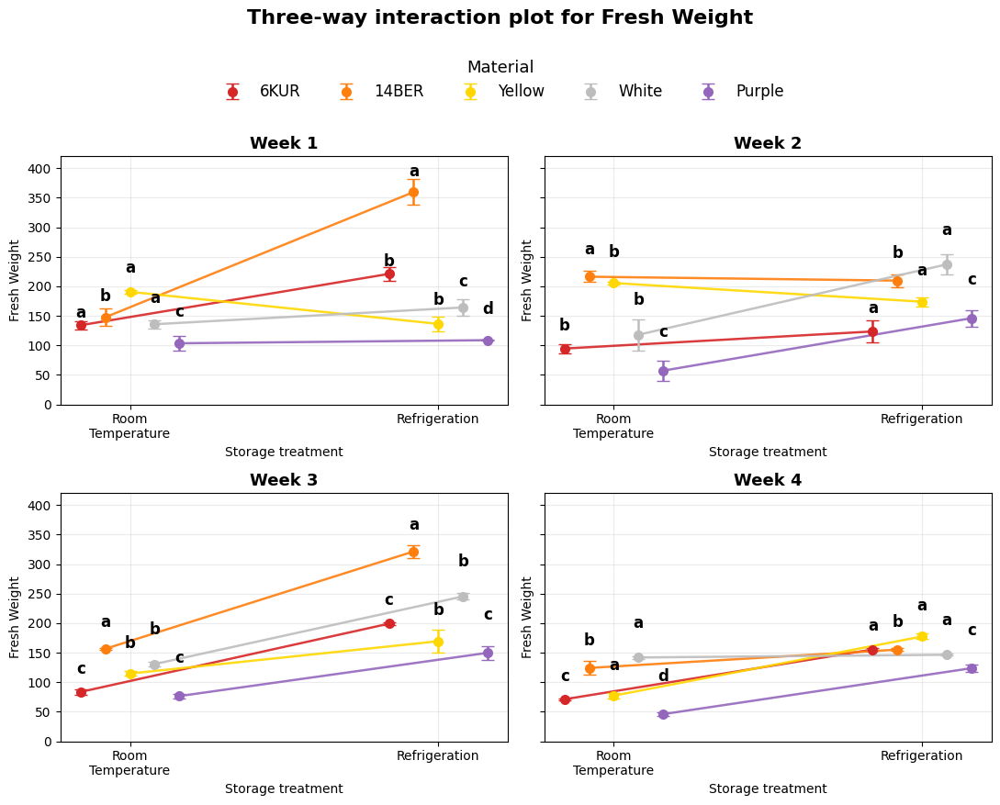

Guardado: figuras_paper_interaction/Interaction_3way_Fresh_Weight.png


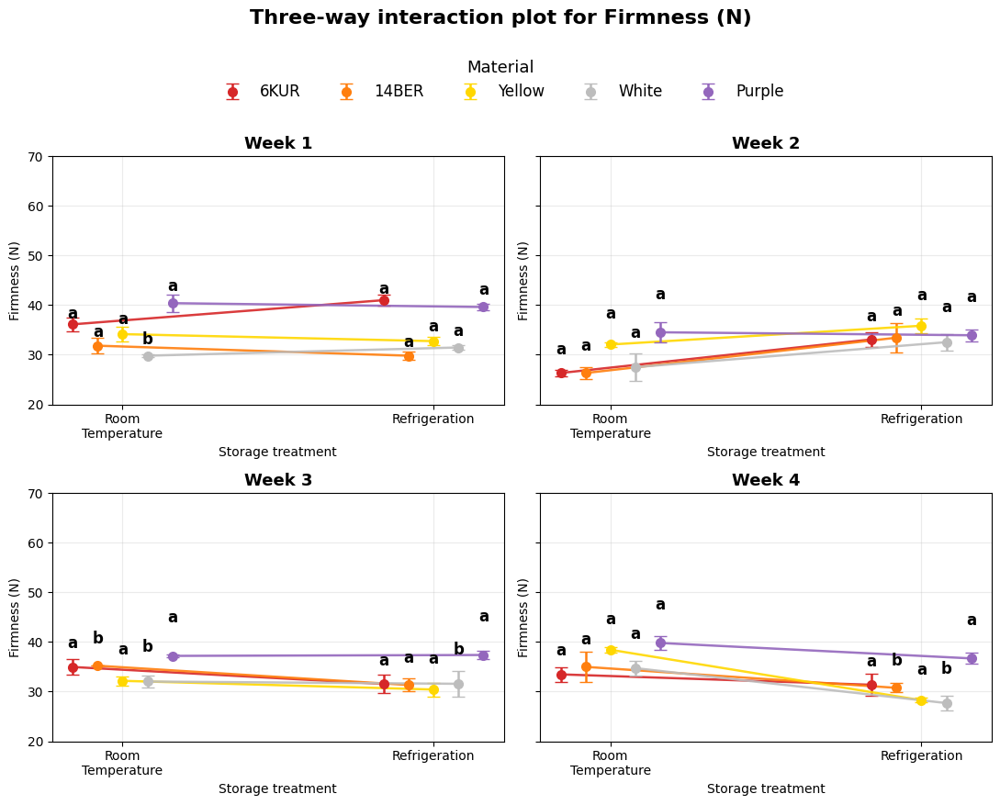

Guardado: figuras_paper_interaction/Interaction_3way_Firmness.png


In [19]:
# ============================================================
# FIGURA PAPER: INTERACCIÓN 3 VÍAS
# Paneles = Week | X = Treatment | Color = Material
# Medias ± SE + letras
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="whitegrid")
plt.style.use("default")

# =========================
# CONFIGURACIÓN
# =========================

data_file = "RESULTADOS_ART_FDR_COMPLETO.xlsx"
letters_file = "LETRAS_ART_FDR_COMPLETO.xlsx"

# Variables principales para paper
variables_to_plot = ["Respiration", "Fresh_Weight", "Firmness"]

pretty_labels = {
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Fresh_Weight": "Fresh Weight",
    "Firmness": "Firmness (N)"
}

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

material_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]
treatment_order = ["Room_Temperature", "Refrigeration"]
week_order = ["1", "2", "3", "4"]

y_limits = {
    "Respiration": (0, 50),
    "Fresh_Weight": (0, 420),
    "Firmness": (20, 70)
}

# =========================
# CARGAR DATOS
# =========================

df = pd.read_excel(data_file, sheet_name="Data_Used")
letters_df = pd.read_excel(letters_file)

df["Week"] = df["Week"].astype(str)
df["Treatment"] = df["Treatment"].astype(str)
df["Variedad"] = df["Variedad"].astype(str)

letters_df["Week"] = letters_df["Week"].astype(str)
letters_df["Treatment"] = letters_df["Treatment"].astype(str)
letters_df["Variedad"] = letters_df["Variedad"].astype(str)
letters_df["Variable"] = letters_df["Variable"].astype(str)
letters_df["Letters"] = letters_df["Letters"].astype(str)

# =========================
# FUNCIÓN DE FIGURA
# =========================

def plot_three_way_interaction(variable):

    summary = (
        df.groupby(["Week", "Treatment", "Variedad"], observed=False)[variable]
        .agg(["mean", "std", "count"])
        .reset_index()
    )

    summary["se"] = summary["std"] / np.sqrt(summary["count"])

    fig, axes = plt.subplots(
        2, 2,
        figsize=(11, 8),
        sharey=True
    )

    axes = axes.flatten()

    x_base = np.arange(len(treatment_order))
    x_offsets = np.linspace(-0.16, 0.16, len(material_order))

    for i, week in enumerate(week_order):

        ax = axes[i]

        sub_week = summary[summary["Week"] == week].copy()

        for hi, mat in enumerate(material_order):

            sm = sub_week[sub_week["Variedad"] == mat].copy()

            if sm.empty:
                continue

            sm["Treatment"] = pd.Categorical(
                sm["Treatment"],
                categories=treatment_order,
                ordered=True
            )

            sm = sm.sort_values("Treatment")

            x_positions = x_base + x_offsets[hi]

            ax.errorbar(
                x_positions,
                sm["mean"],
                yerr=sm["se"],
                fmt="o",
                markersize=7,
                capsize=5,
                linewidth=1.8,
                color=palette[mat],
                label=mat
            )

            ax.plot(
                x_positions,
                sm["mean"],
                color=palette[mat],
                linewidth=1.8,
                alpha=0.9
            )

            # Letras
            let_sub = letters_df[
                (letters_df["Variable"] == variable) &
                (letters_df["Week"] == week) &
                (letters_df["Variedad"] == mat)
            ]

            y0, y1 = ax.get_ylim()
            y_range = y1 - y0

            for j, tr in enumerate(treatment_order):

                row = let_sub[let_sub["Treatment"] == tr]
                y_val = sm[sm["Treatment"] == tr]["mean"]

                if not row.empty and len(y_val) > 0:

                    letter = str(row.iloc[0]["Letters"]).strip()

                    if letter != "" and letter.lower() != "nan":

                        ax.text(
                            x_base[j] + x_offsets[hi],
                            y_val.iloc[0] + (0.06 * y_range) + hi * (0.015 * y_range),
                            letter,
                            ha="center",
                            va="bottom",
                            fontsize=12,
                            fontweight="bold",
                            color="black"
                        )

        ax.set_title(f"Week {week}", fontsize=13, fontweight="bold")
        ax.set_xticks(x_base)
        ax.set_xticklabels(["Room\nTemperature", "Refrigeration"])
        ax.set_xlabel("Storage treatment")
        ax.set_ylabel(pretty_labels.get(variable, variable))

        if variable in y_limits:
            ax.set_ylim(y_limits[variable])

        ax.grid(True, alpha=0.25)

    handles, labels = axes[0].get_legend_handles_labels()

    fig.legend(
        handles,
        labels,
        title="Material",
        loc="upper center",
        bbox_to_anchor=(0.5, 1.04),
        ncol=5,
        fontsize=12,
        title_fontsize=13,
        frameon=False
    )

    fig.suptitle(
        f"Three-way interaction plot for {pretty_labels.get(variable, variable)}",
        fontsize=16,
        fontweight="bold",
        y=1.09
    )

    plt.tight_layout(rect=[0, 0, 1, 0.98])

    os.makedirs("figuras_paper_interaction", exist_ok=True)

    out_path = f"figuras_paper_interaction/Interaction_3way_{variable}.png"
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()

    print(f"Guardado: {out_path}")

# =========================
# GENERAR FIGURAS PRINCIPALES
# =========================

for var in variables_to_plot:
    plot_three_way_interaction(var)

In [20]:
# Variables principales para paper
variables_to_plot = [
    "Respiration",
    "Fresh_Weight",
    "Firmness",
    "a_star"
]

pretty_labels = {
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Fresh_Weight": "Fresh Weight",
    "Firmness": "Firmness (N)",
    "a_star": "a*"
}

y_limits = {
    "Respiration": (0, 50),
    "Fresh_Weight": (0, 420),
    "Firmness": (20, 70),
    "a_star": (-6, 35)
}

Procesando ART para L_star...
OK: L_star
Procesando ART para a_star...
OK: a_star
Procesando ART para b_star...
OK: b_star
Procesando ART para Fresh_Weight...
OK: Fresh_Weight
Procesando ART para Respiration...
OK: Respiration
Procesando ART para Firmness...
OK: Firmness
Procesando ART para TSS...
OK: TSS
Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx
Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx
Archivo creado: Tabla_ART_main_text_variables.xlsx
        Variable                   Effect    Df  Df.res     F_value  \
7         a_star                 Variedad   4.0    80.0  153.082459   
8         a_star                Treatment   1.0    80.0   13.972306   
9         a_star                     Week   3.0    80.0    8.470989   
10        a_star       Variedad:Treatment   4.0    80.0    5.846899   
11        a_star            Variedad:Week  12.0    80.0    3.555839   
12        a_star           Treatment:Week   3.0    80.0    2.499293   
13        a_star  Variedad:Treatment:Week  12.0    

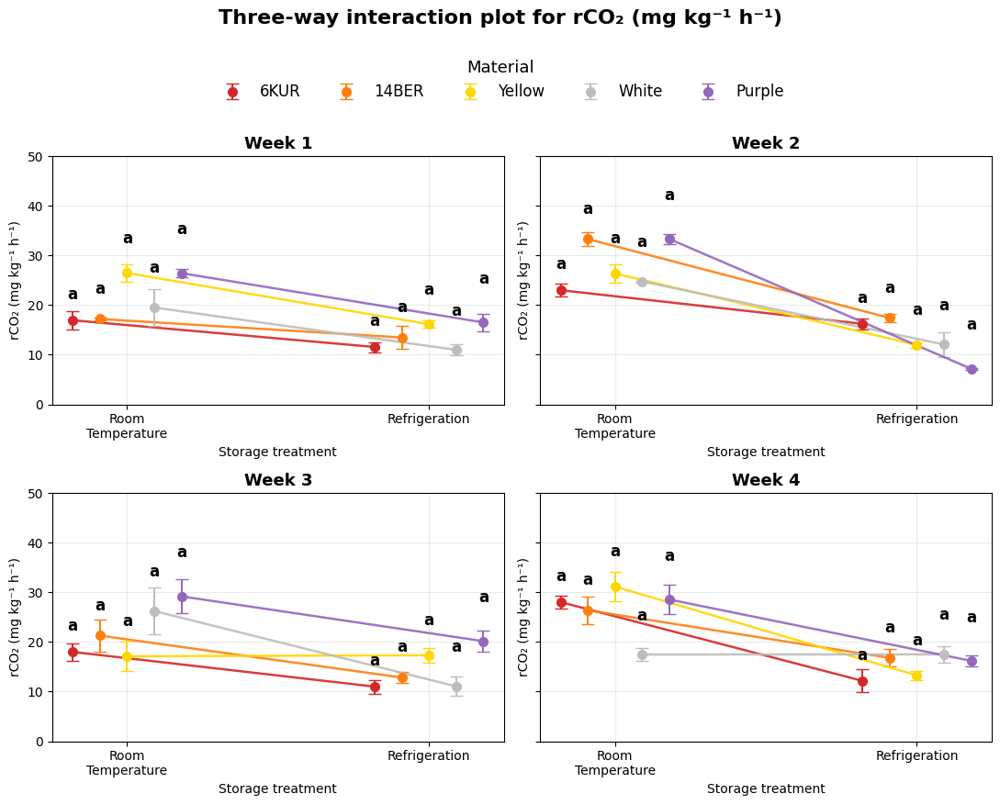

Guardado: figuras_paper_interaction/Interaction_3way_Respiration.png


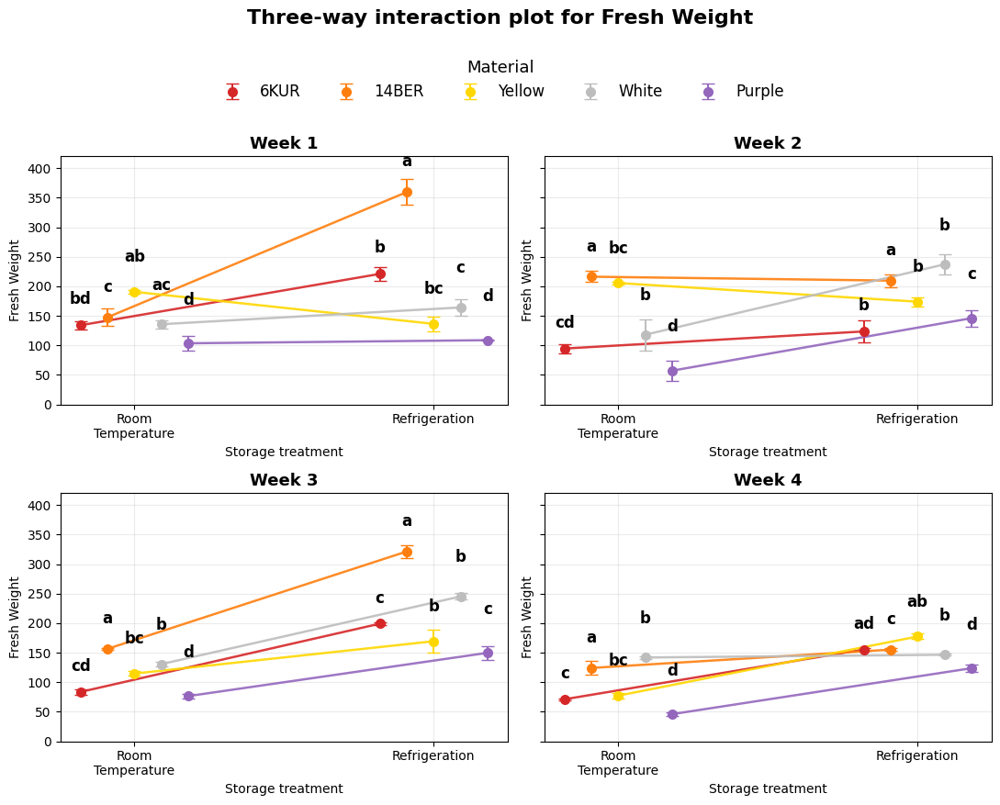

Guardado: figuras_paper_interaction/Interaction_3way_Fresh_Weight.png


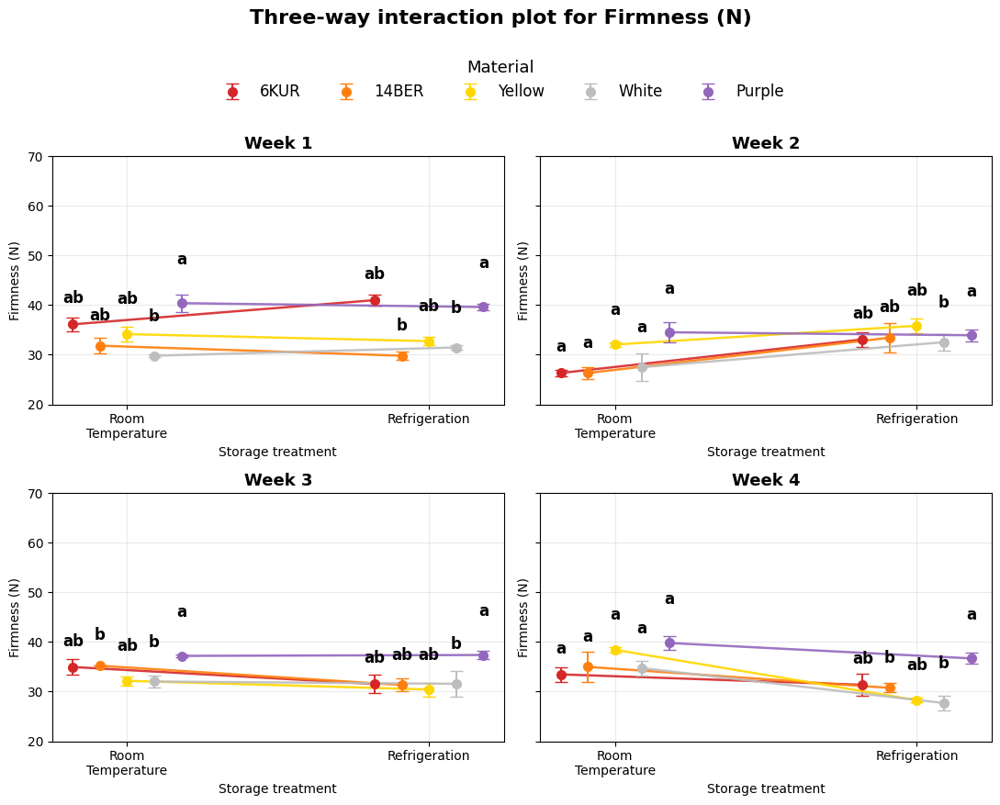

Guardado: figuras_paper_interaction/Interaction_3way_Firmness.png


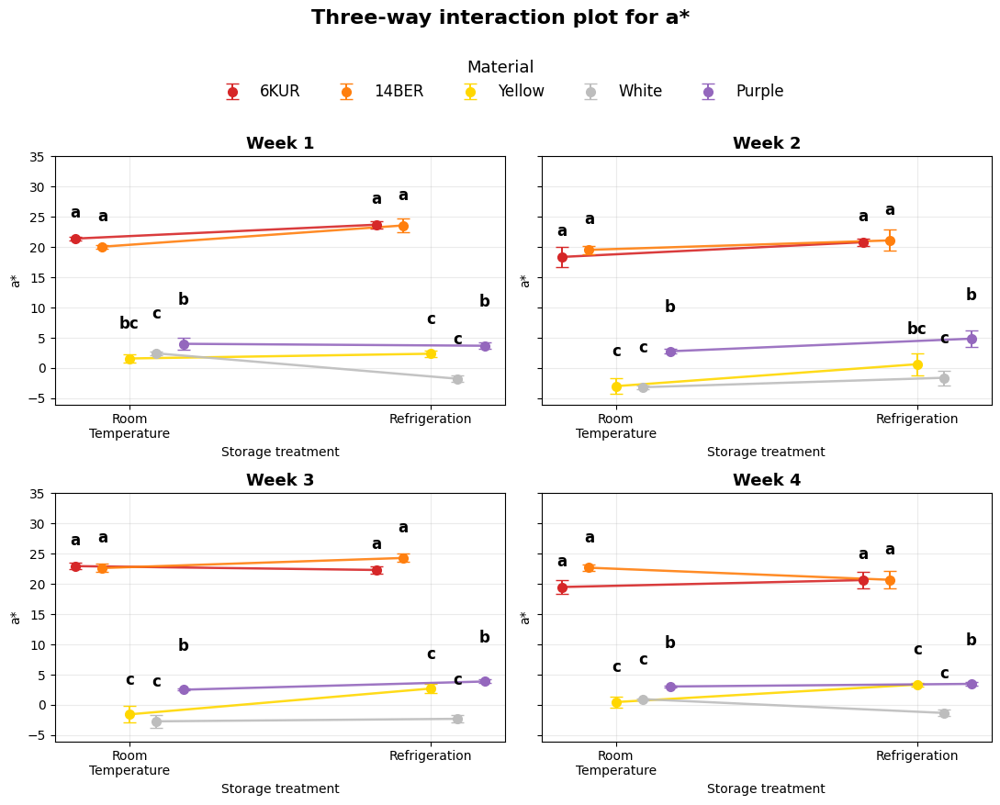

Guardado: figuras_paper_interaction/Interaction_3way_a_star.png

LISTO.
Archivos generados:
- RESULTADOS_ART_FDR_COMPLETO.xlsx
- LETRAS_ART_FDR_COMPLETO.xlsx
- Tabla_ART_main_text_variables.xlsx
- Figuras en carpeta: figuras_paper_interaction/


In [21]:
# ============================================================
# BLOQUE COMPLETO FINAL:
# ART + POSTHOC FDR + LETRAS + FIGURAS DE INTERACCIÓN
# Variables main text: Respiration, Fresh_Weight, Firmness, a_star
# ============================================================

# Si hace falta:
# !pip install pandas openpyxl seaborn matplotlib rpy2

import os
import string
import itertools
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

# ============================================================
# CONFIGURACIÓN
# ============================================================

input_file = "Resultados_ART_Zanahoria.xlsx"

variables_to_plot = [
    "Respiration",
    "Fresh_Weight",
    "Firmness",
    "a_star"
]

response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Firmness": "Firmness (N)",
    "TSS": "TSS (°Brix)"
}

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

week_order = ["1", "2", "3", "4"]
treatment_order = ["Room_Temperature", "Refrigeration"]
material_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]

y_limits = {
    "Respiration": (0, 50),
    "Fresh_Weight": (0, 420),
    "Firmness": (20, 70),
    "a_star": (-6, 35),
    "L_star": (20, 75),
    "b_star": (-5, 50),
    "TSS": (0, 20)
}

# ============================================================
# CARGAR DATOS
# ============================================================

df = pd.read_excel(input_file, sheet_name="Data_Used")

df["Week"] = df["Week"].astype(str)
df["Treatment"] = df["Treatment"].astype(str)
df["Variedad"] = df["Variedad"].astype(str)
df["Repetición"] = df["Repetición"].astype(str)

# ============================================================
# ART + EMMEANS + FDR
# ============================================================

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r("""
options(repos = c(CRAN = "https://cloud.r-project.org"))

pkgs <- c("ARTool", "emmeans")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}

suppressPackageStartupMessages({
  library(ARTool)
  library(emmeans)
})
""")

def run_art_full(df_in, variable):
    df_in = df_in.dropna(
        subset=["Variedad", "Treatment", "Week", "Repetición", variable]
    ).copy()

    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py"] = df_in

    r_code = f"""
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
    }})

    d <- df_py[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    d$Variedad <- factor(
      as.character(d$Variedad),
      levels = c("6KUR", "14BER", "Yellow", "White", "Purple")
    )

    d$Treatment <- factor(
      as.character(d$Treatment),
      levels = c("Room_Temperature", "Refrigeration")
    )

    d$Week <- factor(
      as.character(d$Week),
      levels = c("1", "2", "3", "4")
    )

    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    mod <- art(as.formula("{variable} ~ Variedad * Treatment * Week"), data = d)

    anova_df <- as.data.frame(anova(mod))
    anova_df$Effect <- rownames(anova_df)
    rownames(anova_df) <- NULL
    anova_df$Variable <- "{variable}"

    if (all(c("F value", "Df", "Df.res") %in% names(anova_df))) {{
      anova_df$partial_eta2 <- (anova_df[["F value"]] * anova_df[["Df"]]) /
                               ((anova_df[["F value"]] * anova_df[["Df"]]) + anova_df[["Df.res"]])
    }} else {{
      anova_df$partial_eta2 <- NA_real_
    }}

    fit <- artlm(mod, "Variedad")
    emm <- emmeans(fit, ~ Variedad | Treatment * Week)

    pairs_df <- as.data.frame(pairs(emm, adjust = "fdr"))
    pairs_df$Variable <- "{variable}"
    """

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_out = ro.conversion.rpy2py(ro.r("anova_df"))
        posthoc_out = ro.conversion.rpy2py(ro.r("pairs_df"))

    return anova_out, posthoc_out

anova_list = []
posthoc_list = []

for var in response_vars:
    try:
        print(f"Procesando ART para {var}...")
        a, p = run_art_full(df.copy(), var)
        anova_list.append(a)
        posthoc_list.append(p)
        print(f"OK: {var}")
    except Exception as e:
        print(f"Error en {var}: {e}")

anova_final = pd.concat(anova_list, ignore_index=True)
posthoc_final = pd.concat(posthoc_list, ignore_index=True)

anova_final = anova_final.rename(columns={
    "F value": "F_value",
    "Pr(>F)": "p_value"
})

posthoc_final = posthoc_final.rename(columns={
    "p.value": "p_value"
})

# ============================================================
# GUARDAR RESULTADOS ART
# ============================================================

with pd.ExcelWriter("RESULTADOS_ART_FDR_COMPLETO.xlsx", engine="openpyxl") as writer:
    df.to_excel(writer, sheet_name="Data_Used", index=False)
    anova_final.to_excel(writer, sheet_name="ANOVA_ART", index=False)
    posthoc_final.to_excel(writer, sheet_name="POSTHOC_FDR", index=False)

print("Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx")

# ============================================================
# GENERAR LETRAS DESDE POSTHOC
# ============================================================

def parse_contrast(txt):
    parts = [p.strip() for p in str(txt).split(" - ")]
    if len(parts) != 2:
        return None, None
    return parts[0], parts[1]


def bron_kerbosch(R, P, X, neighbors, cliques):
    if not P and not X:
        cliques.append(R)
        return

    for v in list(P):
        bron_kerbosch(
            R | {v},
            P & neighbors[v],
            X & neighbors[v],
            neighbors,
            cliques
        )
        P.remove(v)
        X.add(v)


def maximal_cliques_from_nonsig(groups, nonsig_pairs):
    neighbors = {g: set() for g in groups}

    for a, b in nonsig_pairs:
        neighbors[a].add(b)
        neighbors[b].add(a)

    cliques = []
    bron_kerbosch(set(), set(groups), set(), neighbors, cliques)

    for g in groups:
        if not any(g in c for c in cliques):
            cliques.append({g})

    return sorted(cliques, key=lambda c: (-len(c), sorted(list(c))))


def make_letters(df_panel, posthoc_panel, alpha=0.05):
    groups = [g for g in material_order if g in df_panel["Variedad"].unique()]

    if len(groups) == 0:
        return {}

    means = (
        df_panel.groupby("Variedad", observed=False)["Value"]
        .mean()
        .reindex(groups)
    )

    pvals = {}

    for _, row in posthoc_panel.iterrows():
        a, b = parse_contrast(row["contrast"])
        if a is not None:
            pvals[frozenset([a, b])] = row["p_value"]

    nonsig_pairs = set()

    for a, b in itertools.combinations(groups, 2):
        p = pvals.get(frozenset([a, b]), np.nan)
        if pd.notna(p) and p >= alpha:
            nonsig_pairs.add((a, b))

    cliques = maximal_cliques_from_nonsig(groups, nonsig_pairs)

    def clique_mean(c):
        vals = [means[g] for g in c if pd.notna(means[g])]
        return np.mean(vals) if len(vals) else -np.inf

    cliques = sorted(cliques, key=lambda c: (-clique_mean(c), -len(c)))

    letters_pool = list(string.ascii_lowercase)
    letters_pool += [f"a{i}" for i in range(1, 100)]

    group_letters = {g: "" for g in groups}

    for i, clique in enumerate(cliques):
        letter = letters_pool[i]
        for g in clique:
            group_letters[g] += letter

    next_idx = len(cliques)

    for g in groups:
        if group_letters[g] == "":
            group_letters[g] = letters_pool[next_idx]
            next_idx += 1

    for g in group_letters:
        uniq = []
        for ch in group_letters[g]:
            if ch not in uniq:
                uniq.append(ch)
        group_letters[g] = "".join(uniq)

    return group_letters

plot_df = df.melt(
    id_vars=["Week", "Treatment", "Variedad", "Repetición"],
    value_vars=response_vars,
    var_name="Variable",
    value_name="Value"
).dropna()

letters_rows = []

for var in response_vars:
    for treatment in treatment_order:
        for week in week_order:

            df_panel = plot_df[
                (plot_df["Variable"] == var) &
                (plot_df["Treatment"] == treatment) &
                (plot_df["Week"] == week)
            ]

            ph_panel = posthoc_final[
                (posthoc_final["Variable"] == var) &
                (posthoc_final["Treatment"] == treatment) &
                (posthoc_final["Week"] == week)
            ]

            if df_panel.empty:
                continue

            letters_map = make_letters(df_panel, ph_panel, alpha=0.05)

            for mat, let in letters_map.items():
                letters_rows.append({
                    "Variable": var,
                    "Treatment": treatment,
                    "Week": week,
                    "Variedad": mat,
                    "Letters": let
                })

letters_df = pd.DataFrame(letters_rows)
letters_df.to_excel("LETRAS_ART_FDR_COMPLETO.xlsx", index=False)

print("Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx")

# ============================================================
# TABLAS ANOVA SOLO VARIABLES MAIN TEXT
# ============================================================

def format_p(p):
    if p < 0.001:
        return "<0.001 ***"
    elif p < 0.01:
        return f"{p:.3f} **"
    elif p < 0.05:
        return f"{p:.3f} *"
    else:
        return f"{p:.3f}"


def effect_size(x):
    if x >= 0.14:
        return "Large"
    elif x >= 0.06:
        return "Medium"
    else:
        return "Small"

main_anova = anova_final[anova_final["Variable"].isin(variables_to_plot)].copy()

main_anova_table = main_anova[
    ["Variable", "Effect", "Df", "Df.res", "F_value", "p_value", "partial_eta2"]
].copy()

main_anova_table["p_value_formatted"] = main_anova_table["p_value"].apply(format_p)
main_anova_table["Effect_size"] = main_anova_table["partial_eta2"].apply(effect_size)

main_anova_table.to_excel("Tabla_ART_main_text_variables.xlsx", index=False)

print("Archivo creado: Tabla_ART_main_text_variables.xlsx")
print(main_anova_table.head(20))

# ============================================================
# FIGURA PAPER: INTERACCIÓN 3 VÍAS
# Paneles = Week | X = Treatment | Color = Material
# Medias ± SE + letras
# ============================================================

sns.set_theme(style="whitegrid")
plt.style.use("default")

os.makedirs("figuras_paper_interaction", exist_ok=True)

def plot_three_way_interaction(variable):

    summary = (
        df.groupby(["Week", "Treatment", "Variedad"], observed=False)[variable]
        .agg(["mean", "std", "count"])
        .reset_index()
    )

    summary["se"] = summary["std"] / np.sqrt(summary["count"])

    fig, axes = plt.subplots(
        2, 2,
        figsize=(11, 8),
        sharey=True
    )

    axes = axes.flatten()

    x_base = np.arange(len(treatment_order))
    x_offsets = np.linspace(-0.18, 0.18, len(material_order))

    for i, week in enumerate(week_order):

        ax = axes[i]
        sub_week = summary[summary["Week"] == week].copy()

        for hi, mat in enumerate(material_order):

            sm = sub_week[sub_week["Variedad"] == mat].copy()

            if sm.empty:
                continue

            sm["Treatment"] = pd.Categorical(
                sm["Treatment"],
                categories=treatment_order,
                ordered=True
            )

            sm = sm.sort_values("Treatment")
            x_positions = x_base + x_offsets[hi]

            ax.errorbar(
                x_positions,
                sm["mean"],
                yerr=sm["se"],
                fmt="o",
                markersize=7,
                capsize=5,
                elinewidth=1.4,
                color=palette[mat],
                label=mat
            )

            ax.plot(
                x_positions,
                sm["mean"],
                color=palette[mat],
                linewidth=1.8,
                alpha=0.9
            )

            let_sub = letters_df[
                (letters_df["Variable"] == variable) &
                (letters_df["Week"] == week) &
                (letters_df["Variedad"] == mat)
            ]

            y0, y1 = y_limits.get(variable, ax.get_ylim())
            y_range = y1 - y0

            for j, tr in enumerate(treatment_order):

                row = let_sub[let_sub["Treatment"] == tr]
                y_val = sm[sm["Treatment"] == tr]["mean"]

                if not row.empty and len(y_val) > 0:

                    letter = str(row.iloc[0]["Letters"]).strip()

                    if letter != "" and letter.lower() != "nan":

                        ax.text(
                            x_base[j] + x_offsets[hi],
                            y_val.iloc[0] + (0.07 * y_range) + hi * (0.018 * y_range),
                            letter,
                            ha="center",
                            va="bottom",
                            fontsize=12,
                            fontweight="bold",
                            color="black"
                        )

        ax.set_title(f"Week {week}", fontsize=13, fontweight="bold")
        ax.set_xticks(x_base)
        ax.set_xticklabels(["Room\nTemperature", "Refrigeration"])
        ax.set_xlabel("Storage treatment")
        ax.set_ylabel(pretty_labels.get(variable, variable))

        if variable in y_limits:
            ax.set_ylim(y_limits[variable])

        ax.grid(True, alpha=0.25)

    handles, labels = axes[0].get_legend_handles_labels()

    fig.legend(
        handles,
        labels,
        title="Material",
        loc="upper center",
        bbox_to_anchor=(0.5, 1.04),
        ncol=5,
        fontsize=12,
        title_fontsize=13,
        frameon=False
    )

    fig.suptitle(
        f"Three-way interaction plot for {pretty_labels.get(variable, variable)}",
        fontsize=16,
        fontweight="bold",
        y=1.09
    )

    plt.tight_layout(rect=[0, 0, 1, 0.98])

    out_path = f"figuras_paper_interaction/Interaction_3way_{variable}.png"
    plt.savefig(out_path, dpi=300, bbox_inches="tight")
    plt.show()

    print(f"Guardado: {out_path}")

# ============================================================
# GENERAR FIGURAS MAIN TEXT
# ============================================================

for var in variables_to_plot:
    plot_three_way_interaction(var)

print("\nLISTO.")
print("Archivos generados:")
print("- RESULTADOS_ART_FDR_COMPLETO.xlsx")
print("- LETRAS_ART_FDR_COMPLETO.xlsx")
print("- Tabla_ART_main_text_variables.xlsx")
print("- Figuras en carpeta: figuras_paper_interaction/")

Procesando L_star...
OK: L_star
Procesando a_star...
OK: a_star
Procesando b_star...
OK: b_star
Procesando Fresh_Weight...
OK: Fresh_Weight
Procesando Respiration...
OK: Respiration
Procesando Firmness...
OK: Firmness
Procesando TSS...
OK: TSS
Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx
Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx

TABLA ART COMPLETA:
                     Effect    Df  Df.res    F_value       p_value  \
35                 Variedad   4.0    80.0  20.435931  1.250713e-11   
36                Treatment   1.0    80.0   1.873858  1.748653e-01   
37                     Week   3.0    80.0   7.573721  1.602127e-04   
38       Variedad:Treatment   4.0    80.0   1.935486  1.125516e-01   
39            Variedad:Week  12.0    80.0   3.558681  2.949731e-04   
40           Treatment:Week   3.0    80.0  18.137678  4.515315e-09   
41  Variedad:Treatment:Week  12.0    80.0   1.768111  6.791365e-02   

    partial_eta2 p_value_formatted    Size  
35      0.505390        <0.001 *** 

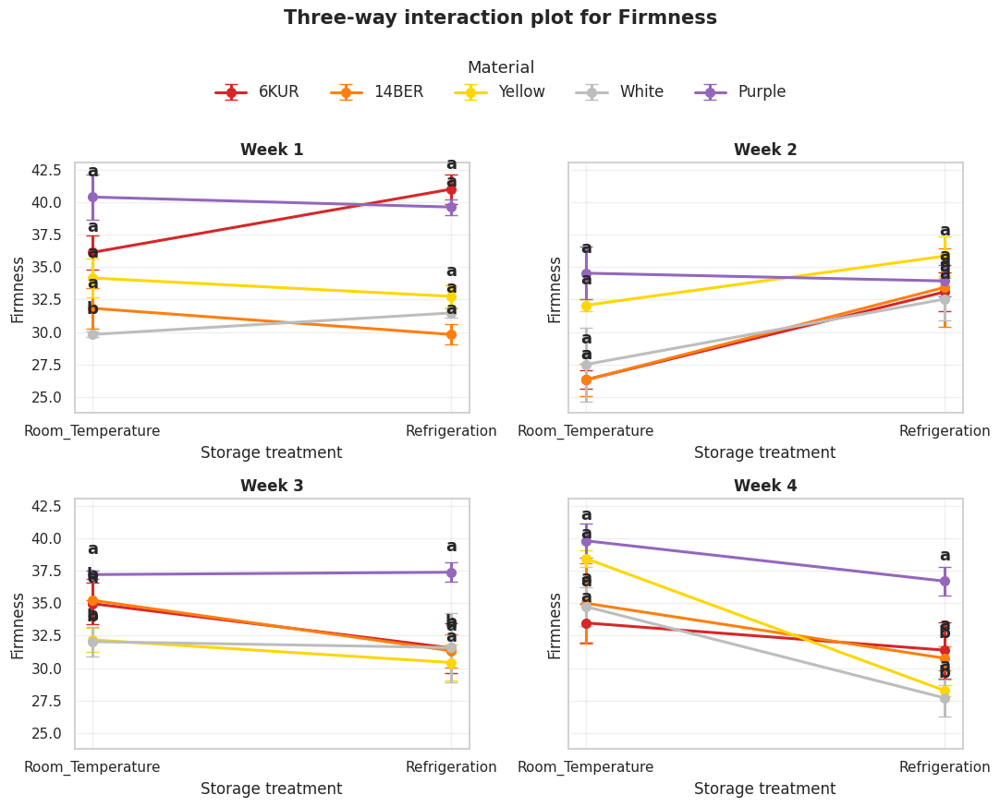

Figura guardada: Interaction_3way_Firmness.png


In [14]:
# ============================================================
# CREAR RESULTADOS ART COMPLETOS + LETRAS + INTERACTION PLOT
# ============================================================

import os
import string
import itertools
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

# =========================
# CONFIGURACIÓN
# =========================
input_file = "Resultados_ART_Zanahoria.xlsx"
variable = "Firmness"   # cambia a: a_star, b_star, Fresh_Weight, Respiration, Firmness, TSS

response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)"
}

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

week_order = ["1", "2", "3", "4"]
treatment_order = ["Room_Temperature", "Refrigeration"]
material_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]

# =========================
# CARGAR DATOS
# =========================
df = pd.read_excel(input_file, sheet_name="Data_Used")

df["Week"] = df["Week"].astype(str)
df["Treatment"] = df["Treatment"].astype(str)
df["Variedad"] = df["Variedad"].astype(str)
df["Repetición"] = df["Repetición"].astype(str)

# =========================
# RPY2: ART + EMMEANS FDR
# =========================
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r("""
options(repos = c(CRAN = "https://cloud.r-project.org"))

pkgs <- c("ARTool", "emmeans")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}

suppressPackageStartupMessages({
  library(ARTool)
  library(emmeans)
})
""")

def run_art_full(df_in, variable):
    df_in = df_in.dropna(subset=["Variedad", "Treatment", "Week", "Repetición", variable]).copy()

    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py"] = df_in

    r_code = f"""
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
    }})

    d <- df_py[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    d$Variedad <- factor(as.character(d$Variedad),
      levels = c("6KUR", "14BER", "Yellow", "White", "Purple"))

    d$Treatment <- factor(as.character(d$Treatment),
      levels = c("Room_Temperature", "Refrigeration"))

    d$Week <- factor(as.character(d$Week),
      levels = c("1", "2", "3", "4"))

    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    mod <- art(as.formula("{variable} ~ Variedad * Treatment * Week"), data = d)

    anova_df <- as.data.frame(anova(mod))
    anova_df$Effect <- rownames(anova_df)
    rownames(anova_df) <- NULL
    anova_df$Variable <- "{variable}"

    if (all(c("F value", "Df", "Df.res") %in% names(anova_df))) {{
      anova_df$partial_eta2 <- (anova_df[["F value"]] * anova_df[["Df"]]) /
                               ((anova_df[["F value"]] * anova_df[["Df"]]) + anova_df[["Df.res"]])
    }} else {{
      anova_df$partial_eta2 <- NA_real_
    }}

    fit <- artlm(mod, "Variedad")
    emm <- emmeans(fit, ~ Variedad | Treatment * Week)

    pairs_df <- as.data.frame(pairs(emm, adjust = "fdr"))
    pairs_df$Variable <- "{variable}"
    """

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_out = ro.conversion.rpy2py(ro.r("anova_df"))
        posthoc_out = ro.conversion.rpy2py(ro.r("pairs_df"))

    return anova_out, posthoc_out

# =========================
# CORRER ART PARA TODAS
# =========================
anova_list = []
posthoc_list = []

for var in response_vars:
    try:
        print(f"Procesando {var}...")
        a, p = run_art_full(df.copy(), var)
        anova_list.append(a)
        posthoc_list.append(p)
        print(f"OK: {var}")
    except Exception as e:
        print(f"Error en {var}: {e}")

anova_final = pd.concat(anova_list, ignore_index=True)
posthoc_final = pd.concat(posthoc_list, ignore_index=True)

anova_final = anova_final.rename(columns={
    "F value": "F_value",
    "Pr(>F)": "p_value"
})

posthoc_final = posthoc_final.rename(columns={
    "p.value": "p_value"
})

# =========================
# GUARDAR EXCEL COMPLETO
# =========================
with pd.ExcelWriter("RESULTADOS_ART_FDR_COMPLETO.xlsx", engine="openpyxl") as writer:
    df.to_excel(writer, sheet_name="Data_Used", index=False)
    anova_final.to_excel(writer, sheet_name="ANOVA_ART", index=False)
    posthoc_final.to_excel(writer, sheet_name="POSTHOC_FDR", index=False)

print("Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx")

# =========================
# GENERAR LETRAS
# =========================
def parse_contrast(txt):
    parts = [p.strip() for p in str(txt).split(" - ")]
    if len(parts) != 2:
        return None, None
    return parts[0], parts[1]

def make_letters(df_panel, posthoc_panel, alpha=0.05):
    groups = [g for g in material_order if g in df_panel["Variedad"].unique()]
    means = df_panel.groupby("Variedad")["Value"].mean()

    pvals = {}
    for _, row in posthoc_panel.iterrows():
        a, b = parse_contrast(row["contrast"])
        if a is not None:
            pvals[frozenset([a, b])] = row["p_value"]

    letters = {g: "" for g in groups}
    current_letter = "a"
    assigned = set()

    sorted_groups = means.reindex(groups).sort_values(ascending=False).index.tolist()

    for g in sorted_groups:
        if g in assigned:
            continue

        letters[g] += current_letter
        assigned.add(g)

        for h in sorted_groups:
            if h == g or h in assigned:
                continue

            p = pvals.get(frozenset([g, h]), np.nan)

            if pd.notna(p) and p >= alpha:
                letters[h] += current_letter
                assigned.add(h)

        current_letter = chr(ord(current_letter) + 1)

    return letters

plot_df = df.melt(
    id_vars=["Week", "Treatment", "Variedad", "Repetición"],
    value_vars=response_vars,
    var_name="Variable",
    value_name="Value"
).dropna()

letters_rows = []

for var in response_vars:
    for treatment in treatment_order:
        for week in week_order:
            df_panel = plot_df[
                (plot_df["Variable"] == var) &
                (plot_df["Treatment"] == treatment) &
                (plot_df["Week"] == week)
            ]

            ph_panel = posthoc_final[
                (posthoc_final["Variable"] == var) &
                (posthoc_final["Treatment"] == treatment) &
                (posthoc_final["Week"] == week)
            ]

            if df_panel.empty:
                continue

            letters_map = make_letters(df_panel, ph_panel)

            for mat, let in letters_map.items():
                letters_rows.append({
                    "Variable": var,
                    "Treatment": treatment,
                    "Week": week,
                    "Variedad": mat,
                    "Letters": let
                })

letters_df = pd.DataFrame(letters_rows)
letters_df.to_excel("LETRAS_ART_FDR_COMPLETO.xlsx", index=False)

print("Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx")

# =========================
# TABLA ANOVA COMPLETA VARIABLE
# =========================
anova_var = anova_final[anova_final["Variable"] == variable].copy()

def format_p(p):
    if p < 0.001:
        return "<0.001 ***"
    elif p < 0.01:
        return f"{p:.3f} **"
    elif p < 0.05:
        return f"{p:.3f} *"
    else:
        return f"{p:.3f}"

def effect_size(x):
    if x >= 0.14:
        return "Large"
    elif x >= 0.06:
        return "Medium"
    else:
        return "Small"

anova_table = anova_var[["Effect", "Df", "Df.res", "F_value", "p_value", "partial_eta2"]].copy()
anova_table["p_value_formatted"] = anova_table["p_value"].apply(format_p)
anova_table["Size"] = anova_table["partial_eta2"].apply(effect_size)

anova_table.to_excel(f"Tabla_ART_completa_{variable}.xlsx", index=False)

print("\nTABLA ART COMPLETA:")
print(anova_table)

# =========================
# GRÁFICA INTERACCIÓN 3 VÍAS
# =========================
sns.set_theme(style="whitegrid")

summary = (
    df.groupby(["Week", "Treatment", "Variedad"], observed=False)[variable]
    .agg(["mean", "std", "count"])
    .reset_index()
)

summary["se"] = summary["std"] / np.sqrt(summary["count"])

fig, axes = plt.subplots(2, 2, figsize=(11, 8), sharey=True)
axes = axes.flatten()

for i, week in enumerate(week_order):
    ax = axes[i]

    sub = summary[summary["Week"] == week].copy()

    for mat in material_order:
        sm = sub[sub["Variedad"] == mat].copy()

        if sm.empty:
            continue

        sm["Treatment"] = pd.Categorical(
            sm["Treatment"],
            categories=treatment_order,
            ordered=True
        )
        sm = sm.sort_values("Treatment")

        ax.errorbar(
            sm["Treatment"],
            sm["mean"],
            yerr=sm["se"],
            marker="o",
            linewidth=2.2,
            capsize=5,
            markersize=7,
            color=palette[mat],
            label=mat
        )

        # Letras
        let_sub = letters_df[
            (letters_df["Variable"] == variable) &
            (letters_df["Week"] == week) &
            (letters_df["Variedad"] == mat)
        ]

        for j, tr in enumerate(treatment_order):
            row = let_sub[let_sub["Treatment"] == tr]
            y_val = sm[sm["Treatment"] == tr]["mean"]

            if not row.empty and len(y_val) > 0:
                ax.text(
                    j,
                    y_val.iloc[0] + 1.3,
                    str(row.iloc[0]["Letters"]),
                    ha="center",
                    va="bottom",
                    fontsize=13,
                    fontweight="bold"
                )

    ax.set_title(f"Week {week}", fontweight="bold")
    ax.set_xlabel("Storage treatment")
    ax.set_ylabel(pretty_labels.get(variable, variable))
    ax.grid(True, alpha=0.3)

handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    title="Material",
    loc="upper center",
    bbox_to_anchor=(0.5, 1.04),
    ncol=5,
    fontsize=12,
    title_fontsize=13,
    frameon=False
)

fig.suptitle(
    f"Three-way interaction plot for {pretty_labels.get(variable, variable)}",
    fontsize=15,
    fontweight="bold",
    y=1.09
)

plt.tight_layout(rect=[0, 0, 1, 0.98])

out_path = f"Interaction_3way_{variable}.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Figura guardada: {out_path}")

Procesando L_star...
OK: L_star
Procesando a_star...
OK: a_star
Procesando b_star...
OK: b_star
Procesando Fresh_Weight...
OK: Fresh_Weight
Procesando Respiration...
OK: Respiration
Procesando Firmness...
OK: Firmness
Procesando TSS...
OK: TSS
Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx
Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx

TABLA ART COMPLETA:
                     Effect    Df  Df.res     F_value       p_value  \
42                 Variedad   4.0    80.0   17.460408  2.463385e-10   
43                Treatment   1.0    80.0  192.016743  5.784425e-23   
44                     Week   3.0    80.0   88.588267  2.367747e-25   
45       Variedad:Treatment   4.0    80.0   14.663236  5.009481e-09   
46            Variedad:Week  12.0    80.0    7.524546  4.297384e-09   
47           Treatment:Week   3.0    80.0   50.262536  2.306658e-18   
48  Variedad:Treatment:Week  12.0    80.0    6.597857  4.727010e-08   

    partial_eta2 p_value_formatted   Size  
42      0.466103        <0.0

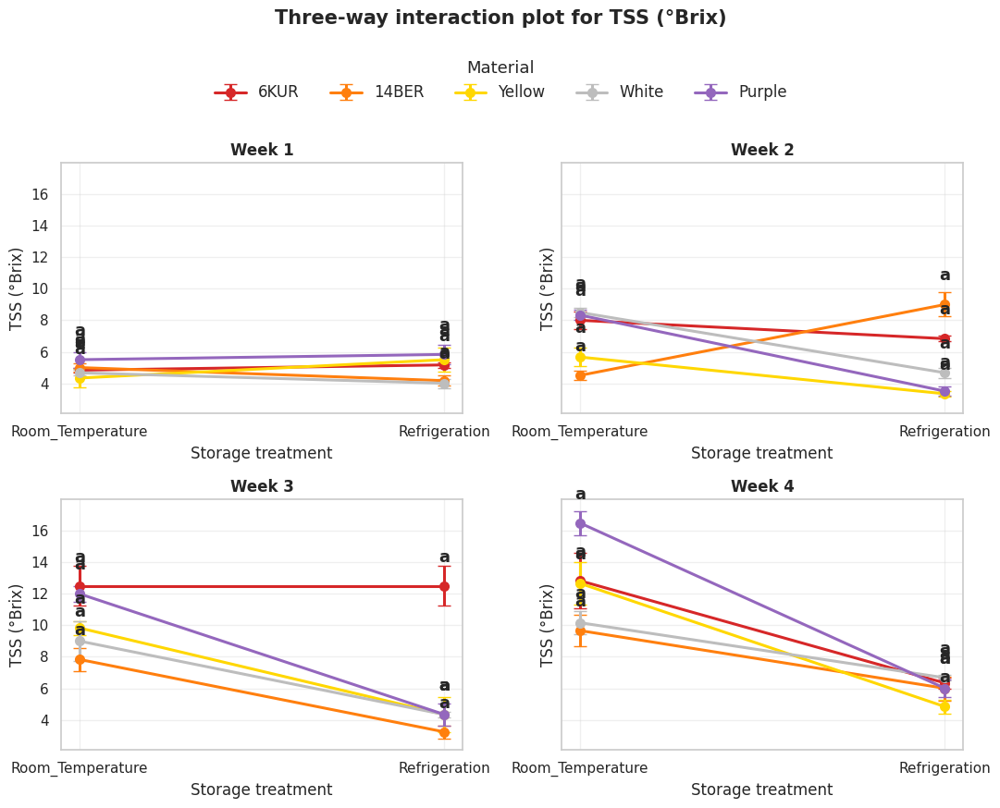

Figura guardada: Interaction_3way_TSS.png


In [15]:
# ============================================================
# CREAR RESULTADOS ART COMPLETOS + LETRAS + INTERACTION PLOT
# ============================================================

import os
import string
import itertools
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

# =========================
# CONFIGURACIÓN
# =========================
input_file = "Resultados_ART_Zanahoria.xlsx"
variable = "TSS"   # cambia a: a_star, b_star, Fresh_Weight, Respiration, Firmness, TSS

response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)"
}

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

week_order = ["1", "2", "3", "4"]
treatment_order = ["Room_Temperature", "Refrigeration"]
material_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]

# =========================
# CARGAR DATOS
# =========================
df = pd.read_excel(input_file, sheet_name="Data_Used")

df["Week"] = df["Week"].astype(str)
df["Treatment"] = df["Treatment"].astype(str)
df["Variedad"] = df["Variedad"].astype(str)
df["Repetición"] = df["Repetición"].astype(str)

# =========================
# RPY2: ART + EMMEANS FDR
# =========================
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r("""
options(repos = c(CRAN = "https://cloud.r-project.org"))

pkgs <- c("ARTool", "emmeans")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}

suppressPackageStartupMessages({
  library(ARTool)
  library(emmeans)
})
""")

def run_art_full(df_in, variable):
    df_in = df_in.dropna(subset=["Variedad", "Treatment", "Week", "Repetición", variable]).copy()

    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py"] = df_in

    r_code = f"""
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
    }})

    d <- df_py[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    d$Variedad <- factor(as.character(d$Variedad),
      levels = c("6KUR", "14BER", "Yellow", "White", "Purple"))

    d$Treatment <- factor(as.character(d$Treatment),
      levels = c("Room_Temperature", "Refrigeration"))

    d$Week <- factor(as.character(d$Week),
      levels = c("1", "2", "3", "4"))

    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    mod <- art(as.formula("{variable} ~ Variedad * Treatment * Week"), data = d)

    anova_df <- as.data.frame(anova(mod))
    anova_df$Effect <- rownames(anova_df)
    rownames(anova_df) <- NULL
    anova_df$Variable <- "{variable}"

    if (all(c("F value", "Df", "Df.res") %in% names(anova_df))) {{
      anova_df$partial_eta2 <- (anova_df[["F value"]] * anova_df[["Df"]]) /
                               ((anova_df[["F value"]] * anova_df[["Df"]]) + anova_df[["Df.res"]])
    }} else {{
      anova_df$partial_eta2 <- NA_real_
    }}

    fit <- artlm(mod, "Variedad")
    emm <- emmeans(fit, ~ Variedad | Treatment * Week)

    pairs_df <- as.data.frame(pairs(emm, adjust = "fdr"))
    pairs_df$Variable <- "{variable}"
    """

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_out = ro.conversion.rpy2py(ro.r("anova_df"))
        posthoc_out = ro.conversion.rpy2py(ro.r("pairs_df"))

    return anova_out, posthoc_out

# =========================
# CORRER ART PARA TODAS
# =========================
anova_list = []
posthoc_list = []

for var in response_vars:
    try:
        print(f"Procesando {var}...")
        a, p = run_art_full(df.copy(), var)
        anova_list.append(a)
        posthoc_list.append(p)
        print(f"OK: {var}")
    except Exception as e:
        print(f"Error en {var}: {e}")

anova_final = pd.concat(anova_list, ignore_index=True)
posthoc_final = pd.concat(posthoc_list, ignore_index=True)

anova_final = anova_final.rename(columns={
    "F value": "F_value",
    "Pr(>F)": "p_value"
})

posthoc_final = posthoc_final.rename(columns={
    "p.value": "p_value"
})

# =========================
# GUARDAR EXCEL COMPLETO
# =========================
with pd.ExcelWriter("RESULTADOS_ART_FDR_COMPLETO.xlsx", engine="openpyxl") as writer:
    df.to_excel(writer, sheet_name="Data_Used", index=False)
    anova_final.to_excel(writer, sheet_name="ANOVA_ART", index=False)
    posthoc_final.to_excel(writer, sheet_name="POSTHOC_FDR", index=False)

print("Archivo creado: RESULTADOS_ART_FDR_COMPLETO.xlsx")

# =========================
# GENERAR LETRAS
# =========================
def parse_contrast(txt):
    parts = [p.strip() for p in str(txt).split(" - ")]
    if len(parts) != 2:
        return None, None
    return parts[0], parts[1]

def make_letters(df_panel, posthoc_panel, alpha=0.05):
    groups = [g for g in material_order if g in df_panel["Variedad"].unique()]
    means = df_panel.groupby("Variedad")["Value"].mean()

    pvals = {}
    for _, row in posthoc_panel.iterrows():
        a, b = parse_contrast(row["contrast"])
        if a is not None:
            pvals[frozenset([a, b])] = row["p_value"]

    letters = {g: "" for g in groups}
    current_letter = "a"
    assigned = set()

    sorted_groups = means.reindex(groups).sort_values(ascending=False).index.tolist()

    for g in sorted_groups:
        if g in assigned:
            continue

        letters[g] += current_letter
        assigned.add(g)

        for h in sorted_groups:
            if h == g or h in assigned:
                continue

            p = pvals.get(frozenset([g, h]), np.nan)

            if pd.notna(p) and p >= alpha:
                letters[h] += current_letter
                assigned.add(h)

        current_letter = chr(ord(current_letter) + 1)

    return letters

plot_df = df.melt(
    id_vars=["Week", "Treatment", "Variedad", "Repetición"],
    value_vars=response_vars,
    var_name="Variable",
    value_name="Value"
).dropna()

letters_rows = []

for var in response_vars:
    for treatment in treatment_order:
        for week in week_order:
            df_panel = plot_df[
                (plot_df["Variable"] == var) &
                (plot_df["Treatment"] == treatment) &
                (plot_df["Week"] == week)
            ]

            ph_panel = posthoc_final[
                (posthoc_final["Variable"] == var) &
                (posthoc_final["Treatment"] == treatment) &
                (posthoc_final["Week"] == week)
            ]

            if df_panel.empty:
                continue

            letters_map = make_letters(df_panel, ph_panel)

            for mat, let in letters_map.items():
                letters_rows.append({
                    "Variable": var,
                    "Treatment": treatment,
                    "Week": week,
                    "Variedad": mat,
                    "Letters": let
                })

letters_df = pd.DataFrame(letters_rows)
letters_df.to_excel("LETRAS_ART_FDR_COMPLETO.xlsx", index=False)

print("Archivo creado: LETRAS_ART_FDR_COMPLETO.xlsx")

# =========================
# TABLA ANOVA COMPLETA VARIABLE
# =========================
anova_var = anova_final[anova_final["Variable"] == variable].copy()

def format_p(p):
    if p < 0.001:
        return "<0.001 ***"
    elif p < 0.01:
        return f"{p:.3f} **"
    elif p < 0.05:
        return f"{p:.3f} *"
    else:
        return f"{p:.3f}"

def effect_size(x):
    if x >= 0.14:
        return "Large"
    elif x >= 0.06:
        return "Medium"
    else:
        return "Small"

anova_table = anova_var[["Effect", "Df", "Df.res", "F_value", "p_value", "partial_eta2"]].copy()
anova_table["p_value_formatted"] = anova_table["p_value"].apply(format_p)
anova_table["Size"] = anova_table["partial_eta2"].apply(effect_size)

anova_table.to_excel(f"Tabla_ART_completa_{variable}.xlsx", index=False)

print("\nTABLA ART COMPLETA:")
print(anova_table)

# =========================
# GRÁFICA INTERACCIÓN 3 VÍAS
# =========================
sns.set_theme(style="whitegrid")

summary = (
    df.groupby(["Week", "Treatment", "Variedad"], observed=False)[variable]
    .agg(["mean", "std", "count"])
    .reset_index()
)

summary["se"] = summary["std"] / np.sqrt(summary["count"])

fig, axes = plt.subplots(2, 2, figsize=(11, 8), sharey=True)
axes = axes.flatten()

for i, week in enumerate(week_order):
    ax = axes[i]

    sub = summary[summary["Week"] == week].copy()

    for mat in material_order:
        sm = sub[sub["Variedad"] == mat].copy()

        if sm.empty:
            continue

        sm["Treatment"] = pd.Categorical(
            sm["Treatment"],
            categories=treatment_order,
            ordered=True
        )
        sm = sm.sort_values("Treatment")

        ax.errorbar(
            sm["Treatment"],
            sm["mean"],
            yerr=sm["se"],
            marker="o",
            linewidth=2.2,
            capsize=5,
            markersize=7,
            color=palette[mat],
            label=mat
        )

        # Letras
        let_sub = letters_df[
            (letters_df["Variable"] == variable) &
            (letters_df["Week"] == week) &
            (letters_df["Variedad"] == mat)
        ]

        for j, tr in enumerate(treatment_order):
            row = let_sub[let_sub["Treatment"] == tr]
            y_val = sm[sm["Treatment"] == tr]["mean"]

            if not row.empty and len(y_val) > 0:
                ax.text(
                    j,
                    y_val.iloc[0] + 1.3,
                    str(row.iloc[0]["Letters"]),
                    ha="center",
                    va="bottom",
                    fontsize=13,
                    fontweight="bold"
                )

    ax.set_title(f"Week {week}", fontweight="bold")
    ax.set_xlabel("Storage treatment")
    ax.set_ylabel(pretty_labels.get(variable, variable))
    ax.grid(True, alpha=0.3)

handles, labels = axes[0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    title="Material",
    loc="upper center",
    bbox_to_anchor=(0.5, 1.04),
    ncol=5,
    fontsize=12,
    title_fontsize=13,
    frameon=False
)

fig.suptitle(
    f"Three-way interaction plot for {pretty_labels.get(variable, variable)}",
    fontsize=15,
    fontweight="bold",
    y=1.09
)

plt.tight_layout(rect=[0, 0, 1, 0.98])

out_path = f"Interaction_3way_{variable}.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Figura guardada: {out_path}")

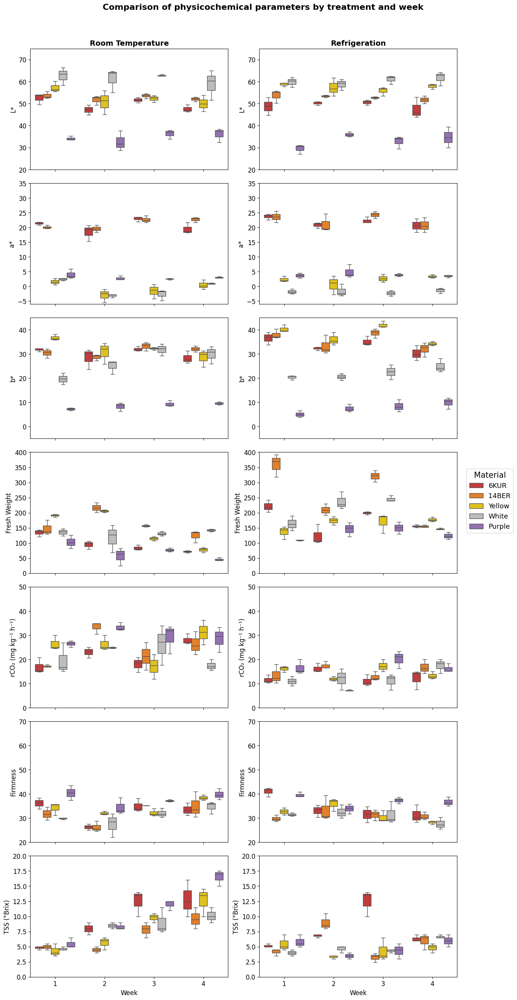

Guardado: figuras_panel_completo/Panel_completo_boxplots.png


In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# =========================
# ESTILO
# =========================
sns.set_theme(style="whitegrid")
plt.style.use("default")
plt.rcParams["font.size"] = 12
plt.rcParams["axes.titlesize"] = 13
plt.rcParams["axes.titleweight"] = "bold"

# =========================
# PALETA
# =========================
palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",   # amarillo
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

# =========================
# CARGAR DATOS
# =========================
file_path = "Resultados_ART_Zanahoria.xlsx"
data_used = pd.read_excel(file_path, sheet_name="Data_Used")

data_used["Week"] = data_used["Week"].astype(str)

# =========================
# ETIQUETAS
# =========================
pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)",
    "TTA": "TTA (%)"
}

# =========================
# ESCALAS FIJAS
# =========================
y_limits = {
    "Respiration": (0, 50),
    "Firmness": (20, 70),
    "TTA": (0, 1),
    "TSS": (0, 20),
    "Fresh_Weight": (0, 400),
    "b_star": (-5, 45),
    "L_star": (20, 75),
    "a_star": (-6, 35)
}

# =========================
# VARIABLES
# =========================
response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

order_weeks = ["1", "2", "3", "4"]
hue_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]
treatments = ["Room_Temperature", "Refrigeration"]

os.makedirs("figuras_panel_completo", exist_ok=True)

# =========================
# FORMATO LARGO
# =========================
plot_df = data_used.melt(
    id_vars=["Week", "Treatment", "Variedad", "Repetición"],
    value_vars=response_vars,
    var_name="Variable",
    value_name="Value"
).dropna()

# =========================
# FIGURA
# =========================
n_rows = len(response_vars)

fig, axes = plt.subplots(
    n_rows, 2,
    figsize=(14, 3.8 * n_rows),
    sharex=True,
    sharey=False
)

if n_rows == 1:
    axes = [axes]

for r, variable in enumerate(response_vars):
    for c, treatment in enumerate(treatments):
        ax = axes[r][c]

        sub = plot_df[
            (plot_df["Variable"] == variable) &
            (plot_df["Treatment"] == treatment)
        ].copy()

        sns.boxplot(
            data=sub,
            x="Week",
            y="Value",
            hue="Variedad",
            palette=palette,
            order=order_weeks,
            hue_order=hue_order,
            ax=ax,
            fliersize=3,
            linewidth=1
        )

        if r == 0:
            ax.set_title(treatment.replace("_", " "), fontsize=14, fontweight="bold")
        else:
            ax.set_title("")

        ax.set_xlabel("Week" if r == n_rows - 1 else "")
        ax.set_ylabel(pretty_labels.get(variable, variable))

        if variable in y_limits:
            ax.set_ylim(y_limits[variable])

        if ax.legend_ is not None:
            ax.legend_.remove()

# =========================
# LEYENDA
# =========================
handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title="Material",
    loc="center right",
    bbox_to_anchor=(0.98, 0.5),
    fontsize=13,
    title_fontsize=15,
    frameon=True
)

# =========================
# TÍTULO GENERAL
# =========================
fig.suptitle(
    "Comparison of physicochemical parameters by treatment and week",
    fontsize=16,
    fontweight="bold",
    y=0.995
)

plt.tight_layout(rect=[0, 0, 0.88, 0.98])

out_path = "figuras_panel_completo/Panel_completo_boxplots.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Guardado: {out_path}")

(as ‘lib’ is unspecified)




































































	‘/tmp/RtmpHwUYxd/downloaded_packages’

(as ‘lib’ is unspecified)
















	‘/tmp/RtmpHwUYxd/downloaded_packages’


 

 

 

 

 

 

 

 

 

  no applicable method for 'cld' applied to an object of class "emmGrid"



Sacando letras ART para: L_star
No se pudieron generar letras para L_star: Error in UseMethod("cld") : 
  no applicable method for 'cld' applied to an object of class "emmGrid"

Sacando letras ART para: a_star


  no applicable method for 'cld' applied to an object of class "emmGrid"

  no applicable method for 'cld' applied to an object of class "emmGrid"



No se pudieron generar letras para a_star: Error in UseMethod("cld") : 
  no applicable method for 'cld' applied to an object of class "emmGrid"

Sacando letras ART para: b_star
No se pudieron generar letras para b_star: Error in UseMethod("cld") : 
  no applicable method for 'cld' applied to an object of class "emmGrid"

Sacando letras ART para: Fresh_Weight


  no applicable method for 'cld' applied to an object of class "emmGrid"



No se pudieron generar letras para Fresh_Weight: Error in UseMethod("cld") : 
  no applicable method for 'cld' applied to an object of class "emmGrid"

Sacando letras ART para: Respiration


  no applicable method for 'cld' applied to an object of class "emmGrid"

  no applicable method for 'cld' applied to an object of class "emmGrid"



No se pudieron generar letras para Respiration: Error in UseMethod("cld") : 
  no applicable method for 'cld' applied to an object of class "emmGrid"

Sacando letras ART para: Firmness
No se pudieron generar letras para Firmness: Error in UseMethod("cld") : 
  no applicable method for 'cld' applied to an object of class "emmGrid"

Sacando letras ART para: TSS


  no applicable method for 'cld' applied to an object of class "emmGrid"



No se pudieron generar letras para TSS: Error in UseMethod("cld") : 
  no applicable method for 'cld' applied to an object of class "emmGrid"



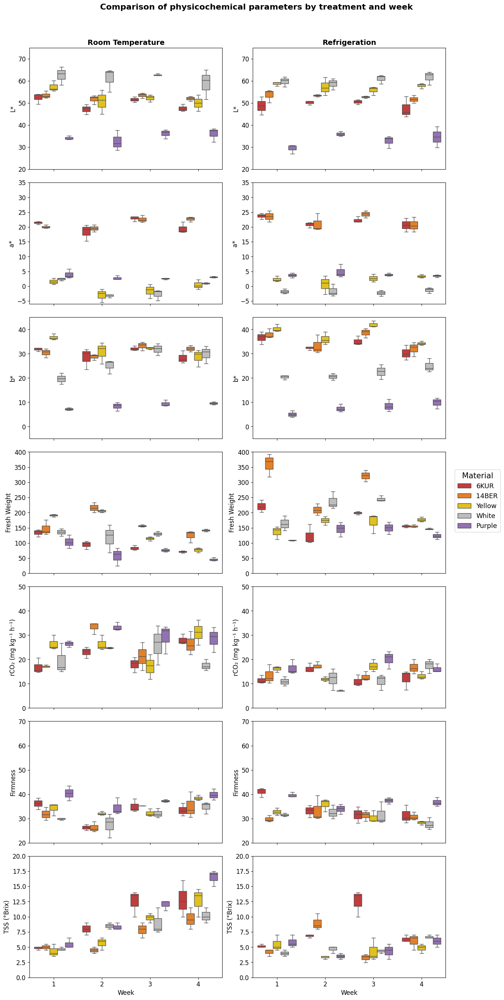

Guardado: figuras_panel_completo/Panel_completo_boxplots_con_letras_ART.png
Guardado: letras_ART_por_variable.xlsx
L_star: 0 filas
a_star: 0 filas
b_star: 0 filas
Fresh_Weight: 0 filas
Respiration: 0 filas
Firmness: 0 filas
TSS: 0 filas


In [19]:
# ============================================================
# BLOQUE COMPLETO: FIGURA MULTIPANEL + LETRAS DESDE ART
# ============================================================

# Si hace falta:
# !pip install pandas openpyxl seaborn matplotlib rpy2

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# =========================
# rpy2 / R
# =========================
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r(r'''
options(repos = c(CRAN = "https://cloud.r-project.org"))
pkgs <- c("ARTool", "emmeans", "multcomp", "multcompView")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}
suppressPackageStartupMessages({
  library(ARTool)
  library(emmeans)
  library(multcomp)
  library(multcompView)
})
''')

# =========================
# ESTILO
# =========================
sns.set_theme(style="whitegrid")
plt.style.use("default")
plt.rcParams["font.size"] = 12
plt.rcParams["axes.titlesize"] = 13
plt.rcParams["axes.titleweight"] = "bold"

# =========================
# PALETA
# =========================
palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

# =========================
# CARGAR DATOS
# =========================
file_path = "Resultados_ART_Zanahoria.xlsx"
data_used = pd.read_excel(file_path, sheet_name="Data_Used")

data_used["Week"] = data_used["Week"].astype(str)
data_used["Treatment"] = data_used["Treatment"].astype(str)
data_used["Variedad"] = data_used["Variedad"].astype(str)
data_used["Repetición"] = data_used["Repetición"].astype(str)

# =========================
# ETIQUETAS
# =========================
pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)",
    "TTA": "TTA (%)"
}

# =========================
# ESCALAS FIJAS
# =========================
y_limits = {
    "Respiration": (0, 50),
    "Firmness": (20, 70),
    "TTA": (0, 1),
    "TSS": (0, 20),
    "Fresh_Weight": (0, 400),
    "b_star": (-5, 45),
    "L_star": (20, 75),
    "a_star": (-6, 35)
}

# =========================
# VARIABLES
# =========================
# TTA fuera porque en tu corrida falló
response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

order_weeks = ["1", "2", "3", "4"]
hue_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]
treatments = ["Room_Temperature", "Refrigeration"]

# =========================
# FUNCIÓN: sacar letras con ART
# Comparación: Variedad | Treatment * Week
# =========================
def get_art_letters(df, variable):
    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py_letters"] = df

    r_code = f'''
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
      library(multcomp)
      library(multcompView)
    }})

    df <- df_py_letters[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    df <- df[!is.na(df[["{variable}"]]), ]
    df <- droplevels(df)

    df$Variedad <- factor(df$Variedad, levels = c("6KUR", "14BER", "Yellow", "White", "Purple"))
    df$Treatment <- factor(df$Treatment, levels = c("Room_Temperature", "Refrigeration"))
    df$Week <- factor(df$Week, levels = c("1","2","3","4"))

    mod <- art(as.formula("{variable} ~ Variedad * Treatment * Week"), data = df)
    fit_var <- artlm(mod, "Variedad")
    emm <- emmeans(fit_var, ~ Variedad | Treatment * Week)

    letters_df <- as.data.frame(multcomp::cld(
      emm,
      adjust = "bonferroni",
      Letters = letters,
      alpha = 0.05
    ))

    letters_df$.group <- trimws(letters_df$.group)
    '''

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        letters_df = ro.conversion.rpy2py(ro.r("letters_df"))

    letters_df["Week"] = letters_df["Week"].astype(str)
    letters_df["Treatment"] = letters_df["Treatment"].astype(str)
    letters_df["Variedad"] = letters_df["Variedad"].astype(str)
    return letters_df

# =========================
# SACAR LETRAS
# =========================
letters_dict = {}
for var in response_vars:
    try:
        print(f"Sacando letras ART para: {var}")
        letters_dict[var] = get_art_letters(data_used.copy(), var)
        print(f"OK: {var} ({len(letters_dict[var])} filas)")
    except Exception as e:
        print(f"No se pudieron generar letras para {var}: {e}")
        letters_dict[var] = pd.DataFrame()

# =========================
# FORMATO LARGO
# =========================
plot_df = data_used.melt(
    id_vars=["Week", "Treatment", "Variedad", "Repetición"],
    value_vars=response_vars,
    var_name="Variable",
    value_name="Value"
).dropna()

# =========================
# FUNCIÓN POSICIONES X
# =========================
def compute_box_centers(n_weeks, n_hues, group_width=0.8):
    centers = {}
    box_width = group_width / n_hues
    for wi in range(n_weeks):
        for hi in range(n_hues):
            centers[(wi, hi)] = wi - group_width/2 + box_width/2 + hi*box_width
    return centers

# =========================
# FIGURA
# =========================
n_rows = len(response_vars)

fig, axes = plt.subplots(
    n_rows, 2,
    figsize=(14, 3.9 * n_rows),
    sharex=True,
    sharey=False
)

if n_rows == 1:
    axes = np.array([axes])

for r, variable in enumerate(response_vars):
    for c, treatment in enumerate(treatments):
        ax = axes[r][c]

        sub = plot_df[
            (plot_df["Variable"] == variable) &
            (plot_df["Treatment"] == treatment)
        ].copy()

        sns.boxplot(
            data=sub,
            x="Week",
            y="Value",
            hue="Variedad",
            palette=palette,
            order=order_weeks,
            hue_order=hue_order,
            ax=ax,
            fliersize=3,
            linewidth=1,
            dodge=True
        )

        if r == 0:
            ax.set_title(treatment.replace("_", " "), fontsize=14, fontweight="bold")
        else:
            ax.set_title("")

        ax.set_xlabel("Week" if r == n_rows - 1 else "")
        ax.set_ylabel(pretty_labels.get(variable, variable))

        if variable in y_limits:
            ax.set_ylim(y_limits[variable])

        if ax.legend_ is not None:
            ax.legend_.remove()

        # =========================
        # LETRAS
        # =========================
        letters_df = letters_dict.get(variable, pd.DataFrame())
        if not letters_df.empty:
            n_weeks = len(order_weeks)
            n_hues = len(hue_order)
            centers = compute_box_centers(n_weeks, n_hues, group_width=0.8)

            y0, y1 = ax.get_ylim()
            y_range = y1 - y0
            offset = 0.03 * y_range

            for wi, week in enumerate(order_weeks):
                sub_week = sub[sub["Week"] == week].copy()
                if sub_week.empty:
                    continue

                let_week = letters_df[
                    (letters_df["Treatment"] == treatment) &
                    (letters_df["Week"] == week)
                ].copy()

                if let_week.empty:
                    continue

                for hi, mat in enumerate(hue_order):
                    mat_data = sub_week[sub_week["Variedad"] == mat]["Value"].dropna()
                    if mat_data.empty:
                        continue

                    let_row = let_week[let_week["Variedad"] == mat]
                    if let_row.empty:
                        continue

                    letter = str(let_row.iloc[0][".group"]).strip()
                    if letter == "":
                        continue

                    q1 = np.percentile(mat_data, 25)
                    q3 = np.percentile(mat_data, 75)
                    iqr = q3 - q1
                    upper_bound = q3 + 1.5 * iqr
                    valid = mat_data[mat_data <= upper_bound]
                    y_text = (valid.max() if len(valid) > 0 else mat_data.max()) + offset

                    x_text = centers[(wi, hi)]
                    y_text = min(y_text, y1 - 0.01 * y_range)

                    ax.text(
                        x_text, y_text, letter,
                        ha="center", va="bottom",
                        fontsize=10, fontweight="bold", color="black"
                    )

# =========================
# LEYENDA
# =========================
handles, labels = axes[0][0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    title="Material",
    loc="center right",
    bbox_to_anchor=(0.98, 0.5),
    fontsize=13,
    title_fontsize=15,
    frameon=True
)

# =========================
# TÍTULO GENERAL
# =========================
fig.suptitle(
    "Comparison of physicochemical parameters by treatment and week",
    fontsize=16,
    fontweight="bold",
    y=0.995
)

plt.tight_layout(rect=[0, 0, 0.88, 0.98])

# =========================
# GUARDAR FIGURA
# =========================
os.makedirs("figuras_panel_completo", exist_ok=True)
out_path = "figuras_panel_completo/Panel_completo_boxplots_con_letras_ART.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Guardado: {out_path}")

# =========================
# GUARDAR LETRAS A EXCEL
# =========================
has_data = False
with pd.ExcelWriter("letras_ART_por_variable.xlsx", engine="openpyxl") as writer:
    for var, df_let in letters_dict.items():
        if isinstance(df_let, pd.DataFrame) and not df_let.empty:
            sheet = var[:31]
            df_let.to_excel(writer, sheet_name=sheet, index=False)
            has_data = True

    if not has_data:
        pd.DataFrame({"Info": ["No se generaron letras ART"]}).to_excel(
            writer, sheet_name="Info", index=False
        )

print("Guardado: letras_ART_por_variable.xlsx")

# =========================
# RESUMEN
# =========================
for k, v in letters_dict.items():
    n = 0 if not isinstance(v, pd.DataFrame) else len(v)
    print(f"{k}: {n} filas")

Procesando ART para L_star...
OK: L_star
Procesando ART para a_star...
OK: a_star
Procesando ART para b_star...
OK: b_star
Procesando ART para Fresh_Weight...
OK: Fresh_Weight
Procesando ART para Respiration...
OK: Respiration
Procesando ART para Firmness...
OK: Firmness
Procesando ART para TSS...
OK: TSS
Guardado: RESULTADOS_ART_FDR_COMPLETO.xlsx
Guardado: LETRAS_ART_FDR_COMPLETO.xlsx


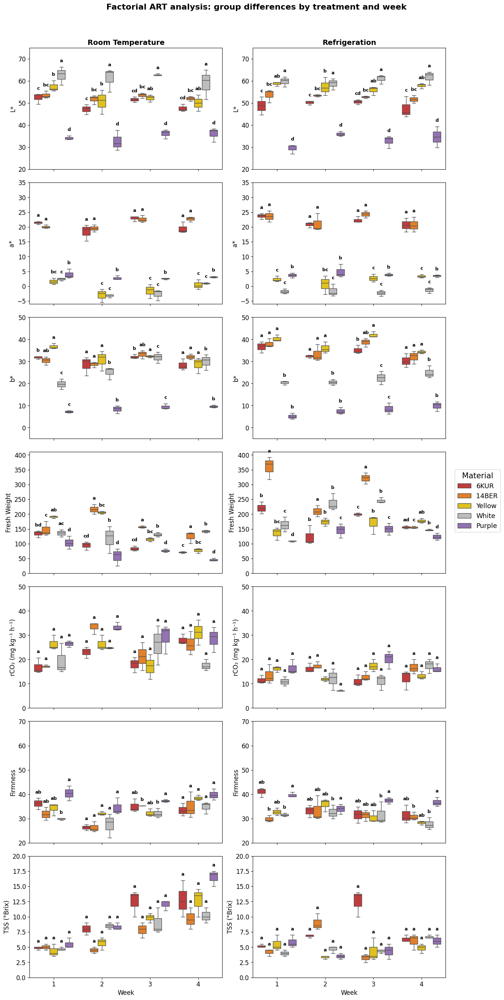

Guardado: figuras_factorial/boxplot_factorial_ART_FDR_letras.png


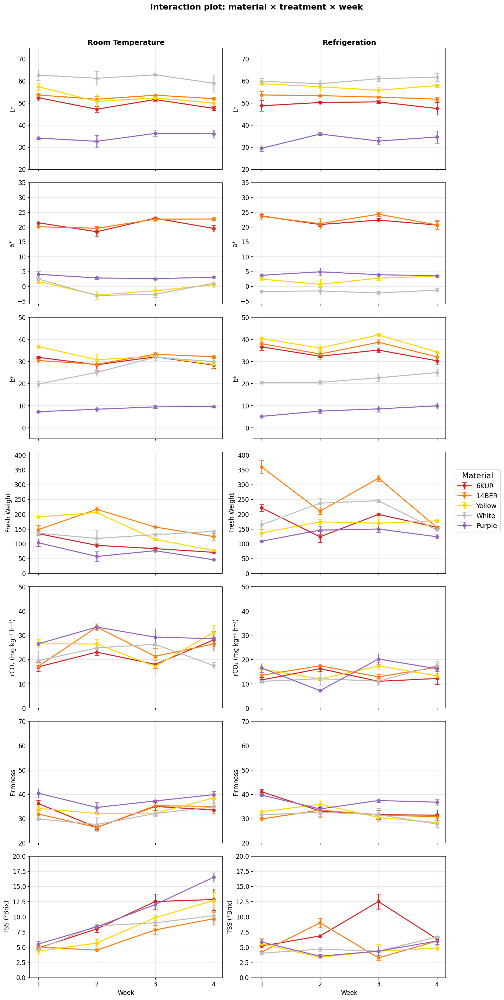

Guardado: figuras_factorial/interaction_plot_factorial_ART_FDR.png

ANOVA ART:
                 Term    Df  Df.res         Sum Sq     Sum Sq.res     F_value  \
0            Variedad   4.0    80.0  124005.750000   19377.000000  127.992723   
1           Treatment   1.0    80.0     720.300000  139628.000000    0.412697   
2                Week   3.0    80.0    8635.250000  131970.000000    1.744892   
3  Variedad:Treatment   4.0    80.0   27466.033333  113319.333333    4.847546   
4       Variedad:Week  12.0    80.0   28475.150000  113618.000000    1.670812   

        p_value              Effect Variable  partial_eta2  
0  6.066890e-34            Variedad   L_star      0.864858  
1  5.224408e-01           Treatment   L_star      0.005132  
2  1.644861e-01                Week   L_star      0.061415  
3  1.494594e-03  Variedad:Treatment   L_star      0.195092  
4  8.917519e-02       Variedad:Week   L_star      0.200398  

POSTHOC FDR:
         contrast         Treatment Week   estimate   

In [22]:
# ============================================================
# ART FACTORIAL + POSTHOC FDR + LETRAS + FIGURAS
# SIN depender de archivo de letras
# ============================================================

# !pip install pandas openpyxl seaborn matplotlib rpy2

import os
import string
import itertools
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

# ============================================================
# CONFIGURACIÓN
# ============================================================

sns.set_theme(style="whitegrid")
plt.style.use("default")

plt.rcParams["font.size"] = 12
plt.rcParams["axes.titlesize"] = 13
plt.rcParams["axes.titleweight"] = "bold"

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)"
}

y_limits = {
    "Respiration": (0, 50),
    "Firmness": (20, 70),
    "TSS": (0, 20),
    "Fresh_Weight": (0, 410),
    "b_star": (-5, 50),
    "L_star": (20, 75),
    "a_star": (-6, 35)
}

response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

order_weeks = ["1", "2", "3", "4"]
hue_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]
treatments = ["Room_Temperature", "Refrigeration"]

# ============================================================
# CARGAR DATOS
# ============================================================

data_file = "Resultados_ART_Zanahoria.xlsx"
df = pd.read_excel(data_file, sheet_name="Data_Used")

df["Week"] = df["Week"].astype(str)
df["Treatment"] = df["Treatment"].astype(str)
df["Variedad"] = df["Variedad"].astype(str)
df["Repetición"] = df["Repetición"].astype(str)

# ============================================================
# RPY2: ART + EMMEANS + FDR
# ============================================================

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r("""
options(repos = c(CRAN = "https://cloud.r-project.org"))

pkgs <- c("ARTool", "emmeans")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}

suppressPackageStartupMessages({
  library(ARTool)
  library(emmeans)
})
""")

def run_art_posthoc_fdr(df_in, variable):
    df_in = df_in.copy()
    df_in = df_in.dropna(subset=["Variedad", "Treatment", "Week", "Repetición", variable])

    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py"] = df_in

    r_code = f"""
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
    }})

    d <- df_py[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    d$Variedad <- factor(as.character(d$Variedad),
      levels = c("6KUR", "14BER", "Yellow", "White", "Purple"))

    d$Treatment <- factor(as.character(d$Treatment),
      levels = c("Room_Temperature", "Refrigeration"))

    d$Week <- factor(as.character(d$Week),
      levels = c("1", "2", "3", "4"))

    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    mod <- art(as.formula("{variable} ~ Variedad * Treatment * Week"), data = d)

    anova_df <- as.data.frame(anova(mod))
    anova_df$Effect <- rownames(anova_df)
    rownames(anova_df) <- NULL
    anova_df$Variable <- "{variable}"

    if (all(c("F value", "Df", "Df.res") %in% names(anova_df))) {{
      anova_df$partial_eta2 <- (anova_df[["F value"]] * anova_df[["Df"]]) /
                               ((anova_df[["F value"]] * anova_df[["Df"]]) + anova_df[["Df.res"]])
    }} else {{
      anova_df$partial_eta2 <- NA_real_
    }}

    fit <- artlm(mod, "Variedad")
    emm <- emmeans(fit, ~ Variedad | Treatment * Week)

    pairs_df <- as.data.frame(pairs(emm, adjust = "fdr"))
    pairs_df$Variable <- "{variable}"
    """

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_out = ro.conversion.rpy2py(ro.r("anova_df"))
        posthoc_out = ro.conversion.rpy2py(ro.r("pairs_df"))

    return anova_out, posthoc_out

# ============================================================
# CORRER ART
# ============================================================

anova_list = []
posthoc_list = []

for var in response_vars:
    try:
        print(f"Procesando ART para {var}...")
        a, p = run_art_posthoc_fdr(df.copy(), var)
        anova_list.append(a)
        posthoc_list.append(p)
        print(f"OK: {var}")
    except Exception as e:
        print(f"Error en {var}: {e}")

anova_final = pd.concat(anova_list, ignore_index=True)
posthoc_final = pd.concat(posthoc_list, ignore_index=True)

anova_final = anova_final.rename(columns={
    "F value": "F_value",
    "Pr(>F)": "p_value"
})

posthoc_final = posthoc_final.rename(columns={
    "p.value": "p_value"
})

# ============================================================
# GUARDAR RESULTADOS
# ============================================================

with pd.ExcelWriter("RESULTADOS_ART_FDR_COMPLETO.xlsx", engine="openpyxl") as writer:
    df.to_excel(writer, sheet_name="Data_Used", index=False)
    anova_final.to_excel(writer, sheet_name="ANOVA_ART", index=False)
    posthoc_final.to_excel(writer, sheet_name="POSTHOC_FDR", index=False)

print("Guardado: RESULTADOS_ART_FDR_COMPLETO.xlsx")

# ============================================================
# GENERAR LETRAS DESDE POSTHOC
# ============================================================

def parse_contrast(txt):
    parts = [p.strip() for p in str(txt).split(" - ")]
    if len(parts) != 2:
        return None, None
    return parts[0], parts[1]

def bron_kerbosch(R, P, X, neighbors, cliques):
    if not P and not X:
        cliques.append(R)
        return

    for v in list(P):
        bron_kerbosch(
            R | {v},
            P & neighbors[v],
            X & neighbors[v],
            neighbors,
            cliques
        )
        P.remove(v)
        X.add(v)

def maximal_cliques_from_nonsig(groups, nonsig_pairs):
    neighbors = {g: set() for g in groups}

    for a, b in nonsig_pairs:
        neighbors[a].add(b)
        neighbors[b].add(a)

    cliques = []
    bron_kerbosch(set(), set(groups), set(), neighbors, cliques)

    for g in groups:
        if not any(g in c for c in cliques):
            cliques.append({g})

    return sorted(cliques, key=lambda c: (-len(c), sorted(list(c))))

def make_letters_for_panel(df_panel, posthoc_panel, alpha=0.05):
    groups_present = [g for g in hue_order if g in df_panel["Variedad"].unique()]

    if len(groups_present) == 0:
        return {}

    means = (
        df_panel.groupby("Variedad", observed=False)["Value"]
        .mean()
        .reindex(groups_present)
    )

    pvals = {}

    for _, row in posthoc_panel.iterrows():
        a, b = parse_contrast(row["contrast"])
        if a is None:
            continue
        pvals[frozenset([a, b])] = row["p_value"]

    nonsig_pairs = set()

    for a, b in itertools.combinations(groups_present, 2):
        p = pvals.get(frozenset([a, b]), np.nan)

        if pd.notna(p) and p >= alpha:
            nonsig_pairs.add((a, b))

    cliques = maximal_cliques_from_nonsig(groups_present, nonsig_pairs)

    def clique_mean(c):
        vals = [means[g] for g in c if pd.notna(means[g])]
        return np.mean(vals) if len(vals) else -np.inf

    cliques = sorted(cliques, key=lambda c: (-clique_mean(c), -len(c)))

    letters_pool = list(string.ascii_lowercase)
    letters_pool += [f"a{i}" for i in range(1, 100)]

    group_letters = {g: "" for g in groups_present}

    for i, clique in enumerate(cliques):
        letter = letters_pool[i]
        for g in clique:
            group_letters[g] += letter

    next_idx = len(cliques)

    for g in groups_present:
        if group_letters[g] == "":
            group_letters[g] = letters_pool[next_idx]
            next_idx += 1

    for g in group_letters:
        uniq = []
        for ch in group_letters[g]:
            if ch not in uniq:
                uniq.append(ch)
        group_letters[g] = "".join(uniq)

    return group_letters

# ============================================================
# DATA LARGA
# ============================================================

plot_df = df.melt(
    id_vars=["Week", "Treatment", "Variedad", "Repetición"],
    value_vars=response_vars,
    var_name="Variable",
    value_name="Value"
).dropna()

letters_rows = []

for variable in response_vars:
    for treatment in treatments:
        for week in order_weeks:

            df_panel = plot_df[
                (plot_df["Variable"] == variable) &
                (plot_df["Treatment"] == treatment) &
                (plot_df["Week"] == week)
            ].copy()

            ph_panel = posthoc_final[
                (posthoc_final["Variable"] == variable) &
                (posthoc_final["Treatment"] == treatment) &
                (posthoc_final["Week"] == week)
            ].copy()

            if df_panel.empty:
                continue

            letters_map = make_letters_for_panel(df_panel, ph_panel, alpha=0.05)

            for material, letter in letters_map.items():
                letters_rows.append({
                    "Variable": variable,
                    "Treatment": treatment,
                    "Week": week,
                    "Variedad": material,
                    "Letters": letter
                })

letters_df = pd.DataFrame(letters_rows)
letters_df.to_excel("LETRAS_ART_FDR_COMPLETO.xlsx", index=False)

print("Guardado: LETRAS_ART_FDR_COMPLETO.xlsx")

# ============================================================
# FUNCIONES PARA GRAFICAR
# ============================================================

def compute_box_centers(n_weeks, n_hues, group_width=0.8):
    centers = {}
    box_width = group_width / n_hues

    for wi in range(n_weeks):
        for hi in range(n_hues):
            centers[(wi, hi)] = wi - group_width / 2 + box_width / 2 + hi * box_width

    return centers

def add_letters(ax, sub, letters_df, variable, treatment):
    let_sub = letters_df[
        (letters_df["Variable"] == variable) &
        (letters_df["Treatment"] == treatment)
    ].copy()

    if let_sub.empty:
        return

    centers = compute_box_centers(len(order_weeks), len(hue_order), group_width=0.8)

    y0, y1 = ax.get_ylim()
    y_range = y1 - y0
    offset = 0.03 * y_range

    for wi, week in enumerate(order_weeks):
        sub_week = sub[sub["Week"] == week].copy()
        letters_week = let_sub[let_sub["Week"] == week].copy()

        if sub_week.empty or letters_week.empty:
            continue

        for hi, material in enumerate(hue_order):
            values = sub_week[sub_week["Variedad"] == material]["Value"].dropna()

            if values.empty:
                continue

            row = letters_week[letters_week["Variedad"] == material]

            if row.empty:
                continue

            letter = str(row.iloc[0]["Letters"]).strip()

            if letter == "" or letter.lower() == "nan":
                continue

            q1 = np.percentile(values, 25)
            q3 = np.percentile(values, 75)
            iqr = q3 - q1
            upper_bound = q3 + 1.5 * iqr
            valid = values[values <= upper_bound]

            y_text = (valid.max() if len(valid) > 0 else values.max()) + offset
            y_text = min(y_text, y1 - 0.01 * y_range)

            x_text = centers[(wi, hi)]

            ax.text(
                x_text,
                y_text,
                letter,
                ha="center",
                va="bottom",
                fontsize=9,
                fontweight="bold",
                color="black"
            )

# ============================================================
# FIGURA 1: BOXPLOT + LETRAS
# ============================================================

os.makedirs("figuras_factorial", exist_ok=True)

n_rows = len(response_vars)

fig, axes = plt.subplots(
    n_rows,
    2,
    figsize=(14, 3.9 * n_rows),
    sharex=True,
    sharey=False
)

if n_rows == 1:
    axes = np.array([axes])

for r, variable in enumerate(response_vars):
    for c, treatment in enumerate(treatments):

        ax = axes[r][c]

        sub = plot_df[
            (plot_df["Variable"] == variable) &
            (plot_df["Treatment"] == treatment)
        ].copy()

        sns.boxplot(
            data=sub,
            x="Week",
            y="Value",
            hue="Variedad",
            palette=palette,
            order=order_weeks,
            hue_order=hue_order,
            ax=ax,
            dodge=True,
            fliersize=3,
            linewidth=1
        )

        if r == 0:
            ax.set_title(treatment.replace("_", " "), fontsize=14, fontweight="bold")
        else:
            ax.set_title("")

        ax.set_xlabel("Week" if r == n_rows - 1 else "")
        ax.set_ylabel(pretty_labels.get(variable, variable))

        if variable in y_limits:
            ax.set_ylim(y_limits[variable])

        if ax.legend_ is not None:
            ax.legend_.remove()

        add_letters(ax, sub, letters_df, variable, treatment)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    title="Material",
    loc="center right",
    bbox_to_anchor=(0.98, 0.5),
    fontsize=13,
    title_fontsize=15,
    frameon=True
)

fig.suptitle(
    "Factorial ART analysis: group differences by treatment and week",
    fontsize=16,
    fontweight="bold",
    y=0.995
)

plt.tight_layout(rect=[0, 0, 0.88, 0.98])

out_box = "figuras_factorial/boxplot_factorial_ART_FDR_letras.png"
plt.savefig(out_box, dpi=300, bbox_inches="tight")
plt.show()

print(f"Guardado: {out_box}")

# ============================================================
# FIGURA 2: INTERACTION PLOT
# ============================================================

summary = (
    plot_df
    .groupby(["Variable", "Treatment", "Week", "Variedad"], observed=False)["Value"]
    .agg(["mean", "std", "count"])
    .reset_index()
)

summary["se"] = summary["std"] / np.sqrt(summary["count"])

fig, axes = plt.subplots(
    n_rows,
    2,
    figsize=(14, 3.9 * n_rows),
    sharex=True,
    sharey=False
)

if n_rows == 1:
    axes = np.array([axes])

for r, variable in enumerate(response_vars):
    for c, treatment in enumerate(treatments):

        ax = axes[r][c]

        sub = summary[
            (summary["Variable"] == variable) &
            (summary["Treatment"] == treatment)
        ].copy()

        for material in hue_order:
            sm = sub[sub["Variedad"] == material].copy()

            if sm.empty:
                continue

            sm["Week"] = pd.Categorical(sm["Week"], categories=order_weeks, ordered=True)
            sm = sm.sort_values("Week")

            ax.errorbar(
                sm["Week"].astype(str),
                sm["mean"],
                yerr=sm["se"],
                marker="o",
                linewidth=2,
                capsize=4,
                label=material,
                color=palette[material]
            )

        if r == 0:
            ax.set_title(treatment.replace("_", " "), fontsize=14, fontweight="bold")
        else:
            ax.set_title("")

        ax.set_xlabel("Week" if r == n_rows - 1 else "")
        ax.set_ylabel(pretty_labels.get(variable, variable))

        if variable in y_limits:
            ax.set_ylim(y_limits[variable])

        ax.grid(True, alpha=0.3)

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    title="Material",
    loc="center right",
    bbox_to_anchor=(0.98, 0.5),
    fontsize=13,
    title_fontsize=15,
    frameon=True
)

fig.suptitle(
    "Interaction plot: material × treatment × week",
    fontsize=16,
    fontweight="bold",
    y=0.995
)

plt.tight_layout(rect=[0, 0, 0.88, 0.98])

out_interaction = "figuras_factorial/interaction_plot_factorial_ART_FDR.png"
plt.savefig(out_interaction, dpi=300, bbox_inches="tight")
plt.show()

print(f"Guardado: {out_interaction}")

# ============================================================
# VISTA RÁPIDA
# ============================================================

print("\nANOVA ART:")
print(anova_final.head())

print("\nPOSTHOC FDR:")
print(posthoc_final.head())

print("\nLETRAS:")
print(letters_df.head(20))

Guardado: letras_desde_posthoc_python.xlsx


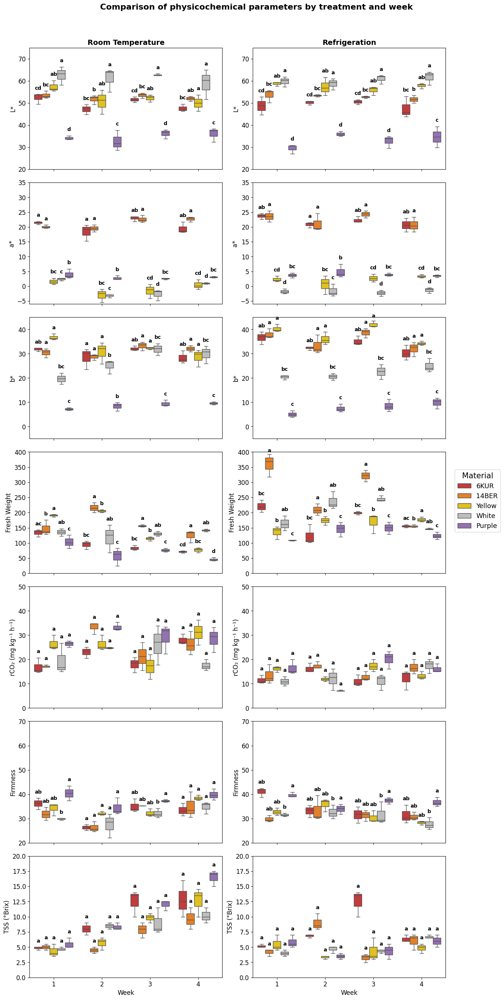

Guardado: figuras_panel_completo/Panel_completo_boxplots_con_letras_desde_posthoc.png

Resumen letras:
   Variable         Treatment Week Variedad Letters
0    L_star  Room_Temperature    1     6KUR      cd
1    L_star  Room_Temperature    1    14BER      bc
2    L_star  Room_Temperature    1   Yellow      ab
3    L_star  Room_Temperature    1    White       a
4    L_star  Room_Temperature    1   Purple       d
5    L_star  Room_Temperature    2     6KUR      bc
6    L_star  Room_Temperature    2    14BER       b
7    L_star  Room_Temperature    2   Yellow      ab
8    L_star  Room_Temperature    2    White       a
9    L_star  Room_Temperature    2   Purple       c
10   L_star  Room_Temperature    3     6KUR      cd
11   L_star  Room_Temperature    3    14BER      bc
12   L_star  Room_Temperature    3   Yellow      ab
13   L_star  Room_Temperature    3    White       a
14   L_star  Room_Temperature    3   Purple       d
15   L_star  Room_Temperature    4     6KUR      bc
16   L_star  

In [15]:
import os
import string
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# =========================
# ESTILO
# =========================
sns.set_theme(style="whitegrid")
plt.style.use("default")
plt.rcParams["font.size"] = 12
plt.rcParams["axes.titlesize"] = 13
plt.rcParams["axes.titleweight"] = "bold"

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)",
    "TTA": "TTA (%)"
}

y_limits = {
    "Respiration": (0, 50),
    "Firmness": (20, 70),
    "TTA": (0, 1),
    "TSS": (0, 20),
    "Fresh_Weight": (0, 400),
    "b_star": (-5, 45),
    "L_star": (20, 75),
    "a_star": (-6, 35)
}

order_weeks = ["1", "2", "3", "4"]
hue_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]
treatments = ["Room_Temperature", "Refrigeration"]

# TTA fuera porque en tu análisis ART falló
response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

# =========================
# CARGAR ARCHIVO
# =========================
file_path = "Resultados_ART_Zanahoria.xlsx"
data_used = pd.read_excel(file_path, sheet_name="Data_Used")
posthoc = pd.read_excel(file_path, sheet_name="POSTHOC_BONFERRONI")

data_used["Week"] = data_used["Week"].astype(str)
data_used["Treatment"] = data_used["Treatment"].astype(str)
data_used["Variedad"] = data_used["Variedad"].astype(str)
data_used["Repetición"] = data_used["Repetición"].astype(str)

posthoc["Week"] = posthoc["Week"].astype(str)
posthoc["Treatment"] = posthoc["Treatment"].astype(str)
posthoc["Variable"] = posthoc["Variable"].astype(str)
posthoc["ComparisonType"] = posthoc["ComparisonType"].astype(str)
posthoc["contrast"] = posthoc["contrast"].astype(str)

# =========================
# UTILIDADES PARA LETRAS
# =========================
def parse_contrast(txt):
    # espera algo como "14BER - 6KUR"
    parts = [p.strip() for p in txt.split(" - ")]
    if len(parts) != 2:
        return None, None
    return parts[0], parts[1]

def bron_kerbosch(R, P, X, neighbors, cliques):
    if not P and not X:
        cliques.append(R)
        return
    for v in list(P):
        bron_kerbosch(
            R | {v},
            P & neighbors[v],
            X & neighbors[v],
            neighbors,
            cliques
        )
        P.remove(v)
        X.add(v)

def maximal_cliques_from_nonsig(groups, nonsig_pairs):
    # grafo: arista = NO diferencia significativa
    neighbors = {g: set() for g in groups}
    for a, b in nonsig_pairs:
        neighbors[a].add(b)
        neighbors[b].add(a)

    cliques = []
    bron_kerbosch(set(), set(groups), set(), neighbors, cliques)

    # añadir singletons si no salieron
    for g in groups:
        if not any(g in c for c in cliques):
            cliques.append({g})

    # ordenar cliques por tamaño descendente
    cliques = sorted(cliques, key=lambda c: (-len(c), sorted(list(c))))
    return cliques

def make_letters_for_panel(df_panel, posthoc_panel, alpha=0.05):
    """
    Devuelve dict: {grupo: letras}
    usando:
    - medias del panel para ordenar
    - POSTHOC_BONFERRONI para decidir diferencias
    """
    groups_present = [g for g in hue_order if g in df_panel["Variedad"].unique()]
    if len(groups_present) == 0:
        return {}

    means = (
        df_panel.groupby("Variedad", observed=False)["Value"]
        .mean()
        .reindex(groups_present)
    )

    # aristas de no diferencia
    nonsig_pairs = set()

    # si una comparación no aparece, la tratamos como significativa conservadoramente
    pvals = {}
    for _, row in posthoc_panel.iterrows():
        a, b = parse_contrast(row["contrast"])
        if a is None:
            continue
        pvals[frozenset([a, b])] = row["p.value"]

    for a, b in itertools.combinations(groups_present, 2):
        p = pvals.get(frozenset([a, b]), np.nan)
        if pd.notna(p) and p >= alpha:
            nonsig_pairs.add((a, b))

    # cliques máximos del grafo de NO diferencia
    cliques = maximal_cliques_from_nonsig(groups_present, nonsig_pairs)

    # ordenar cliques por media promedio descendente
    def clique_mean(c):
        vals = [means[g] for g in c if pd.notna(means[g])]
        return np.mean(vals) if len(vals) else -np.inf

    cliques = sorted(cliques, key=lambda c: (-clique_mean(c), -len(c)))

    letters_pool = list(string.ascii_lowercase)
    # por si acaso, extender
    letters_pool += [f"a{i}" for i in range(1, 100)]

    group_letters = {g: "" for g in groups_present}

    for i, clique in enumerate(cliques):
        if i >= len(letters_pool):
            break
        letter = letters_pool[i]
        for g in clique:
            group_letters[g] += letter

    # si algún grupo quedó vacío, asignarle una letra nueva
    next_idx = len(cliques)
    for g in groups_present:
        if group_letters[g] == "":
            group_letters[g] = letters_pool[next_idx]
            next_idx += 1

    # limpiar duplicados y ordenar letras
    for g in group_letters:
        uniq = []
        for ch in group_letters[g]:
            if ch not in uniq:
                uniq.append(ch)
        group_letters[g] = "".join(uniq)

    return group_letters

def compute_box_centers(n_weeks, n_hues, group_width=0.8):
    centers = {}
    box_width = group_width / n_hues
    for wi in range(n_weeks):
        for hi in range(n_hues):
            centers[(wi, hi)] = wi - group_width/2 + box_width/2 + hi*box_width
    return centers

# =========================
# PREPARAR DATA LARGA
# =========================
plot_df = data_used.melt(
    id_vars=["Week", "Treatment", "Variedad", "Repetición"],
    value_vars=response_vars,
    var_name="Variable",
    value_name="Value"
).dropna()

# solo el tipo de comparación que quieres mostrar en la figura
posthoc_plot = posthoc[
    posthoc["ComparisonType"] == "Variedad within Treatment*Week"
].copy()

# =========================
# CONSTRUIR TABLA DE LETRAS
# =========================
letters_rows = []

for variable in response_vars:
    for treatment in treatments:
        for week in order_weeks:
            df_panel = plot_df[
                (plot_df["Variable"] == variable) &
                (plot_df["Treatment"] == treatment) &
                (plot_df["Week"] == week)
            ].copy()

            ph_panel = posthoc_plot[
                (posthoc_plot["Variable"] == variable) &
                (posthoc_plot["Treatment"] == treatment) &
                (posthoc_plot["Week"] == week)
            ].copy()

            if df_panel.empty:
                continue

            letters_map = make_letters_for_panel(df_panel, ph_panel, alpha=0.05)

            for g, let in letters_map.items():
                letters_rows.append({
                    "Variable": variable,
                    "Treatment": treatment,
                    "Week": week,
                    "Variedad": g,
                    "Letters": let
                })

letters_df = pd.DataFrame(letters_rows)

# guardar letras
letters_df.to_excel("letras_desde_posthoc_python.xlsx", index=False)
print("Guardado: letras_desde_posthoc_python.xlsx")

# =========================
# FIGURA MULTIPANEL
# =========================
os.makedirs("figuras_panel_completo", exist_ok=True)

n_rows = len(response_vars)
fig, axes = plt.subplots(
    n_rows, 2,
    figsize=(14, 3.9 * n_rows),
    sharex=True,
    sharey=False
)

if n_rows == 1:
    axes = np.array([axes])

for r, variable in enumerate(response_vars):
    for c, treatment in enumerate(treatments):
        ax = axes[r][c]

        sub = plot_df[
            (plot_df["Variable"] == variable) &
            (plot_df["Treatment"] == treatment)
        ].copy()

        sns.boxplot(
            data=sub,
            x="Week",
            y="Value",
            hue="Variedad",
            palette=palette,
            order=order_weeks,
            hue_order=hue_order,
            ax=ax,
            fliersize=3,
            linewidth=1,
            dodge=True
        )

        if r == 0:
            ax.set_title(treatment.replace("_", " "), fontsize=14, fontweight="bold")
        else:
            ax.set_title("")

        ax.set_xlabel("Week" if r == n_rows - 1 else "")
        ax.set_ylabel(pretty_labels.get(variable, variable))

        if variable in y_limits:
            ax.set_ylim(y_limits[variable])

        if ax.legend_ is not None:
            ax.legend_.remove()

        # =========================
        # AGREGAR LETRAS
        # =========================
        let_sub = letters_df[
            (letters_df["Variable"] == variable) &
            (letters_df["Treatment"] == treatment)
        ].copy()

        if not let_sub.empty:
            n_weeks = len(order_weeks)
            n_hues = len(hue_order)
            centers = compute_box_centers(n_weeks, n_hues, group_width=0.8)

            y0, y1 = ax.get_ylim()
            y_range = y1 - y0
            offset = 0.03 * y_range

            for wi, week in enumerate(order_weeks):
                sub_week = sub[sub["Week"] == week].copy()
                letters_week = let_sub[let_sub["Week"] == week].copy()

                if sub_week.empty or letters_week.empty:
                    continue

                for hi, mat in enumerate(hue_order):
                    mat_data = sub_week[sub_week["Variedad"] == mat]["Value"].dropna()
                    if mat_data.empty:
                        continue

                    row_letter = letters_week[letters_week["Variedad"] == mat]
                    if row_letter.empty:
                        continue

                    letter = str(row_letter.iloc[0]["Letters"]).strip()
                    if letter == "":
                        continue

                    q1 = np.percentile(mat_data, 25)
                    q3 = np.percentile(mat_data, 75)
                    iqr = q3 - q1
                    upper_bound = q3 + 1.5 * iqr
                    valid = mat_data[mat_data <= upper_bound]
                    y_text = (valid.max() if len(valid) > 0 else mat_data.max()) + offset
                    y_text = min(y_text, y1 - 0.01 * y_range)

                    x_text = centers[(wi, hi)]

                    ax.text(
                        x_text, y_text, letter,
                        ha="center", va="bottom",
                        fontsize=10, fontweight="bold", color="black"
                    )

# =========================
# LEYENDA
# =========================
handles, labels = axes[0][0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    title="Material",
    loc="center right",
    bbox_to_anchor=(0.98, 0.5),
    fontsize=13,
    title_fontsize=15,
    frameon=True
)

# =========================
# TÍTULO GENERAL
# =========================
fig.suptitle(
    "Comparison of physicochemical parameters by treatment and week",
    fontsize=16,
    fontweight="bold",
    y=0.995
)

plt.tight_layout(rect=[0, 0, 0.88, 0.98])

out_path = "figuras_panel_completo/Panel_completo_boxplots_con_letras_desde_posthoc.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Guardado: {out_path}")
print("\nResumen letras:")
print(letters_df.head(20))

Procesando L_star...
OK: L_star (80 comparaciones)
Procesando a_star...
OK: a_star (80 comparaciones)
Procesando b_star...
OK: b_star (80 comparaciones)
Procesando Fresh_Weight...
OK: Fresh_Weight (80 comparaciones)
Procesando Respiration...
OK: Respiration (80 comparaciones)
Procesando Firmness...
OK: Firmness (80 comparaciones)
Procesando TSS...
OK: TSS (80 comparaciones)
Guardado: POSTHOC_FDR_ART.xlsx
Guardado: letras_FDR_desde_ART.xlsx


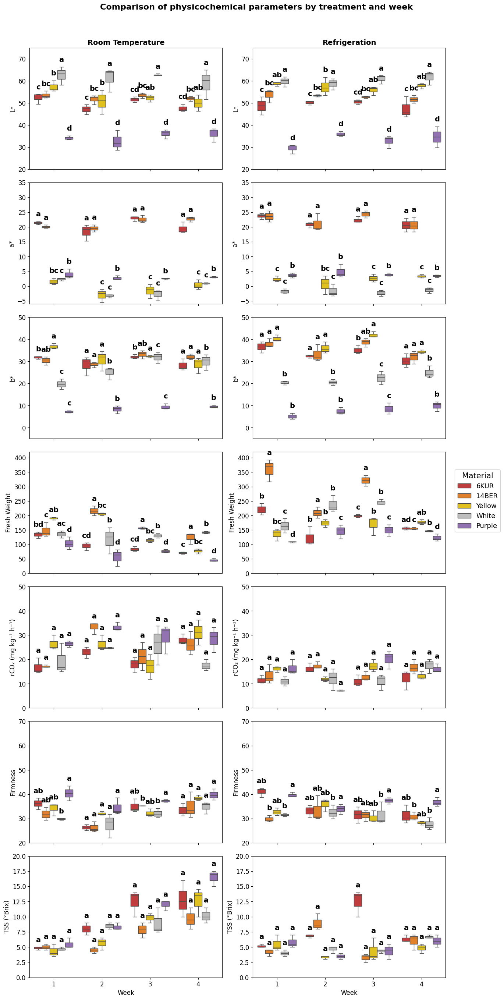

Guardado: figuras_panel_completo/Panel_completo_boxplots_con_letras_FDR.png

Resumen letras:
   Variable         Treatment Week Variedad Letters
0    L_star  Room_Temperature    1     6KUR       c
1    L_star  Room_Temperature    1    14BER      bc
2    L_star  Room_Temperature    1   Yellow       b
3    L_star  Room_Temperature    1    White       a
4    L_star  Room_Temperature    1   Purple       d
5    L_star  Room_Temperature    2     6KUR       c
6    L_star  Room_Temperature    2    14BER      bc
7    L_star  Room_Temperature    2   Yellow       b
8    L_star  Room_Temperature    2    White       a
9    L_star  Room_Temperature    2   Purple       d
10   L_star  Room_Temperature    3     6KUR      cd
11   L_star  Room_Temperature    3    14BER      bc
12   L_star  Room_Temperature    3   Yellow      ab
13   L_star  Room_Temperature    3    White       a
14   L_star  Room_Temperature    3   Purple       d
15   L_star  Room_Temperature    4     6KUR      cd
16   L_star  Room_Tempe

In [24]:
# ============================================================
# ART + EMMEANS + FDR(BH) + LETRAS EN PYTHON + FIGURA
# SIN cld()
# ============================================================

# Si hace falta:
# !pip install pandas openpyxl seaborn matplotlib rpy2

import os
import string
import itertools
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

# =========================
# ESTILO
# =========================
sns.set_theme(style="whitegrid")
plt.style.use("default")
plt.rcParams["font.size"] = 12
plt.rcParams["axes.titlesize"] = 13
plt.rcParams["axes.titleweight"] = "bold"

palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "Yellow": "#FFD700",
    "White": "#bdbdbd",
    "Purple": "#9467bd"
}

pretty_labels = {
    "L_star": "L*",
    "a_star": "a*",
    "b_star": "b*",
    "Fresh_Weight": "Fresh Weight",
    "Respiration": "rCO₂ (mg kg⁻¹ h⁻¹)",
    "Firmness": "Firmness",
    "TSS": "TSS (°Brix)",
    "TTA": "TTA (%)"
}

y_limits = {
    "Respiration": (0, 50),
    "Firmness": (20, 70),
    "TTA": (0, 1),
    "TSS": (0, 20),
    "Fresh_Weight": (0, 420),
    "b_star": (-5, 50),
    "L_star": (20, 75),
    "a_star": (-6, 35)
}

order_weeks = ["1", "2", "3", "4"]
hue_order = ["6KUR", "14BER", "Yellow", "White", "Purple"]
treatments = ["Room_Temperature", "Refrigeration"]

# TTA fuera porque en tu modelo global falló
response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

# =========================
# CARGAR DATOS
# =========================
file_path = "Resultados_ART_Zanahoria.xlsx"
df = pd.read_excel(file_path, sheet_name="Data_Used")

df["Week"] = df["Week"].astype(str)
df["Treatment"] = df["Treatment"].astype(str)
df["Variedad"] = df["Variedad"].astype(str)
df["Repetición"] = df["Repetición"].astype(str)

# =========================
# R / rpy2
# =========================
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r(r'''
options(repos = c(CRAN = "https://cloud.r-project.org"))
pkgs <- c("ARTool", "emmeans")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}
suppressPackageStartupMessages({
  library(ARTool)
  library(emmeans)
})
''')

# =========================
# FUNCIÓN R: ART + emmeans pairs (FDR)
# =========================
def run_art_pairs_fdr(df_in, variable):
    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py"] = df_in

    r_code = f'''
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
    }})

    d <- df_py[, c("Variedad", "Treatment", "Week", "Repetición", "{variable}")]
    d <- d[!is.na(d[["{variable}"]]), ]
    d <- droplevels(d)

    d$Variedad <- factor(d$Variedad, levels = c("6KUR","14BER","Yellow","White","Purple"))
    d$Treatment <- factor(d$Treatment, levels = c("Room_Temperature","Refrigeration"))
    d$Week <- factor(d$Week, levels = c("1","2","3","4"))

    mod <- art(as.formula("{variable} ~ Variedad * Treatment * Week"), data = d)
    fit <- artlm(mod, "Variedad")
    emm <- emmeans(fit, ~ Variedad | Treatment * Week)

    # SOLO comparaciones pareadas con FDR / Benjamini-Hochberg
    pairs_df <- as.data.frame(pairs(emm, adjust = "fdr"))
    pairs_df$Variable <- "{variable}"
    '''

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        out = ro.conversion.rpy2py(ro.r("pairs_df"))

    return out

# =========================
# CORRER POSTHOC FDR
# =========================
posthoc_list = []

for var in response_vars:
    try:
        print(f"Procesando {var}...")
        out = run_art_pairs_fdr(df.copy(), var)
        posthoc_list.append(out)
        print(f"OK: {var} ({len(out)} comparaciones)")
    except Exception as e:
        print(f"Error en {var}: {e}")

if len(posthoc_list) == 0:
    raise ValueError("No se generó ningún posthoc. Revisa que ARTool y emmeans estén instalados.")

posthoc_fdr = pd.concat(posthoc_list, ignore_index=True)

# normalizar nombres
posthoc_fdr["Treatment"] = posthoc_fdr["Treatment"].astype(str)
posthoc_fdr["Week"] = posthoc_fdr["Week"].astype(str)
posthoc_fdr["Variable"] = posthoc_fdr["Variable"].astype(str)
posthoc_fdr["contrast"] = posthoc_fdr["contrast"].astype(str)

# guardar posthoc
posthoc_fdr.to_excel("POSTHOC_FDR_ART.xlsx", index=False)
print("Guardado: POSTHOC_FDR_ART.xlsx")

# =========================
# UTILIDADES PARA LETRAS EN PYTHON
# =========================
def parse_contrast(txt):
    parts = [p.strip() for p in txt.split(" - ")]
    if len(parts) != 2:
        return None, None
    return parts[0], parts[1]

def bron_kerbosch(R, P, X, neighbors, cliques):
    if not P and not X:
        cliques.append(R)
        return
    for v in list(P):
        bron_kerbosch(R | {v}, P & neighbors[v], X & neighbors[v], neighbors, cliques)
        P.remove(v)
        X.add(v)

def maximal_cliques_from_nonsig(groups, nonsig_pairs):
    neighbors = {g: set() for g in groups}
    for a, b in nonsig_pairs:
        neighbors[a].add(b)
        neighbors[b].add(a)

    cliques = []
    bron_kerbosch(set(), set(groups), set(), neighbors, cliques)

    # singletons
    for g in groups:
        if not any(g in c for c in cliques):
            cliques.append({g})

    cliques = sorted(cliques, key=lambda c: (-len(c), sorted(list(c))))
    return cliques

def make_letters_for_panel(df_panel, posthoc_panel, alpha=0.05):
    groups_present = [g for g in hue_order if g in df_panel["Variedad"].unique()]
    if len(groups_present) == 0:
        return {}

    means = (
        df_panel.groupby("Variedad", observed=False)["Value"]
        .mean()
        .reindex(groups_present)
    )

    pvals = {}
    for _, row in posthoc_panel.iterrows():
        a, b = parse_contrast(row["contrast"])
        if a is None:
            continue
        pvals[frozenset([a, b])] = row["p.value"]

    nonsig_pairs = set()
    for a, b in itertools.combinations(groups_present, 2):
        p = pvals.get(frozenset([a, b]), np.nan)
        if pd.notna(p) and p >= alpha:
            nonsig_pairs.add((a, b))

    cliques = maximal_cliques_from_nonsig(groups_present, nonsig_pairs)

    def clique_mean(c):
        vals = [means[g] for g in c if pd.notna(means[g])]
        return np.mean(vals) if len(vals) else -np.inf

    cliques = sorted(cliques, key=lambda c: (-clique_mean(c), -len(c)))

    letters_pool = list(string.ascii_lowercase)
    letters_pool += [f"a{i}" for i in range(1, 100)]

    group_letters = {g: "" for g in groups_present}

    for i, clique in enumerate(cliques):
        if i >= len(letters_pool):
            break
        letter = letters_pool[i]
        for g in clique:
            group_letters[g] += letter

    next_idx = len(cliques)
    for g in groups_present:
        if group_letters[g] == "":
            group_letters[g] = letters_pool[next_idx]
            next_idx += 1

    for g in group_letters:
        uniq = []
        for ch in group_letters[g]:
            if ch not in uniq:
                uniq.append(ch)
        group_letters[g] = "".join(uniq)

    return group_letters

def compute_box_centers(n_weeks, n_hues, group_width=0.8):
    centers = {}
    box_width = group_width / n_hues
    for wi in range(n_weeks):
        for hi in range(n_hues):
            centers[(wi, hi)] = wi - group_width/2 + box_width/2 + hi*box_width
    return centers

# =========================
# DATOS LARGOS
# =========================
plot_df = df.melt(
    id_vars=["Week", "Treatment", "Variedad", "Repetición"],
    value_vars=response_vars,
    var_name="Variable",
    value_name="Value"
).dropna()

# =========================
# GENERAR LETRAS
# =========================
letters_rows = []

for variable in response_vars:
    for treatment in treatments:
        for week in order_weeks:
            df_panel = plot_df[
                (plot_df["Variable"] == variable) &
                (plot_df["Treatment"] == treatment) &
                (plot_df["Week"] == week)
            ].copy()

            ph_panel = posthoc_fdr[
                (posthoc_fdr["Variable"] == variable) &
                (posthoc_fdr["Treatment"] == treatment) &
                (posthoc_fdr["Week"] == week)
            ].copy()

            if df_panel.empty:
                continue

            letters_map = make_letters_for_panel(df_panel, ph_panel, alpha=0.05)

            for g, let in letters_map.items():
                letters_rows.append({
                    "Variable": variable,
                    "Treatment": treatment,
                    "Week": week,
                    "Variedad": g,
                    "Letters": let
                })

letters_df = pd.DataFrame(letters_rows)
letters_df.to_excel("letras_FDR_desde_ART.xlsx", index=False)
print("Guardado: letras_FDR_desde_ART.xlsx")

# =========================
# FIGURA MULTIPANEL
# =========================
os.makedirs("figuras_panel_completo", exist_ok=True)

n_rows = len(response_vars)
fig, axes = plt.subplots(
    n_rows, 2,
    figsize=(14, 3.9 * n_rows),
    sharex=True,
    sharey=False
)

if n_rows == 1:
    axes = np.array([axes])

for r, variable in enumerate(response_vars):
    for c, treatment in enumerate(treatments):
        ax = axes[r][c]

        sub = plot_df[
            (plot_df["Variable"] == variable) &
            (plot_df["Treatment"] == treatment)
        ].copy()

        sns.boxplot(
            data=sub,
            x="Week",
            y="Value",
            hue="Variedad",
            palette=palette,
            order=order_weeks,
            hue_order=hue_order,
            ax=ax,
            fliersize=3,
            linewidth=1,
            dodge=True
        )

        if r == 0:
            ax.set_title(treatment.replace("_", " "), fontsize=14, fontweight="bold")
        else:
            ax.set_title("")

        ax.set_xlabel("Week" if r == n_rows - 1 else "")
        ax.set_ylabel(pretty_labels.get(variable, variable))

        if variable in y_limits:
            ax.set_ylim(y_limits[variable])

        if ax.legend_ is not None:
            ax.legend_.remove()

        # LETRAS
        let_sub = letters_df[
            (letters_df["Variable"] == variable) &
            (letters_df["Treatment"] == treatment)
        ].copy()

        if not let_sub.empty:
            n_weeks = len(order_weeks)
            n_hues = len(hue_order)
            centers = compute_box_centers(n_weeks, n_hues, group_width=0.8)

            y0, y1 = ax.get_ylim()
            y_range = y1 - y0
            offset = 0.03 * y_range

            for wi, week in enumerate(order_weeks):
                sub_week = sub[sub["Week"] == week].copy()
                letters_week = let_sub[let_sub["Week"] == week].copy()

                if sub_week.empty or letters_week.empty:
                    continue

                for hi, mat in enumerate(hue_order):
                    mat_data = sub_week[sub_week["Variedad"] == mat]["Value"].dropna()
                    if mat_data.empty:
                        continue

                    row_letter = letters_week[letters_week["Variedad"] == mat]
                    if row_letter.empty:
                        continue

                    letter = str(row_letter.iloc[0]["Letters"]).strip()
                    if letter == "":
                        continue

                    q1 = np.percentile(mat_data, 25)
                    q3 = np.percentile(mat_data, 75)
                    iqr = q3 - q1
                    upper_bound = q3 + 1.5 * iqr
                    valid = mat_data[mat_data <= upper_bound]
                    y_text = (valid.max() if len(valid) > 0 else mat_data.max()) + offset
                    y_text = min(y_text, y1 - 0.01 * y_range)

                    x_text = centers[(wi, hi)]

                    ax.text(
                        x_text, y_text, letter,
                        ha="center", va="bottom",
                        fontsize=14, fontweight="bold", color="black"
                    )

# =========================
# LEYENDA
# =========================
handles, labels = axes[0][0].get_legend_handles_labels()
fig.legend(
    handles, labels,
    title="Material",
    loc="center right",
    bbox_to_anchor=(0.98, 0.5),
    fontsize=13,
    title_fontsize=15,
    frameon=True
)

# =========================
# TÍTULO GENERAL
# =========================
fig.suptitle(
    "Comparison of physicochemical parameters by treatment and week",
    fontsize=16,
    fontweight="bold",
    y=0.995
)

plt.tight_layout(rect=[0, 0, 0.88, 0.98])

out_path = "figuras_panel_completo/Panel_completo_boxplots_con_letras_FDR.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Guardado: {out_path}")
print("\nResumen letras:")
print(letters_df.head(20))

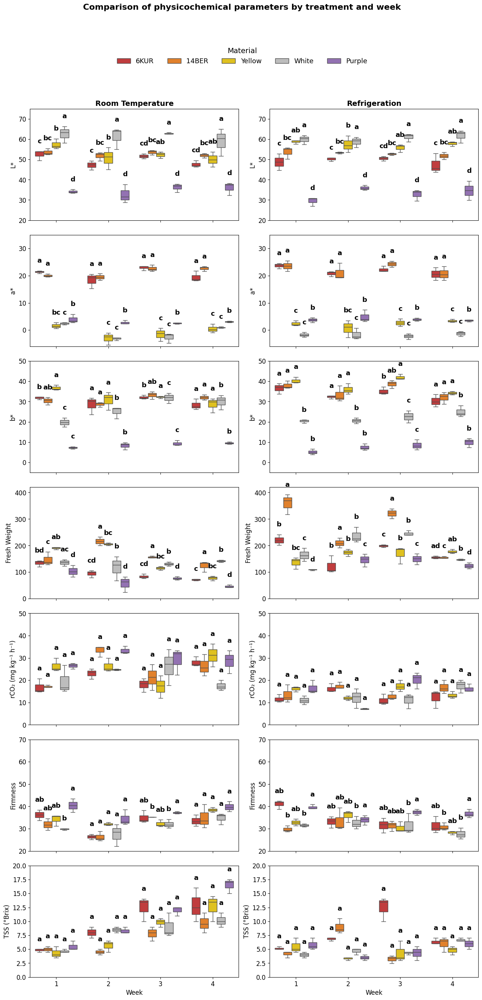

Guardado: figuras_panel_completo/Panel_completo_boxplots_MEJORADO.png


In [25]:
# =========================
# FIGURA MULTIPANEL OPTIMIZADA
# =========================

os.makedirs("figuras_panel_completo", exist_ok=True)

n_rows = len(response_vars)
fig, axes = plt.subplots(
    n_rows, 2,
    figsize=(13, 3.6 * n_rows),  # más compacto
    sharex=True,
    sharey=False
)

if n_rows == 1:
    axes = np.array([axes])

for r, variable in enumerate(response_vars):
    for c, treatment in enumerate(treatments):

        ax = axes[r][c]

        sub = plot_df[
            (plot_df["Variable"] == variable) &
            (plot_df["Treatment"] == treatment)
        ].copy()

        sns.boxplot(
            data=sub,
            x="Week",
            y="Value",
            hue="Variedad",
            palette=palette,
            order=order_weeks,
            hue_order=hue_order,
            ax=ax,
            fliersize=3,
            linewidth=1,
            dodge=True
        )

        if r == 0:
            ax.set_title(
                treatment.replace("_", " "),
                fontsize=14,
                fontweight="bold"
            )

        ax.set_xlabel("Week" if r == n_rows - 1 else "")
        ax.set_ylabel(pretty_labels.get(variable, variable))

        if variable in y_limits:
            ax.set_ylim(y_limits[variable])

        if ax.legend_ is not None:
            ax.legend_.remove()

        # =========================
        # LETRAS MÁS GRANDES Y MEJOR UBICADAS
        # =========================

        let_sub = letters_df[
            (letters_df["Variable"] == variable) &
            (letters_df["Treatment"] == treatment)
        ].copy()

        if not let_sub.empty:

            centers = compute_box_centers(len(order_weeks), len(hue_order))

            y0, y1 = ax.get_ylim()
            y_range = y1 - y0

            offset = 0.06 * y_range  # más separación

            for wi, week in enumerate(order_weeks):

                sub_week = sub[sub["Week"] == week]
                letters_week = let_sub[let_sub["Week"] == week]

                if sub_week.empty or letters_week.empty:
                    continue

                for hi, mat in enumerate(hue_order):

                    mat_data = sub_week[
                        sub_week["Variedad"] == mat
                    ]["Value"].dropna()

                    if mat_data.empty:
                        continue

                    row_letter = letters_week[
                        letters_week["Variedad"] == mat
                    ]

                    if row_letter.empty:
                        continue

                    letter = str(row_letter.iloc[0]["Letters"]).strip()

                    if letter == "":
                        continue

                    y_text = mat_data.max() + offset
                    x_text = centers[(wi, hi)]

                    ax.text(
                        x_text,
                        y_text,
                        letter,
                        ha="center",
                        va="bottom",
                        fontsize=13,      # 🔥 MÁS GRANDE
                        fontweight="bold"
                    )

# =========================
# LEYENDA ARRIBA (MUCHO MEJOR)
# =========================

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title="Material",
    loc="upper center",
    bbox_to_anchor=(0.5, 1.02),
    ncol=5,                     # horizontal
    fontsize=13,
    title_fontsize=14,
    frameon=False
)

# =========================
# TÍTULO
# =========================

fig.suptitle(
    "Comparison of physicochemical parameters by treatment and week",
    fontsize=16,
    fontweight="bold",
    y=1.06
)

plt.tight_layout(rect=[0, 0, 1, 0.98])

out_path = "figuras_panel_completo/Panel_completo_boxplots_MEJORADO.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Guardado: {out_path}")

In [20]:
# ============================================================
# ART + ANOVA + PVALUES + POSTHOC FDR (SIN CLD)
# ============================================================

# !pip install rpy2 pandas openpyxl

import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

# =========================
# INSTALAR LIBRERÍAS R
# =========================
ro.r('''
options(repos = c(CRAN = "https://cloud.r-project.org"))
pkgs <- c("ARTool", "emmeans")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}
library(ARTool)
library(emmeans)
''')

# =========================
# CARGAR DATOS
# =========================
file_path = "Resultados_ART_Zanahoria.xlsx"
df = pd.read_excel(file_path, sheet_name="Data_Used")

df["Week"] = df["Week"].astype(str)
df["Treatment"] = df["Treatment"].astype(str)
df["Variedad"] = df["Variedad"].astype(str)
df["Repetición"] = df["Repetición"].astype(str)

# =========================
# VARIABLES
# =========================
response_vars = [
    "L_star", "a_star", "b_star",
    "Fresh_Weight", "Respiration",
    "Firmness", "TSS"
]

# =========================
# FUNCIÓN PRINCIPAL
# =========================
def run_art_full(df, variable):

    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py"] = df

    r_code = f'''
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
    }})

    d <- df_py[, c("Variedad","Treatment","Week","Repetición","{variable}")]
    d <- d[!is.na(d[["{variable}"]]), ]
    d <- droplevels(d)

    d$Variedad <- factor(d$Variedad)
    d$Treatment <- factor(d$Treatment)
    d$Week <- factor(d$Week)

    # =========================
    # MODELO ART
    # =========================
    mod <- art({variable} ~ Variedad * Treatment * Week, data = d)

    # =========================
    # ANOVA (LO QUE QUIERES)
    # =========================
    anova_df <- as.data.frame(anova(mod))
    anova_df$Effect <- rownames(anova_df)
    anova_df$Variable <- "{variable}"

    # =========================
    # POSTHOC (FDR)
    # =========================
    fit <- artlm(mod, "Variedad")
    emm <- emmeans(fit, ~ Variedad | Treatment * Week)

    pairs_df <- as.data.frame(pairs(emm, adjust = "fdr"))
    pairs_df$Variable <- "{variable}"

    '''

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_out = ro.conversion.rpy2py(ro.r("anova_df"))
        posthoc_out = ro.conversion.rpy2py(ro.r("pairs_df"))

    return anova_out, posthoc_out

# =========================
# CORRER TODO
# =========================
anova_all = []
posthoc_all = []

for var in response_vars:
    try:
        print(f"Procesando {var}...")
        anova_df, posthoc_df = run_art_full(df.copy(), var)

        anova_all.append(anova_df)
        posthoc_all.append(posthoc_df)

        print(f"OK: {var}")

    except Exception as e:
        print(f"Error en {var}: {e}")

anova_final = pd.concat(anova_all, ignore_index=True)
posthoc_final = pd.concat(posthoc_all, ignore_index=True)

# =========================
# LIMPIAR COLUMNAS
# =========================
anova_final = anova_final.rename(columns={
    "Df": "Df",
    "F value": "F_value",
    "Pr(>F)": "p_value"
})

posthoc_final = posthoc_final.rename(columns={
    "p.value": "p_value"
})

# =========================
# GUARDAR
# =========================
with pd.ExcelWriter("RESULTADOS_ART_COMPLETOS.xlsx") as writer:
    anova_final.to_excel(writer, sheet_name="ANOVA", index=False)
    posthoc_final.to_excel(writer, sheet_name="POSTHOC_FDR", index=False)

print("\nArchivo guardado: RESULTADOS_ART_COMPLETOS.xlsx")

# =========================
# VISTA RÁPIDA
# =========================
print("\n===== ANOVA =====")
print(anova_final.head())

print("\n===== POSTHOC =====")
print(posthoc_final.head())

Procesando L_star...
OK: L_star
Procesando a_star...
OK: a_star
Procesando b_star...
OK: b_star
Procesando Fresh_Weight...
OK: Fresh_Weight
Procesando Respiration...
OK: Respiration
Procesando Firmness...
OK: Firmness
Procesando TSS...
OK: TSS

Archivo guardado: RESULTADOS_ART_COMPLETOS.xlsx

===== ANOVA =====
                 Term    Df  Df.res         Sum Sq     Sum Sq.res     F_value  \
0            Variedad   4.0    80.0  124005.750000   19377.000000  127.992723   
1           Treatment   1.0    80.0     720.300000  139628.000000    0.412697   
2                Week   3.0    80.0    8635.250000  131970.000000    1.744892   
3  Variedad:Treatment   4.0    80.0   27466.033333  113319.333333    4.847546   
4       Variedad:Week  12.0    80.0   28475.150000  113618.000000    1.670812   

        p_value              Effect Variable  
0  6.066890e-34            Variedad   L_star  
1  5.224408e-01           Treatment   L_star  
2  1.644861e-01                Week   L_star  
3  1.494594e-

Data loaded successfully
Total samples: 121
Room temperature samples: 61
Refrigerated samples: 60

Varieties found:
Variedad
Morada      24
Amarilla    24
6KUR        24
14BER       24
Blanca      24
Name: count, dtype: int64

Statistical summary for key parameters:

rCO₂ (mg kg⁻¹ h⁻¹):
count    120.000000
mean      19.324456
std        7.399431
min        7.000000
25%       14.232500
50%       17.266553
75%       25.000000
max       36.260000
Name: rCO₂ (mg kg⁻¹ h⁻¹), dtype: float64

Firmness:
count    120.000000
mean      33.318000
std        4.264883
min       22.120000
25%       30.222500
50%       32.925000
75%       36.340000
max       43.420000
Name: Firmness, dtype: float64

TTA (%):
count    121.000000
mean       0.195803
std        0.099797
min        0.000000
25%        0.127444
50%        0.167761
75%        0.231654
max        0.491667
Name: TTA (%), dtype: float64

Sample data:
   Week         Treatment  Variedad  Repetición     L*    a*     b*
0     1  Room Temperature  

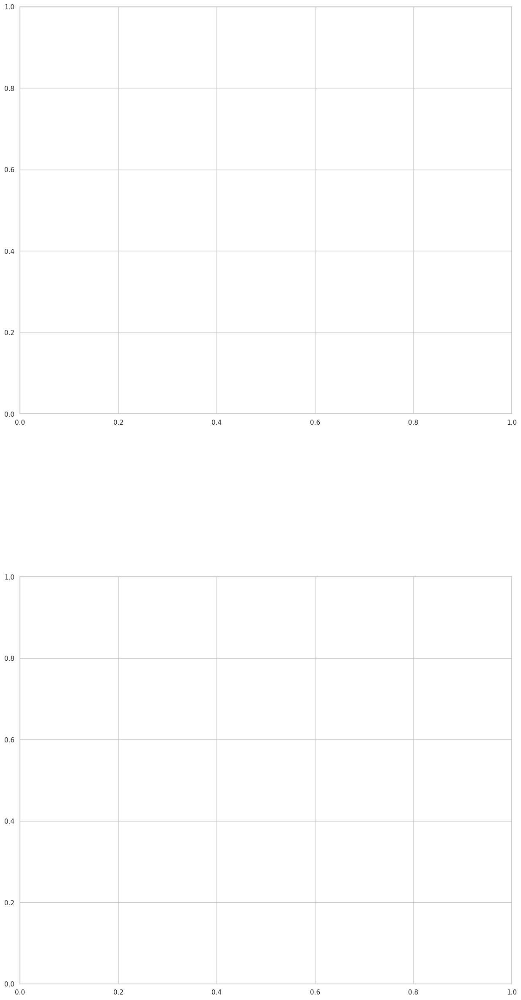

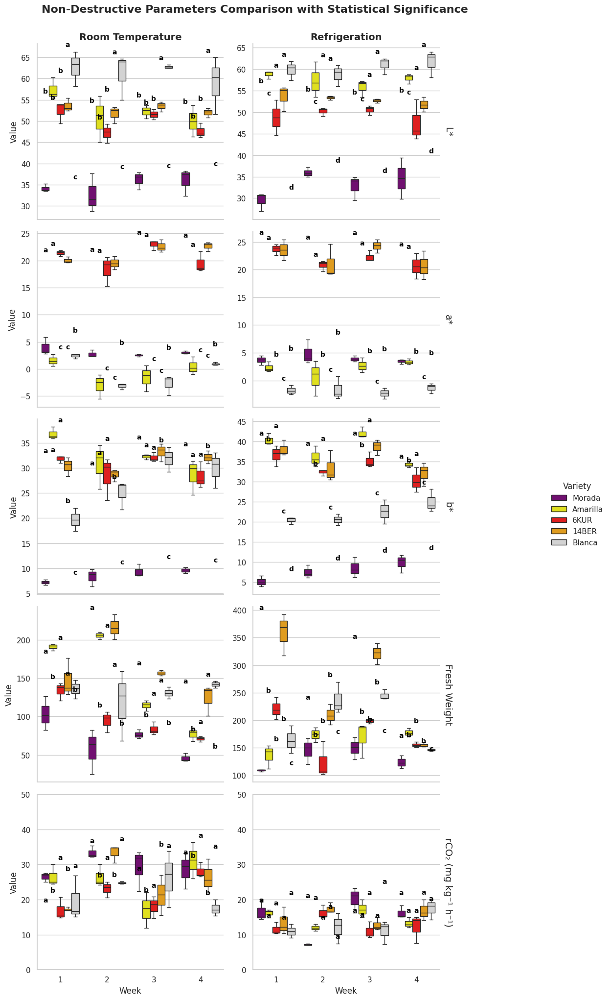

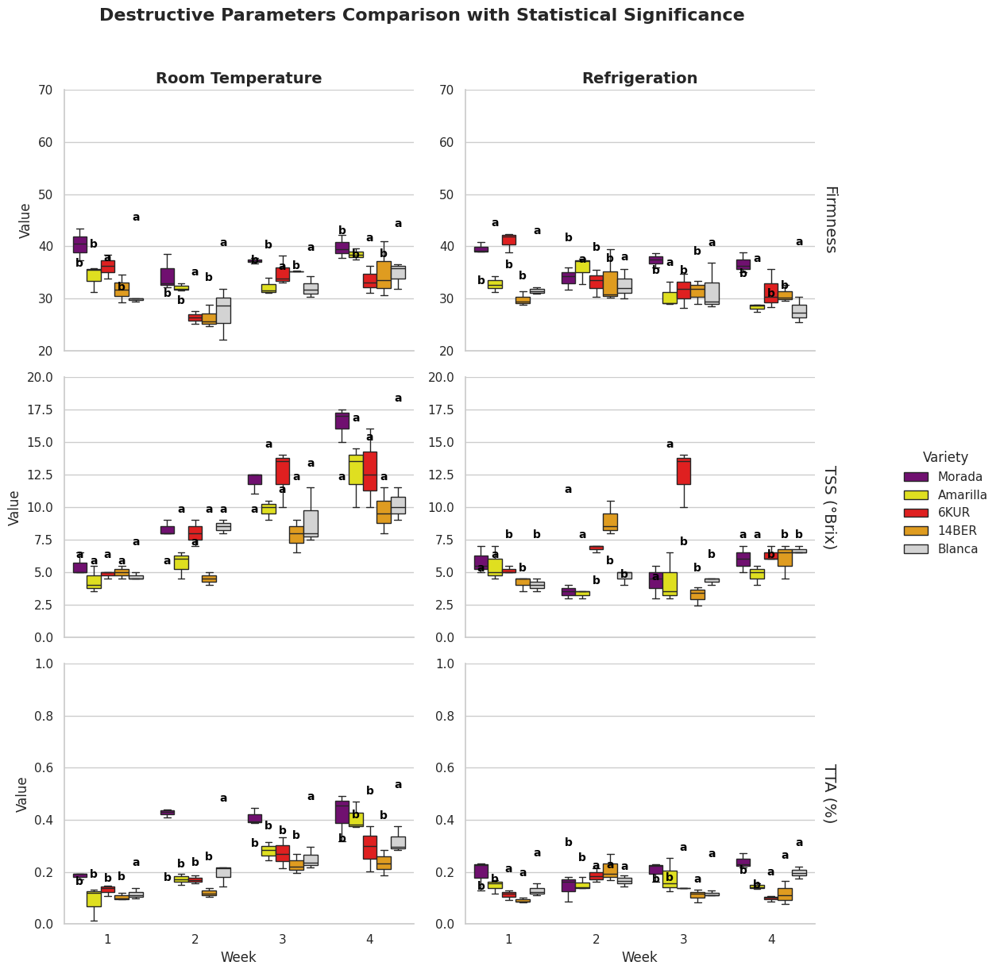

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import os
from itertools import product

# Estilo
plt.style.use('default')
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [12, 20]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.titleweight'] = 'bold'

# Paleta de colores (variedades en inglés)
variety_palette = {
    "6KUR": "red",
    "14BER": "orange",
    "Amarilla": "yellow",
    "Blanca": "lightgray",
    "Morada": "purple"
}

# Traducción de parámetros
param_translation = {
    'L*': 'L*',
    'a*': 'a*',
    'b*': 'b*',
    'Peso_Fresco': 'Fresh Weight',
    'Firmeza': 'Firmness',
    'Respiración': 'rCO₂ (mg kg⁻¹ h⁻¹)',
    'IC': 'IC',
    'SST_Corregido': 'TSS (°Brix)',
    'ATT': 'TTA (%)'
}

def load_carrot_data(file_path, week):
    """Cargar datos de zanahorias desde archivos Excel"""
    try:
        amb_data = pd.read_excel(file_path, sheet_name='Ambiente')
        refri_data = pd.read_excel(file_path, sheet_name='Refrigeración')

        amb_data['Week'] = week
        amb_data['Treatment'] = 'Room Temperature'
        refri_data['Week'] = week
        refri_data['Treatment'] = 'Refrigeration'

        combined_data = pd.concat([amb_data, refri_data], ignore_index=True)
        combined_data.columns = combined_data.columns.str.strip()

        combined_data['Variedad'] = combined_data['Variedad'].str.strip()
        combined_data['Variedad'] = combined_data['Variedad'].replace({
            'YELLOW': 'Yellow',
            'WHITE': 'White',
            'PURPLE': 'Purple'
        })

        numeric_cols = ['L*', 'a*', 'b*', 'Diametro', 'Longitud', 'Peso_Fresco',
                       'Peso_fresco_kg', 'm', 'Respiración', 'ATAN', 'Hue',
                       'Croma', 'Firmeza', 'SST', 'SST_Corregido', 'NaOH',
                       'Acidez_Peso_Muestra', 'Factor_D', 'ATT']

        for col in numeric_cols:
            if col in combined_data.columns:
                combined_data[col] = pd.to_numeric(combined_data[col], errors='coerce')

        # Renombrar columnas a inglés
        combined_data = combined_data.rename(columns=param_translation)

        return combined_data
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return pd.DataFrame()

def perform_tukey_test(data, group_col, value_col):
    data = data.dropna(subset=[value_col])
    if len(data[value_col].unique()) < 2:
        return {group: '' for group in data[group_col].unique()}
    try:
        tukey = pairwise_tukeyhsd(endog=data[value_col], groups=data[group_col], alpha=0.05)
        tukey_df = pd.DataFrame(tukey._results_table.data[1:], columns=tukey._results_table.data[0])
        group_means = data.groupby(group_col)[value_col].mean()
        sorted_groups = group_means.sort_values(ascending=False).index.tolist()
        letters = {group: '' for group in data[group_col].unique()}
        current_letter = 'a'

        for group in sorted_groups:
            if letters[group] == '':
                letters[group] = current_letter
                similar_groups = [group]
                for other_group in sorted_groups:
                    if other_group != group and letters[other_group] == '':
                        reject = tukey_df[((tukey_df['group1'] == group) & (tukey_df['group2'] == other_group)) |
                                      ((tukey_df['group1'] == other_group) & (tukey_df['group2'] == group))]['reject'].values
                        if len(reject) > 0 and not reject[0]:
                            similar_groups.append(other_group)
                for g in similar_groups:
                    letters[g] = current_letter
                current_letter = chr(ord(current_letter) + 1)

        return letters
    except Exception as e:
        print(f"Error in Tukey test for {value_col}: {e}")
        return {group: '' for group in data[group_col].unique()}

def add_significance_letters(ax, data, x_var, y_var, hue_var, palette):
    """Función mejorada para agregar letras de significancia"""
    # Ejecutar el Tukey test con todos los datos del subplot
    letters = perform_tukey_test(data, hue_var, y_var)

    # Obtener las posiciones de las cajas en el eje x
    n_hue_levels = len(data[hue_var].unique())
    n_x_levels = len(data[x_var].unique())

    # Calcular la posición de cada caja
    hue_levels = sorted(data[hue_var].unique())

    for i, x_level in enumerate(sorted(data[x_var].unique())):
        for j, hue_level in enumerate(hue_levels):
            # Filtrar datos para esta combinación específica
            subset = data[(data[x_var] == x_level) & (data[hue_var] == hue_level)]
            if subset.empty:
                continue

            # Calcular la posición x de la caja
            x_pos = i + (j - (n_hue_levels - 1) / 2) * 0.8 / n_hue_levels

            # Obtener el valor máximo (parte superior de la caja)
            y_max = subset[y_var].max()

            # Obtener la letra de significancia
            letter = letters.get(hue_level, '')

            # Agregar texto encima de la caja
            if letter:
                ax.text(x_pos, y_max + 0.02 * (ax.get_ylim()[1] - ax.get_ylim()[0]),
                        letter,
                        ha='center', va='bottom',
                        fontweight='bold', fontsize=10, color='black')

def plot_parameters_with_significance(data, destructive_params, non_destructive_params):
    non_destructive_melt = data.melt(
        id_vars=['Week', 'Treatment', 'Variedad', 'Repetición'],
        value_vars=non_destructive_params,
        var_name='Parameter',
        value_name='Value'
    ).dropna()

    destructive_melt = data.melt(
        id_vars=['Week', 'Treatment', 'Variedad', 'Repetición'],
        value_vars=destructive_params,
        var_name='Parameter',
        value_name='Value'
    ).dropna()

    fig = plt.figure(figsize=(15, 30))
    gs = fig.add_gridspec(2, 1, hspace=0.4)

    # Definir límites personalizados para cada parámetro
    y_limits = {
        'rCO₂ (mg kg⁻¹ h⁻¹)': (0, 50),
        'Firmness': (20, 70),
        'TTA (%)': (0, 1),
        'TSS (°Brix)': (0, 20)
    }

    # Gráficos no destructivos
    ax1 = fig.add_subplot(gs[0, 0])
    g1 = sns.FacetGrid(non_destructive_melt, row='Parameter', col='Treatment',
                      margin_titles=True, height=4, aspect=1.2, sharey=False, sharex=True)
    g1.map_dataframe(sns.boxplot, x='Week', y='Value', hue='Variedad',
                    palette=variety_palette, dodge=True, width=0.8, fliersize=3, linewidth=1)

    # Agregar letras de significancia a cada subplot
    for (row_val, col_val), ax in g1.axes_dict.items():
        subset = non_destructive_melt[
            (non_destructive_melt['Parameter'] == row_val) &
            (non_destructive_melt['Treatment'] == col_val)
        ]
        if not subset.empty:
            # Aplicar límites personalizados si están definidos
            if row_val in y_limits:
                ax.set_ylim(y_limits[row_val])

            add_significance_letters(ax, subset, 'Week', 'Value', 'Variedad', variety_palette)
            ax.set_xticks(range(len(subset['Week'].unique())))
            ax.set_xticklabels(sorted(subset['Week'].unique()))

    g1.set_titles(col_template="{col_name}", row_template="{row_name}", size=14)
    g1.set_axis_labels("Week", "Value")
    g1.fig.suptitle('Non-Destructive Parameters Comparison with Statistical Significance',
                   y=1.02, fontsize=16, fontweight='bold')
    g1.add_legend(title='Variety', bbox_to_anchor=(1.05, 0.5), loc='center left')

    # Gráficos destructivos
    ax2 = fig.add_subplot(gs[1, 0])
    g2 = sns.FacetGrid(destructive_melt, row='Parameter', col='Treatment',
                      margin_titles=True, height=4, aspect=1.2, sharey=False, sharex=True)
    g2.map_dataframe(sns.boxplot, x='Week', y='Value', hue='Variedad',
                    palette=variety_palette, dodge=True, width=0.8, fliersize=3, linewidth=1)

    # Agregar letras de significancia a cada subplot
    for (row_val, col_val), ax in g2.axes_dict.items():
        subset = destructive_melt[
            (destructive_melt['Parameter'] == row_val) &
            (destructive_melt['Treatment'] == col_val)
        ]
        if not subset.empty:
            # Aplicar límites personalizados si están definidos
            if row_val in y_limits:
                ax.set_ylim(y_limits[row_val])

            add_significance_letters(ax, subset, 'Week', 'Value', 'Variedad', variety_palette)
            ax.set_xticks(range(len(subset['Week'].unique())))
            ax.set_xticklabels(sorted(subset['Week'].unique()))

    g2.set_titles(col_template="{col_name}", row_template="{row_name}", size=14)
    g2.set_axis_labels("Week", "Value")
    g2.fig.suptitle('Destructive Parameters Comparison with Statistical Significance',
                   y=1.02, fontsize=16, fontweight='bold')
    g2.add_legend(title='Variety', bbox_to_anchor=(1.05, 0.5), loc='center left')

    plt.tight_layout()
    plt.show()

# Ejecución principal
if __name__ == "__main__":
    files_weeks = [
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/7 10.xlsx", 1),
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 15 10 24  Colab_CadenaF_TAmb.xlsx", 2),
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 21 10 024.xlsx", 3),
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/ Muestreo 28 10 024.xlsx", 4)
    ]

    try:
        all_data = []
        for file_path, week in files_weeks:
            data = load_carrot_data(file_path, week)
            if not data.empty:
                all_data.append(data)

        data = pd.concat(all_data, ignore_index=True)
        data = data.dropna(how='all')
        data['Variedad'] = data['Variedad'].str.strip()

        print("Data loaded successfully")
        print(f"Total samples: {len(data)}")
        print(f"Room temperature samples: {len(data[data['Treatment'] == 'Room Temperature'])}")
        print(f"Refrigerated samples: {len(data[data['Treatment'] == 'Refrigeration'])}")
        print("\nVarieties found:")
        print(data['Variedad'].value_counts())

        # Mostrar estadísticas descriptivas para ajustar mejor los límites
        print("\nStatistical summary for key parameters:")
        key_params = ['rCO₂ (mg kg⁻¹ h⁻¹)', 'Firmness', 'TTA (%)']
        for param in key_params:
            if param in data.columns:
                print(f"\n{param}:")
                print(data[param].describe())

        print("\nSample data:")
        print(data[['Week', 'Treatment', 'Variedad', 'Repetición', 'L*', 'a*', 'b*']].head())

        non_destructive_params = ['L*', 'a*', 'b*', 'Fresh Weight', 'rCO₂ (mg kg⁻¹ h⁻¹)']
        destructive_params = ['Firmness', 'TSS (°Brix)', 'TTA (%)']

        plot_parameters_with_significance(data, destructive_params, non_destructive_params)

    except Exception as e:
        print(f"Execution error: {e}")

Datos cargados exitosamente
Muestras totales: 121
Muestras a temperatura ambiente: 61
Muestras en refrigeración: 60

Variedades encontradas:
Variedad
Morada      24
Amarilla    24
6KUR        24
14BER       24
Blanca      24
Name: count, dtype: int64

Datos de muestra:
   Week         Treatment  Variedad  Repetición     L*    a*     b*
0     1  Room Temperature    Morada         1.0  33.70  2.83   7.78
1     1  Room Temperature    Morada         2.0  35.18  5.87   6.66
2     1  Room Temperature    Morada         3.0  33.48  3.33   7.19
3     1  Room Temperature  Amarilla         1.0  56.41  2.75  36.23
4     1  Room Temperature  Amarilla         2.0  60.23  1.46  38.15


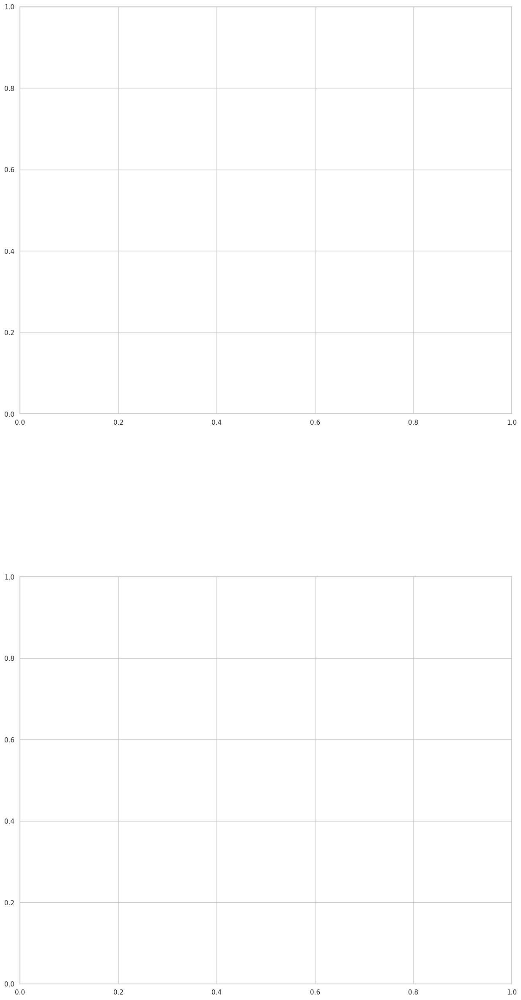

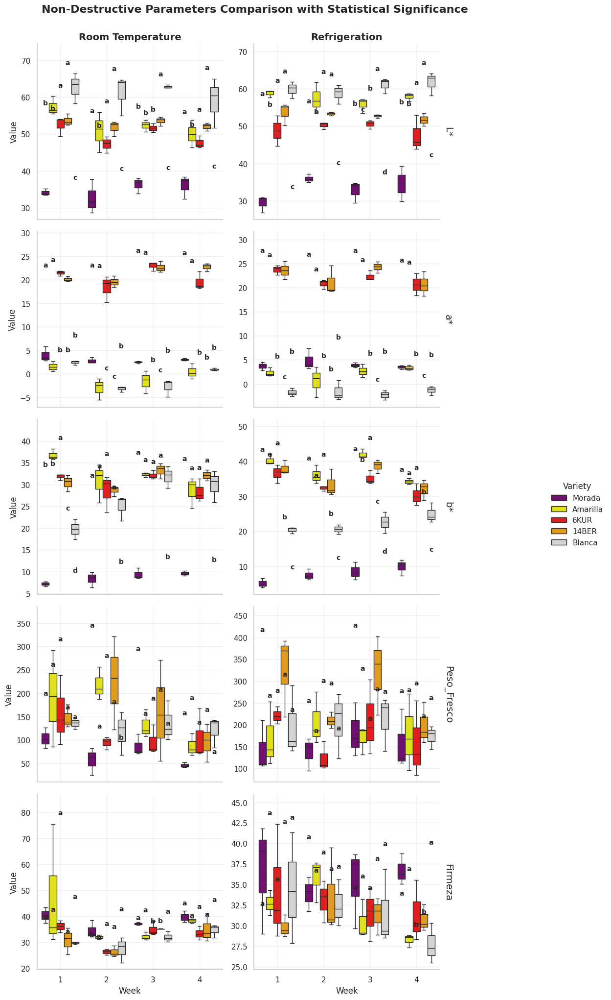

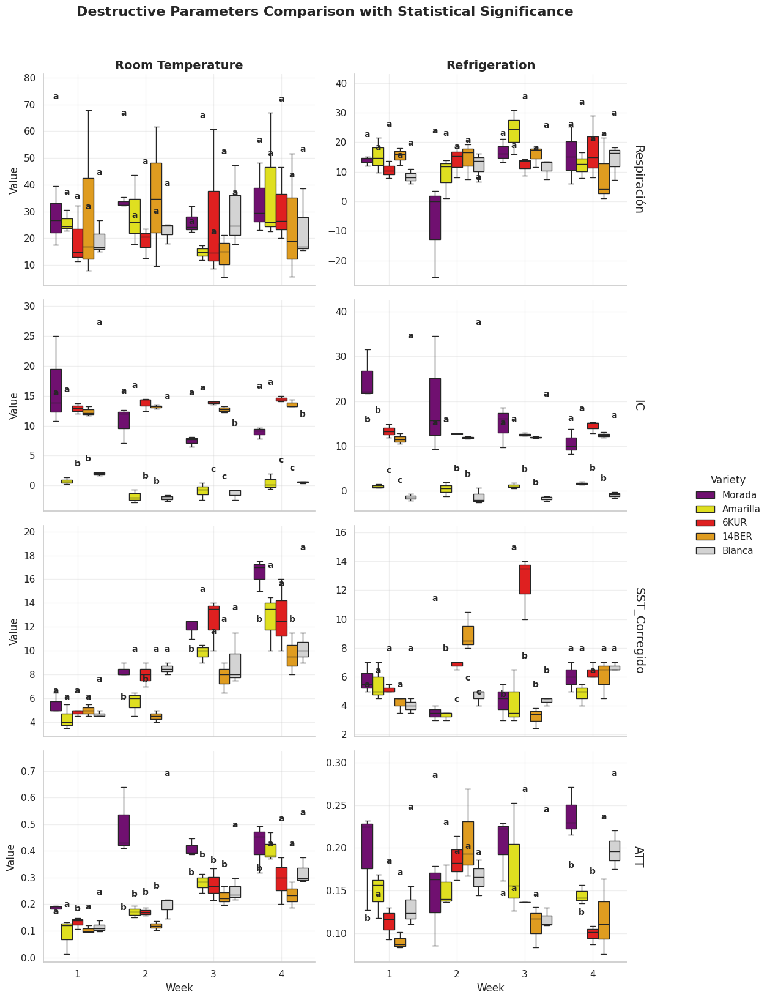

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import os
from itertools import product

# Configuración de estilo
plt.style.use('default')
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [12, 20]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.titleweight'] = 'bold'

# Paleta de colores para variedades
variety_palette = {
    "6KUR": "red",
    "14BER": "orange",
    "Amarilla": "yellow",
    "Blanca": "lightgray",
    "Morada": "purple"
}

def load_carrot_data(file_path, week):
    """Cargar datos de zanahorias desde archivos Excel"""
    try:
        # Leer hojas de Excel
        amb_data = pd.read_excel(file_path, sheet_name='Ambiente')
        refri_data = pd.read_excel(file_path, sheet_name='Refrigeración')

        # Agregar información de semana y tratamiento
        amb_data['Week'] = week
        amb_data['Treatment'] = 'Room Temperature'
        refri_data['Week'] = week
        refri_data['Treatment'] = 'Refrigeration'

        # Combinar datos
        combined_data = pd.concat([amb_data, refri_data], ignore_index=True)

        # Limpiar nombres de columnas
        combined_data.columns = combined_data.columns.str.strip()

        # Corregir nombres de variedades para coincidir con la paleta
        combined_data['Variedad'] = combined_data['Variedad'].str.strip()
        combined_data['Variedad'] = combined_data['Variedad'].replace({
            'YELLOW': 'Amarilla',
            'WHITE': 'Blanca',
            'PURPLE': 'Morada'
        })

        # Convertir columnas numéricas
        numeric_cols = ['L*', 'a*', 'b*', 'Diametro', 'Longitud', 'Peso_Fresco',
                       'Peso_fresco_kg', 'm', 'Respiración', 'IC', 'ATAN', 'Hue',
                       'Croma', 'Firmeza', 'SST', 'SST_Corregido', 'NaOH',
                       'Acidez_Peso_Muestra', 'Factor_D', 'ATT']

        for col in numeric_cols:
            if col in combined_data.columns:
                combined_data[col] = pd.to_numeric(combined_data[col], errors='coerce')

        return combined_data
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return pd.DataFrame()

def perform_tukey_test(data, group_col, value_col):
    """Test de Tukey HSD con asignación de letras"""
    # Eliminar valores NaN
    data = data.dropna(subset=[value_col])

    # Verificar que hay suficientes datos
    if len(data[value_col].unique()) < 2:
        return {group: '' for group in data[group_col].unique()}

    # Realizar test Tukey
    try:
        tukey = pairwise_tukeyhsd(
            endog=data[value_col],
            groups=data[group_col],
            alpha=0.05
        )

        # Convertir resultados a DataFrame
        tukey_df = pd.DataFrame(tukey._results_table.data[1:],
                               columns=tukey._results_table.data[0])

        # Obtener medias de grupo y ordenar
        group_means = data.groupby(group_col)[value_col].mean()
        sorted_groups = group_means.sort_values(ascending=False).index.tolist()

        # Inicializar letras
        letters = {group: '' for group in data[group_col].unique()}
        current_letter = 'a'

        # Asignar letras basadas en significancia
        for group in sorted_groups:
            if letters[group] == '':  # Si el grupo no tiene letra asignada
                letters[group] = current_letter
                # Encontrar todos los grupos no significativamente diferentes
                similar_groups = [group]
                for other_group in sorted_groups:
                    if other_group != group and letters[other_group] == '':
                        # Verificar si no son significativamente diferentes
                        reject = tukey_df[((tukey_df['group1'] == group) &
                                          (tukey_df['group2'] == other_group)) |
                                         ((tukey_df['group1'] == other_group) &
                                          (tukey_df['group2'] == group))]['reject'].values
                        if len(reject) > 0 and not reject[0]:
                            similar_groups.append(other_group)

                # Asignar misma letra a grupos similares
                for g in similar_groups:
                    letters[g] = current_letter

                current_letter = chr(ord(current_letter) + 1)

        return letters
    except Exception as e:
        print(f"Error in Tukey test for {value_col}: {e}")
        return {group: '' for group in data[group_col].unique()}

def plot_parameters_with_significance(data, destructive_params, non_destructive_params):
    """Visualización mejorada con letras de significancia correctamente posicionadas"""
    # Crear DataFrame fundido para parámetros no destructivos
    non_destructive_melt = data.melt(
        id_vars=['Week', 'Treatment', 'Variedad', 'Repetición'],
        value_vars=non_destructive_params,
        var_name='Parameter',
        value_name='Value'
    ).dropna()

    # Crear DataFrame fundido para parámetros destructivos
    destructive_melt = data.melt(
        id_vars=['Week', 'Treatment', 'Variedad', 'Repetición'],
        value_vars=destructive_params,
        var_name='Parameter',
        value_name='Value'
    ).dropna()

    # Crear figura con dos subplots verticales
    fig = plt.figure(figsize=(15, 30))
    gs = fig.add_gridspec(2, 1, hspace=0.4)

    # Graficar parámetros no destructivos
    ax1 = fig.add_subplot(gs[0, 0])
    g1 = sns.FacetGrid(
        data=non_destructive_melt,
        row='Parameter',
        col='Treatment',
        margin_titles=True,
        height=4,
        aspect=1.2,
        sharey=False,
        sharex=True
    )

    g1.map_dataframe(
        sns.boxplot,
        x='Week',
        y='Value',
        hue='Variedad',
        palette=variety_palette,
        dodge=True,
        width=0.8,
        fliersize=3,
        linewidth=1
    )

    # Añadir letras de significancia para parámetros no destructivos
    for ax, (param, treat) in zip(g1.axes.flat,
                                 product(non_destructive_params,
                                         non_destructive_melt['Treatment'].unique())):
        subset = non_destructive_melt[(non_destructive_melt['Parameter'] == param) &
                                    (non_destructive_melt['Treatment'] == treat)]

        if subset.empty:
            continue

        y_min, y_max = ax.get_ylim()
        y_range = y_max - y_min

        # Obtener las posiciones de las cajas en el gráfico
        varieties = sorted(subset['Variedad'].unique())
        n_varieties = len(varieties)
        n_weeks = len(subset['Week'].unique())

        # Seaborn usa posiciones enteras para las semanas (0, 1, 2...)
        # y desplazamiento (dodge) para las variedades dentro de cada semana
        for week_idx, week in enumerate(sorted(subset['Week'].unique())):
            week_data = subset[subset['Week'] == week]

            if len(varieties) > 1:
                letters = perform_tukey_test(week_data, 'Variedad', 'Value')

                # Calcular posición x base para esta semana
                week_x_pos = week_idx  # seaborn usa posiciones enteras para las semanas

                # Calcular el desplazamiento (dodge) para cada variedad
                total_width = 0.8  # ancho total que seaborn usa para agrupar las cajas
                box_width = total_width / n_varieties

                for i, var in enumerate(varieties):
                    # Calcular la posición x exacta de esta caja
                    x_pos = week_x_pos - total_width/2 + box_width/2 + i*box_width

                    box_data = week_data[week_data['Variedad'] == var]['Value'].dropna()
                    if len(box_data) > 0:
                        # Calcular posición y arriba del bigote superior
                        q3 = np.percentile(box_data, 75)
                        iqr = np.percentile(box_data, 75) - np.percentile(box_data, 25)
                        upper_whisker = q3 + 1.5*iqr
                        max_value = np.max(box_data[box_data <= upper_whisker])

                        y_pos = max_value + 0.05 * y_range

                        # Añadir texto con la letra de significancia
                        ax.text(
                            x_pos, y_pos, letters[var],
                            ha='center', va='bottom',
                            fontweight='bold', fontsize=10
                        )

        ax.set_ylim(y_min, y_max + 0.15 * y_range)

    # Ajustes de estilo para no destructivos
    g1.set_titles(col_template="{col_name}", row_template="{row_name}", size=14)
    g1.set_axis_labels("Week", "Value")
    g1.fig.suptitle('Non-Destructive Parameters Comparison with Statistical Significance',
                   y=1.02, fontsize=16, fontweight='bold')
    g1.add_legend(title='Variety', bbox_to_anchor=(1.05, 0.5), loc='center left')

    for ax in g1.axes.flat:
        ax.grid(True, alpha=0.3)
        weeks = sorted(non_destructive_melt['Week'].unique())
        ax.set_xticks(range(len(weeks)), labels=[str(int(w)) for w in weeks])

    # Graficar parámetros destructivos
    ax2 = fig.add_subplot(gs[1, 0])
    g2 = sns.FacetGrid(
        data=destructive_melt,
        row='Parameter',
        col='Treatment',
        margin_titles=True,
        height=4,
        aspect=1.2,
        sharey=False,
        sharex=True
    )

    g2.map_dataframe(
        sns.boxplot,
        x='Week',
        y='Value',
        hue='Variedad',
        palette=variety_palette,
        dodge=True,
        width=0.8,
        fliersize=3,
        linewidth=1
    )

    # Añadir letras de significancia para parámetros destructivos
    for ax, (param, treat) in zip(g2.axes.flat,
                                 product(destructive_params,
                                         destructive_melt['Treatment'].unique())):
        subset = destructive_melt[(destructive_melt['Parameter'] == param) &
                                (destructive_melt['Treatment'] == treat)]

        if subset.empty:
            continue

        y_min, y_max = ax.get_ylim()
        y_range = y_max - y_min

        # Obtener las posiciones de las cajas en el gráfico
        varieties = sorted(subset['Variedad'].unique())
        n_varieties = len(varieties)
        n_weeks = len(subset['Week'].unique())

        for week_idx, week in enumerate(sorted(subset['Week'].unique())):
            week_data = subset[subset['Week'] == week]

            if len(varieties) > 1:
                letters = perform_tukey_test(week_data, 'Variedad', 'Value')

                # Calcular posición x base para esta semana
                week_x_pos = week_idx

                # Calcular el desplazamiento (dodge) para cada variedad
                total_width = 0.8
                box_width = total_width / n_varieties

                for i, var in enumerate(varieties):
                    # Calcular la posición x exacta de esta caja
                    x_pos = week_x_pos - total_width/2 + box_width/2 + i*box_width

                    box_data = week_data[week_data['Variedad'] == var]['Value'].dropna()
                    if len(box_data) > 0:
                        q3 = np.percentile(box_data, 75)
                        iqr = np.percentile(box_data, 75) - np.percentile(box_data, 25)
                        upper_whisker = q3 + 1.5*iqr
                        max_value = np.max(box_data[box_data <= upper_whisker])

                        y_pos = max_value + 0.05 * y_range

                        ax.text(
                            x_pos, y_pos, letters[var],
                            ha='center', va='bottom',
                            fontweight='bold', fontsize=10
                        )

        ax.set_ylim(y_min, y_max + 0.15 * y_range)

    # Ajustes de estilo para destructivos
    g2.set_titles(col_template="{col_name}", row_template="{row_name}", size=14)
    g2.set_axis_labels("Week", "Value")
    g2.fig.suptitle('Destructive Parameters Comparison with Statistical Significance',
                   y=1.02, fontsize=16, fontweight='bold')
    g2.add_legend(title='Variety', bbox_to_anchor=(1.05, 0.5), loc='center left')

    for ax in g2.axes.flat:
        ax.grid(True, alpha=0.3)
        weeks = sorted(destructive_melt['Week'].unique())
        ax.set_xticks(range(len(weeks)), labels=[str(int(w)) for w in weeks])

    plt.tight_layout()
    plt.show()

# Ejecución principal
if __name__ == "__main__":
    # Definir archivos y semanas
    files_weeks = [
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/7 10.xlsx", 1),
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 15 10 24  Colab_CadenaF_TAmb.xlsx", 2),
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 21 10 024.xlsx", 3),
        ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/ Muestreo 28 10 024.xlsx", 4)
    ]

    try:
        # Cargar todos los datos
        all_data = []
        for file_path, week in files_weeks:
            data = load_carrot_data(file_path, week)
            if not data.empty:
                all_data.append(data)

        # Combinar todos los DataFrames
        data = pd.concat(all_data, ignore_index=True)

        # Limpieza de datos adicional
        data = data.dropna(how='all')
        data['Variedad'] = data['Variedad'].str.strip()

        print("Datos cargados exitosamente")
        print(f"Muestras totales: {len(data)}")
        print(f"Muestras a temperatura ambiente: {len(data[data['Treatment'] == 'Room Temperature'])}")
        print(f"Muestras en refrigeración: {len(data[data['Treatment'] == 'Refrigeration'])}")
        print("\nVariedades encontradas:")
        print(data['Variedad'].value_counts())
        print("\nDatos de muestra:")
        print(data[['Week', 'Treatment', 'Variedad', 'Repetición', 'L*', 'a*', 'b*']].head())

        # Definir parámetros destructivos y no destructivos
        non_destructive_params = ['L*', 'a*', 'b*', 'Peso_Fresco', 'Firmeza']
        destructive_params = ['Respiración', 'IC', 'SST_Corregido', 'ATT']

        # Graficar con significancia
        plot_parameters_with_significance(data, destructive_params, non_destructive_params)

    except Exception as e:
        print(f"Error en la ejecución: {e}")

In [ ]:
print(df_total.columns)  # Verifica los nombres reales de las columnas

Index(['Tiempo', 'Variedad', 'Repetición', 'L', 'a', 'b', 'Diametro',
       'Longitud', 'Peso_Fresco', 'Peso_fresco_kg', 'm', 'Respiración', 'IC',
       'ATAN', 'Hue', 'Croma', 'Firmeza', 'SST', 'SST_Corregido', 'NaOH',
       'Acidez_Peso_Muestra', 'Factor_D', 'ATT', 'Tratamiento', 'Archivo', 'L',
       'a', 'b'],
      dtype='object')


In [ ]:
from scipy.signal import savgol_filter

In [ ]:
import os

ruta = "/content/drive/MyDrive/Colab Notebooks/Espectral/Data/"
if os.path.exists(ruta):
    print("Contenido de la carpeta:", os.listdir(ruta))
else:
    print("La ruta no existe")


Contenido de la carpeta: ['2024_Oct_16', '2024_Oct_23', '2024_Oct_09', '2024_Oct_30', 'ANALISIS', 'Carotenoides_zanahoria.ipynb', 'DATA', 'Carotenoides.xlsx']


In [ ]:
import pandas as pd

# Definir la función load_data (asegúrate de que esté implementada correctamente)
def load_data(week, file_path, treatment):
    """Carga datos desde un archivo CSV y agrega información de semana y tratamiento."""
    df = pd.read_csv(file_path)
    df['Week'] = week
    df['Treatment'] = treatment
    return df

# Cargar todos los datos
path_base = '/content/drive/MyDrive/Colab Notebooks/Espectral/Data/'
try:
    data = pd.concat([
        load_data(1, f'{path_base}2024_Oct_09/2024_Oct_09/AMBIENTE/2024_OCT_09_AMBIENTE_NOR (1).csv', 'Ambiente'),
        load_data(1, f'{path_base}2024_Oct_09/2024_Oct_09/REFRI/2024_OCT_09 (1).csv', 'Refrigeración'),
        load_data(2, f'{path_base}2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/AMBIENTE/2024_OCT_16_AMB_NOR (1).csv', 'Ambiente'),
        load_data(2, f'{path_base}2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/REFRI/2024_OCT_16_REFRI_NOR (1).csv', 'Refrigeración'),
        load_data(3, f'{path_base}2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/AMBIENTE/2024_OCT_23_AMB_NORM (1).csv', 'Ambiente'),
        load_data(3, f'{path_base}2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/REFRI/2024_OCT_23_REFRI_NORM (1).csv', 'Refrigeración'),
        load_data(4, f'{path_base}2024_Oct_30/2024_Oct_30/AMBIENTE/2024_OCT_30_AMB_NORM (1).csv', 'Ambiente'),
        load_data(4, f'{path_base}2024_Oct_30/2024_Oct_30/REFRI/2024_OCT_30_REFRI_NORM (1).csv', 'Refrigeración')
    ])

    # Verificar que se hayan cargado datos para el tratamiento "Ambiente"
    print("Datos cargados:")
    print(data.head())  # Muestra las primeras filas del DataFrame
    print("\nTotal de muestras para el tratamiento 'Ambiente':")
    print(data[data['Treatment'] == 'Ambiente'].shape[0])  # Cuenta las muestras para 'Ambiente'

except Exception as e:
    print(f"Error al cargar los datos: {e}")


Datos cargados:
   Wvl  Reflect. %  Material  Week Treatment
0  350     49.0787  AMARILLO     1  Ambiente
1  351     49.0713  AMARILLO     1  Ambiente
2  352     49.0654  AMARILLO     1  Ambiente
3  353     49.0578  AMARILLO     1  Ambiente
4  354     49.0452  AMARILLO     1  Ambiente

Total de muestras para el tratamiento 'Ambiente':
93060


In [ ]:
# Main execution
if __name__ == "__main__":
    path_base = '/content/drive/MyDrive/Colab Notebooks/Espectral/Data/'
    try:
        data = pd.concat([
            load_data(4, f'{path_base}2024_Oct_09/2024_Oct_09/AMBIENTE/2024_OCT_09_AMBIENTE_NOR.csv', 'Ambient'),
            load_data(4, f'{path_base}2024_Oct_09/2024_Oct_09/REFRI/2024_OCT_09.csv', 'Refrigeration'),
            load_data(3, f'{path_base}2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/AMBIENTE/2024_OCT_16_AMB_NOR.csv', 'Ambient'),
            load_data(3, f'{path_base}2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/REFRI/2024_OCT_16_REFRI_NOR.csv', 'Refrigeration'),
            load_data(1, f'{path_base}2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/AMBIENTE/2024_OCT_23_AMB_NORM.csv', 'Ambient'),
            load_data(1, f'{path_base}2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/REFRI/2024_OCT_23_REFRI_NORM.csv', 'Refrigeration'),
            load_data(2, f'{path_base}2024_Oct_30/2024_Oct_30/AMBIENTE/2024_OCT_30_AMB_NORM.csv', 'Ambient'),
            load_data(2, f'{path_base}2024_Oct_30/2024_Oct_30/REFRI/2024_OCT_30_REFRI_NORM.csv', 'Refrigeration')
        ])

        # Traducción de materiales al inglés (si es necesario)
        material_translation = {
            "BLANCO": "WHITE",
            "MORADA": "PURPLE",
            "AMARILLO": "YELLOW",
            # Agrega más si es necesario
        }
        data['Material_Base'] = data['Material_Base'].replace(material_translation)

        print("Data loaded successfully")
        print(f"Total samples: {len(data)}")
        print(f"Ambient samples: {len(data[data['Treatment'] == 'Ambient'])}")
        print(f"Refrigeration samples: {len(data[data['Treatment'] == 'Refrigeration'])}")
        print("\nSample data with replicates:")
        print(data[['Material', 'Material_Base', 'Replicate']].head(10))

        indices_df = calculate_indices(data)
        print("\nCalculated indices (including replicates):")
        print(indices_df.head())

        plot_indices_with_significance(indices_df)

    except Exception as e:
        print(f"Execution error: {e}")

Execution error: name 'load_data' is not defined


In [31]:
# ============================================================
# INSIDE DATA → INDICES + ART + POSTHOC FDR
# ============================================================

# !pip install pandas numpy openpyxl rpy2

import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")

# ============================================================
# 1. FUNCIONES
# ============================================================

def load_data(week, file_path, treatment):
    df = pd.read_csv(file_path)

    df["Week"] = str(week)
    df["Treatment"] = treatment

    df["Material_Base"] = df["Material"].astype(str).str.replace(r"_R\d+$", "", regex=True)
    df["Replicate"] = (
        df["Material"]
        .astype(str)
        .str.extract(r"_R(\d+)$")
        .fillna("0")
        .astype(int)
    )

    return df


def calculate_indices(spectral_df):
    spectral_df["Wvl"] = pd.to_numeric(spectral_df["Wvl"], errors="coerce")
    spectral_df["Reflect. %"] = pd.to_numeric(spectral_df["Reflect. %"], errors="coerce")

    pivot_df = spectral_df.pivot_table(
        index=["Week", "Treatment", "Material_Base", "Replicate"],
        columns="Wvl",
        values="Reflect. %",
        aggfunc="mean"
    ).reset_index()

    # índices
    pivot_df["mARI"] = (1/pivot_df[550] - 1/pivot_df[700]) * pivot_df[800]
    pivot_df["NDVI"] = (pivot_df[800] - pivot_df[670]) / (pivot_df[800] + pivot_df[670])
    pivot_df["CRI1"] = (1/pivot_df[510] - 1/pivot_df[550])
    pivot_df["CRI2"] = (1/pivot_df[510] - 1/pivot_df[700])

    return pivot_df


# ============================================================
# 2. CARGA DE DATOS (INSIDE)
# ============================================================

path_base = '/content/drive/MyDrive/Colab Notebooks/Espectral/Data/DATA_/'

data = pd.concat([
    load_data(3, f'{path_base}2024_Oct_09/INSIDE/AMBIENTE/2024_OCT_09_AMB_CORT.csv', 'Room temperature'),
    load_data(3, f'{path_base}2024_Oct_09/INSIDE/REFRI/2024_OCT_09_REFRI_CORT.csv', 'Refrigeration'),

    load_data(2, f'{path_base}2024_Oct_16/SM-1900_15B82D3/INSIDE/AMBIENTE/2024_OCT_16_AMB_CORT.csv', 'Room temperature'),
    load_data(2, f'{path_base}2024_Oct_16/SM-1900_15B82D3/INSIDE/REFRI/2024_OCT_16_REFRI_CORT.csv', 'Refrigeration'),

    load_data(1, f'{path_base}2024_Oct_23/SM-1900_15B82D3/INSIDE/AMBIENTE/2024_OCT_23_AMB_CORT.csv', 'Room temperature'),
    load_data(1, f'{path_base}2024_Oct_23/SM-1900_15B82D3/INSIDE/REFRI/2024_OCT_23_REFRI_CORT.csv', 'Refrigeration'),

    load_data(4, f'{path_base}2024_Oct_30/2024_Oct_30/INSIDE/AMBIENTE/2024_OCT_30_AMB_CORT.csv', 'Room temperature'),
    load_data(4, f'{path_base}2024_Oct_30/2024_Oct_30/INSIDE/REFRI/2024_OCT_30_REFRI_CORT.csv', 'Refrigeration')
], ignore_index=True)

# ============================================================
# 3. LIMPIEZA DE FACTORES (CRÍTICO)
# ============================================================

data["Treatment"] = data["Treatment"].replace({
    "Room temperature": "Room Temperature"
})

material_translation = {
    "BLANCO": "WHITE",
    "MORADA": "PURPLE",
    "AMARILLO": "YELLOW",
    "6KUR": "6KUR",
    "14BER": "14BER"
}

data["Material_Base"] = data["Material_Base"].replace(material_translation)

print("Datos cargados:", len(data))

# ============================================================
# 4. CALCULAR INDICES
# ============================================================

indices_df = calculate_indices(data)

indices_df = indices_df.dropna()

print("Indices listos")
print(indices_df.head())

# ============================================================
# 5. ART + FDR
# ============================================================

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r("""
options(repos = c(CRAN = "https://cloud.r-project.org"))
library(ARTool)
library(emmeans)
""")

index_vars = ["NDVI", "mARI", "CRI1", "CRI2"]

def run_art(df, variable):

    df = df.dropna(subset=[variable, "Material_Base", "Treatment", "Week", "Replicate"])

    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py"] = df

    r_code = f"""
    d <- df_py

    d$Material_Base <- factor(d$Material_Base,
        levels=c("6KUR","14BER","YELLOW","WHITE","PURPLE"))

    d$Treatment <- factor(d$Treatment,
        levels=c("Room Temperature","Refrigeration"))

    d$Week <- factor(d$Week,
        levels=c("1","2","3","4"))

    mod <- art({variable} ~ Material_Base * Treatment * Week, data=d)

    anova_df <- as.data.frame(anova(mod))
    anova_df$Effect <- rownames(anova_df)
    anova_df$Variable <- "{variable}"

    fit <- artlm(mod, "Material_Base")
    emm <- emmeans(fit, ~ Material_Base | Treatment * Week)

    pairs_df <- as.data.frame(pairs(emm, adjust="fdr"))
    pairs_df$Variable <- "{variable}"
    """

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        a = ro.conversion.rpy2py(ro.r("anova_df"))
        p = ro.conversion.rpy2py(ro.r("pairs_df"))

    return a, p


anova_list = []
posthoc_list = []

for var in index_vars:
    try:
        print("Procesando", var)
        a, p = run_art(indices_df.copy(), var)
        anova_list.append(a)
        posthoc_list.append(p)
    except Exception as e:
        print("Error en", var, e)

anova_final = pd.concat(anova_list)
posthoc_final = pd.concat(posthoc_list)

anova_final = anova_final.rename(columns={
    "F value": "F_value",
    "Pr(>F)": "p_value"
})

posthoc_final = posthoc_final.rename(columns={
    "p.value": "p_value"
})

# ============================================================
# 6. GUARDAR RESULTADOS
# ============================================================

with pd.ExcelWriter("RESULTADOS_INDICES_INSIDE_ART.xlsx") as writer:
    indices_df.to_excel(writer, "Indices", index=False)
    anova_final.to_excel(writer, "ANOVA", index=False)
    posthoc_final.to_excel(writer, "POSTHOC_FDR", index=False)

print("\nArchivo listo: RESULTADOS_INDICES_INSIDE_ART.xlsx")

# ============================================================
# 7. VISTA RÁPIDA
# ============================================================

print("\nANOVA:")
print(anova_final.head())

print("\nPOSTHOC:")
print(posthoc_final.head())

Datos cargados: 186120
Indices listos
Wvl Week      Treatment Material_Base  Replicate      350      351      352  \
0      1  Refrigeration         14BER          1  23.8593  23.7181  23.6623   
1      1  Refrigeration         14BER          2  23.4609  23.4082  23.4278   
2      1  Refrigeration         14BER          3  23.3768  23.2256  23.1511   
3      1  Refrigeration          6KUR          1  25.3753  25.2436  25.0860   
4      1  Refrigeration          6KUR          2  25.9862  25.9648  25.9718   

Wvl      353      354      355  ...    1895    1896    1897    1898    1899  \
0    23.6184  23.5162  23.3173  ...  4.9051  4.8919  4.8803  4.8691  4.8577   
1    23.3827  23.1277  22.8175  ...  5.1193  5.1061  5.0930  5.0806  5.0693   
2    23.1047  23.0478  22.9074  ...  5.5312  5.5114  5.4927  5.4767  5.4653   
3    24.8774  24.5726  24.2336  ...  4.5005  4.4832  4.4658  4.4504  4.4390   
4    25.9326  25.7592  25.4525  ...  4.7957  4.7763  4.7592  4.7445  4.7325   

Wvl    1900 

Letras guardadas: LETRAS_INDICES_INSIDE_FDR.xlsx
  Index         Treatment Week Material Letters
0  mARI  Room Temperature    1     6KUR       a
1  mARI  Room Temperature    1    14BER       a
2  mARI  Room Temperature    1   YELLOW       b
3  mARI  Room Temperature    1    WHITE       b
4  mARI  Room Temperature    1   PURPLE       b


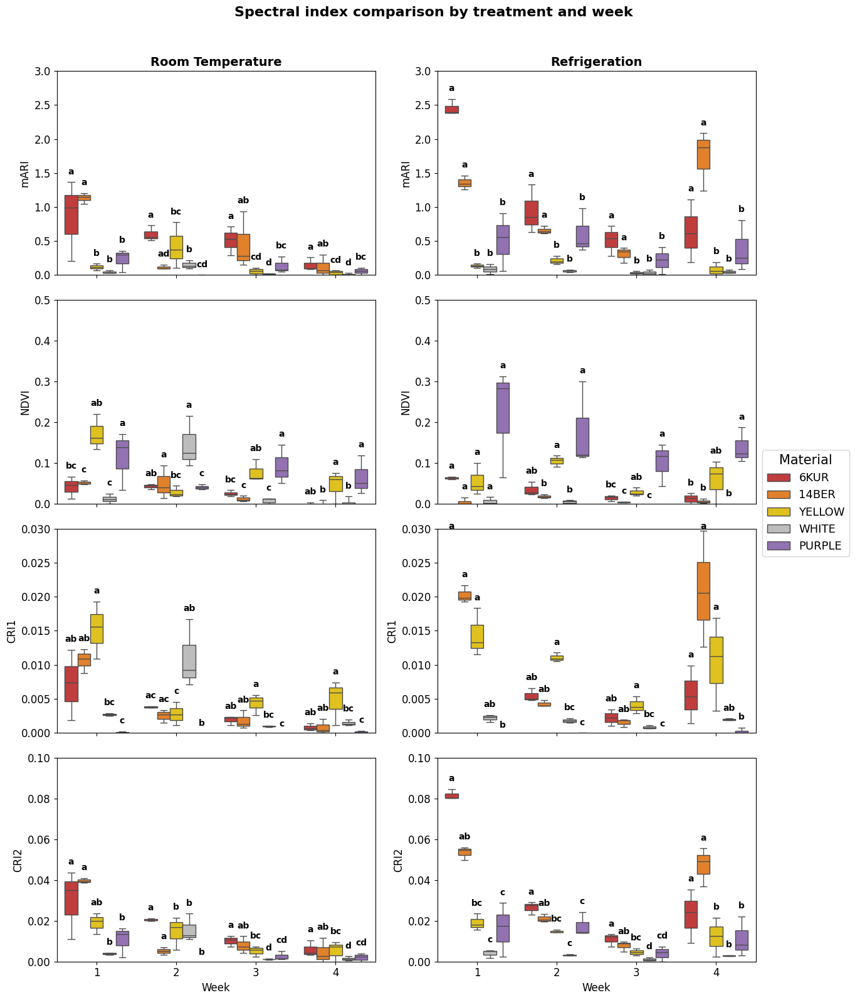

Figura guardada: figuras_indices_inside/Panel_indices_INSIDE_ART_FDR.png


In [32]:
import os
import string
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# CONFIGURACIÓN
# ============================================================

sns.set_theme(style="whitegrid")
plt.style.use("default")
plt.rcParams["font.size"] = 12
plt.rcParams["axes.titlesize"] = 13
plt.rcParams["axes.titleweight"] = "bold"

file_path = "RESULTADOS_INDICES_INSIDE_ART.xlsx"

indices_df = pd.read_excel(file_path, sheet_name="Indices")
posthoc_indices = pd.read_excel(file_path, sheet_name="POSTHOC_FDR")

index_vars = ["mARI", "NDVI", "CRI1", "CRI2"]

index_labels = {
    "mARI": "mARI",
    "NDVI": "NDVI",
    "CRI1": "CRI1",
    "CRI2": "CRI2"
}

material_palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "YELLOW": "#FFD700",
    "WHITE": "#bdbdbd",
    "PURPLE": "#9467bd"
}

material_order = ["6KUR", "14BER", "YELLOW", "WHITE", "PURPLE"]
week_order = ["1", "2", "3", "4"]
treatment_order = ["Room Temperature", "Refrigeration"]

# Escalas fijas para índices
y_limits = {
    "NDVI": (0, 0.5),
    "mARI": (0, 3),
    "CRI1": (0, 0.030),
    "CRI2": (0, 0.1)
}

indices_df["Week"] = indices_df["Week"].astype(str)
indices_df["Treatment"] = indices_df["Treatment"].astype(str)
indices_df["Material_Base"] = indices_df["Material_Base"].astype(str)
indices_df["Replicate"] = indices_df["Replicate"].astype(str)

posthoc_indices["Week"] = posthoc_indices["Week"].astype(str)
posthoc_indices["Treatment"] = posthoc_indices["Treatment"].astype(str)
posthoc_indices["Variable"] = posthoc_indices["Variable"].astype(str)
posthoc_indices["contrast"] = posthoc_indices["contrast"].astype(str)

# ============================================================
# FUNCIONES PARA LETRAS DESDE POSTHOC
# ============================================================

def parse_contrast(txt):
    parts = [p.strip() for p in str(txt).split(" - ")]
    if len(parts) != 2:
        return None, None
    return parts[0], parts[1]


def bron_kerbosch(R, P, X, neighbors, cliques):
    if not P and not X:
        cliques.append(R)
        return

    for v in list(P):
        bron_kerbosch(
            R | {v},
            P & neighbors[v],
            X & neighbors[v],
            neighbors,
            cliques
        )
        P.remove(v)
        X.add(v)


def maximal_cliques_from_nonsig(groups, nonsig_pairs):
    neighbors = {g: set() for g in groups}

    for a, b in nonsig_pairs:
        neighbors[a].add(b)
        neighbors[b].add(a)

    cliques = []
    bron_kerbosch(set(), set(groups), set(), neighbors, cliques)

    for g in groups:
        if not any(g in c for c in cliques):
            cliques.append({g})

    return sorted(cliques, key=lambda c: (-len(c), sorted(list(c))))


def make_letters_for_panel(df_panel, posthoc_panel, variable, alpha=0.05):
    groups_present = [g for g in material_order if g in df_panel["Material_Base"].unique()]

    if len(groups_present) == 0:
        return {}

    means = (
        df_panel.groupby("Material_Base", observed=False)[variable]
        .mean()
        .reindex(groups_present)
    )

    pvals = {}

    for _, row in posthoc_panel.iterrows():
        a, b = parse_contrast(row["contrast"])
        if a is None:
            continue
        pvals[frozenset([a, b])] = row["p_value"]

    nonsig_pairs = set()

    for a, b in itertools.combinations(groups_present, 2):
        p = pvals.get(frozenset([a, b]), np.nan)
        if pd.notna(p) and p >= alpha:
            nonsig_pairs.add((a, b))

    cliques = maximal_cliques_from_nonsig(groups_present, nonsig_pairs)

    def clique_mean(c):
        vals = [means[g] for g in c if pd.notna(means[g])]
        return np.mean(vals) if len(vals) else -np.inf

    cliques = sorted(cliques, key=lambda c: (-clique_mean(c), -len(c)))

    letters_pool = list(string.ascii_lowercase)
    letters_pool += [f"a{i}" for i in range(1, 100)]

    group_letters = {g: "" for g in groups_present}

    for i, clique in enumerate(cliques):
        letter = letters_pool[i]
        for g in clique:
            group_letters[g] += letter

    next_idx = len(cliques)

    for g in groups_present:
        if group_letters[g] == "":
            group_letters[g] = letters_pool[next_idx]
            next_idx += 1

    for g in group_letters:
        uniq = []
        for ch in group_letters[g]:
            if ch not in uniq:
                uniq.append(ch)
        group_letters[g] = "".join(uniq)

    return group_letters


def compute_box_centers(n_weeks, n_hues, group_width=0.8):
    centers = {}
    box_width = group_width / n_hues

    for wi in range(n_weeks):
        for hi in range(n_hues):
            centers[(wi, hi)] = wi - group_width / 2 + box_width / 2 + hi * box_width

    return centers

# ============================================================
# GENERAR TABLA DE LETRAS
# ============================================================

letters_rows = []

for variable in index_vars:
    for treatment in treatment_order:
        for week in week_order:

            df_panel = indices_df[
                (indices_df["Treatment"] == treatment) &
                (indices_df["Week"] == week)
            ].copy()

            ph_panel = posthoc_indices[
                (posthoc_indices["Variable"] == variable) &
                (posthoc_indices["Treatment"] == treatment) &
                (posthoc_indices["Week"] == week)
            ].copy()

            if df_panel.empty:
                continue

            letters_map = make_letters_for_panel(
                df_panel=df_panel,
                posthoc_panel=ph_panel,
                variable=variable,
                alpha=0.05
            )

            for mat, let in letters_map.items():
                letters_rows.append({
                    "Index": variable,
                    "Treatment": treatment,
                    "Week": week,
                    "Material": mat,
                    "Letters": let
                })

letters_df = pd.DataFrame(letters_rows)
letters_df.to_excel("LETRAS_INDICES_INSIDE_FDR.xlsx", index=False)

print("Letras guardadas: LETRAS_INDICES_INSIDE_FDR.xlsx")
print(letters_df.head())

# ============================================================
# PREPARAR DATA PARA GRAFICAR
# ============================================================

plot_df = indices_df.melt(
    id_vars=["Week", "Treatment", "Material_Base", "Replicate"],
    value_vars=index_vars,
    var_name="Index",
    value_name="Value"
).dropna()

# ============================================================
# FIGURA MULTIPANEL
# ============================================================

os.makedirs("figuras_indices_inside", exist_ok=True)

n_rows = len(index_vars)

fig, axes = plt.subplots(
    n_rows, 2,
    figsize=(14, 4 * n_rows),
    sharex=True,
    sharey=False
)

if n_rows == 1:
    axes = np.array([axes])

for r, idx in enumerate(index_vars):
    for c, treatment in enumerate(treatment_order):

        ax = axes[r][c]

        sub = plot_df[
            (plot_df["Index"] == idx) &
            (plot_df["Treatment"] == treatment)
        ].copy()

        sns.boxplot(
            data=sub,
            x="Week",
            y="Value",
            hue="Material_Base",
            palette=material_palette,
            order=week_order,
            hue_order=material_order,
            ax=ax,
            fliersize=3,
            linewidth=1,
            dodge=True
        )

        if r == 0:
            ax.set_title(treatment, fontsize=14, fontweight="bold")
        else:
            ax.set_title("")

        ax.set_xlabel("Week" if r == n_rows - 1 else "")
        ax.set_ylabel(index_labels.get(idx, idx))

        if idx in y_limits:
            ax.set_ylim(y_limits[idx])

        if ax.legend_ is not None:
            ax.legend_.remove()

        # Letras
        let_sub = letters_df[
            (letters_df["Index"] == idx) &
            (letters_df["Treatment"] == treatment)
        ].copy()

        if not let_sub.empty:
            centers = compute_box_centers(
                len(week_order),
                len(material_order),
                group_width=0.8
            )

            y0, y1 = ax.get_ylim()
            y_range = y1 - y0
            offset = 0.03 * y_range

            for wi, week in enumerate(week_order):
                sub_week = sub[sub["Week"] == week].copy()
                letters_week = let_sub[let_sub["Week"] == week].copy()

                if sub_week.empty or letters_week.empty:
                    continue

                for hi, mat in enumerate(material_order):
                    mat_data = sub_week[sub_week["Material_Base"] == mat]["Value"].dropna()

                    if mat_data.empty:
                        continue

                    row_letter = letters_week[letters_week["Material"] == mat]

                    if row_letter.empty:
                        continue

                    letter = str(row_letter.iloc[0]["Letters"]).strip()

                    if letter == "":
                        continue

                    q1 = np.percentile(mat_data, 25)
                    q3 = np.percentile(mat_data, 75)
                    iqr = q3 - q1
                    upper_bound = q3 + 1.5 * iqr
                    valid = mat_data[mat_data <= upper_bound]

                    y_text = (valid.max() if len(valid) > 0 else mat_data.max()) + offset
                    y_text = min(y_text, y1 - 0.01 * y_range)

                    x_text = centers[(wi, hi)]

                    ax.text(
                        x_text,
                        y_text,
                        letter,
                        ha="center",
                        va="bottom",
                        fontsize=10,
                        fontweight="bold",
                        color="black"
                    )

# Leyenda única
handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    title="Material",
    loc="center right",
    bbox_to_anchor=(0.98, 0.5),
    fontsize=13,
    title_fontsize=15,
    frameon=True
)

fig.suptitle(
    "Spectral index comparison by treatment and week",
    fontsize=16,
    fontweight="bold",
    y=0.995
)

plt.tight_layout(rect=[0, 0, 0.88, 0.98])

out_path = "figuras_indices_inside/Panel_indices_INSIDE_ART_FDR.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Figura guardada: {out_path}")

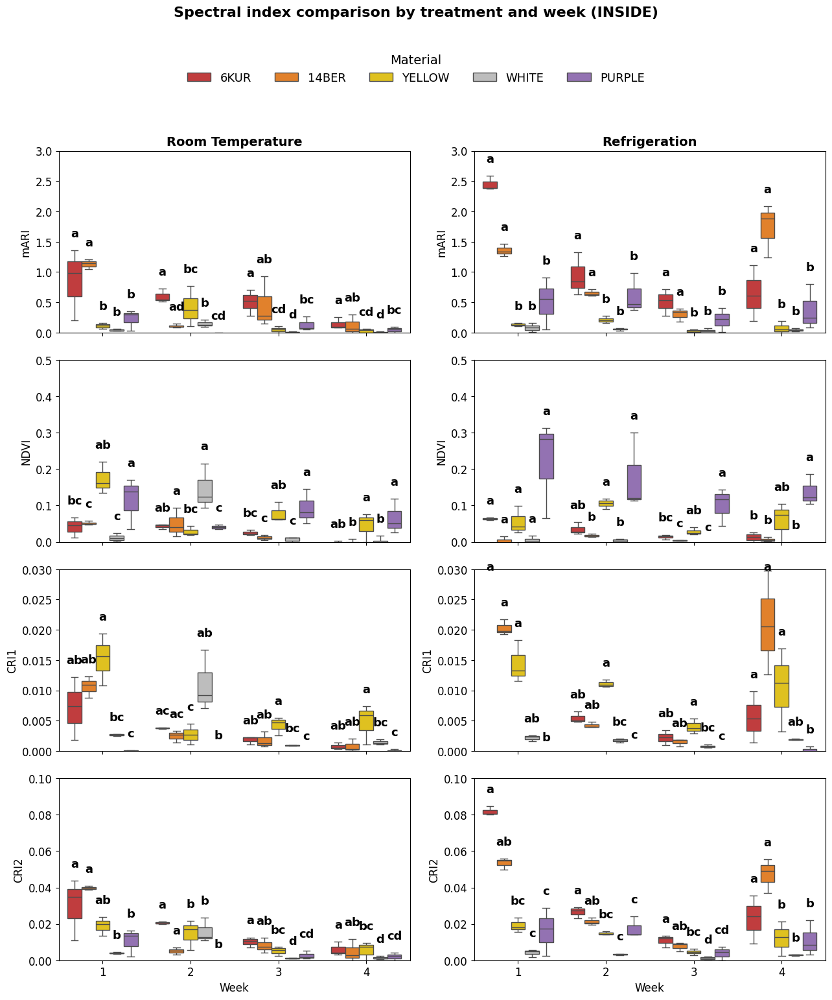

Figura guardada: figuras_indices_inside/Panel_indices_INSIDE_MEJORADO.png


In [33]:
# ============================================================
# FIGURA MULTIPANEL OPTIMIZADA (INSIDE)
# ============================================================

os.makedirs("figuras_indices_inside", exist_ok=True)

n_rows = len(index_vars)

fig, axes = plt.subplots(
    n_rows, 2,
    figsize=(13, 3.6 * n_rows),   # 🔥 más compacto
    sharex=True,
    sharey=False
)

if n_rows == 1:
    axes = np.array([axes])

for r, idx in enumerate(index_vars):
    for c, treatment in enumerate(treatment_order):

        ax = axes[r][c]

        sub = plot_df[
            (plot_df["Index"] == idx) &
            (plot_df["Treatment"] == treatment)
        ].copy()

        sns.boxplot(
            data=sub,
            x="Week",
            y="Value",
            hue="Material_Base",
            palette=material_palette,
            order=week_order,
            hue_order=material_order,
            ax=ax,
            fliersize=3,
            linewidth=1,
            dodge=True
        )

        # títulos solo arriba
        if r == 0:
            ax.set_title(treatment, fontsize=14, fontweight="bold")

        ax.set_xlabel("Week" if r == n_rows - 1 else "")
        ax.set_ylabel(index_labels.get(idx, idx))

        if idx in y_limits:
            ax.set_ylim(y_limits[idx])

        if ax.legend_ is not None:
            ax.legend_.remove()

        # ====================================================
        # LETRAS MEJORADAS
        # ====================================================

        let_sub = letters_df[
            (letters_df["Index"] == idx) &
            (letters_df["Treatment"] == treatment)
        ].copy()

        if not let_sub.empty:

            centers = compute_box_centers(len(week_order), len(material_order))

            y0, y1 = ax.get_ylim()
            y_range = y1 - y0

            offset = 0.06 * y_range   # 🔥 más separación

            for wi, week in enumerate(week_order):

                sub_week = sub[sub["Week"] == week]
                letters_week = let_sub[let_sub["Week"] == week]

                if sub_week.empty or letters_week.empty:
                    continue

                for hi, mat in enumerate(material_order):

                    mat_data = sub_week[
                        sub_week["Material_Base"] == mat
                    ]["Value"].dropna()

                    if mat_data.empty:
                        continue

                    row_letter = letters_week[
                        letters_week["Material"] == mat
                    ]

                    if row_letter.empty:
                        continue

                    letter = str(row_letter.iloc[0]["Letters"]).strip()

                    if letter == "":
                        continue

                    # posición superior robusta
                    y_text = mat_data.max() + offset
                    y_text = min(y_text, y1 - 0.02 * y_range)

                    x_text = centers[(wi, hi)]

                    ax.text(
                        x_text,
                        y_text,
                        letter,
                        ha="center",
                        va="bottom",
                        fontsize=13,   # 🔥 MÁS GRANDE
                        fontweight="bold",
                        color="black"
                    )

# ============================================================
# LEYENDA ARRIBA (TIPO JOURNAL)
# ============================================================

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title="Material",
    loc="upper center",
    bbox_to_anchor=(0.5, 1.03),
    ncol=5,                  # 🔥 horizontal
    fontsize=13,
    title_fontsize=14,
    frameon=False
)

# ============================================================
# TÍTULO
# ============================================================

fig.suptitle(
    "Spectral index comparison by treatment and week (INSIDE)",
    fontsize=16,
    fontweight="bold",
    y=1.07
)

plt.tight_layout(rect=[0, 0, 1, 0.97])

out_path = "figuras_indices_inside/Panel_indices_INSIDE_MEJORADO.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Figura guardada: {out_path}")

Datos OUTSIDE cargados correctamente
Total registros espectrales: 186120
      Material Material_Base  Replicate Week         Treatment
0  AMARILLO_R1        YELLOW          1    3  Room Temperature
1  AMARILLO_R1        YELLOW          1    3  Room Temperature
2  AMARILLO_R1        YELLOW          1    3  Room Temperature
3  AMARILLO_R1        YELLOW          1    3  Room Temperature
4  AMARILLO_R1        YELLOW          1    3  Room Temperature

Índices calculados:
Wvl Week      Treatment Material_Base Replicate      mARI      NDVI      CRI1  \
0      1  Refrigeration         14BER         1  4.500492  0.111553  0.041513   
1      1  Refrigeration         14BER         2  3.375836  0.110797  0.026321   
2      1  Refrigeration         14BER         3  4.226084  0.074964  0.043081   
3      1  Refrigeration          6KUR         1  3.905636  0.202969  0.040327   
4      1  Refrigeration          6KUR         2  3.762213  0.185589  0.037352   

Wvl      CRI2  
0    0.093688  
1    0.07

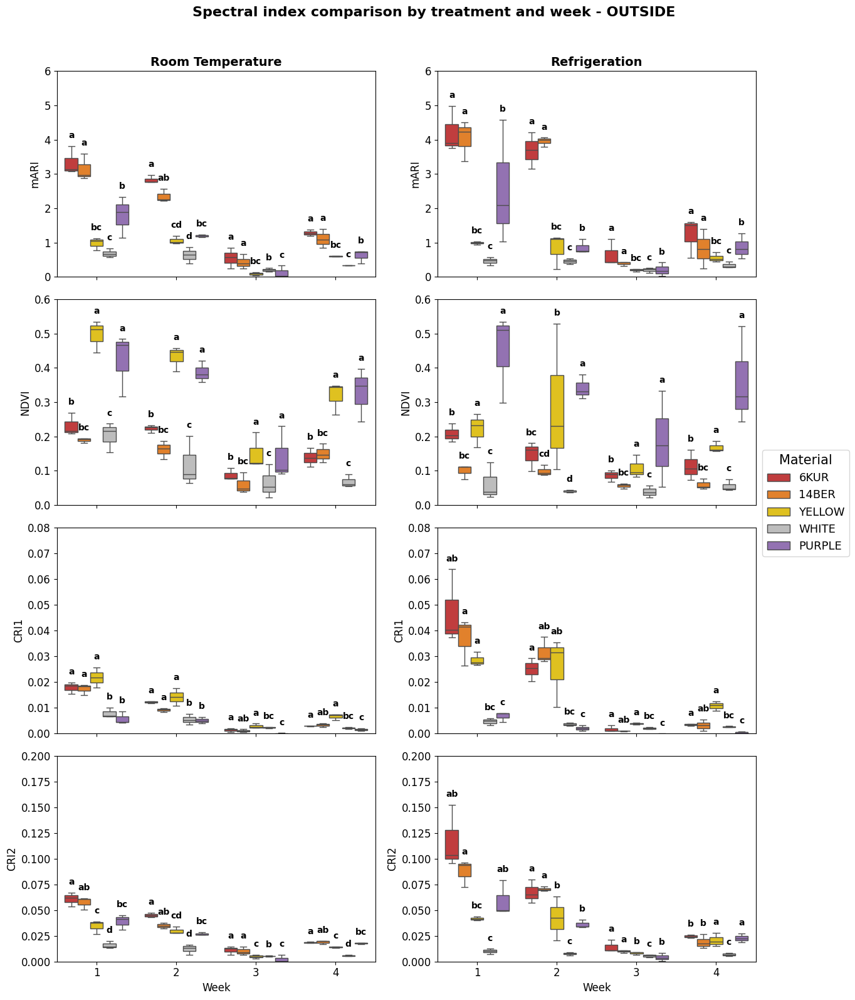

Figura guardada: figuras_indices_outside/Panel_indices_OUTSIDE_ART_FDR.png

ANOVA ART índices OUTSIDE:
                      Term    Df  Df.res         Sum Sq     Sum Sq.res  \
0            Material_Base   4.0    80.0  118739.750000   24458.000000   
1                Treatment   1.0    80.0   24253.633333  111410.666667   
2                     Week   3.0    80.0  120285.266667   21278.000000   
3  Material_Base:Treatment   4.0    80.0   34781.283333  104241.333333   
4       Material_Base:Week  12.0    80.0  112021.250000   30469.333333   

      F_value       p_value                   Effect Variable  partial_eta2  
0   97.096860  6.807851e-30            Material_Base     mARI      0.829201  
1   17.415663  7.579963e-05                Treatment     mARI      0.178777  
2  150.747585  7.985405e-33                     Week     mARI      0.849693  
3    6.673223  1.096134e-04  Material_Base:Treatment     mARI      0.250184  
4   24.510163  6.055753e-22       Material_Base:Week     mARI 

In [27]:
# ============================================================
# OUTSIDE DATA → ÍNDICES + ART + POSTHOC FDR + LETRAS + FIGURA
# ============================================================

# !pip install pandas numpy matplotlib seaborn openpyxl rpy2

import os
import string
import itertools
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore")

# ============================================================
# 1. CONFIGURACIÓN
# ============================================================

sns.set_theme(style="whitegrid")
plt.style.use("default")
plt.rcParams["font.size"] = 12
plt.rcParams["axes.titlesize"] = 13
plt.rcParams["axes.titleweight"] = "bold"

material_palette = {
    "6KUR": "#d62728",
    "14BER": "#ff7f0e",
    "YELLOW": "#FFD700",
    "WHITE": "#bdbdbd",
    "PURPLE": "#9467bd"
}

material_order = ["6KUR", "14BER", "YELLOW", "WHITE", "PURPLE"]
week_order = ["1", "2", "3", "4"]
treatment_order = ["Room Temperature", "Refrigeration"]

index_vars = ["mARI", "NDVI", "CRI1", "CRI2"]

index_labels = {
    "mARI": "mARI",
    "NDVI": "NDVI",
    "CRI1": "CRI1",
    "CRI2": "CRI2"
}

y_limits = {
    "NDVI": (0, 0.6),
    "mARI": (0, 6),
    "CRI1": (0, 0.080),
    "CRI2": (0, 0.20)
}

# ============================================================
# 2. FUNCIONES
# ============================================================

def load_data(week, file_path, treatment):
    df = pd.read_csv(file_path)

    df["Week"] = str(week)
    df["Treatment"] = treatment.replace("Ambient", "Room Temperature")

    df["Material_Base"] = df["Material"].astype(str).str.replace(r"_R\d+$", "", regex=True)
    df["Replicate"] = (
        df["Material"]
        .astype(str)
        .str.extract(r"_R(\d+)$")
        .fillna("0")
        .astype(int)
    )

    return df


def calculate_indices(spectral_df):
    spectral_df["Wvl"] = pd.to_numeric(spectral_df["Wvl"], errors="coerce")
    spectral_df["Reflect. %"] = pd.to_numeric(spectral_df["Reflect. %"], errors="coerce")

    pivot_df = spectral_df.pivot_table(
        index=["Week", "Treatment", "Material_Base", "Replicate", "Material"],
        columns="Wvl",
        values="Reflect. %",
        aggfunc="mean"
    ).reset_index()

    required_wvl = [510, 550, 670, 700, 800]
    missing = [w for w in required_wvl if w not in pivot_df.columns]

    if missing:
        raise ValueError(f"Faltan estas longitudes de onda: {missing}")

    pivot_df["mARI"] = (1 / pivot_df[550] - 1 / pivot_df[700]) * pivot_df[800]
    pivot_df["NDVI"] = (pivot_df[800] - pivot_df[670]) / (pivot_df[800] + pivot_df[670])
    pivot_df["CRI1"] = (1 / pivot_df[510] - 1 / pivot_df[550])
    pivot_df["CRI2"] = (1 / pivot_df[510] - 1 / pivot_df[700])

    return pivot_df

# ============================================================
# 3. CARGAR DATOS OUTSIDE
# ============================================================

path_base = "/content/drive/MyDrive/Colab Notebooks/Espectral/Data/DATA_/"

data = pd.concat([
    load_data(3, f"{path_base}2024_Oct_09/OUTSIDE/AMBIENTE/2024_OCT_09_AMBIENTE_NOR.csv", "Ambient"),
    load_data(3, f"{path_base}2024_Oct_09/OUTSIDE/REFRI/2024_OCT_09.csv", "Refrigeration"),

    load_data(4, f"{path_base}2024_Oct_16/SM-1900_15B82D3/OUTSIDE/AMBIENTE/2024_OCT_16_AMB_NOR.csv", "Ambient"),
    load_data(4, f"{path_base}2024_Oct_16/SM-1900_15B82D3/OUTSIDE/REFRI/2024_OCT_16_REFRI_NOR.csv", "Refrigeration"),

    load_data(1, f"{path_base}2024_Oct_23/SM-1900_15B82D3/OUTSIDE/AMBIENTE/2024_OCT_23_AMB_NORM.csv", "Ambient"),
    load_data(1, f"{path_base}2024_Oct_23/SM-1900_15B82D3/OUTSIDE/REFRI/2024_OCT_23_REFRI_NORM.csv", "Refrigeration"),

    load_data(2, f"{path_base}2024_Oct_30/2024_Oct_30/OUTSIDE/AMBIENTE/2024_OCT_30_AMB_NORM.csv", "Ambient"),
    load_data(2, f"{path_base}2024_Oct_30/2024_Oct_30/OUTSIDE/REFRI/2024_OCT_30_REFRI_NORM.csv", "Refrigeration")
], ignore_index=True)

material_translation = {
    "BLANCO": "WHITE",
    "MORADA": "PURPLE",
    "AMARILLO": "YELLOW",
    "6KUR": "6KUR",
    "14BER": "14BER"
}

data["Material_Base"] = data["Material_Base"].replace(material_translation)

print("Datos OUTSIDE cargados correctamente")
print("Total registros espectrales:", len(data))
print(data[["Material", "Material_Base", "Replicate", "Week", "Treatment"]].head())

# ============================================================
# 4. CALCULAR ÍNDICES
# ============================================================

indices_df = calculate_indices(data)

indices_df["Week"] = indices_df["Week"].astype(str).str.strip()
indices_df["Treatment"] = indices_df["Treatment"].astype(str).str.strip()
indices_df["Material_Base"] = indices_df["Material_Base"].astype(str).str.strip()
indices_df["Replicate"] = indices_df["Replicate"].astype(str).str.strip()

indices_df["Treatment"] = indices_df["Treatment"].replace({
    "Ambient": "Room Temperature",
    "Room temperature": "Room Temperature",
    "Room_Temperature": "Room Temperature"
})

indices_df["Material_Base"] = indices_df["Material_Base"].replace(material_translation)

print("\nÍndices calculados:")
print(indices_df[["Week", "Treatment", "Material_Base", "Replicate", "mARI", "NDVI", "CRI1", "CRI2"]].head())

# ============================================================
# 5. ART + EMMEANS + FDR
# ============================================================

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.conversion import localconverter

pandas2ri.activate()

ro.r("""
options(repos = c(CRAN = "https://cloud.r-project.org"))

pkgs <- c("ARTool", "emmeans")
for (p in pkgs) {
  if (!requireNamespace(p, quietly = TRUE)) {
    install.packages(p, dependencies = TRUE)
  }
}

suppressPackageStartupMessages({
  library(ARTool)
  library(emmeans)
})
""")

def run_art_indices(df_in, variable):
    df_in = df_in.copy()
    df_in = df_in.dropna(subset=["Material_Base", "Treatment", "Week", "Replicate", variable])

    with localconverter(ro.default_converter + pandas2ri.converter):
        ro.globalenv["df_py"] = df_in

    r_code = f"""
    suppressPackageStartupMessages({{
      library(ARTool)
      library(emmeans)
    }})

    d <- df_py[, c("Material_Base", "Treatment", "Week", "Replicate", "{variable}")]
    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    d$Material_Base <- factor(as.character(d$Material_Base),
      levels = c("6KUR", "14BER", "YELLOW", "WHITE", "PURPLE"))

    d$Treatment <- factor(as.character(d$Treatment),
      levels = c("Room Temperature", "Refrigeration"))

    d$Week <- factor(as.character(d$Week),
      levels = c("1", "2", "3", "4"))

    d <- d[complete.cases(d), ]
    d <- droplevels(d)

    mod <- art(as.formula("{variable} ~ Material_Base * Treatment * Week"), data = d)

    anova_df <- as.data.frame(anova(mod))
    anova_df$Effect <- rownames(anova_df)
    rownames(anova_df) <- NULL
    anova_df$Variable <- "{variable}"

    if (all(c("F value", "Df", "Df.res") %in% names(anova_df))) {{
      anova_df$partial_eta2 <- (anova_df[["F value"]] * anova_df[["Df"]]) /
                               ((anova_df[["F value"]] * anova_df[["Df"]]) + anova_df[["Df.res"]])
    }} else {{
      anova_df$partial_eta2 <- NA_real_
    }}

    fit <- artlm(mod, "Material_Base")
    emm <- emmeans(fit, ~ Material_Base | Treatment * Week)

    pairs_df <- as.data.frame(pairs(emm, adjust = "fdr"))
    pairs_df$Variable <- "{variable}"
    """

    ro.r(r_code)

    with localconverter(ro.default_converter + pandas2ri.converter):
        anova_out = ro.conversion.rpy2py(ro.r("anova_df"))
        posthoc_out = ro.conversion.rpy2py(ro.r("pairs_df"))

    return anova_out, posthoc_out


anova_list = []
posthoc_list = []

for var in index_vars:
    try:
        print(f"\nProcesando ART para {var}...")
        a, p = run_art_indices(indices_df.copy(), var)
        anova_list.append(a)
        posthoc_list.append(p)
        print(f"OK: {var}")
    except Exception as e:
        print(f"Error en {var}: {e}")

if len(anova_list) == 0:
    raise ValueError("No se pudo correr ART para ningún índice OUTSIDE.")

anova_indices = pd.concat(anova_list, ignore_index=True)
posthoc_indices = pd.concat(posthoc_list, ignore_index=True)

anova_indices = anova_indices.rename(columns={
    "F value": "F_value",
    "Pr(>F)": "p_value"
})

posthoc_indices = posthoc_indices.rename(columns={
    "p.value": "p_value"
})

with pd.ExcelWriter("RESULTADOS_INDICES_OUTSIDE_ART_FDR.xlsx", engine="openpyxl") as writer:
    indices_df.to_excel(writer, sheet_name="Data_Indices", index=False)
    anova_indices.to_excel(writer, sheet_name="ANOVA_ART", index=False)
    posthoc_indices.to_excel(writer, sheet_name="POSTHOC_FDR", index=False)

print("\nArchivo guardado: RESULTADOS_INDICES_OUTSIDE_ART_FDR.xlsx")

# ============================================================
# 6. LETRAS DESDE POSTHOC FDR
# ============================================================

def parse_contrast(txt):
    parts = [p.strip() for p in str(txt).split(" - ")]
    if len(parts) != 2:
        return None, None
    return parts[0], parts[1]


def bron_kerbosch(R, P, X, neighbors, cliques):
    if not P and not X:
        cliques.append(R)
        return
    for v in list(P):
        bron_kerbosch(R | {v}, P & neighbors[v], X & neighbors[v], neighbors, cliques)
        P.remove(v)
        X.add(v)


def maximal_cliques_from_nonsig(groups, nonsig_pairs):
    neighbors = {g: set() for g in groups}

    for a, b in nonsig_pairs:
        neighbors[a].add(b)
        neighbors[b].add(a)

    cliques = []
    bron_kerbosch(set(), set(groups), set(), neighbors, cliques)

    for g in groups:
        if not any(g in c for c in cliques):
            cliques.append({g})

    return sorted(cliques, key=lambda c: (-len(c), sorted(list(c))))


def make_letters_for_panel(df_panel, posthoc_panel, variable, alpha=0.05):
    groups_present = [g for g in material_order if g in df_panel["Material_Base"].unique()]

    if len(groups_present) == 0:
        return {}

    means = (
        df_panel.groupby("Material_Base", observed=False)[variable]
        .mean()
        .reindex(groups_present)
    )

    pvals = {}

    for _, row in posthoc_panel.iterrows():
        a, b = parse_contrast(row["contrast"])
        if a is None:
            continue
        pvals[frozenset([a, b])] = row["p_value"]

    nonsig_pairs = set()

    for a, b in itertools.combinations(groups_present, 2):
        p = pvals.get(frozenset([a, b]), np.nan)
        if pd.notna(p) and p >= alpha:
            nonsig_pairs.add((a, b))

    cliques = maximal_cliques_from_nonsig(groups_present, nonsig_pairs)

    def clique_mean(c):
        vals = [means[g] for g in c if pd.notna(means[g])]
        return np.mean(vals) if len(vals) else -np.inf

    cliques = sorted(cliques, key=lambda c: (-clique_mean(c), -len(c)))

    letters_pool = list(string.ascii_lowercase)
    letters_pool += [f"a{i}" for i in range(1, 100)]

    group_letters = {g: "" for g in groups_present}

    for i, clique in enumerate(cliques):
        letter = letters_pool[i]
        for g in clique:
            group_letters[g] += letter

    next_idx = len(cliques)

    for g in groups_present:
        if group_letters[g] == "":
            group_letters[g] = letters_pool[next_idx]
            next_idx += 1

    for g in group_letters:
        uniq = []
        for ch in group_letters[g]:
            if ch not in uniq:
                uniq.append(ch)
        group_letters[g] = "".join(uniq)

    return group_letters


letters_rows = []

for variable in index_vars:
    for treatment in treatment_order:
        for week in week_order:
            df_panel = indices_df[
                (indices_df["Treatment"] == treatment) &
                (indices_df["Week"] == week)
            ].copy()

            ph_panel = posthoc_indices[
                (posthoc_indices["Variable"] == variable) &
                (posthoc_indices["Treatment"] == treatment) &
                (posthoc_indices["Week"] == week)
            ].copy()

            if df_panel.empty:
                continue

            letters_map = make_letters_for_panel(df_panel, ph_panel, variable, alpha=0.05)

            for mat, let in letters_map.items():
                letters_rows.append({
                    "Index": variable,
                    "Treatment": treatment,
                    "Week": week,
                    "Material": mat,
                    "Letters": let
                })

letters_df = pd.DataFrame(letters_rows)
letters_df.to_excel("LETRAS_INDICES_OUTSIDE_ART_FDR.xlsx", index=False)

print("Archivo guardado: LETRAS_INDICES_OUTSIDE_ART_FDR.xlsx")
print(letters_df.head())

# ============================================================
# 7. FIGURA MULTIPANEL
# ============================================================

def compute_box_centers(n_weeks, n_hues, group_width=0.8):
    centers = {}
    box_width = group_width / n_hues

    for wi in range(n_weeks):
        for hi in range(n_hues):
            centers[(wi, hi)] = wi - group_width / 2 + box_width / 2 + hi * box_width

    return centers


plot_df = indices_df.melt(
    id_vars=["Week", "Treatment", "Material_Base", "Replicate", "Material"],
    value_vars=index_vars,
    var_name="Index",
    value_name="Value"
).dropna()

os.makedirs("figuras_indices_outside", exist_ok=True)

n_rows = len(index_vars)

fig, axes = plt.subplots(
    n_rows, 2,
    figsize=(14, 4 * n_rows),
    sharex=True,
    sharey=False
)

if n_rows == 1:
    axes = np.array([axes])

for r, idx in enumerate(index_vars):
    for c, treatment in enumerate(treatment_order):
        ax = axes[r][c]

        sub = plot_df[
            (plot_df["Index"] == idx) &
            (plot_df["Treatment"] == treatment)
        ].copy()

        sns.boxplot(
            data=sub,
            x="Week",
            y="Value",
            hue="Material_Base",
            palette=material_palette,
            order=week_order,
            hue_order=material_order,
            ax=ax,
            fliersize=3,
            linewidth=1,
            dodge=True
        )

        if r == 0:
            ax.set_title(treatment, fontsize=14, fontweight="bold")
        else:
            ax.set_title("")

        ax.set_xlabel("Week" if r == n_rows - 1 else "")
        ax.set_ylabel(index_labels.get(idx, idx))

        if idx in y_limits:
            ax.set_ylim(y_limits[idx])

        if ax.legend_ is not None:
            ax.legend_.remove()

        # Letras
        let_sub = letters_df[
            (letters_df["Index"] == idx) &
            (letters_df["Treatment"] == treatment)
        ].copy()

        if not let_sub.empty:
            centers = compute_box_centers(len(week_order), len(material_order), group_width=0.8)

            y0, y1 = ax.get_ylim()
            y_range = y1 - y0
            offset = 0.03 * y_range

            for wi, week in enumerate(week_order):
                sub_week = sub[sub["Week"] == week].copy()
                letters_week = let_sub[let_sub["Week"] == week].copy()

                if sub_week.empty or letters_week.empty:
                    continue

                for hi, mat in enumerate(material_order):
                    mat_data = sub_week[sub_week["Material_Base"] == mat]["Value"].dropna()

                    if mat_data.empty:
                        continue

                    row_letter = letters_week[letters_week["Material"] == mat]

                    if row_letter.empty:
                        continue

                    letter = str(row_letter.iloc[0]["Letters"]).strip()

                    if letter == "":
                        continue

                    q1 = np.percentile(mat_data, 25)
                    q3 = np.percentile(mat_data, 75)
                    iqr = q3 - q1
                    upper_bound = q3 + 1.5 * iqr
                    valid = mat_data[mat_data <= upper_bound]

                    y_text = (valid.max() if len(valid) > 0 else mat_data.max()) + offset
                    y_text = min(y_text, y1 - 0.01 * y_range)
                    x_text = centers[(wi, hi)]

                    ax.text(
                        x_text,
                        y_text,
                        letter,
                        ha="center",
                        va="bottom",
                        fontsize=10,
                        fontweight="bold",
                        color="black"
                    )

# Leyenda única
handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles,
    labels,
    title="Material",
    loc="center right",
    bbox_to_anchor=(0.98, 0.5),
    fontsize=13,
    title_fontsize=15,
    frameon=True
)

fig.suptitle(
    "Spectral index comparison by treatment and week - OUTSIDE",
    fontsize=16,
    fontweight="bold",
    y=0.995
)

plt.tight_layout(rect=[0, 0, 0.88, 0.98])

out_path = "figuras_indices_outside/Panel_indices_OUTSIDE_ART_FDR.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Figura guardada: {out_path}")

# ============================================================
# 8. VISTA RÁPIDA
# ============================================================

print("\nANOVA ART índices OUTSIDE:")
print(anova_indices.head())

print("\nPosthoc FDR índices OUTSIDE:")
print(posthoc_indices.head())

print("\nLetras OUTSIDE:")
print(letters_df.head(20))

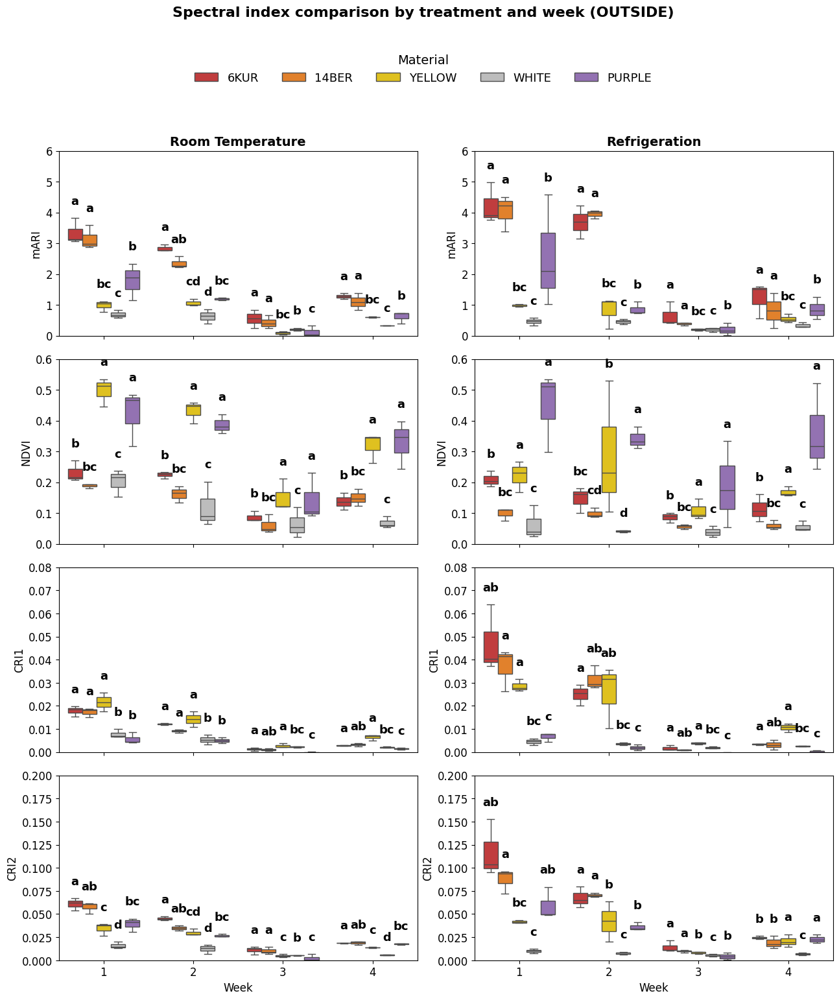

Figura guardada: figuras_indices_outside/Panel_indices_OUTSIDE_MEJORADO.png


In [29]:
# ============================================================
# 7. FIGURA MULTIPANEL OPTIMIZADA (OUTSIDE)
# ============================================================

os.makedirs("figuras_indices_outside", exist_ok=True)

n_rows = len(index_vars)

fig, axes = plt.subplots(
    n_rows, 2,
    figsize=(13, 3.6 * n_rows),  # 🔥 más compacto
    sharex=True,
    sharey=False
)

if n_rows == 1:
    axes = np.array([axes])

for r, idx in enumerate(index_vars):
    for c, treatment in enumerate(treatment_order):

        ax = axes[r][c]

        sub = plot_df[
            (plot_df["Index"] == idx) &
            (plot_df["Treatment"] == treatment)
        ].copy()

        sns.boxplot(
            data=sub,
            x="Week",
            y="Value",
            hue="Material_Base",
            palette=material_palette,
            order=week_order,
            hue_order=material_order,
            ax=ax,
            fliersize=3,
            linewidth=1,
            dodge=True
        )

        # títulos solo arriba
        if r == 0:
            ax.set_title(treatment, fontsize=14, fontweight="bold")

        ax.set_xlabel("Week" if r == n_rows - 1 else "")
        ax.set_ylabel(index_labels.get(idx, idx))

        if idx in y_limits:
            ax.set_ylim(y_limits[idx])

        if ax.legend_ is not None:
            ax.legend_.remove()

        # ====================================================
        # LETRAS MEJORADAS
        # ====================================================

        let_sub = letters_df[
            (letters_df["Index"] == idx) &
            (letters_df["Treatment"] == treatment)
        ].copy()

        if not let_sub.empty:

            centers = compute_box_centers(len(week_order), len(material_order))

            y0, y1 = ax.get_ylim()
            y_range = y1 - y0

            offset = 0.06 * y_range  # 🔥 más separación

            for wi, week in enumerate(week_order):

                sub_week = sub[sub["Week"] == week]
                letters_week = let_sub[let_sub["Week"] == week]

                if sub_week.empty or letters_week.empty:
                    continue

                for hi, mat in enumerate(material_order):

                    mat_data = sub_week[
                        sub_week["Material_Base"] == mat
                    ]["Value"].dropna()

                    if mat_data.empty:
                        continue

                    row_letter = letters_week[
                        letters_week["Material"] == mat
                    ]

                    if row_letter.empty:
                        continue

                    letter = str(row_letter.iloc[0]["Letters"]).strip()

                    if letter == "":
                        continue

                    # posición superior robusta
                    y_text = mat_data.max() + offset
                    y_text = min(y_text, y1 - 0.02 * y_range)

                    x_text = centers[(wi, hi)]

                    ax.text(
                        x_text,
                        y_text,
                        letter,
                        ha="center",
                        va="bottom",
                        fontsize=13,   # 🔥 MÁS GRANDE
                        fontweight="bold",
                        color="black"
                    )

# ============================================================
# LEYENDA ARRIBA (MEJOR PARA PAPER)
# ============================================================

handles, labels = axes[0][0].get_legend_handles_labels()

fig.legend(
    handles, labels,
    title="Material",
    loc="upper center",
    bbox_to_anchor=(0.5, 1.03),
    ncol=5,                  # 🔥 horizontal
    fontsize=13,
    title_fontsize=14,
    frameon=False
)

# ============================================================
# TÍTULO GENERAL
# ============================================================

fig.suptitle(
    "Spectral index comparison by treatment and week (OUTSIDE)",
    fontsize=16,
    fontweight="bold",
    y=1.07
)

plt.tight_layout(rect=[0, 0, 1, 0.97])

out_path = "figuras_indices_outside/Panel_indices_OUTSIDE_MEJORADO.png"
plt.savefig(out_path, dpi=300, bbox_inches="tight")
plt.show()

print(f"Figura guardada: {out_path}")

Data loaded successfully
Total samples: 186120
Room Temperature samples: 93060
Refrigeration samples: 93060

Sample data with replicates:
      Material Material_Base  Replicate
0  AMARILLO_R1        YELLOW          1
1  AMARILLO_R1        YELLOW          1
2  AMARILLO_R1        YELLOW          1
3  AMARILLO_R1        YELLOW          1
4  AMARILLO_R1        YELLOW          1
5  AMARILLO_R1        YELLOW          1
6  AMARILLO_R1        YELLOW          1
7  AMARILLO_R1        YELLOW          1
8  AMARILLO_R1        YELLOW          1
9  AMARILLO_R1        YELLOW          1

Calculated indices (including replicates):
Wvl  Week      Treatment Material_Base  Replicate  Material      350      351  \
0       1  Refrigeration         14BER          1  14BER_R1  38.1901  38.0769   
1       1  Refrigeration         14BER          2  14BER_R2  34.2888  34.0783   
2       1  Refrigeration         14BER          3  14BER_R3  35.2271  35.0313   
3       1  Refrigeration          6KUR          1   6K

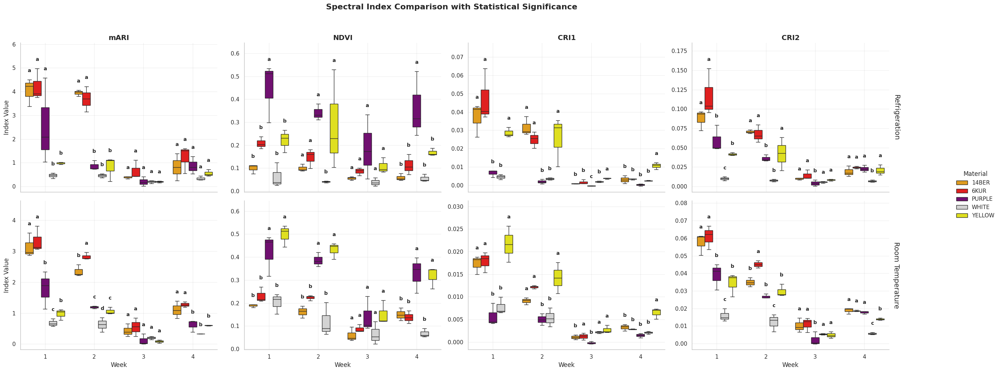

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import os
from itertools import product

# Style configuration
plt.style.use('default')
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [20, 12]  # Cambiado a horizontal
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.titleweight'] = 'bold'

# Custom color palette
material_palette = {
    "6KUR": "red",
    "14BER": "orange",
    "YELLOW": "yellow",
    "WHITE": "lightgray",
    "PURPLE": "purple"
}

def load_data(week, file_path, treatment):
    """Load data from CSV file and add week and treatment information."""
    df = pd.read_csv(file_path)
    df['Week'] = week
    df['Treatment'] = treatment.replace('Ambient', 'Room Temperature')
    df['Material_Base'] = df['Material'].str.replace(r'_R\d+$', '', regex=True)
    df['Replicate'] = df['Material'].str.extract(r'_R(\d+)$').fillna('0').astype(int)
    return df

def calculate_indices(spectral_df):
    """Calculate spectral indices from reflectance data"""
    pivot_df = spectral_df.pivot_table(
        index=['Week', 'Treatment', 'Material_Base', 'Replicate', 'Material'],
        columns='Wvl',
        values='Reflect. %'
    ).reset_index()

    pivot_df['mARI'] = (1/pivot_df[550] - 1/pivot_df[700]) * pivot_df[800]
    pivot_df['NDVI'] = (pivot_df[800] - pivot_df[670]) / (pivot_df[800] + pivot_df[670])
    pivot_df['CRI1'] = (1/pivot_df[510] - 1/pivot_df[550])
    pivot_df['CRI2'] = (1/pivot_df[510] - 1/pivot_df[700])
    return pivot_df

def perform_tukey_test(data, group_col, value_col):
    """Improved Tukey HSD test with proper letter assignment"""
    # Perform Tukey test
    tukey = pairwise_tukeyhsd(
        endog=data[value_col],
        groups=data[group_col],
        alpha=0.05
    )

    # Convert results to DataFrame
    tukey_df = pd.DataFrame(tukey._results_table.data[1:],
                           columns=tukey._results_table.data[0])

    # Get group means and sort
    group_means = data.groupby(group_col)[value_col].mean()
    sorted_groups = group_means.sort_values(ascending=False).index.tolist()

    # Initialize letters
    letters = {group: '' for group in data[group_col].unique()}
    current_letter = 'a'

    # Assign letters based on significance
    for group in sorted_groups:
        if letters[group] == '':  # If group hasn't been assigned a letter yet
            letters[group] = current_letter
            # Find all groups not significantly different from this one
            similar_groups = [group]
            for other_group in sorted_groups:
                if other_group != group and letters[other_group] == '':
                    # Check if not significantly different
                    reject = tukey_df[((tukey_df['group1'] == group) &
                                      (tukey_df['group2'] == other_group)) |
                                     ((tukey_df['group1'] == other_group) &
                                      (tukey_df['group2'] == group))]['reject'].values
                    if len(reject) > 0 and not reject[0]:
                        similar_groups.append(other_group)

            # Assign same letter to all similar groups
            for g in similar_groups:
                letters[g] = current_letter

            current_letter = chr(ord(current_letter) + 1)

    return letters

def plot_indices_with_significance(indices_df):
    """Improved visualization with properly aligned significance letters"""
    melted_df = indices_df.melt(
        id_vars=['Week', 'Treatment', 'Material_Base', 'Replicate', 'Material'],
        value_vars=['mARI', 'NDVI', 'CRI1', 'CRI2'],
        var_name='Index',
        value_name='Value'
    )

    # Create FacetGrid - CAMBIADO A ORIENTACIÓN HORIZONTAL
    g = sns.FacetGrid(
        data=melted_df,
        row='Treatment',  # Tratamientos en filas
        col='Index',      # Índices en columnas
        margin_titles=True,
        height=5,
        aspect=1.2,       # Ajustado para mejor visualización horizontal
        sharey=False,
        sharex=True
    )

    # Use boxplot
    g.map_dataframe(
        sns.boxplot,
        x='Week',
        y='Value',
        hue='Material_Base',
        palette=material_palette,
        dodge=True,
        width=0.8,
        fliersize=3,
        linewidth=1
    )

    # Add significance letters - AJUSTADO PARA LA NUEVA ORIENTACIÓN
    for ax, (treat, idx) in zip(g.axes.flat, product(melted_df['Treatment'].unique(), melted_df['Index'].unique())):
        subset = melted_df[(melted_df['Treatment'] == treat) & (melted_df['Index'] == idx)]

        if subset.empty:
            continue

        # Get current plot's y-axis range
        y_min, y_max = ax.get_ylim()
        y_range = y_max - y_min

        for week in subset['Week'].unique():
            week_data = subset[subset['Week'] == week]
            materials = sorted(week_data['Material_Base'].unique())

            if len(materials) > 1:
                # Get significance letters
                letters = perform_tukey_test(week_data, 'Material_Base', 'Value')

                # Get boxplot positions
                week_pos = week - 1  # Convert week to 0-based position
                n_materials = len(materials)
                total_width = 0.8
                box_width = total_width / n_materials

                # Calcular posición de cada box
                for i, mat in enumerate(materials):
                    # Posición x exacta del box
                    x_pos = week_pos - total_width/2 + box_width/2 + i*box_width

                    # Obtener los percentiles para posicionar la letra
                    box_data = week_data[week_data['Material_Base'] == mat]['Value'].dropna()
                    if len(box_data) > 0:
                        q3 = np.percentile(box_data, 75)
                        iqr = np.percentile(box_data, 75) - np.percentile(box_data, 25)
                        upper_whisker = q3 + 1.5*iqr
                        max_value = np.max(box_data[box_data <= upper_whisker])

                        # Posición y para la letra (un poco arriba del bigote superior)
                        y_pos = max_value + 0.05 * y_range

                        # Dibujar la letra
                        ax.text(
                            x_pos, y_pos, letters[mat],
                            ha='center', va='bottom',
                            fontweight='bold', fontsize=10
                        )

        # Ajustar límites del eje y para hacer espacio para las letras
        ax.set_ylim(y_min, y_max + 0.15 * y_range)

    # Style adjustments
    g.set_titles(col_template="{col_name}", row_template="{row_name}", size=14)
    g.set_axis_labels("Week", "Index Value")
    g.fig.suptitle('Spectral Index Comparison with Statistical Significance',
                  y=1.03, fontsize=16, fontweight='bold')  # Ajustado título
    g.add_legend(title='Material', bbox_to_anchor=(1.05, 0.5), loc='center left')

    # Adjust x-axis
    for ax in g.axes.flat:
        ax.grid(True, alpha=0.3)
        ax.set_xticks(range(4), labels=['1', '2', '3', '4'])

    plt.tight_layout()
    plt.show()

# Main execution with reordered weeks
if __name__ == "__main__":
    path_base = '/content/drive/MyDrive/Colab Notebooks/Espectral/Data/'
    try:
        # Load data with weeks reordered as requested
        data = pd.concat([
            load_data(3, f'{path_base}2024_Oct_09/2024_Oct_09/AMBIENTE/2024_OCT_09_AMBIENTE_NOR.csv', 'Ambient'),
            load_data(3, f'{path_base}2024_Oct_09/2024_Oct_09/REFRI/2024_OCT_09.csv', 'Refrigeration'),
            load_data(4, f'{path_base}2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/AMBIENTE/2024_OCT_16_AMB_NOR.csv', 'Ambient'),
            load_data(4, f'{path_base}2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/REFRI/2024_OCT_16_REFRI_NOR.csv', 'Refrigeration'),
            load_data(1, f'{path_base}2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/AMBIENTE/2024_OCT_23_AMB_NORM.csv', 'Ambient'),
            load_data(1, f'{path_base}2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/REFRI/2024_OCT_23_REFRI_NORM.csv', 'Refrigeration'),
            load_data(2, f'{path_base}2024_Oct_30/2024_Oct_30/AMBIENTE/2024_OCT_30_AMB_NORM.csv', 'Ambient'),
            load_data(2, f'{path_base}2024_Oct_30/2024_Oct_30/REFRI/2024_OCT_30_REFRI_NORM.csv', 'Refrigeration')
        ])

        # Translate material names
        material_translation = {
            "BLANCO": "WHITE",
            "MORADA": "PURPLE",
            "AMARILLO": "YELLOW",
            "6KUR": "6KUR",
            "14BER": "14BER"
        }
        data['Material_Base'] = data['Material_Base'].replace(material_translation)

        print("Data loaded successfully")
        print(f"Total samples: {len(data)}")
        print(f"Room Temperature samples: {len(data[data['Treatment'] == 'Room Temperature'])}")
        print(f"Refrigeration samples: {len(data[data['Treatment'] == 'Refrigeration'])}")
        print("\nSample data with replicates:")
        print(data[['Material', 'Material_Base', 'Replicate']].head(10))

        # Calculate indices
        indices_df = calculate_indices(data)
        print("\nCalculated indices (including replicates):")
        print(indices_df.head())

        # Plot with significance
        plot_indices_with_significance(indices_df)

    except Exception as e:
        print(f"Execution error: {e}")

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
from itertools import product

# Configuración de estilo
plt.style.use('default')
sns.set_theme(style="whitegrid", palette="husl")
plt.rcParams['figure.figsize'] = [12, 20]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.titleweight'] = 'bold'

material_palette = {
    "6KUR": "red",
    "14BER": "orange",
    "YELLOW": "yellow",
    "WHITE": "lightgray",
    "PURPLE": "purple"
}

def load_data(week, file_path, treatment):
    """Carga datos desde archivo CSV y añade información de semana y tratamiento"""
    df = pd.read_csv(file_path)
    df['Week'] = week
    df['Treatment'] = treatment
    df['Material_Base'] = df['Material'].str.replace(r'_R\d+$', '', regex=True)
    df['Replicate'] = df['Material'].str.extract(r'_R(\d+)$').fillna('0').astype(int)
    return df

def calculate_indices(spectral_df):
    """Calcula índices espectrales a partir de datos de reflectancia"""
    pivot_df = spectral_df.pivot_table(
        index=['Week', 'Treatment', 'Material_Base', 'Replicate', 'Material'],
        columns='Wvl',
        values='Reflect. %'
    ).reset_index()

    # Cálculo de los índices espectrales
    pivot_df['mARI'] = (1/pivot_df[550] - 1/pivot_df[700]) * pivot_df[800]
    pivot_df['NDVI'] = (pivot_df[800] - pivot_df[670]) / (pivot_df[800] + pivot_df[670])
    pivot_df['CRI1'] = (1/pivot_df[510] - 1/pivot_df[550])
    pivot_df['CRI2'] = (1/pivot_df[510] - 1/pivot_df[700])
    return pivot_df

def assign_letters(groups, tukey_results):
    """Asigna letras a grupos basado en resultados de Tukey usando el método de letras compactas"""
    groups = sorted(groups)
    n = len(groups)
    similarity = np.ones((n, n), dtype=bool)
    group_to_idx = {group: i for i, group in enumerate(groups)}

    for _, row in tukey_results.iterrows():
        if row['reject']:
            i = group_to_idx[row['group1']]
            j = group_to_idx[row['group2']]
            similarity[i, j] = False
            similarity[j, i] = False

    letters = [''] * n
    current_letter = 0

    for i in range(n):
        if not letters[i]:
            letters[i] = chr(97 + current_letter)
            for j in range(i + 1, n):
                if similarity[i, j] and not letters[j]:
                    letters[j] = letters[i]
            current_letter += 1

    return {group: letters[group_to_idx[group]] for group in groups}

def perform_tukey_test(data, group_col, value_col):
    """Realiza prueba de Tukey HSD y devuelve letras de significancia"""
    data = data.dropna(subset=[value_col])
    if len(data[group_col].unique()) < 2:
        return {k: 'a' for k in data[group_col].unique()}

    tukey = pairwise_tukeyhsd(
        endog=data[value_col],
        groups=data[group_col],
        alpha=0.05
    )
    tukey_df = pd.DataFrame(tukey._results_table.data[1:], columns=tukey._results_table.data[0])
    return assign_letters(data[group_col].unique(), tukey_df)

def plot_indices_with_significance(indices_df):
    """Visualización con letras de significancia estadística"""
    melted_df = indices_df.melt(
        id_vars=['Week', 'Treatment', 'Material_Base', 'Replicate', 'Material'],
        value_vars=['mARI', 'NDVI', 'CRI1', 'CRI2'],
        var_name='Index',
        value_name='Value'
    )
    melted_df['Material'] = melted_df['Material_Base']

    # Crear FacetGrid
    g = sns.FacetGrid(
        data=melted_df,
        row='Index',
        col='Treatment',
        margin_titles=True,
        height=5,
        aspect=0.8,
        sharey=False,
        sharex=True
    )

    g.map_dataframe(
        sns.boxplot,
        x='Week',
        y='Value',
        hue='Material',
        palette=material_palette,
        dodge=True,
        width=0.8,
        fliersize=3,
        linewidth=1
    )

    # Añadir letras de significancia
    for ax, (idx, treat) in zip(g.axes.flat, product(melted_df['Index'].unique(), melted_df['Treatment'].unique())):
        subset = melted_df[(melted_df['Index'] == idx) & (melted_df['Treatment'] == treat)]
        if subset.empty:
            continue

        y_min, y_max = ax.get_ylim()
        y_range = y_max - y_min

        for week in subset['Week'].unique():
            week_data = subset[subset['Week'] == week]
            materials = sorted(week_data['Material'].unique())
            n_materials = len(materials)

            if n_materials > 1:
                letters = perform_tukey_test(week_data, 'Material', 'Value')

                for i, mat in enumerate(materials):
                    x_pos = (week - 1) + (i - (n_materials - 1)/2) * 0.8/n_materials
                    box_data = week_data[week_data['Material'] == mat]['Value'].dropna()
                    if len(box_data) > 0:
                        y_pos = np.max(box_data) + 0.02 * y_range
                        ax.text(
                            x_pos, y_pos, letters[mat],
                            ha='center', va='bottom',
                            fontweight='bold', fontsize=10
                        )

        ax.set_ylim(y_min, y_max + 0.15 * y_range)

    # Ajustes de estilo
    g.set_titles(col_template="{col_name}", row_template="{row_name}", size=14)
    g.set_axis_labels("Week", "Index Value")
    g.fig.suptitle('Comparación de Índices Espectrales con Significancia Estadística',
                  y=1.05, fontsize=18, fontweight='bold')
    g.add_legend(title='Material', bbox_to_anchor=(1.05, 0.5), loc='center left')

    for ax in g.axes.flat:
        ax.grid(True, alpha=0.3)
        ax.set_xticks(range(4), labels=['1', '2', '3', '4'])

    plt.tight_layout()
    plt.show()

# Ejecución principal
if __name__ == "__main__":
    path_base = '/content/drive/MyDrive/Colab Notebooks/Espectral/Data/'
    try:
        # Load data with weeks reordered as requested
        data = pd.concat([
            load_data(3, f'{path_base}2024_Oct_09/2024_Oct_09/AMBIENTE/2024_OCT_09_AMBIENTE_NOR.csv', 'Room temperature'),
            load_data(3, f'{path_base}2024_Oct_09/2024_Oct_09/REFRI/2024_OCT_09.csv', 'Refrigeration'),
            load_data(4, f'{path_base}2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/AMBIENTE/2024_OCT_16_AMB_NOR.csv', 'Room temperature'),
            load_data(4, f'{path_base}2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/REFRI/2024_OCT_16_REFRI_NOR.csv', 'Refrigeration'),
            load_data(1, f'{path_base}2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/AMBIENTE/2024_OCT_23_AMB_NORM.csv', 'Room temperature'),
            load_data(1, f'{path_base}2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/REFRI/2024_OCT_23_REFRI_NORM.csv', 'Refrigeration'),
            load_data(2, f'{path_base}2024_Oct_30/2024_Oct_30/AMBIENTE/2024_OCT_30_AMB_NORM.csv', 'Room temperature'),
            load_data(2, f'{path_base}2024_Oct_30/2024_Oct_30/REFRI/2024_OCT_30_REFRI_NORM.csv', 'Refrigeration')
        ])

        # Traducción de nombres de materiales
        material_translation = {
            "BLANCO": "WHITE",
            "MORADA": "PURPLE",
            "AMARILLO": "YELLOW",
        }
        data['Material_Base'] = data['Material_Base'].replace(material_translation)

        print("Datos cargados exitosamente")
        print(f"Total de muestras: {len(data)}")
        print(f"Muestras en Ambiente: {len(data[data['Treatment'] == 'Room temperature'])}")
        print(f"Muestras en Refrigeración: {len(data[data['Treatment'] == 'Refrigeration'])}")

        # Calcular índices
        indices_df = calculate_indices(data)
        print("\nÍndices calculados (primeras filas):")
        print(indices_df.head())

        # Generar gráficos
        plot_indices_with_significance(indices_df)

    except Exception as e:
        print(f"Error en la ejecución: {e}")

Data loaded successfully
Total samples: 186120
Room Temperature samples: 0
Refrigeration samples: 0

Sample data with replicates:
      Material Material_Base  Replicate
0  AMARILLO_R1        YELLOW          1
1  AMARILLO_R1        YELLOW          1
2  AMARILLO_R1        YELLOW          1
3  AMARILLO_R1        YELLOW          1
4  AMARILLO_R1        YELLOW          1
5  AMARILLO_R1        YELLOW          1
6  AMARILLO_R1        YELLOW          1
7  AMARILLO_R1        YELLOW          1
8  AMARILLO_R1        YELLOW          1
9  AMARILLO_R1        YELLOW          1

Calculated indices (including replicates):
Wvl  Week      Treatment Material_Base  Replicate  Material      350      351  \
0       1  Refrigeración         14BER          1  14BER_R1  23.8593  23.7181   
1       1  Refrigeración         14BER          2  14BER_R2  23.4609  23.4082   
2       1  Refrigeración         14BER          3  14BER_R3  23.3768  23.2256   
3       1  Refrigeración          6KUR          1   6KUR_R1  2

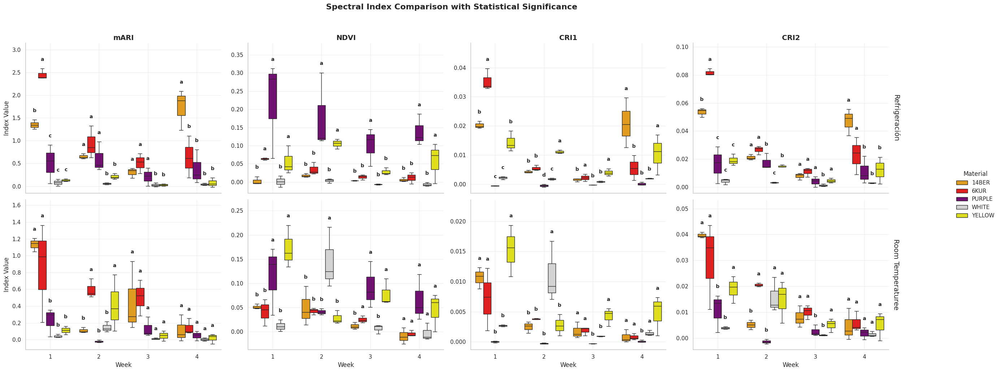

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import numpy as np
import os
from itertools import product

# Style configuration
plt.style.use('default')
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [20, 12]  # Cambiado a horizontal
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.titleweight'] = 'bold'

# Custom color palette
material_palette = {
    "6KUR": "red",
    "14BER": "orange",
    "YELLOW": "yellow",
    "WHITE": "lightgray",
    "PURPLE": "purple"
}

def load_data(week, file_path, treatment):
    """Load data from CSV file and add week and treatment information."""
    df = pd.read_csv(file_path)
    df['Week'] = week
    df['Treatment'] = treatment.replace('Ambient', 'Room Temperature')
    df['Material_Base'] = df['Material'].str.replace(r'_R\d+$', '', regex=True)
    df['Replicate'] = df['Material'].str.extract(r'_R(\d+)$').fillna('0').astype(int)
    return df

def calculate_indices(spectral_df):
    """Calculate spectral indices from reflectance data"""
    pivot_df = spectral_df.pivot_table(
        index=['Week', 'Treatment', 'Material_Base', 'Replicate', 'Material'],
        columns='Wvl',
        values='Reflect. %'
    ).reset_index()

    pivot_df['mARI'] = (1/pivot_df[550] - 1/pivot_df[700]) * pivot_df[800]
    pivot_df['NDVI'] = (pivot_df[800] - pivot_df[670]) / (pivot_df[800] + pivot_df[670])
    pivot_df['CRI1'] = (1/pivot_df[510] - 1/pivot_df[550])
    pivot_df['CRI2'] = (1/pivot_df[510] - 1/pivot_df[700])
    return pivot_df

def perform_tukey_test(data, group_col, value_col):
    """Improved Tukey HSD test with proper letter assignment"""
    # Perform Tukey test
    tukey = pairwise_tukeyhsd(
        endog=data[value_col],
        groups=data[group_col],
        alpha=0.05
    )

    # Convert results to DataFrame
    tukey_df = pd.DataFrame(tukey._results_table.data[1:],
                           columns=tukey._results_table.data[0])

    # Get group means and sort
    group_means = data.groupby(group_col)[value_col].mean()
    sorted_groups = group_means.sort_values(ascending=False).index.tolist()

    # Initialize letters
    letters = {group: '' for group in data[group_col].unique()}
    current_letter = 'a'

    # Assign letters based on significance
    for group in sorted_groups:
        if letters[group] == '':  # If group hasn't been assigned a letter yet
            letters[group] = current_letter
            # Find all groups not significantly different from this one
            similar_groups = [group]
            for other_group in sorted_groups:
                if other_group != group and letters[other_group] == '':
                    # Check if not significantly different
                    reject = tukey_df[((tukey_df['group1'] == group) &
                                      (tukey_df['group2'] == other_group)) |
                                     ((tukey_df['group1'] == other_group) &
                                      (tukey_df['group2'] == group))]['reject'].values
                    if len(reject) > 0 and not reject[0]:
                        similar_groups.append(other_group)

            # Assign same letter to all similar groups
            for g in similar_groups:
                letters[g] = current_letter

            current_letter = chr(ord(current_letter) + 1)

    return letters

def plot_indices_with_significance(indices_df):
    """Improved visualization with properly aligned significance letters"""
    melted_df = indices_df.melt(
        id_vars=['Week', 'Treatment', 'Material_Base', 'Replicate', 'Material'],
        value_vars=['mARI', 'NDVI', 'CRI1', 'CRI2'],
        var_name='Index',
        value_name='Value'
    )

    # Create FacetGrid - CAMBIADO A ORIENTACIÓN HORIZONTAL
    g = sns.FacetGrid(
        data=melted_df,
        row='Treatment',  # Tratamientos en filas
        col='Index',      # Índices en columnas
        margin_titles=True,
        height=5,
        aspect=1.2,       # Ajustado para mejor visualización horizontal
        sharey=False,
        sharex=True
    )

    # Use boxplot
    g.map_dataframe(
        sns.boxplot,
        x='Week',
        y='Value',
        hue='Material_Base',
        palette=material_palette,
        dodge=True,
        width=0.8,
        fliersize=3,
        linewidth=1
    )

    # Add significance letters - AJUSTADO PARA LA NUEVA ORIENTACIÓN
    for ax, (treat, idx) in zip(g.axes.flat, product(melted_df['Treatment'].unique(), melted_df['Index'].unique())):
        subset = melted_df[(melted_df['Treatment'] == treat) & (melted_df['Index'] == idx)]

        if subset.empty:
            continue

        # Get current plot's y-axis range
        y_min, y_max = ax.get_ylim()
        y_range = y_max - y_min

        for week in subset['Week'].unique():
            week_data = subset[subset['Week'] == week]
            materials = sorted(week_data['Material_Base'].unique())

            if len(materials) > 1:
                # Get significance letters
                letters = perform_tukey_test(week_data, 'Material_Base', 'Value')

                # Get boxplot positions
                week_pos = week - 1  # Convert week to 0-based position
                n_materials = len(materials)
                total_width = 0.8
                box_width = total_width / n_materials

                # Calcular posición de cada box
                for i, mat in enumerate(materials):
                    # Posición x exacta del box
                    x_pos = week_pos - total_width/2 + box_width/2 + i*box_width

                    # Obtener los percentiles para posicionar la letra
                    box_data = week_data[week_data['Material_Base'] == mat]['Value'].dropna()
                    if len(box_data) > 0:
                        q3 = np.percentile(box_data, 75)
                        iqr = np.percentile(box_data, 75) - np.percentile(box_data, 25)
                        upper_whisker = q3 + 1.5*iqr
                        max_value = np.max(box_data[box_data <= upper_whisker])

                        # Posición y para la letra (un poco arriba del bigote superior)
                        y_pos = max_value + 0.05 * y_range

                        # Dibujar la letra
                        ax.text(
                            x_pos, y_pos, letters[mat],
                            ha='center', va='bottom',
                            fontweight='bold', fontsize=10
                        )

        # Ajustar límites del eje y para hacer espacio para las letras
        ax.set_ylim(y_min, y_max + 0.15 * y_range)

    # Style adjustments
    g.set_titles(col_template="{col_name}", row_template="{row_name}", size=14)
    g.set_axis_labels("Week", "Index Value")
    g.fig.suptitle('Spectral Index Comparison with Statistical Significance',
                  y=1.03, fontsize=16, fontweight='bold')  # Ajustado título
    g.add_legend(title='Material', bbox_to_anchor=(1.05, 0.5), loc='center left')

    # Adjust x-axis
    for ax in g.axes.flat:
        ax.grid(True, alpha=0.3)
        ax.set_xticks(range(4), labels=['1', '2', '3', '4'])

    plt.tight_layout()
    plt.show()

# Main execution with reordered weeks
if __name__ == "__main__":
    path_base = '/content/drive/MyDrive/Colab Notebooks/Espectral/Data/'
    try:
        # Load data with weeks reordered as requested
        data = pd.concat([
            load_data(3, f'{path_base}2024_Oct_09/CORTADAS/AMBIENTE/2024_OCT_09_AMB_CORT.csv', 'Ambiente'),
            load_data(3, f'{path_base}2024_Oct_09/CORTADAS/REFRI/2024_OCT_09_REFRI_CORT.csv', 'Refrigeración'),
            load_data(2, f'{path_base}2024_Oct_16/SM-1900_15B82D3/CORTADAS/AMBIENTE/2024_OCT_16_AMB_CORT.csv', 'Ambiente'),
            load_data(2, f'{path_base}2024_Oct_16/SM-1900_15B82D3/CORTADAS/REFRI/2024_OCT_16_REFRI_CORT.csv', 'Refrigeración'),
            load_data(1, f'{path_base}2024_Oct_23/SM-1900_15B82D3/CORTADAS/AMBIENTE/2024_OCT_23_AMB_CORT.csv', 'Ambiente'),
            load_data(1, f'{path_base}2024_Oct_23/SM-1900_15B82D3/CORTADAS/REFRI/2024_OCT_23_REFRI_CORT.csv', 'Refrigeración'),
            load_data(4, f'{path_base}2024_Oct_30/2024_Oct_30/CORTADA/AMBIENTE/2024_OCT_30_AMB_CORT.csv', 'Ambiente'),
            load_data(4, f'{path_base}2024_Oct_30/2024_Oct_30/CORTADA/REFRI/2024_OCT_30_REFRI_CORT.csv', 'Refrigeración')
        ])
        # Translate material names
        material_translation = {
            "BLANCO": "WHITE",
            "MORADA": "PURPLE",
            "AMARILLO": "YELLOW",
            "6KUR": "6KUR",
            "14BER": "14BER"
        }
        data['Material_Base'] = data['Material_Base'].replace(material_translation)

        print("Data loaded successfully")
        print(f"Total samples: {len(data)}")
        print(f"Room Temperature samples: {len(data[data['Treatment'] == 'Room Temperature'])}")
        print(f"Refrigeration samples: {len(data[data['Treatment'] == 'Refrigeration'])}")
        print("\nSample data with replicates:")
        print(data[['Material', 'Material_Base', 'Replicate']].head(10))

        # Calculate indices
        indices_df = calculate_indices(data)
        print("\nCalculated indices (including replicates):")
        print(indices_df.head())

        # Plot with significance
        plot_indices_with_significance(indices_df)

    except Exception as e:
        print(f"Execution error: {e}")

In [ ]:
pip install scikit_posthocs

In [ ]:
pip install statannotations

Datos cargados exitosamente
Muestras totales: 186120
Muestras Ambiente: 93060
Muestras Refrigeración: 93060

Índices calculados:
Wvl  Week Treatment  Material        350        351        352        353  \
0       1  Ambiente     14BER  49.042567  49.034167  49.030900  49.026100   
1       1  Ambiente      6KUR  54.542900  54.532933  54.529067  54.522500   
2       1  Ambiente  AMARILLO  49.053900  49.046267  49.042433  49.036733   
3       1  Ambiente    BLANCA  60.072767  60.064667  60.059867  60.051667   
4       1  Ambiente    MORADA  48.990133  48.980667  48.976567  48.971867   

Wvl        354        355        356  ...       1895       1896       1897  \
0    49.013467  48.990767  48.958100  ...  23.789900  23.825033  23.772533   
1    54.504967  54.472900  54.428500  ...  24.022100  24.045367  23.980600   
2    49.023533  49.000367  48.967300  ...  23.164467  23.201633  23.149233   
3    60.033733  60.000533  59.952933  ...  23.642033  23.667667  23.605400   
4    48.961367  48

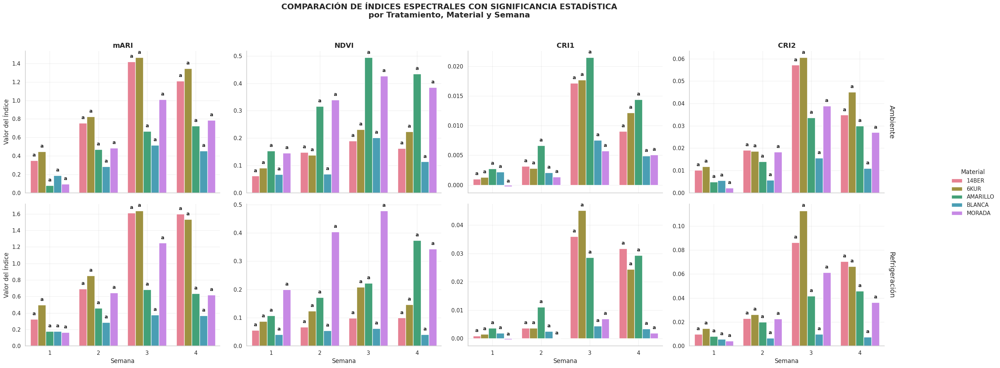

In [ ]:
def transform_data(data, value_col):
    """Aplica una transformación logarítmica a los datos"""
    data[value_col] = np.log(data[value_col] + 1)  # Sumar 1 para evitar log(0)
    return data

def perform_kruskal_wallis(data, group_col, value_col):
    """Realiza la prueba de Kruskal-Wallis"""
    groups = [group_data[value_col].values for name, group_data in data.groupby(group_col)]
    stat, p = stats.kruskal(*groups)
    print(f"\nPrueba de Kruskal-Wallis: Estadístico={stat}, p={p}")

# Ejecución principal
if __name__ == "__main__":
    # Cargar todos los datos
    path_base = '/content/drive/MyDrive/Colab Notebooks/Espectral/Data/'
    try:
        data = pd.concat([
            load_data(1, f'{path_base}2024_Oct_09/2024_Oct_09/AMBIENTE/2024_OCT_09_AMBIENTE_NOR (1).csv', 'Ambiente'),
            load_data(1, f'{path_base}2024_Oct_09/2024_Oct_09/REFRI/2024_OCT_09 (1).csv', 'Refrigeración'),
            load_data(2, f'{path_base}2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/AMBIENTE/2024_OCT_16_AMB_NOR (1).csv', 'Ambiente'),
            load_data(2, f'{path_base}2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/REFRI/2024_OCT_16_REFRI_NOR (1).csv', 'Refrigeración'),
            load_data(3, f'{path_base}2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/AMBIENTE/2024_OCT_23_AMB_NORM (1).csv', 'Ambiente'),
            load_data(3, f'{path_base}2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/REFRI/2024_OCT_23_REFRI_NORM (1).csv', 'Refrigeración'),
            load_data(4, f'{path_base}2024_Oct_30/2024_Oct_30/AMBIENTE/2024_OCT_30_AMB_NORM (1).csv', 'Ambiente'),
            load_data(4, f'{path_base}2024_Oct_30/2024_Oct_30/REFRI/2024_OCT_30_REFRI_NORM (1).csv', 'Refrigeración')
        ])

        print("Datos cargados exitosamente")
        print(f"Muestras totales: {len(data)}")
        print(f"Muestras Ambiente: {len(data[data['Treatment']=='Ambiente'])}")
        print(f"Muestras Refrigeración: {len(data[data['Treatment']=='Refrigeración'])}")

        # Calcular índices
        indices_df = calculate_indices(data)
        print("\nÍndices calculados:")
        print(indices_df.head())

        # Verificar tamaños de grupo
        check_group_sizes(indices_df, 'Material', 'mARI')
        check_variance(indices_df, 'Material', 'mARI')
        check_normality(indices_df, 'Material', 'mARI')
        check_homogeneity(indices_df, 'Material', 'mARI')

        # Transformar datos
        transformed_df = transform_data(indices_df.copy(), 'mARI')

        # Realizar prueba de Kruskal-Wallis
        perform_kruskal_wallis(transformed_df, 'Material', 'mARI')

        # Visualización con significancia estadística
        plot_indices_with_significance(transformed_df)

    except Exception as e:
        print(f"Error en la ejecución: {e}")


In [ ]:
# Paso 1: Verificar datos
print(df.isnull().sum())
print(df.describe())

# Paso 2: Kruskal-Wallis por índice
for index_name in df['Index'].unique():
    subset = df[df['Index'] == index_name]
    stat, p = kruskal(*[group['Value'].values for name, group in subset.groupby('Material')])
    print(f"\nÍndice {index_name}: p={p:.4f}")
    if p < 0.05:  # Si es significativo
        # Paso 3: Dunn's test post-hoc
        dunn_res = posthoc_dunn(subset, val_col='Value', group_col='Material')
        print(dunn_res)

NameError: name 'df' is not defined

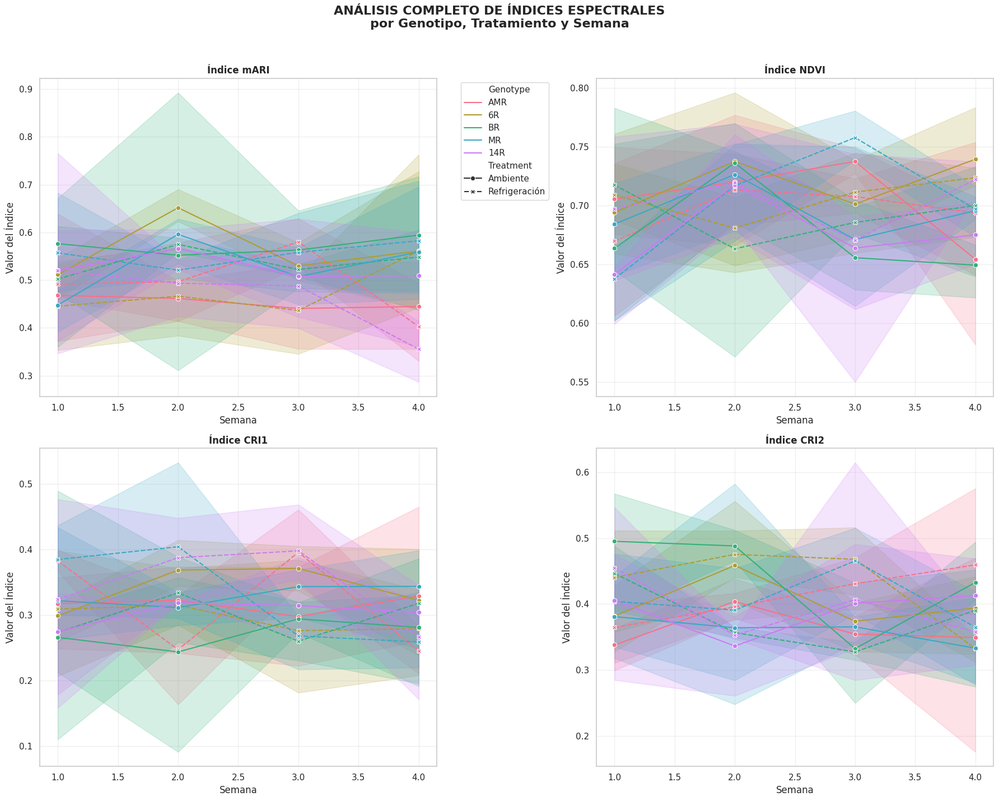

<Figure size 1800x800 with 0 Axes>

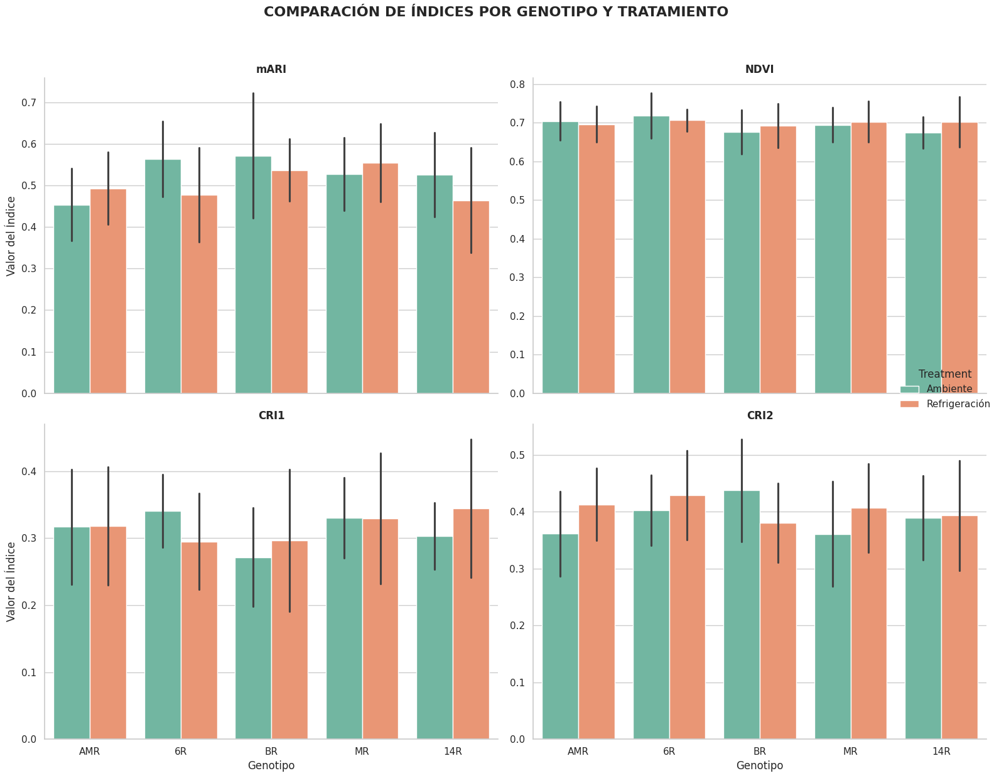


RESUMEN ESTADÍSTICO DE LOS ÍNDICES:


mARI                                          \
                       count      mean       std       min       25%   
Genotype Treatment                                                     
14R      Ambiente       12.0  0.525946  0.100963  0.360701  0.484414   
         Refrigeración  12.0  0.464220  0.126284  0.286545  0.390860   
6R       Ambiente       12.0  0.563523  0.090442  0.437468  0.508385   
         Refrigeración  12.0  0.477299  0.112803  0.345376  0.427924   
AMR      Ambiente       12.0  0.453749  0.087301  0.352123  0.398583   
         Refrigeración  12.0  0.492921  0.086737  0.330495  0.447987   
BR       Ambiente       12.0  0.571516  0.150554  0.311040  0.475223   
         Refrigeración  12.0  0.536988  0.074705  0.360010  0.521933   
MR       Ambiente       12.0  0.527528  0.087751  0.391810  0.470107   
         Refrigeración  12.0  0.554700  0.093871  0.399119  0.496920   

                                                      NDVI            ...  \
                             50%       75%       max count      mean  ...   
Genotype Treatment                                                    ...   
14R      Ambiente       0.565492  0.601567  0.628189  12.0  0.674523  ...   
         Refrigeración  0.436049  0.522382  0.765825  12.0  0.702277  ...   
6R       Ambiente       0.537427  0.627799  0.727813  12.0  0.718062  ...   
         Refrigeración  0.451953  0.514691  0.762765  12.0  0.706185  ...   
AMR      Ambiente       0.435783  0.507700  0.638882  12.0  0.704321  ...   
         Refrigeración  0.495966  0.545063  0.629081  12.0  0.696109  ...   
BR       Ambiente       0.572955  0.652060  0.892834  12.0  0.676170  ...   
         Refrigeración  0.546112  0.591681  0.613196  12.0  0.691561  ...   
MR       Ambiente       0.512989  0.582041  0.696105  12.0  0.694315  ...   
         Refrigeración  0.529537  0.633631  0.707668  12.0  0.702278  ...   

                            CRI1            CRI2                      \
                             75%       max count      mean       std   
Genotype Treatment                                                     
14R      Ambiente       0.320812  0.387781  12.0  0.388958  0.073975   
         Refrigeración  0.410349  0.476878  12.0  0.393077  0.096824   
6R       Ambiente       0.378809  0.414586  12.0  0.402066  0.061672   
         Refrigeración  0.346772  0.398266  12.0  0.428965  0.078424   
AMR      Ambiente       0.373129  0.465186  12.0  0.361401  0.074544   
         Refrigeración  0.381306  0.461023  12.0  0.412663  0.063628   
BR       Ambiente       0.320439  0.357390  12.0  0.437189  0.090218   
         Refrigeración  0.375420  0.489614  12.0  0.380302  0.069693   
MR       Ambiente       0.373157  0.433995  12.0  0.360906  0.092464   
         Refrigeración  0.392953  0.532835  12.0  0.406350  0.077708   

                                                                          
                             min       25%       50%       75%       max  
Genotype Treatment                                                        
14R      Ambiente       0.260792  0.358849  0.380207  0.459939  0.490801  
         Refrigeración  0.284568  0.340571  0.370432  0.402914  0.614707  
6R       Ambiente       0.324184  0.358924  0.403100  0.418851  0.556157  
         Refrigeración  0.312049  0.346834  0.457354  0.489187  0.516234  
AMR      Ambiente       0.175721  0.344409  0.370696  0.396704  0.470086  
         Refrigeración  0.310672  0.384245  0.396870  0.421583  0.575472  
BR       Ambiente       0.249972  0.400587  0.446096  0.493217  0.567602  
         Refrigeración  0.274563  0.337920  0.360506  0.417389  0.494395  
MR       Ambiente       0.234280  0.301591  0.357822  0.389566  0.582602  
         Refrigeración  0.277698  0.372558  0.409831  0.459582  0.533878  

[10 rows x 32 columns]

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

# Configuración de estilos
plt.style.use('default')
sns.set_theme(style="whitegrid", palette="husl")
plt.rcParams['figure.figsize'] = [16, 12]
plt.rcParams['font.size'] = 12

# Función para cargar datos (simulados para el ejemplo)
def load_sample_data():
    weeks = [1, 2, 3, 4]
    treatments = ['Ambiente', 'Refrigeración']
    genotypes = ['AMR', '6R', 'BR', 'MR', '14R']
    replicates = ['R1', 'R2', 'R3']

    data = []
    for week, treatment, genotype, rep in product(weeks, treatments, genotypes, replicates):
        data.append({
            'Week': week,
            'Treatment': treatment,
            'Genotype': genotype,
            'Replicate': rep,
            'mARI': np.random.normal(loc=0.5, scale=0.1),
            'NDVI': np.random.normal(loc=0.7, scale=0.05),
            'CRI1': np.random.normal(loc=0.3, scale=0.08),
            'CRI2': np.random.normal(loc=0.4, scale=0.07)
        })
    return pd.DataFrame(data)

# Cargar datos simulados (reemplazar con tus datos reales)
indices_df = load_sample_data()

# Función para visualización unificada
def plot_unified_view(df):
    fig, axes = plt.subplots(2, 2, figsize=(18, 14))
    axes = axes.flatten()

    for idx, index in enumerate(['mARI', 'NDVI', 'CRI1', 'CRI2']):
        # Gráfico de líneas por semana
        sns.lineplot(
            data=df,
            x='Week',
            y=index,
            hue='Genotype',
            style='Treatment',
            markers=True,
            ci=95,
            ax=axes[idx],
            palette='husl'
        )

        axes[idx].set_title(f'Índice {index}', fontweight='bold')
        axes[idx].set_xlabel('Semana', fontsize=12)
        axes[idx].set_ylabel('Valor del Índice', fontsize=12)
        axes[idx].grid(True, alpha=0.3)

        if idx == 0:
            axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        else:
            axes[idx].legend().remove()

    plt.suptitle('ANÁLISIS COMPLETO DE ÍNDICES ESPECTRALES\npor Genotipo, Tratamiento y Semana',
                 y=1.02, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Función para gráfico de barras agrupadas
def plot_grouped_bars(df):
    melted_df = df.melt(
        id_vars=['Week', 'Treatment', 'Genotype', 'Replicate'],
        value_vars=['mARI', 'NDVI', 'CRI1', 'CRI2'],
        var_name='Index',
        value_name='Value'
    )

    plt.figure(figsize=(18, 8))
    g = sns.catplot(
        data=melted_df,
        x='Genotype',
        y='Value',
        hue='Treatment',
        col='Index',
        col_wrap=2,
        kind='bar',
        height=6,
        aspect=1.2,
        palette='Set2',
        sharey=False,
        errorbar='sd'
    )

    g.set_titles("{col_name}", fontweight='bold')
    g.set_axis_labels("Genotipo", "Valor del Índice")
    g.fig.suptitle('COMPARACIÓN DE ÍNDICES POR GENOTIPO Y TRATAMIENTO',
                   y=1.03, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Visualizaciones
plot_unified_view(indices_df)
plot_grouped_bars(indices_df)

# Mostrar tabla resumen
print("\nRESUMEN ESTADÍSTICO DE LOS ÍNDICES:")
display(indices_df.groupby(['Genotype', 'Treatment'])[['mARI', 'NDVI', 'CRI1', 'CRI2']].describe())

🔍 Cargando datos...
✅ Archivo cargado correctamente: Semana 1 - Ambiente
✅ Archivo cargado correctamente: Semana 1 - Refrigeración
✅ Archivo cargado correctamente: Semana 2 - Ambiente
✅ Archivo cargado correctamente: Semana 2 - Refrigeración
✅ Archivo cargado correctamente: Semana 3 - Ambiente
✅ Archivo cargado correctamente: Semana 3 - Refrigeración
✅ Archivo cargado correctamente: Semana 4 - Ambiente
✅ Archivo cargado correctamente: Semana 4 - Refrigeración

🔧 Procesando datos...

📊 Generando gráficos...


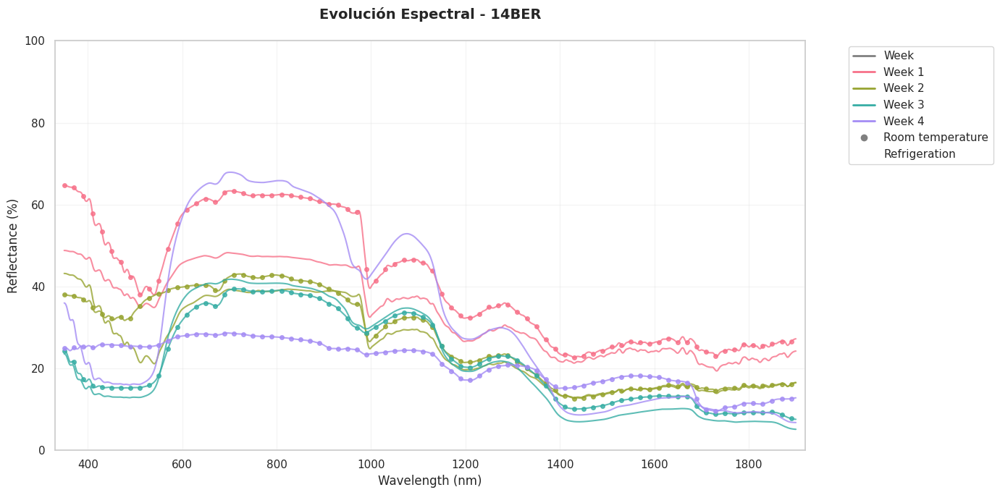

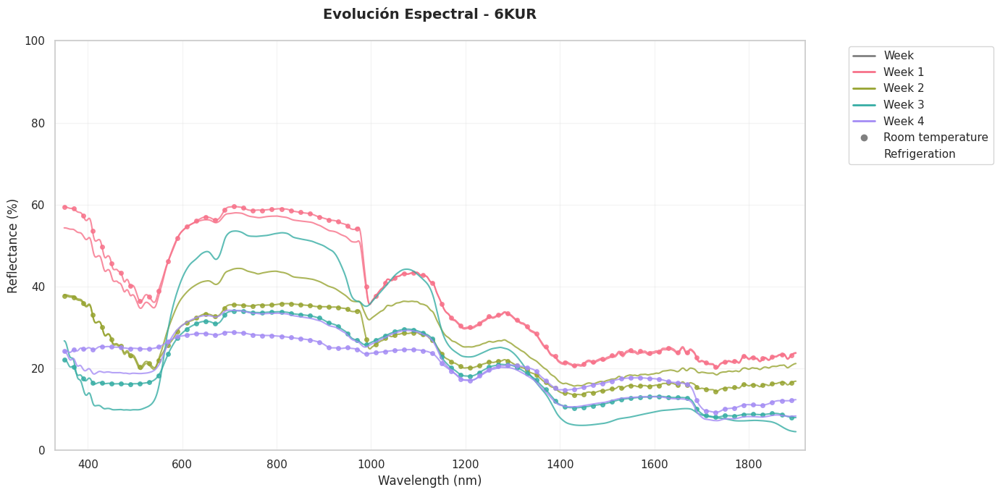

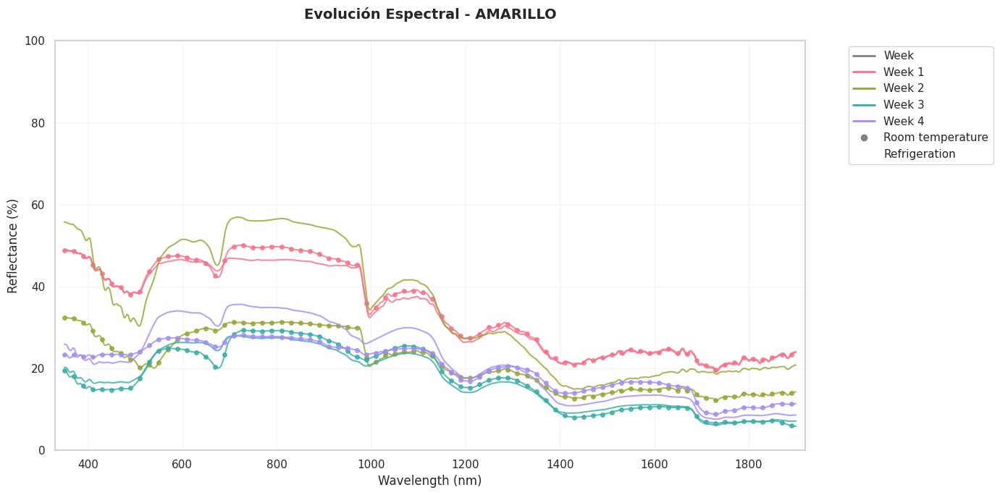

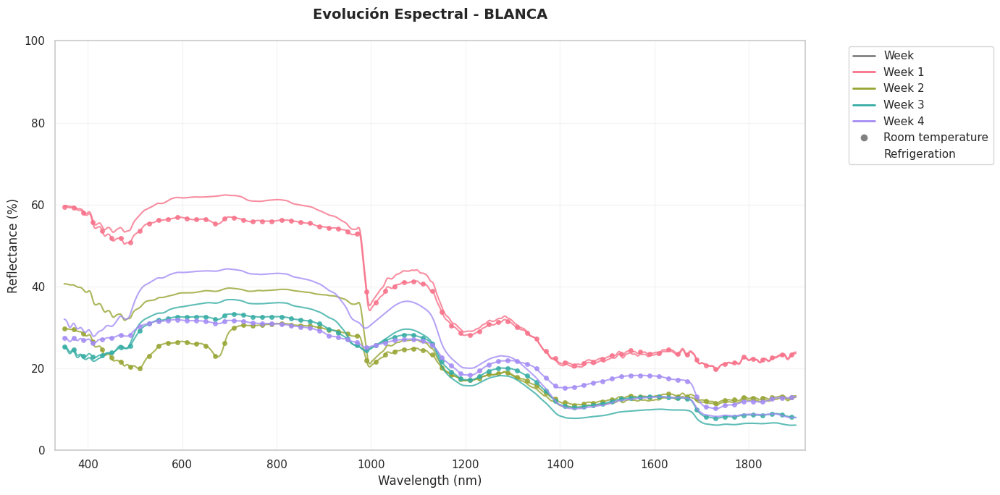

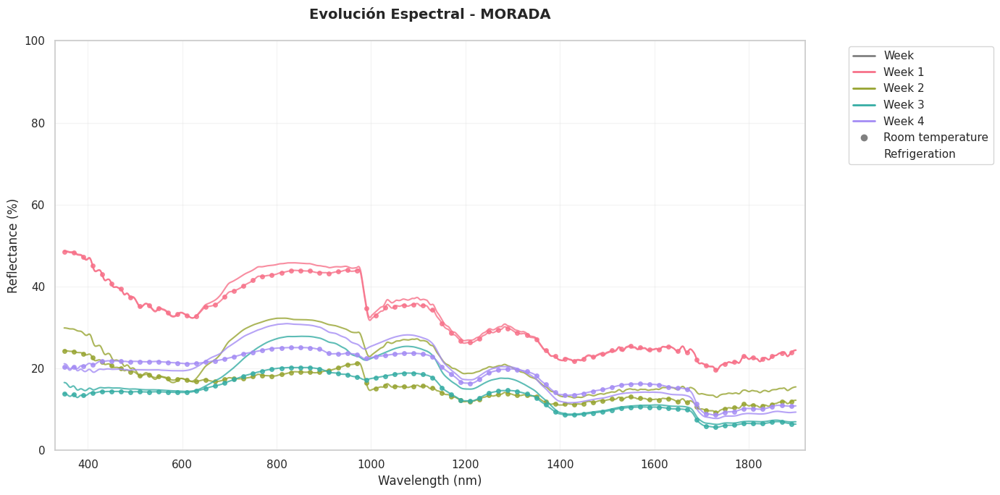

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import savgol_filter
from matplotlib.lines import Line2D
import numpy as np

# 1. Configuración inicial
sns.set_style("whitegrid")
plt.rcParams.update({
    'figure.facecolor': 'white',
    'axes.grid': True,
    'grid.alpha': 0.3,
    'font.size': 12
})

# 2. Carga y verificación de datos
def load_and_verify_data():
    path_base = '/content/drive/MyDrive/Colab Notebooks/Espectral/Data/'
    files = [
        (1,'2024_Oct_09/CORTADAS/AMBIENTE/2024_OCT_09_AMB_CORT (1).csv', 'Ambiente'),
        (1, '2024_Oct_09/CORTADAS/REFRI/2024_OCT_09_REFRI_CORT (1).csv', 'Refrigeración'),
        (2, '2024_Oct_16/SM-1900_15B82D3/CORTADAS/AMBIENTE/2024_OCT_16_AMB_CORT (1).csv', 'Ambiente'),
        (2, '2024_Oct_16/SM-1900_15B82D3/CORTADAS/REFRI/2024_OCT_16_REFRI_CORT (1).csv', 'Refrigeración'),
        (3, '2024_Oct_23/SM-1900_15B82D3/CORTADAS/AMBIENTE/2024_OCT_23_AMB_CORT (1).csv', 'Ambiente'),
        (3, '2024_Oct_23/SM-1900_15B82D3/CORTADAS/REFRI/2024_OCT_23_REFRI_CORT (1).csv', 'Refrigeración'),
        (4,'2024_Oct_30/2024_Oct_30/CORTADA/AMBIENTE/2024_OCT_30_AMB_CORT (1).csv', 'Ambiente'),
        (4, '2024_Oct_30/2024_Oct_30/CORTADA/REFRI/2024_OCT_30_REFRI_CORT (1).csv', 'Refrigeración')
    ]

    dfs = []
    for week, path, treatment in files:
        try:
            df = pd.read_csv(path_base + path)
            df['Week'] = week
            df['Treatment'] = treatment
            dfs.append(df)
            print(f"✅ Archivo cargado correctamente: Semana {week} - {treatment}")
        except Exception as e:
            print(f"❌ Error al cargar {path}: {str(e)}")
            continue

    if not dfs:
        raise ValueError("No se pudo cargar ningún archivo")

    return pd.concat(dfs).sort_values(['Material', 'Week', 'Treatment', 'Wvl'])

# 3. Procesamiento cuidadoso de datos
def process_data_carefully(df):
    # Verificación básica de datos
    if 'Reflect. %' not in df.columns:
        raise ValueError("La columna 'Reflect. %' no existe en los datos")

    # Limpieza inicial
    df = df.dropna(subset=['Reflect. %', 'Wvl'])
    df['Reflect. %'] = pd.to_numeric(df['Reflect. %'], errors='coerce')
    df = df.dropna(subset=['Reflect. %'])

    # Promedio por grupo para reducir ruido
    grouped = df.groupby(['Material', 'Wvl', 'Week', 'Treatment'])['Reflect. %'].mean().reset_index()

    # Suavizado con verificación
    smoothed = pd.DataFrame()
    for (mat, week, treatment), group in grouped.groupby(['Material', 'Week', 'Treatment']):
        if len(group) < 15:  # Muy pocos puntos para suavizar
            print(f"Advertencia: Datos insuficientes para {mat}-Semana{week}-{treatment}")
            temp_df = group.copy()
        else:
            try:
                y_smooth = savgol_filter(
                    group['Reflect. %'].values,
                    window_length=min(15, len(group)//2*2+1),  # Asegurar impar
                    polyorder=2,
                    mode='mirror'
                )
                temp_df = group.copy()
                temp_df['Reflect. %'] = y_smooth
            except Exception as e:
                print(f"Error al suavizar {mat}-Semana{week}-{treatment}: {str(e)}")
                temp_df = group.copy()

        smoothed = pd.concat([smoothed, temp_df])

    return smoothed

# 4. Visualización robusta
def plot_spectral_evolution(df):
    # Configuración de estilos
    week_palette = sns.color_palette("husl", 4)
    treatment_markers = {'Ambiente': 'o', 'Refrigeración': ''}

    for material in df['Material'].unique():
        plt.figure(figsize=(14, 7))
        subset = df[df['Material'] == material]

        # Verificar si hay datos
        if subset.empty:
            print(f"No hay datos para {material}")
            continue

        # Graficar cada combinación
        for week in range(1, 5):
            for treatment in ['Ambiente', 'Refrigeración']:
                data_plot = subset[(subset['Week'] == week) &
                                 (subset['Treatment'] == treatment)]
                if not data_plot.empty:
                    plt.plot(data_plot['Wvl'], data_plot['Reflect. %'],
                             color=week_palette[week-1],
                             linestyle='-',
                             marker=treatment_markers[treatment],
                             markersize=4,
                             markevery=20,
                             linewidth=1.5,
                             alpha=0.8,
                             label=f'S{week}-{treatment[:3]}')

        # Ajustes del gráfico
        plt.title(f'Evolución Espectral - {material}\n', fontsize=14)
        plt.xlabel('Wavelength (nm)', fontsize=12)
        plt.ylabel('Reflectance (%)', fontsize=12)
        plt.grid(True, alpha=0.2)

        # Límites inteligentes
        x_buffer = 20
        y_buffer = 0.1 * (subset['Reflect. %'].max() - subset['Reflect. %'].min())

        plt.xlim(350 - x_buffer, 1900 + x_buffer)
        plt.ylim(0,100)

        # Leyenda mejorada
        legend_elements = [
            Line2D([0], [0], color='gray', lw=2, label='Week'),
            *[Line2D([0], [0], color=week_palette[i], lw=2, label=f'Week {i+1}')
             for i in range(4)],
            Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=8, label='Room temperature'),
            Line2D([0], [0], marker='', color='w', markerfacecolor='gray', markersize=8, label='Refrigeration')
        ]

        plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

# Ejecución principal
try:
    print("🔍 Cargando datos...")
    raw_data = load_and_verify_data()

    print("\n🔧 Procesando datos...")
    processed_data = process_data_carefully(raw_data)

    print("\n📊 Generando gráficos...")
    plot_spectral_evolution(processed_data)

except Exception as e:
    print(f"\n❌ Error crítico: {str(e)}")
    print("Recomendaciones:")
    print("1. Verifica las rutas de los archivos")
    print("2. Comprueba la estructura de los datos (columnas esperadas: Material, Wvl, Reflect. %)")
    print("3. Revisa que los valores de reflectancia sean numéricos")

🔍 Cargando datos...
✅ Archivo cargado correctamente: Semana 1 - Ambiente
✅ Archivo cargado correctamente: Semana 1 - Refrigeración
✅ Archivo cargado correctamente: Semana 2 - Ambiente
✅ Archivo cargado correctamente: Semana 2 - Refrigeración
✅ Archivo cargado correctamente: Semana 3 - Ambiente
✅ Archivo cargado correctamente: Semana 3 - Refrigeración
✅ Archivo cargado correctamente: Semana 4 - Ambiente
✅ Archivo cargado correctamente: Semana 4 - Refrigeración

🔧 Procesando datos...

📊 Generando gráficos...


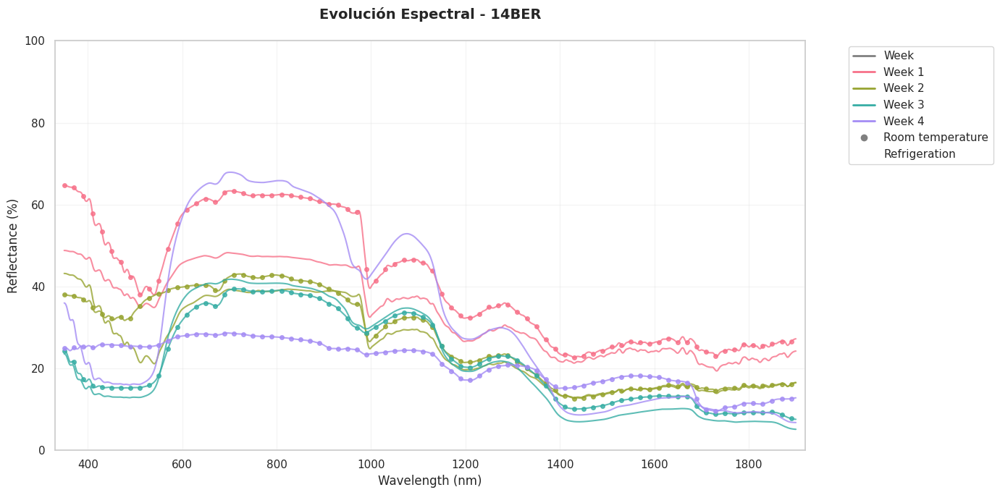

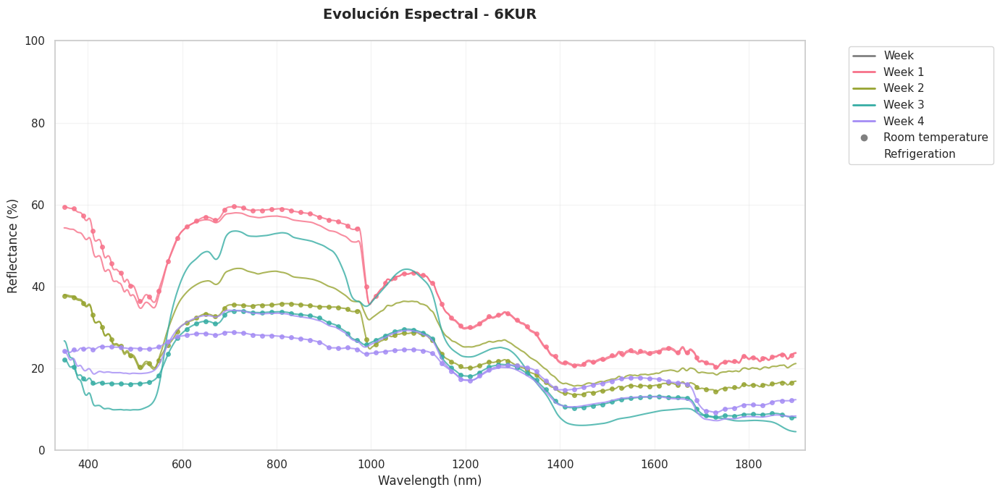

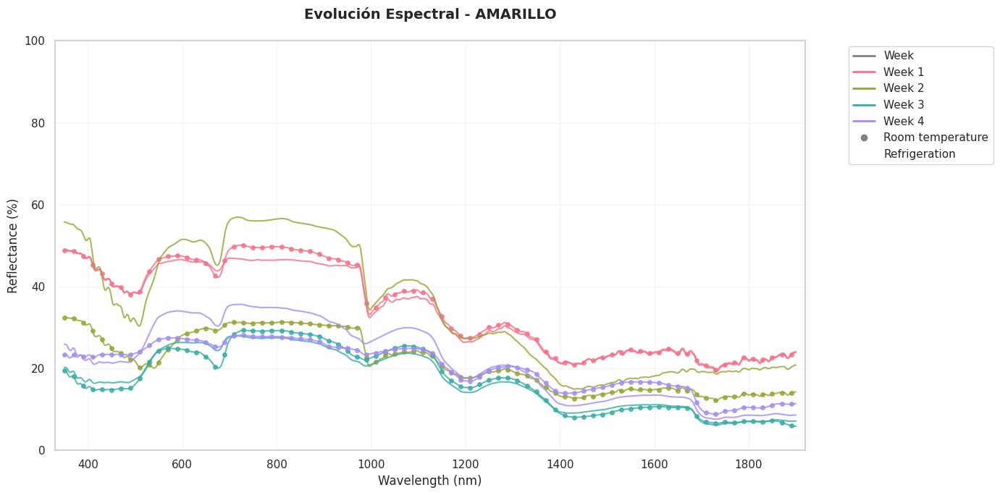

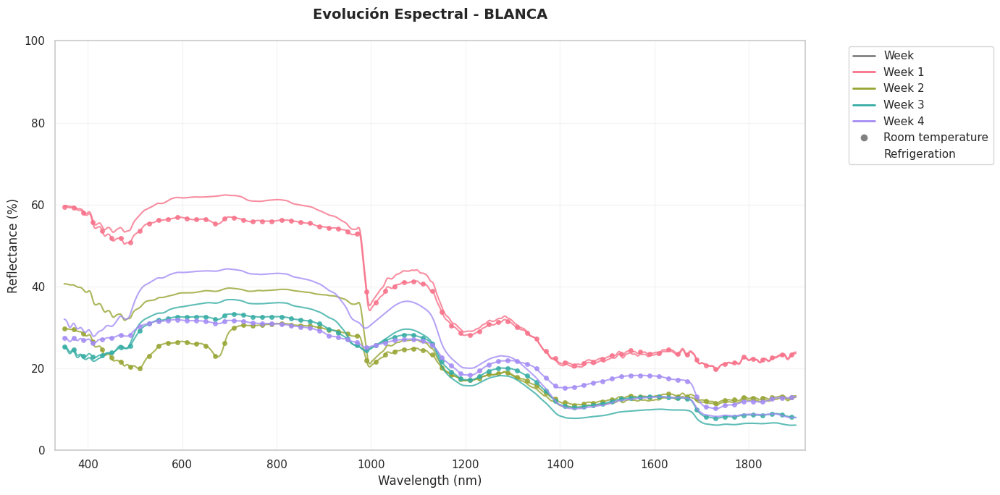

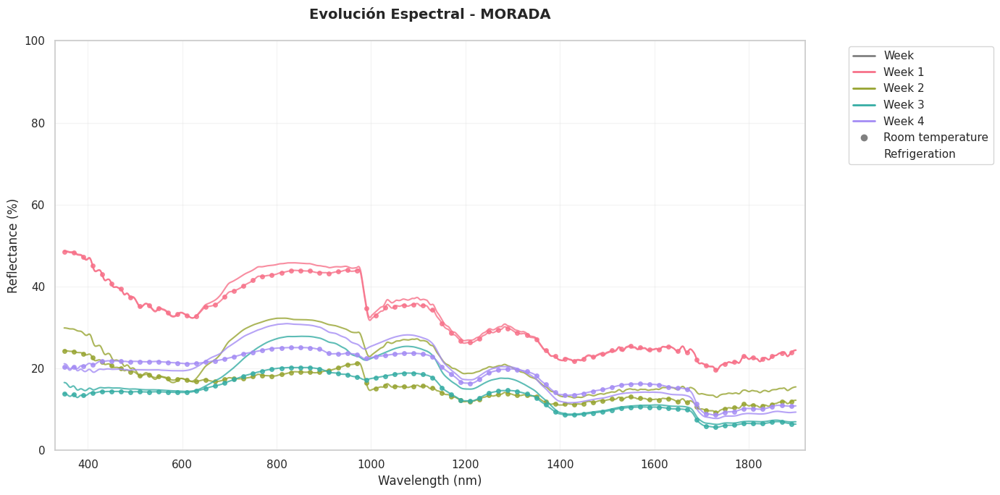

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import savgol_filter
from matplotlib.lines import Line2D
import numpy as np

# 1. Configuración inicial
sns.set_style("whitegrid")
plt.rcParams.update({
    'figure.facecolor': 'white',
    'axes.grid': True,
    'grid.alpha': 0.3,
    'font.size': 12
})

# 2. Carga y verificación de datos
def load_and_verify_data():
    path_base = '/content/drive/MyDrive/Colab Notebooks/Espectral/Data/'
    files = [
        (1,'2024_Oct_09/CORTADAS/AMBIENTE/2024_OCT_09_AMB_CORT (1).csv', 'Ambiente'),
        (1, '2024_Oct_09/CORTADAS/REFRI/2024_OCT_09_REFRI_CORT (1).csv', 'Refrigeración'),
        (2, '2024_Oct_16/SM-1900_15B82D3/CORTADAS/AMBIENTE/2024_OCT_16_AMB_CORT (1).csv', 'Ambiente'),
        (2, '2024_Oct_16/SM-1900_15B82D3/CORTADAS/REFRI/2024_OCT_16_REFRI_CORT (1).csv', 'Refrigeración'),
        (3, '2024_Oct_23/SM-1900_15B82D3/CORTADAS/AMBIENTE/2024_OCT_23_AMB_CORT (1).csv', 'Ambiente'),
        (3, '2024_Oct_23/SM-1900_15B82D3/CORTADAS/REFRI/2024_OCT_23_REFRI_CORT (1).csv', 'Refrigeración'),
        (4,'2024_Oct_30/2024_Oct_30/CORTADA/AMBIENTE/2024_OCT_30_AMB_CORT (1).csv', 'Ambiente'),
        (4, '2024_Oct_30/2024_Oct_30/CORTADA/REFRI/2024_OCT_30_REFRI_CORT (1).csv', 'Refrigeración')
    ]

    dfs = []
    for week, path, treatment in files:
        try:
            df = pd.read_csv(path_base + path)
            df['Week'] = week
            df['Treatment'] = treatment
            dfs.append(df)
            print(f"✅ Archivo cargado correctamente: Semana {week} - {treatment}")
        except Exception as e:
            print(f"❌ Error al cargar {path}: {str(e)}")
            continue

    if not dfs:
        raise ValueError("No se pudo cargar ningún archivo")

    return pd.concat(dfs).sort_values(['Material', 'Week', 'Treatment', 'Wvl'])

# 3. Procesamiento cuidadoso de datos
def process_data_carefully(df):
    # Verificación básica de datos
    if 'Reflect. %' not in df.columns:
        raise ValueError("La columna 'Reflect. %' no existe en los datos")

    # Limpieza inicial
    df = df.dropna(subset=['Reflect. %', 'Wvl'])
    df['Reflect. %'] = pd.to_numeric(df['Reflect. %'], errors='coerce')
    df = df.dropna(subset=['Reflect. %'])

    # Promedio por grupo para reducir ruido
    grouped = df.groupby(['Material', 'Wvl', 'Week', 'Treatment'])['Reflect. %'].mean().reset_index()

    # Suavizado con verificación
    smoothed = pd.DataFrame()
    for (mat, week, treatment), group in grouped.groupby(['Material', 'Week', 'Treatment']):
        if len(group) < 15:  # Muy pocos puntos para suavizar
            print(f"Advertencia: Datos insuficientes para {mat}-Semana{week}-{treatment}")
            temp_df = group.copy()
        else:
            try:
                y_smooth = savgol_filter(
                    group['Reflect. %'].values,
                    window_length=min(15, len(group)//2*2+1),  # Asegurar impar
                    polyorder=2,
                    mode='mirror'
                )
                temp_df = group.copy()
                temp_df['Reflect. %'] = y_smooth
            except Exception as e:
                print(f"Error al suavizar {mat}-Semana{week}-{treatment}: {str(e)}")
                temp_df = group.copy()

        smoothed = pd.concat([smoothed, temp_df])

    return smoothed

# 4. Visualización robusta
def plot_spectral_evolution(df):
    # Configuración de estilos
    week_palette = sns.color_palette("husl", 4)
    treatment_markers = {'Ambiente': 'o', 'Refrigeración': ''}

    for material in df['Material'].unique():
        plt.figure(figsize=(14, 7))
        subset = df[df['Material'] == material]

        # Verificar si hay datos
        if subset.empty:
            print(f"No hay datos para {material}")
            continue

        # Graficar cada combinación
        for week in range(1, 5):
            for treatment in ['Ambiente', 'Refrigeración']:
                data_plot = subset[(subset['Week'] == week) &
                                 (subset['Treatment'] == treatment)]
                if not data_plot.empty:
                    plt.plot(data_plot['Wvl'], data_plot['Reflect. %'],
                             color=week_palette[week-1],
                             linestyle='-',
                             marker=treatment_markers[treatment],
                             markersize=4,
                             markevery=20,
                             linewidth=1.5,
                             alpha=0.8,
                             label=f'S{week}-{treatment[:3]}')

        # Ajustes del gráfico
        plt.title(f'Evolución Espectral - {material}\n', fontsize=14)
        plt.xlabel('Wavelength (nm)', fontsize=12)
        plt.ylabel('Reflectance (%)', fontsize=12)
        plt.grid(True, alpha=0.2)

        # Límites inteligentes
        x_buffer = 20
        y_buffer = 0.1 * (subset['Reflect. %'].max() - subset['Reflect. %'].min())

        plt.xlim(350 - x_buffer, 1900 + x_buffer)
        plt.ylim(0,100)

        # Leyenda mejorada
        legend_elements = [
            Line2D([0], [0], color='gray', lw=2, label='Week'),
            *[Line2D([0], [0], color=week_palette[i], lw=2, label=f'Week {i+1}')
             for i in range(4)],
            Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=8, label='Room temperature'),
            Line2D([0], [0], marker='', color='w', markerfacecolor='gray', markersize=8, label='Refrigeration')
        ]

        plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

# Ejecución principal
try:
    print("🔍 Cargando datos...")
    raw_data = load_and_verify_data()

    print("\n🔧 Procesando datos...")
    processed_data = process_data_carefully(raw_data)

    print("\n📊 Generando gráficos...")
    plot_spectral_evolution(processed_data)

except Exception as e:
    print(f"\n❌ Error crítico: {str(e)}")
    print("Recomendaciones:")
    print("1. Verifica las rutas de los archivos")
    print("2. Comprueba la estructura de los datos (columnas esperadas: Material, Wvl, Reflect. %)")
    print("3. Revisa que los valores de reflectancia sean numéricos")

In [ ]:
print(firma_combined.columns)


Index(['Material', 'Wvl', 'Week', 'Reflect. %'], dtype='object')


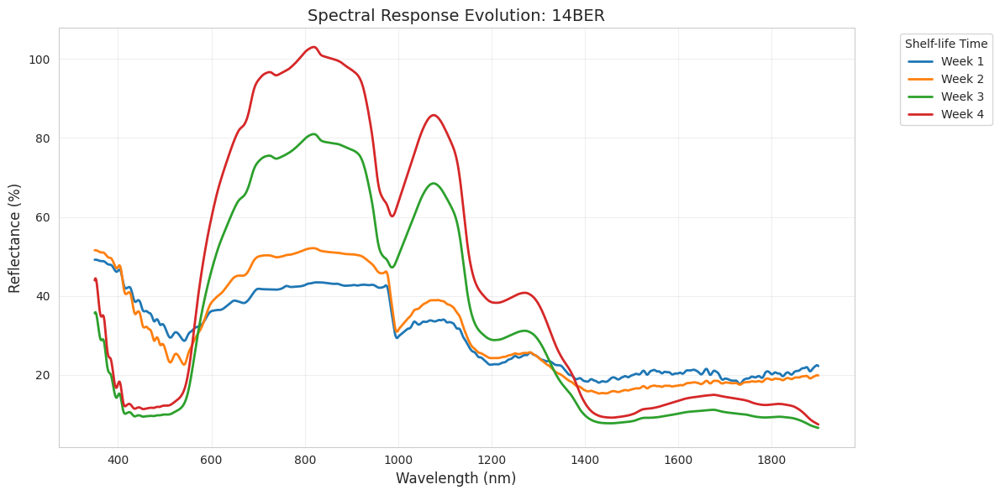

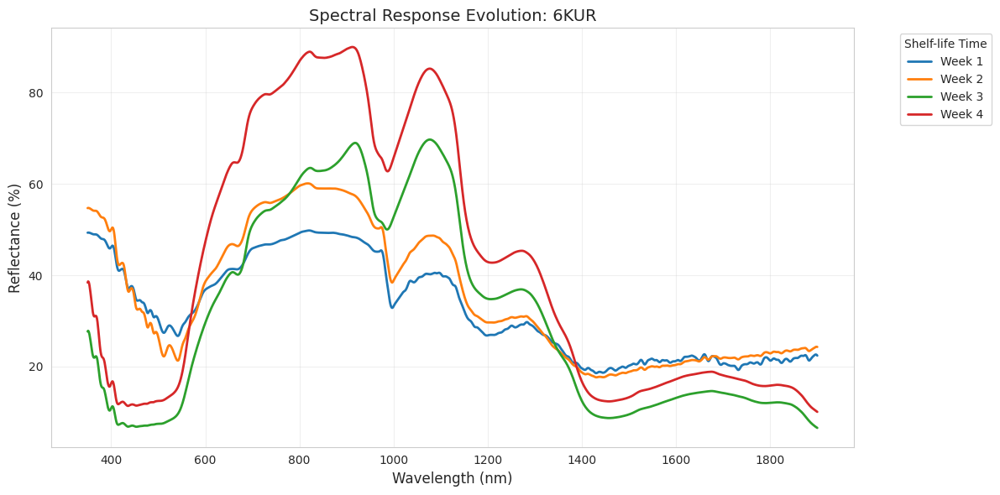

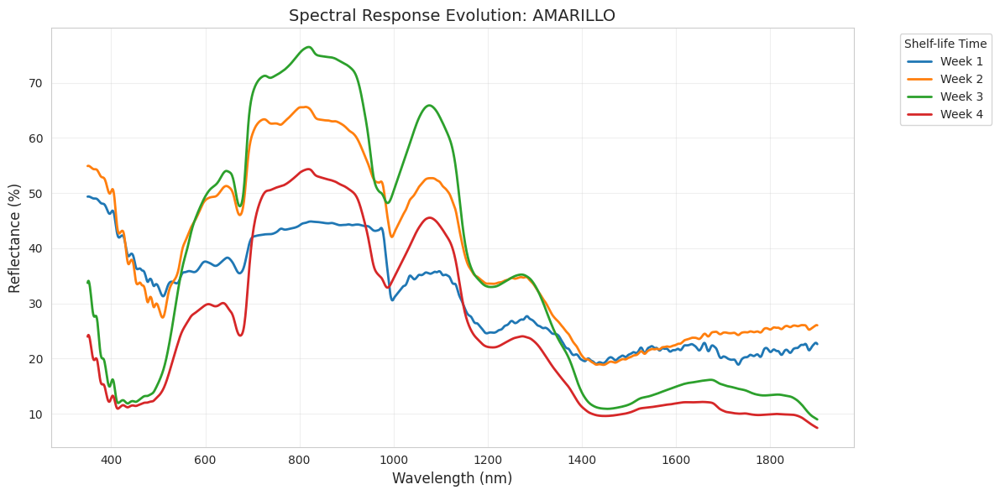

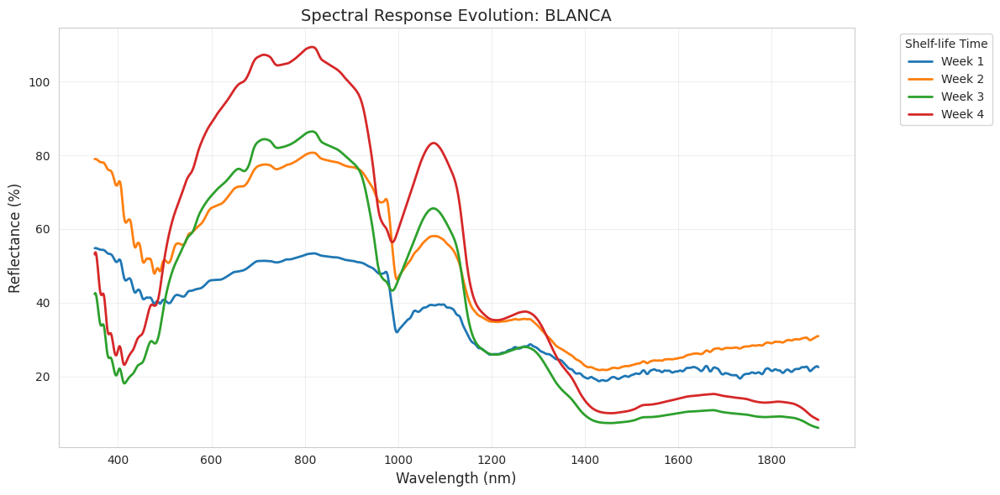

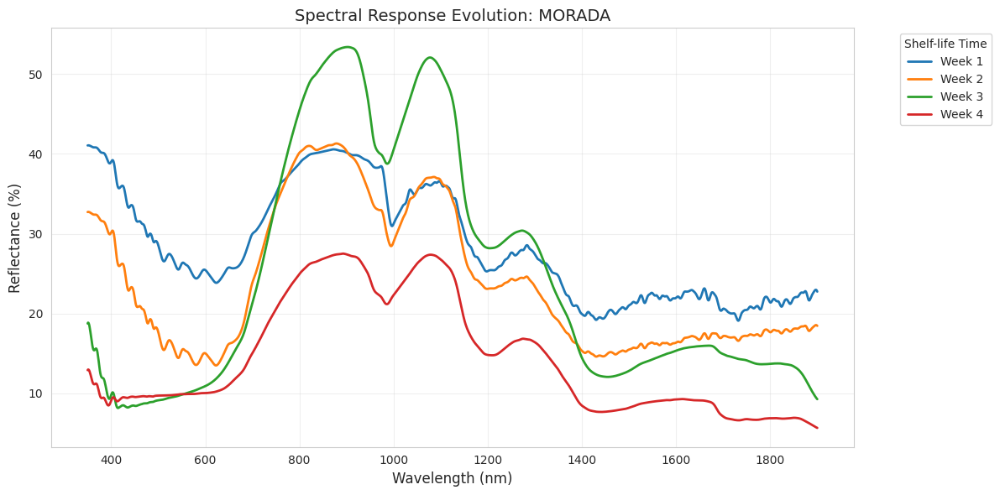

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter

# Configuración
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = [10, 6]

# Parámetros del suavizado
window_length = 15
polyorder = 3

# Crear una figura por cada material
for material in firma_smoothed['Material'].unique():
    plt.figure(figsize=(12, 6))

    # Filtrar datos para este material
    material_data = firma_smoothed[firma_smoothed['Material'] == material]

    # Graficar cada semana con diferente estilo de línea
    for week in sorted(material_data['Week'].unique()):
        week_data = material_data[material_data['Week'] == week]
        plt.plot(week_data['Wvl'], week_data['Reflect. %'],
                label=f'Week {week}',
                linewidth=2)

    # Personalizar el gráfico
    plt.title(f'Spectral Response Evolution: {material}', fontsize=14)
    plt.xlabel('Wavelength (nm)', fontsize=12)
    plt.ylabel('Reflectance (%)', fontsize=12)
    plt.legend(title='Shelf-life Time', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)

    # Ajustar márgenes
    plt.tight_layout()
    plt.show()

In [ ]:
# Primero, cargar y marcar correctamente todos los datos
path_base = '/content/drive/MyDrive/Colab Notebooks/Espectral/Data/'

# Función para cargar datos
def load_data(week, path_suffix, treatment):
    df = pd.read_csv(path_base + path_suffix)
    df['Week'] = week
    df['Treatment'] = treatment
    return df

# Cargar todos los datos
data = pd.concat([
    load_data(1, '2024_Oct_09/2024_Oct_09/AMBIENTE/2024_OCT_09_AMBIENTE_NOR (1).csv', 'Ambiente'),
    load_data(1, '2024_Oct_09/2024_Oct_09/REFRI/2024_OCT_09 (1).csv', 'Refrigeración'),
    load_data(2, '2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/AMBIENTE/2024_OCT_16_AMB_NOR (1).csv', 'Ambiente'),
    load_data(2, '2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/REFRI/2024_OCT_16_REFRI_NOR (1).csv', 'Refrigeración'),
    load_data(3, '2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/AMBIENTE/2024_OCT_23_AMB_NORM (1).csv', 'Ambiente'),
    load_data(3, '2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/REFRI/2024_OCT_23_REFRI_NORM (1).csv', 'Refrigeración'),
    load_data(4, '2024_Oct_30/2024_Oct_30/AMBIENTE/2024_OCT_30_AMB_NORM (1).csv', 'Ambiente'),
    load_data(4, '2024_Oct_30/2024_Oct_30/REFRI/2024_OCT_30_REFRI_NORM (1).csv', 'Refrigeración')
])

# Procesamiento y suavizado
data_combined = data.groupby(['Material', 'Wvl', 'Week', 'Treatment']).mean().reset_index()
data_combined = data_combined[(data_combined['Wvl'] > 400) & (data_combined['Wvl'] < 600)]

# Aplicar suavizado
window_length = 15
polyorder = 3
data_smoothed = pd.DataFrame()

for (mat, week, treatment), group in data_combined.groupby(['Material', 'Week', 'Treatment']):
    y_smooth = savgol_filter(group['Reflect. %'], window_length, polyorder)
    df = pd.DataFrame({
        'Reflect. %': y_smooth,
        'Material': mat,
        'Week': week,
        'Treatment': treatment,
        'Wvl': group['Wvl'].values
    })
    data_smoothed = pd.concat([data_smoothed, df], axis=0)

In [ ]:
import pandas as pd
import os
from google.colab import drive

# Montar Google Drive
drive.mount('/content/drive')

# Función mejorada para cargar datos
def load_cut_data(week, relative_path, treatment, measurement):
    base_path = '/content/drive/MyDrive/Colab Notebooks/Espectral/Data/'
    full_path = os.path.join(base_path, relative_path)

    # Verificar si el archivo existe exactamente como está escrito
    if not os.path.isfile(full_path):
        # Intentar encontrar una versión similar del archivo
        dir_name = os.path.dirname(full_path)
        if os.path.isdir(dir_name):
            available_files = os.listdir(dir_name)
            print(f"\n⚠️ Archivo no encontrado: {os.path.basename(full_path)}")
            print(f"Archivos disponibles en {dir_name}:")
            for f in available_files:
                print(f" - {f}")
        else:
            print(f"\n⚠️ Directorio no encontrado: {dir_name}")

        return pd.DataFrame()

    try:
        df = pd.read_csv(full_path)
        df['Week'] = week
        df['Treatment'] = treatment
        df['Measurement'] = measurement
        return df
    except Exception as e:
        print(f"\n⚠️ Error al leer {full_path}: {str(e)}")
        return pd.DataFrame()

# Cargar datos con verificación
print("Cargando datos...")

# Refrigeración interna
print("\nCargando datos de refrigeración interna:")
refri_cut = pd.concat([
    load_cut_data(1, '2024_Oct_09/CORTADAS/REFRI/2024_OCT_09_REFRI_CORT (1).csv', 'Refrigeration', 'Internal'),
    load_cut_data(2, '2024_Oct_16/SM-1900_15B82D3/CORTADAS/REFRI/2024_OCT_16_REFRI_CORT (1).csv', 'Refrigeration', 'Internal'),
    load_cut_data(3, '2024_Oct_23/SM-1900_15B82D3/CORTADAS/REFRI/2024_OCT_23_REFRI_CORT (1).csv', 'Refrigeration', 'Internal'),
    load_cut_data(4, '2024_Oct_30/2024_Oct_30/CORTADA/REFRI/2024_OCT_30_REFRI_CORT (1).csv', 'Refrigeration', 'Internal')
])

# Ambiente interno
print("\nCargando datos de ambiente interno:")
amb_cut = pd.concat([
    load_cut_data(1, '2024_Oct_09/CORTADAS/AMBIENTE/2024_OCT_09_AMB_CORT (1).csv', 'Room Temp', 'Internal'),
    load_cut_data(2, '2024_Oct_16/SM-1900_15B82D3/CORTADAS/AMBIENTE/2024_OCT_16_AMB_CORT (1).csv', 'Room Temp', 'Internal'),
    load_cut_data(3, '2024_Oct_23/SM-1900_15B82D3/CORTADAS/AMBIENTE/2024_OCT_23_AMB_CORT (1).csv', 'Room Temp', 'Internal'),
    load_cut_data(4, '2024_Oct_30/2024_Oct_30/CORTADA/AMBIENTE/2024_OCT_30_AMB_CORT (1).csv', 'Room Temp', 'Internal')
])

# Verificar resultados
print("\nResultados:")
print(f"Datos refrigeración: {len(refri_cut)} registros")
print(f"Datos ambiente: {len(amb_cut)} registros")

if len(refri_cut) == 0 and len(amb_cut) == 0:
    print("\n🔴 Error: No se cargaron datos. Posibles soluciones:")
    print("1. Verifica que Google Drive esté montado correctamente")
    print("2. Confirma la ruta base: /content/drive/MyDrive/Colab Notebooks/Espectral/Data/")
    print("3. Asegúrate que los nombres de archivos coincidan exactamente (incluyendo mayúsculas, espacios y paréntesis)")
    print("4. Revisa si los archivos tienen la extensión .csv")
else:
    # Combinar datos y continuar con el procesamiento
    full_data = pd.concat([refri_cut, amb_cut])
    print("\n🟢 Datos cargados exitosamente!")
    print("Materiales encontrados:", full_data['Material'].unique())

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Cargando datos...

Cargando datos de refrigeración interna:

Cargando datos de ambiente interno:

Resultados:
Datos refrigeración: 93060 registros
Datos ambiente: 93060 registros

🟢 Datos cargados exitosamente!
Materiales encontrados: ['AMARILLO' '6KUR' 'BLANCA' 'MORADA' '14BER']


In [ ]:
import plotly.express as px

fig = px.line(data_smoothed,
              x='Wvl',
              y='Reflect. %',
              color='Material',
              line_dash='Treatment',
              animation_frame='Week',
              facet_col='Treatment',
              range_y=[data_smoothed['Reflect. %'].min()*0.95,
                      data_smoothed['Reflect. %'].max()*1.05],
              title='Evolución espectral por tratamiento y semana',
              width=1200,
              height=600)

fig.update_layout(legend=dict(orientation="h", yanchor="bottom", y=1.02))
fig.show()

Datos cargados para análisis multivariado:
Muestras totales: 120
Grupos únicos: 10
Grupo
Morada_Ambiente           12
Amarilla_Ambiente         12
6KUR_Ambiente             12
14BER_Ambiente            12
Blanca_Ambiente           12
Morada_Refrigeración      12
Amarilla_Refrigeración    12
6KUR_Refrigeración        12
14BER_Refrigeración       12
Blanca_Refrigeración      12
Name: count, dtype: int64

=== ANÁLISIS DISCRIMINANTE LINEAL (LDA) ===


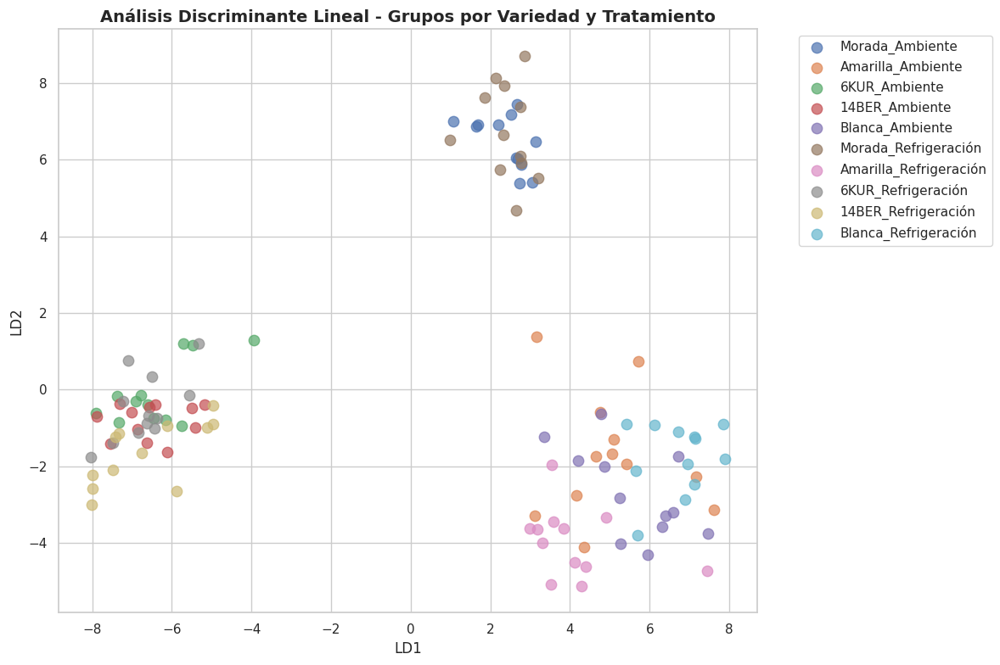


=== ANÁLISIS DE COMPONENTES PRINCIPALES (PCA) ===


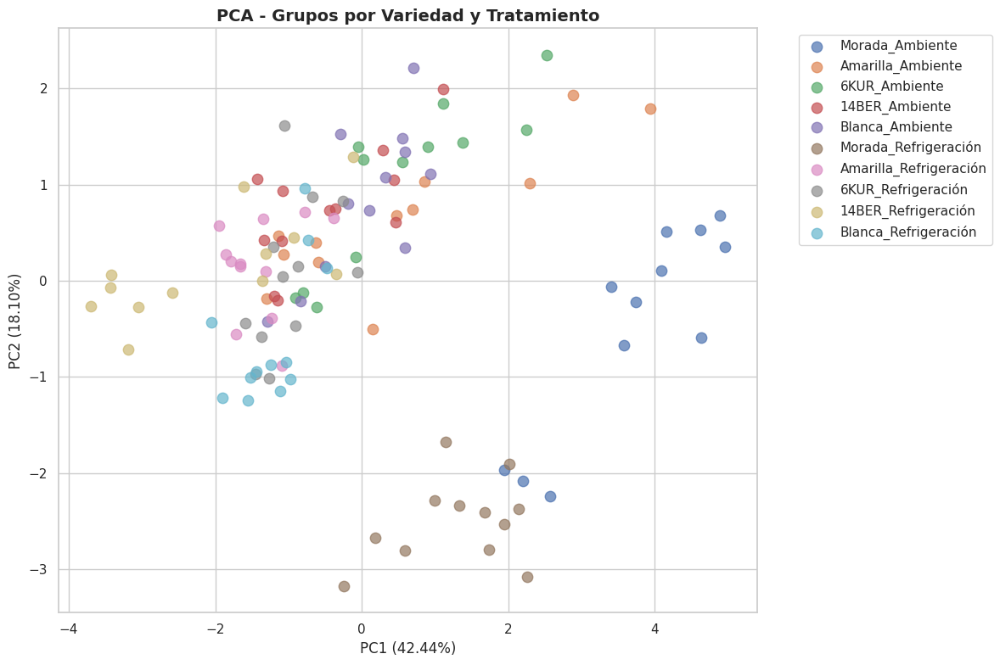


=== ANÁLISIS CLUSTER K-MEANS ===


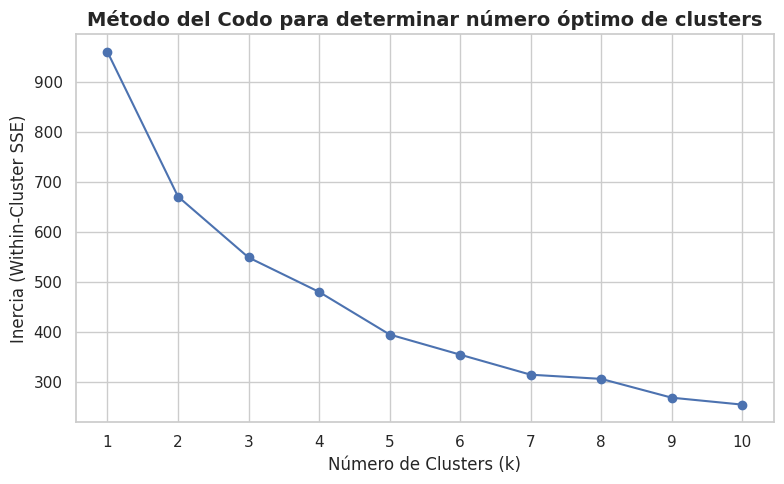

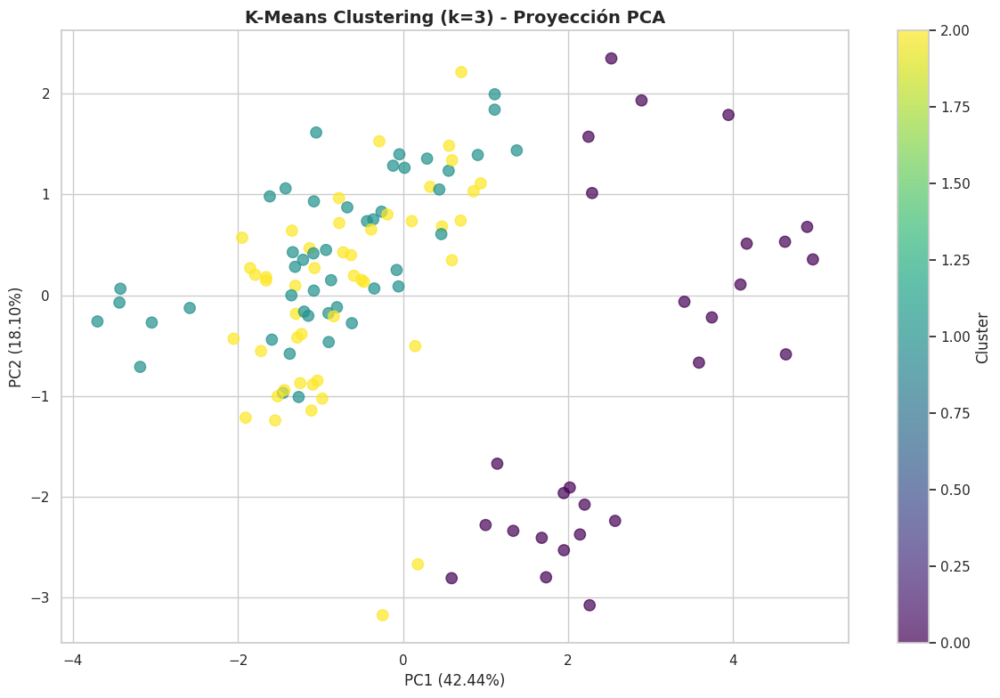


=== ANÁLISIS DISCRIMINANTE POR TIPO DE TRATAMIENTO ===


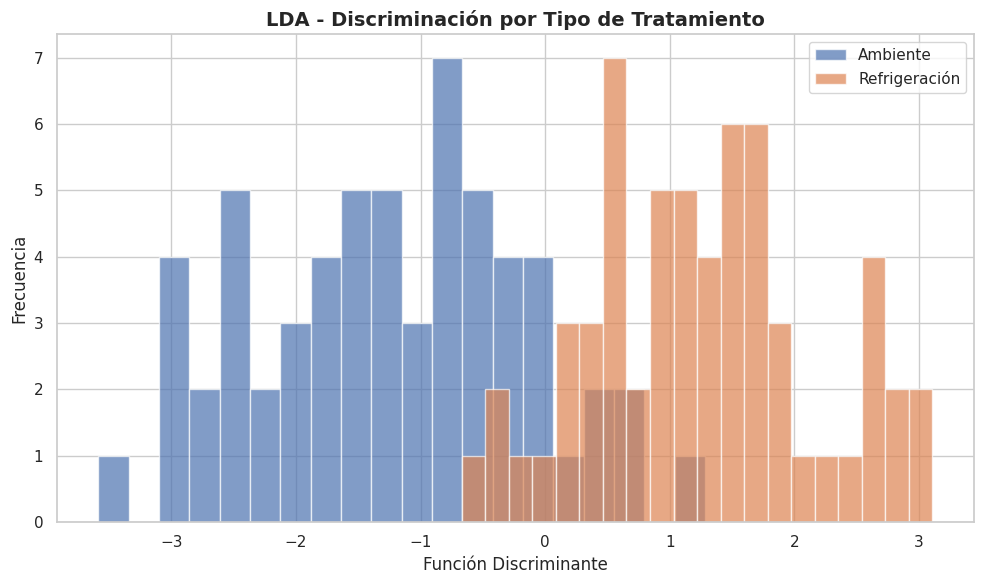


=== ANÁLISIS DISCRIMINANTE POR VARIEDAD ===


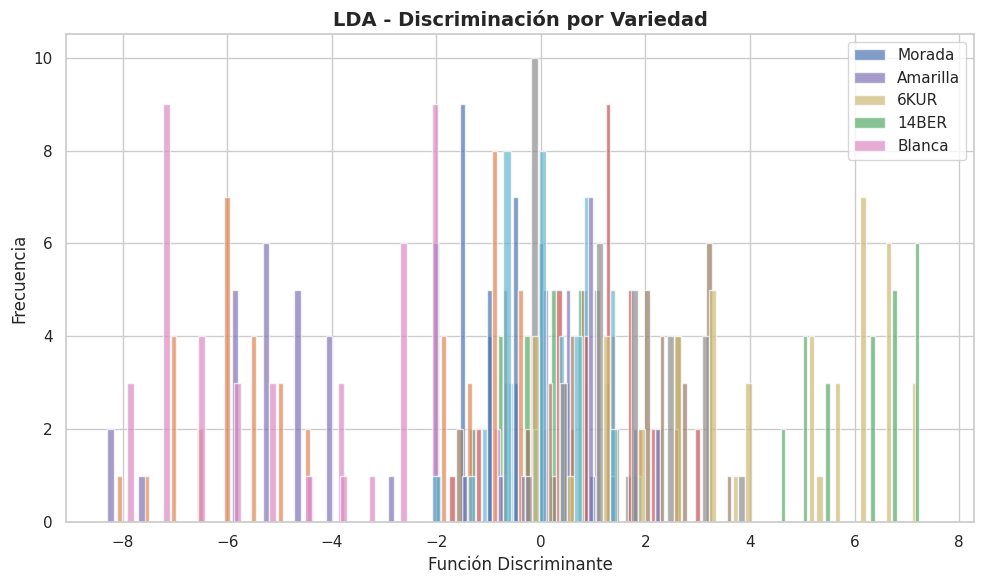


=== MATRICES DE CORRELACIÓN POR GRUPO ===


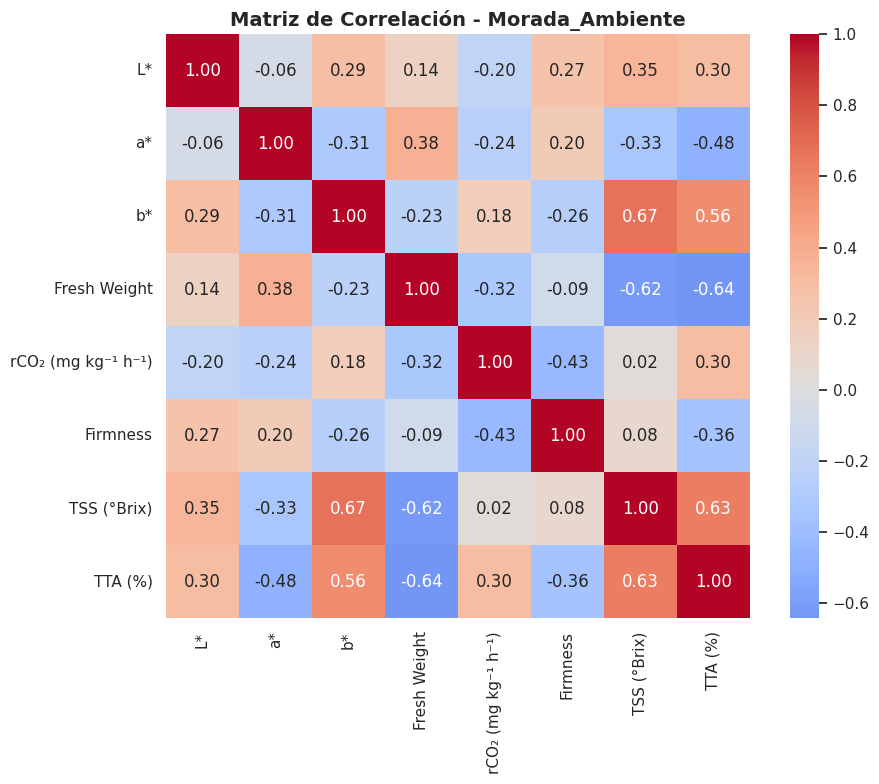

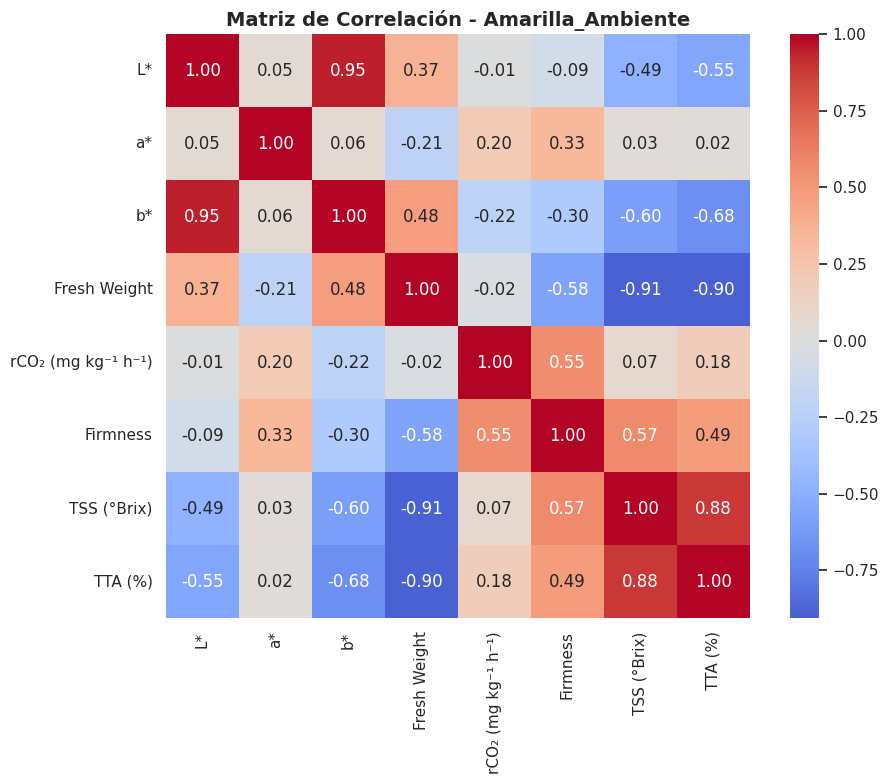

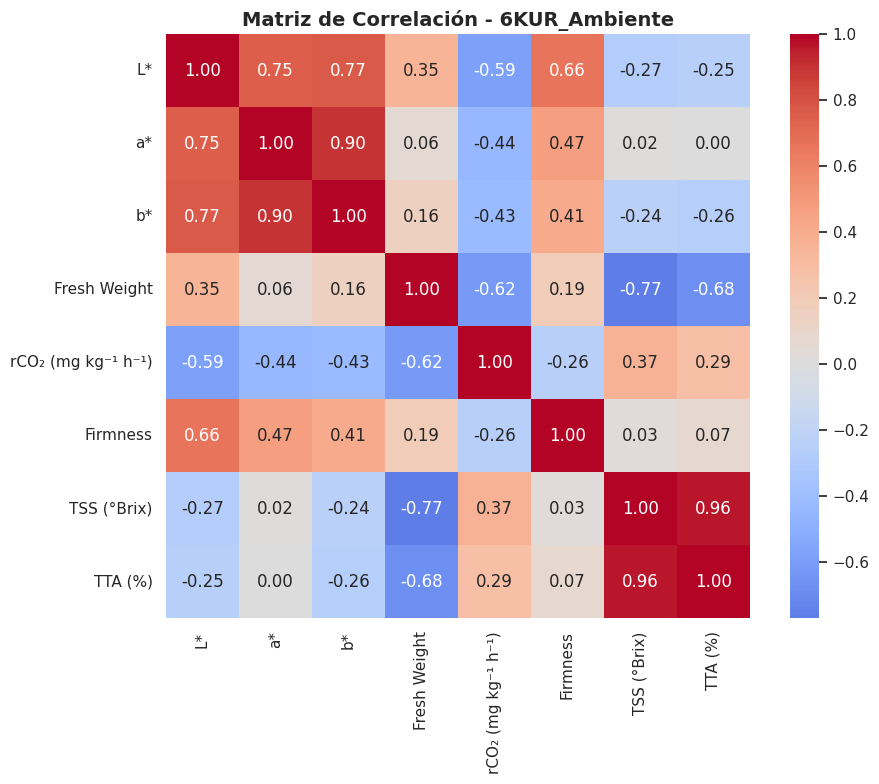

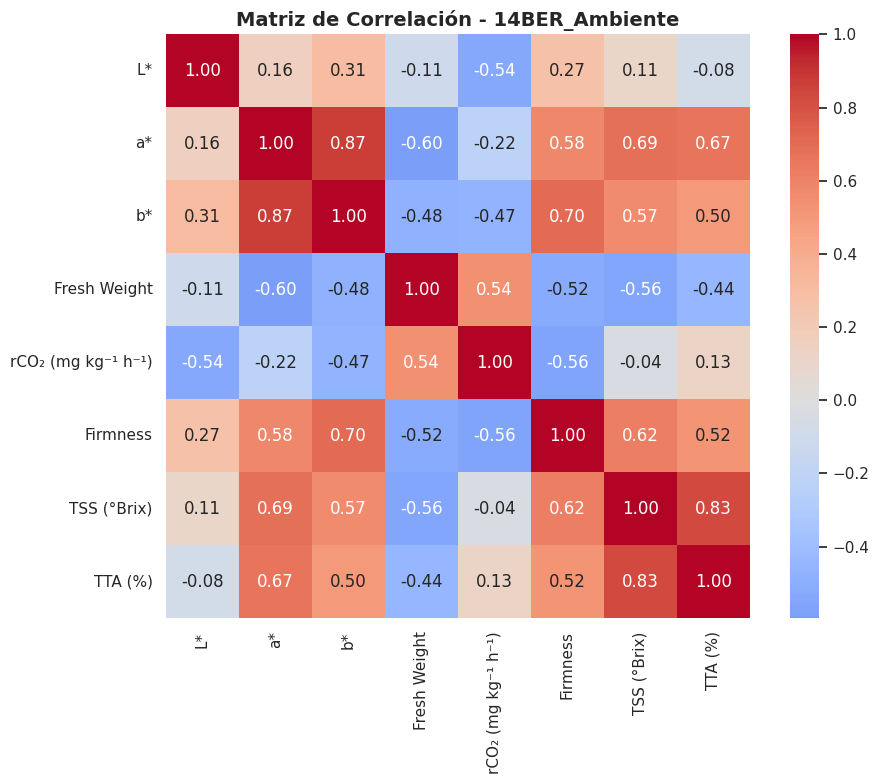

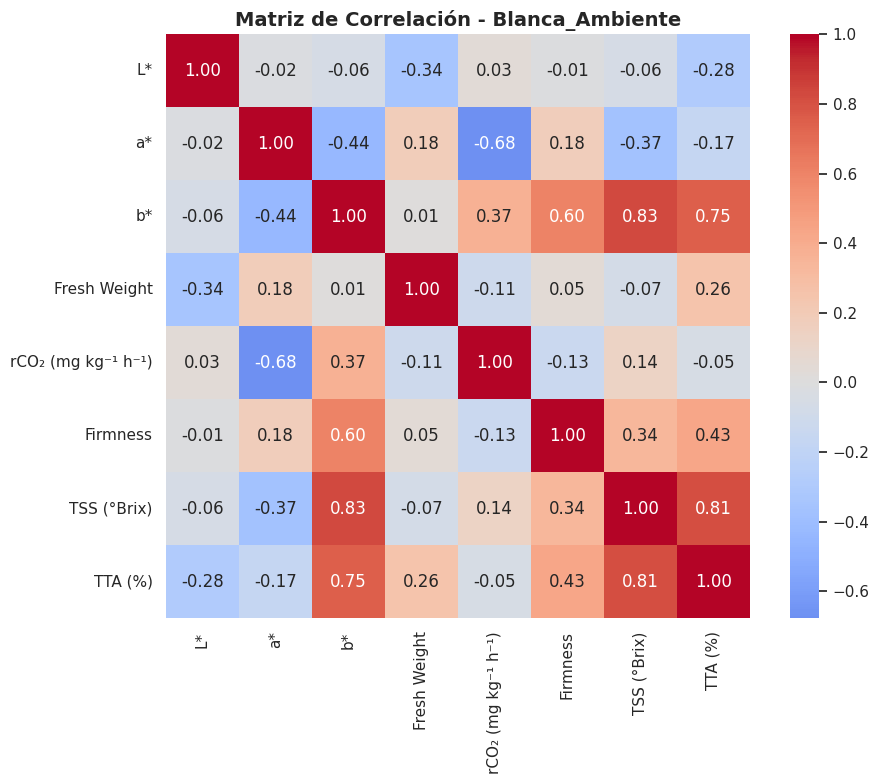

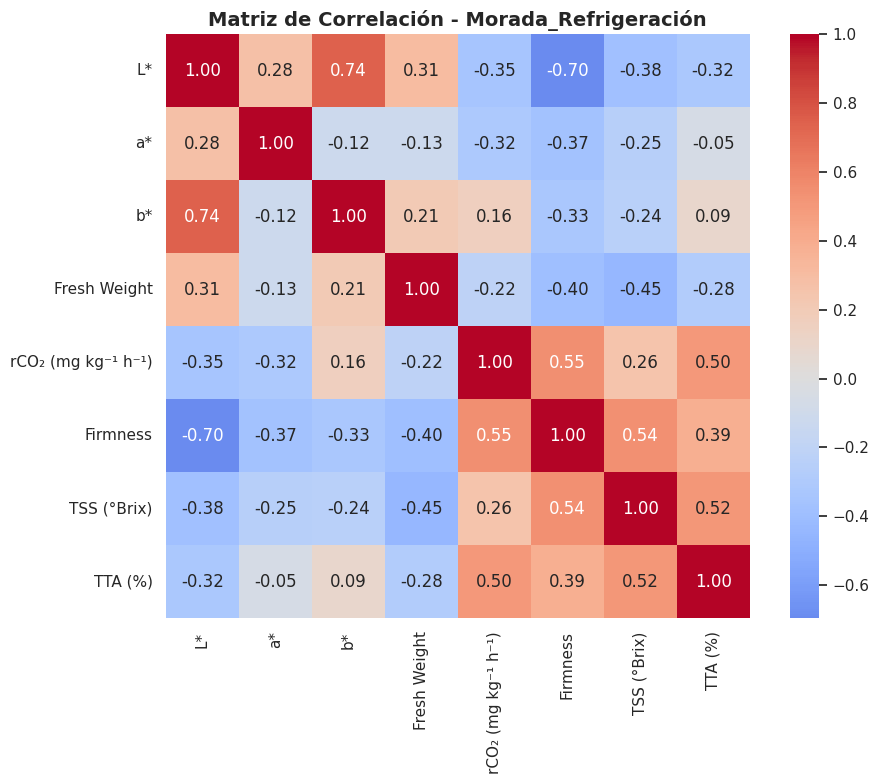

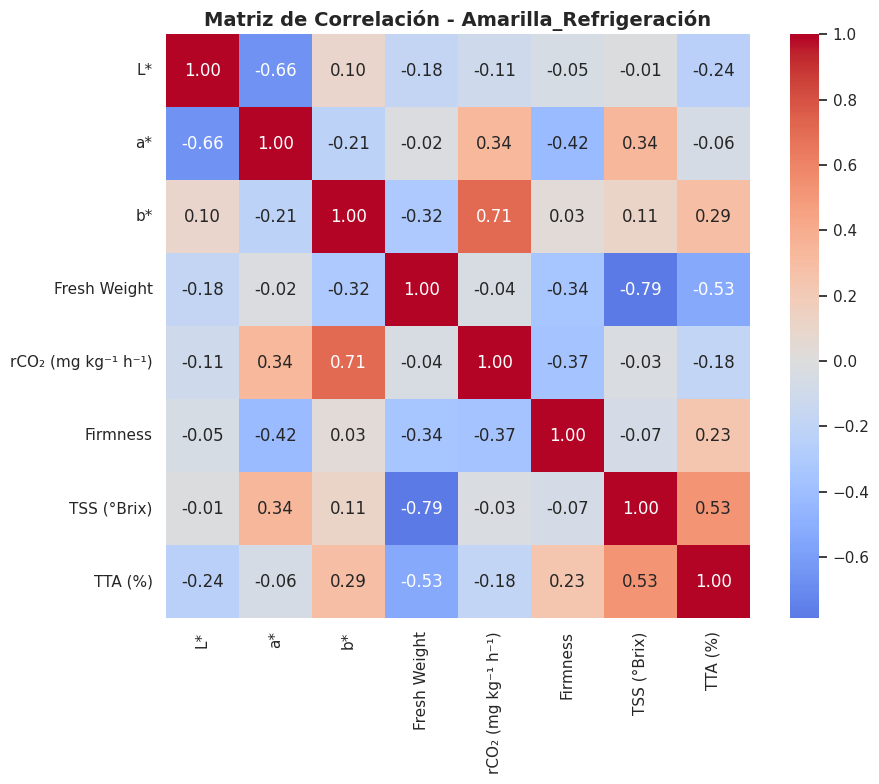

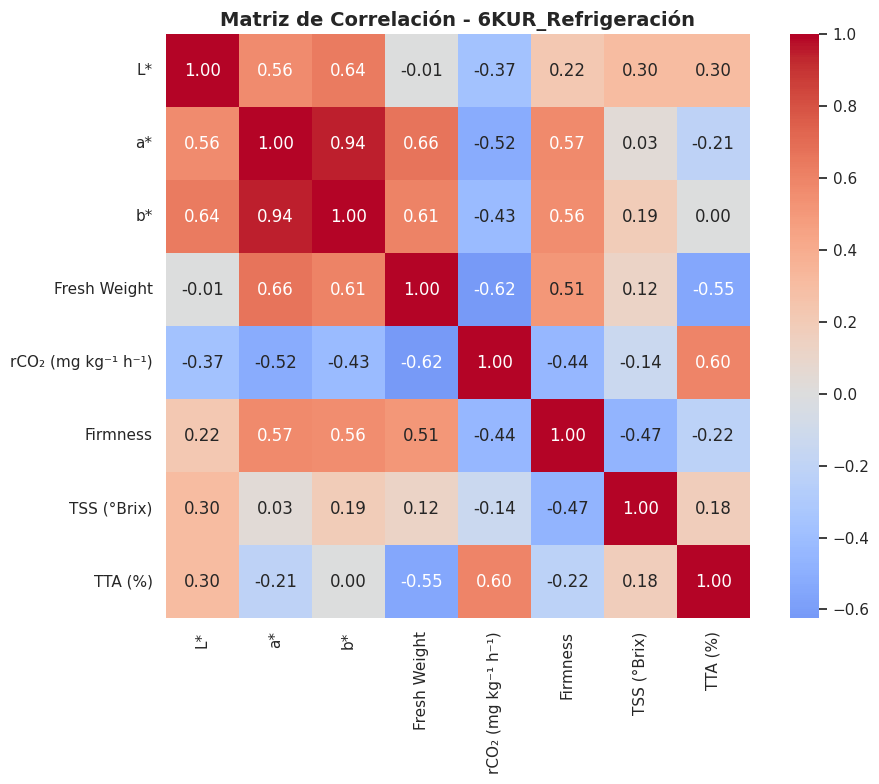

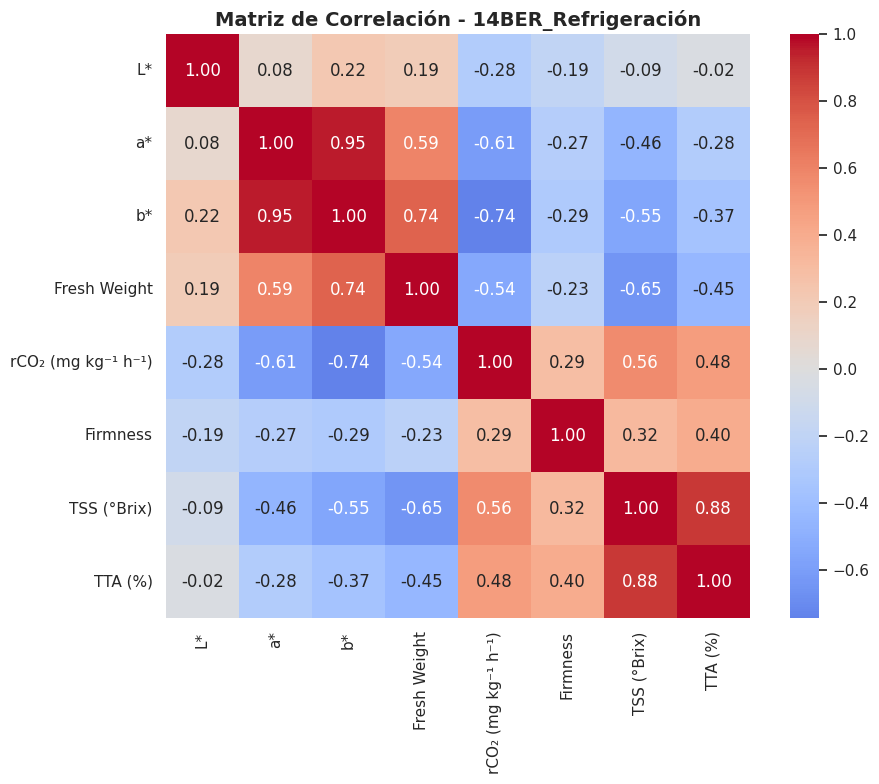

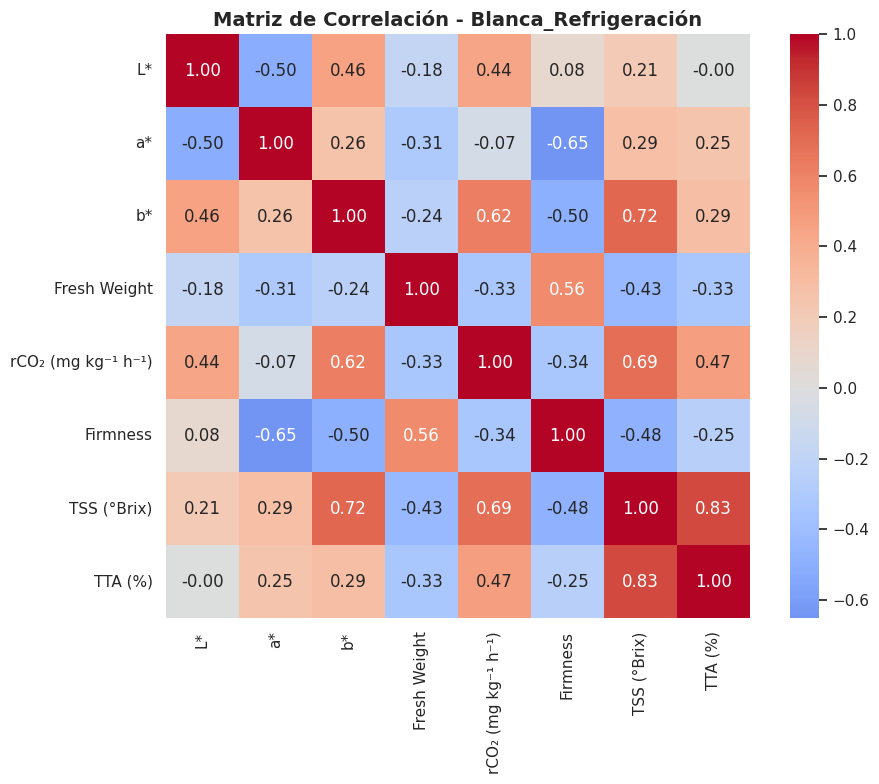


=== ANÁLISIS DE VARIANZA (ANOVA) POR PARÁMETRO ===

ANOVA para L*:
F-statistic: 116.1312, p-value: 0.0000
Diferencias significativas encontradas. Realizando test de Tukey:
                 Multiple Comparison of Means - Tukey HSD, FWER=0.05                  
        group1                 group2         meandiff p-adj   lower    upper   reject
--------------------------------------------------------------------------------------
        14BER_Ambiente    14BER_Refrigeración   0.1317    1.0  -3.9313   4.1947  False
        14BER_Ambiente          6KUR_Ambiente  -3.0292 0.3315  -7.0922   1.0338  False
        14BER_Ambiente     6KUR_Refrigeración    -3.46 0.1672   -7.523    0.603  False
        14BER_Ambiente      Amarilla_Ambiente  -0.1258    1.0  -4.1888   3.9372  False
        14BER_Ambiente Amarilla_Refrigeración   4.7308 0.0099   0.6678   8.7938   True
        14BER_Ambiente        Blanca_Ambiente   8.6733    0.0   4.6103  12.7363   True
        14BER_Ambiente   Blanca_Refrigeració

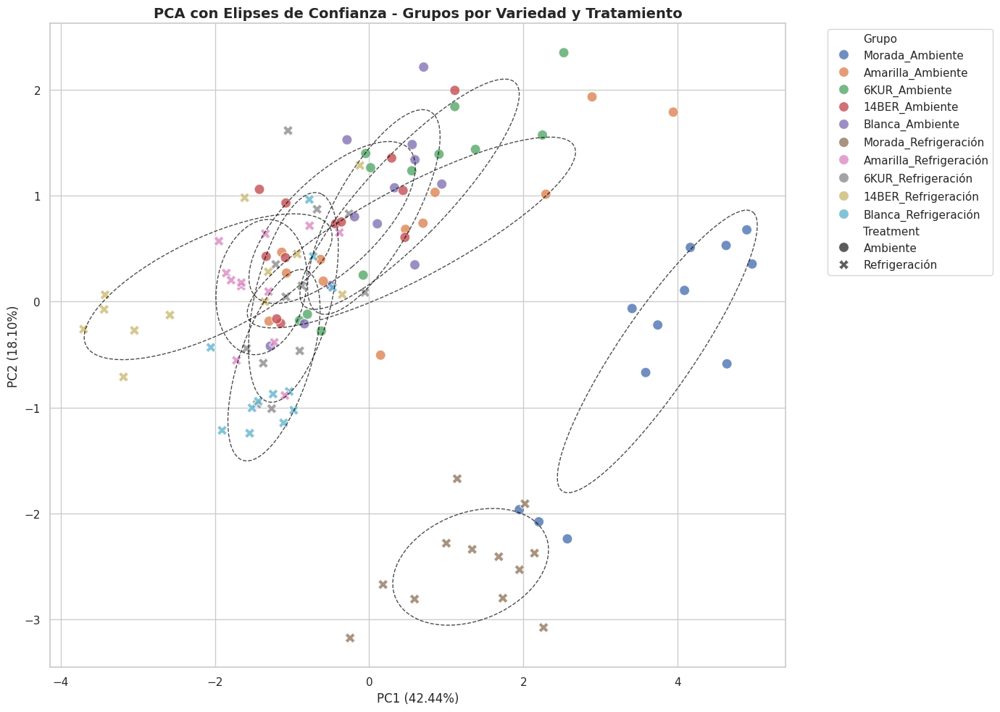


=== CARGAS DE LOS COMPONENTES PRINCIPALES ===
Variables con mayor peso en PC1:
TTA (%)         0.464391
Fresh Weight    0.433307
b*              0.362353
TSS (°Brix)     0.360200
L*              0.354047
Name: PC1, dtype: float64

Variables con mayor peso en PC2:
b*                    0.506830
TSS (°Brix)           0.484937
L*                    0.432359
rCO₂ (mg kg⁻¹ h⁻¹)    0.337726
Firmness              0.303603
Name: PC2, dtype: float64


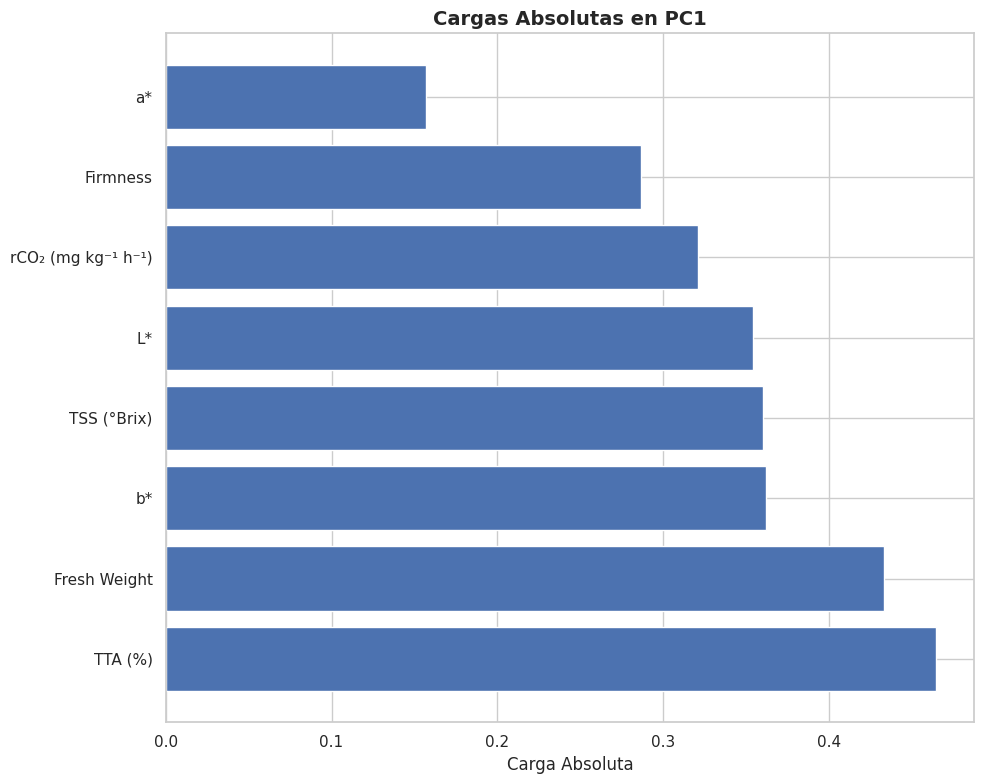

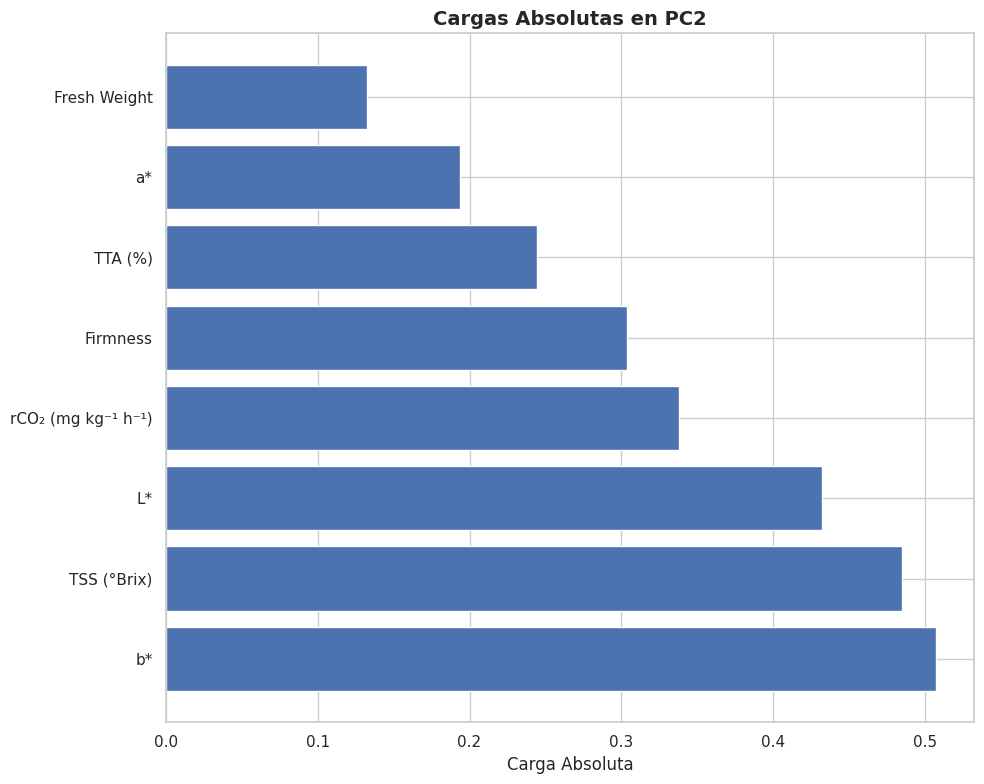


=== RESUMEN ESTADÍSTICO ===
Medias por grupo para cada parámetro:
                               L*         a*         b*  Fresh Weight  \
Grupo                                                                   
14BER_Ambiente          52.719167  21.231667  31.093333    161.066667   
14BER_Refrigeración     52.850833  22.417500  35.509167    261.380833   
6KUR_Ambiente           49.690000  20.555000  30.171667     95.761667   
6KUR_Refrigeración      49.259167  21.865000  33.570000    174.711667   
Amarilla_Ambiente       52.593333  -0.620833  32.090833    146.966667   
Amarilla_Refrigeración  57.450000   2.268333  38.149167    164.210000   
Blanca_Ambiente         61.392500  -0.621667  26.623333    131.505000   
Blanca_Refrigeración    60.321667  -1.747500  22.100833    198.215833   
Morada_Ambiente         34.763333   3.088333   8.623333     70.710833   
Morada_Refrigeración    33.206667   3.975833   7.728333    131.984167   

                        rCO₂ (mg kg⁻¹ h⁻¹)   Firmness  T

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from matplotlib.patches import Ellipse
import matplotlib.font_manager as fm
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scipy.stats as stats

# Configuración de estilo
plt.style.use('default')
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.titleweight'] = 'bold'

# Paleta de colores para variedades
variety_palette = {
    "6KUR": "red",
    "14BER": "orange",
    "Amarilla": "yellow",
    "Blanca": "lightgray",
    "Morada": "purple"
}

# Traducción de parámetros
param_translation = {
    'L*': 'L*',
    'a*': 'a*',
    'b*': 'b*',
    'Peso_Fresco': 'Fresh Weight',
    'Firmeza': 'Firmness',
    'Respiración': 'rCO₂ (mg kg⁻¹ h⁻¹)',
    'IC': 'IC',
    'SST_Corregido': 'TSS (°Brix)',
    'ATT': 'TTA (%)'
}

def load_carrot_data(file_path, week):
    """Cargar datos de zanahorias desde archivos Excel"""
    try:
        amb_data = pd.read_excel(file_path, sheet_name='Ambiente')
        refri_data = pd.read_excel(file_path, sheet_name='Refrigeración')

        amb_data['Week'] = week
        amb_data['Treatment'] = 'Ambiente'
        refri_data['Week'] = week
        refri_data['Treatment'] = 'Refrigeración'

        combined_data = pd.concat([amb_data, refri_data], ignore_index=True)
        combined_data.columns = combined_data.columns.str.strip()

        combined_data['Variedad'] = combined_data['Variedad'].str.strip()
        combined_data['Variedad'] = combined_data['Variedad'].replace({
            'YELLOW': 'Amarilla',
            'WHITE': 'Blanca',
            'PURPLE': 'Morada'
        })

        numeric_cols = ['L*', 'a*', 'b*', 'Diametro', 'Longitud', 'Peso_Fresco',
                       'Peso_fresco_kg', 'm', 'Respiración', 'ATAN', 'Hue',
                       'Croma', 'Firmeza', 'SST', 'SST_Corregido', 'NaOH',
                       'Acidez_Peso_Muestra', 'Factor_D', 'ATT']

        for col in numeric_cols:
            if col in combined_data.columns:
                combined_data[col] = pd.to_numeric(combined_data[col], errors='coerce')

        # Renombrar columnas a inglés
        combined_data = combined_data.rename(columns=param_translation)

        return combined_data
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return pd.DataFrame()

# Cargar datos
files_weeks = [
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/7 10.xlsx", 1),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 15 10 24  Colab_CadenaF_TAmb.xlsx", 2),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 21 10 024.xlsx", 3),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/ Muestreo 28 10 024.xlsx", 4)
]

all_data = []
for file_path, week in files_weeks:
    data = load_carrot_data(file_path, week)
    if not data.empty:
        all_data.append(data)

data = pd.concat(all_data, ignore_index=True)
data = data.dropna(how='all')
data['Variedad'] = data['Variedad'].str.strip()

# Crear variable combinada para análisis discriminante
data['Grupo'] = data['Variedad'] + '_' + data['Treatment']

# Seleccionar variables numéricas para análisis
numeric_params = ['L*', 'a*', 'b*', 'Fresh Weight', 'rCO₂ (mg kg⁻¹ h⁻¹)',
                 'Firmness', 'TSS (°Brix)', 'TTA (%)']

# Filtrar datos completos
analysis_data = data[['Grupo', 'Variedad', 'Treatment'] + numeric_params].dropna()

print("Datos cargados para análisis multivariado:")
print(f"Muestras totales: {len(analysis_data)}")
print(f"Grupos únicos: {analysis_data['Grupo'].nunique()}")
print(analysis_data['Grupo'].value_counts())

# 1. ANÁLISIS DISCRIMINANTE LINEAL (LDA)
print("\n=== ANÁLISIS DISCRIMINANTE LINEAL (LDA) ===")

# Preparar datos para LDA
X = analysis_data[numeric_params]
y = analysis_data['Grupo']

# Escalado
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# LDA con 2 componentes
lda = LinearDiscriminantAnalysis(n_components=2)
X_lda = lda.fit_transform(X_scaled, y)

# Visualización LDA
plt.figure(figsize=(12, 8))
for grupo in analysis_data['Grupo'].unique():
    mask = analysis_data['Grupo'] == grupo
    plt.scatter(X_lda[mask, 0], X_lda[mask, 1],
                label=grupo, s=80, alpha=0.7)

plt.title('Análisis Discriminante Lineal - Grupos por Variedad y Tratamiento')
plt.xlabel('LD1')
plt.ylabel('LD2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

# 2. ANÁLISIS DE COMPONENTES PRINCIPALES (PCA)
print("\n=== ANÁLISIS DE COMPONENTES PRINCIPALES (PCA) ===")

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Crear DataFrame para visualización
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['Grupo'] = analysis_data['Grupo'].values
pca_df['Variedad'] = analysis_data['Variedad'].values
pca_df['Treatment'] = analysis_data['Treatment'].values

# Visualización PCA
plt.figure(figsize=(12, 8))
for grupo in pca_df['Grupo'].unique():
    mask = pca_df['Grupo'] == grupo
    plt.scatter(pca_df.loc[mask, 'PC1'], pca_df.loc[mask, 'PC2'],
                label=grupo, s=80, alpha=0.7)

plt.title('PCA - Grupos por Variedad y Tratamiento')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

# 3. ANÁLISIS CLUSTER K-MEANS
print("\n=== ANÁLISIS CLUSTER K-MEANS ===")

# Método del codo para determinar número óptimo de clusters
inertias = []
k_range = range(1, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)

# Graficar el método del codo
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertias, marker='o')
plt.title("Método del Codo para determinar número óptimo de clusters")
plt.xlabel("Número de Clusters (k)")
plt.ylabel("Inercia (Within-Cluster SSE)")
plt.xticks(k_range)
plt.grid(True)
plt.tight_layout()
plt.show()

# Aplicar KMeans con número óptimo de clusters (elegir basado en el gráfico)
optimal_k = 3  # Ajustar según el método del codo
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Visualizar clusters
plt.figure(figsize=(12, 8))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='viridis', s=80, alpha=0.7)
plt.colorbar(scatter, label='Cluster')
plt.title(f'K-Means Clustering (k={optimal_k}) - Proyección PCA')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.grid(True)
plt.tight_layout()
plt.show()

# 4. ANÁLISIS DISCRIMINANTE POR TRATAMIENTO
print("\n=== ANÁLISIS DISCRIMINANTE POR TIPO DE TRATAMIENTO ===")

# LDA para discriminar entre tratamientos
lda_treatment = LinearDiscriminantAnalysis()
X_lda_treatment = lda_treatment.fit_transform(X_scaled, analysis_data['Treatment'])

# Visualización
plt.figure(figsize=(10, 6))
for treatment in analysis_data['Treatment'].unique():
    mask = analysis_data['Treatment'] == treatment
    plt.hist(X_lda_treatment[mask], alpha=0.7, label=treatment, bins=20)

plt.title('LDA - Discriminación por Tipo de Tratamiento')
plt.xlabel('Función Discriminante')
plt.ylabel('Frecuencia')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 5. ANÁLISIS DISCRIMINANTE POR VARIEDAD
print("\n=== ANÁLISIS DISCRIMINANTE POR VARIEDAD ===")

# LDA para discriminar entre variedades
lda_variety = LinearDiscriminantAnalysis()
X_lda_variety = lda_variety.fit_transform(X_scaled, analysis_data['Variedad'])

# Visualización
plt.figure(figsize=(10, 6))
for variety in analysis_data['Variedad'].unique():
    mask = analysis_data['Variedad'] == variety
    plt.hist(X_lda_variety[mask], alpha=0.7, label=variety, bins=20)

plt.title('LDA - Discriminación por Variedad')
plt.xlabel('Función Discriminante')
plt.ylabel('Frecuencia')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# 6. MATRIZ DE CORRELACIÓN POR GRUPO
print("\n=== MATRICES DE CORRELACIÓN POR GRUPO ===")

# Calcular y visualizar matrices de correlación para cada grupo
for grupo in analysis_data['Grupo'].unique():
    grupo_data = analysis_data[analysis_data['Grupo'] == grupo][numeric_params]
    corr_matrix = grupo_data.corr()

    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0,
                square=True, fmt='.2f')
    plt.title(f'Matriz de Correlación - {grupo}')
    plt.tight_layout()
    plt.show()

# 7. ANÁLISIS DE VARIANZA (ANOVA) PARA CADA PARÁMETRO
print("\n=== ANÁLISIS DE VARIANZA (ANOVA) POR PARÁMETRO ===")

for param in numeric_params:
    print(f"\nANOVA para {param}:")
    groups = [analysis_data[analysis_data['Grupo'] == grupo][param].values
              for grupo in analysis_data['Grupo'].unique()]

    # ANOVA
    f_stat, p_value = stats.f_oneway(*groups)
    print(f"F-statistic: {f_stat:.4f}, p-value: {p_value:.4f}")

    # Test de Tukey si ANOVA es significativo
    if p_value < 0.05:
        print("Diferencias significativas encontradas. Realizando test de Tukey:")
        tukey = pairwise_tukeyhsd(analysis_data[param], analysis_data['Grupo'], alpha=0.05)
        print(tukey)
    else:
        print("No se encontraron diferencias significativas entre grupos")

# 8. VISUALIZACIÓN ELABORADA PCA CON ELIPSES
print("\n=== VISUALIZACIÓN PCA CON ELIPSES DE CONFIANZA ===")

plt.figure(figsize=(14, 10))

# Scatterplot PCA
scatter = sns.scatterplot(
    data=pca_df,
    x='PC1', y='PC2',
    hue='Grupo',
    style='Treatment',
    s=100,
    alpha=0.8
)

# Elipses de confianza para cada grupo
for grupo in pca_df['Grupo'].unique():
    subset = pca_df[pca_df['Grupo'] == grupo]
    if len(subset) >= 2:
        cov = np.cov(subset[['PC1', 'PC2']].values.T)
        lambda_, v = np.linalg.eig(cov)
        lambda_ = np.sqrt(lambda_)
        angle = np.rad2deg(np.arccos(v[0, 0]))
        ellipse = Ellipse(
            xy=subset[['PC1', 'PC2']].mean().values,
            width=lambda_[0] * 2.5,
            height=lambda_[1] * 2.5,
            angle=angle,
            edgecolor='black',
            facecolor='none',
            linestyle='--',
            alpha=0.7
        )
        plt.gca().add_patch(ellipse)

plt.title('PCA con Elipses de Confianza - Grupos por Variedad y Tratamiento')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

# 9. CARGAS DE LOS COMPONENTES PRINCIPALES
print("\n=== CARGAS DE LOS COMPONENTES PRINCIPALES ===")

# Obtener las cargas de los componentes
loadings = pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2'],
    index=numeric_params
)

# Ordenar por peso absoluto en cada componente
loadings_PC1 = loadings['PC1'].abs().sort_values(ascending=False)
loadings_PC2 = loadings['PC2'].abs().sort_values(ascending=False)

print("Variables con mayor peso en PC1:")
print(loadings_PC1.head())

print("\nVariables con mayor peso en PC2:")
print(loadings_PC2.head())

# Visualizar cargas
plt.figure(figsize=(10, 8))
plt.barh(range(len(loadings_PC1)), loadings_PC1.values)
plt.yticks(range(len(loadings_PC1)), loadings_PC1.index)
plt.title('Cargas Absolutas en PC1')
plt.xlabel('Carga Absoluta')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 8))
plt.barh(range(len(loadings_PC2)), loadings_PC2.values)
plt.yticks(range(len(loadings_PC2)), loadings_PC2.index)
plt.title('Cargas Absolutas en PC2')
plt.xlabel('Carga Absoluta')
plt.tight_layout()
plt.show()

# 10. RESULTADOS ESTADÍSTICOS RESUMEN
print("\n=== RESUMEN ESTADÍSTICO ===")

# Medias por grupo
print("Medias por grupo para cada parámetro:")
summary_stats = analysis_data.groupby('Grupo')[numeric_params].mean()
print(summary_stats)

# Coeficientes de la función discriminante
print("\nCoeficientes de la función discriminante (LDA por variedad):")
lda_coef = pd.DataFrame(lda_variety.coef_,
                        columns=numeric_params,
                        index=lda_variety.classes_)
print(lda_coef)

print("\nAnálisis multivariado completado.")

Datos cargados para análisis multivariado por genotipo:
Muestras totales: 120
Variedades únicas: 5
Variedad
Morada      24
Amarilla    24
6KUR        24
14BER       24
Blanca      24
Name: count, dtype: int64

=== ANÁLISIS DISCRIMINANTE LINEAL (LDA) POR VARIEDAD ===


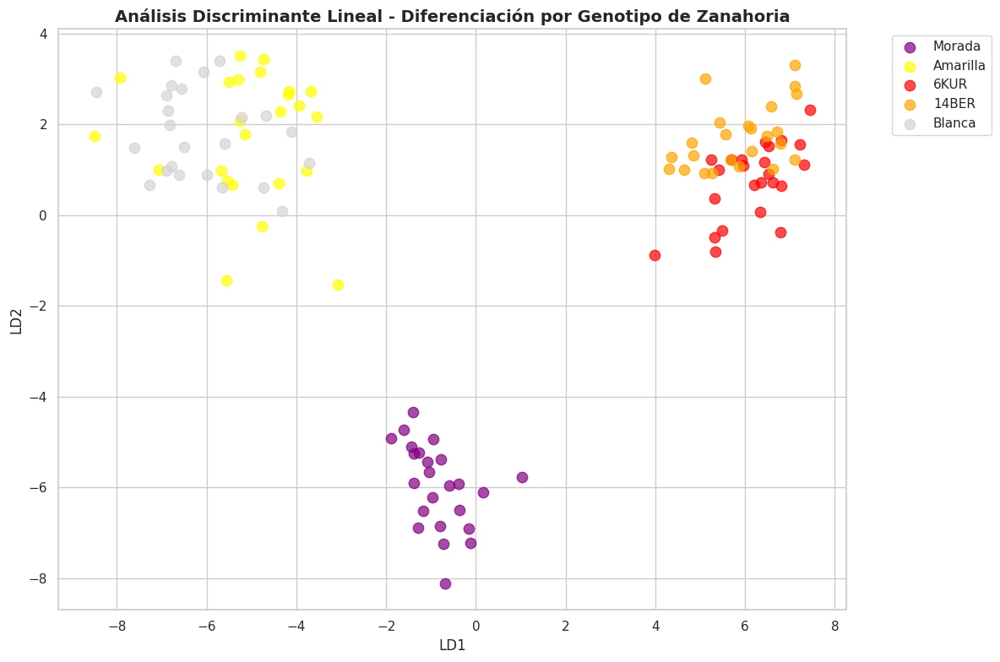


=== ANÁLISIS DE COMPONENTES PRINCIPALES (PCA) POR VARIEDAD ===


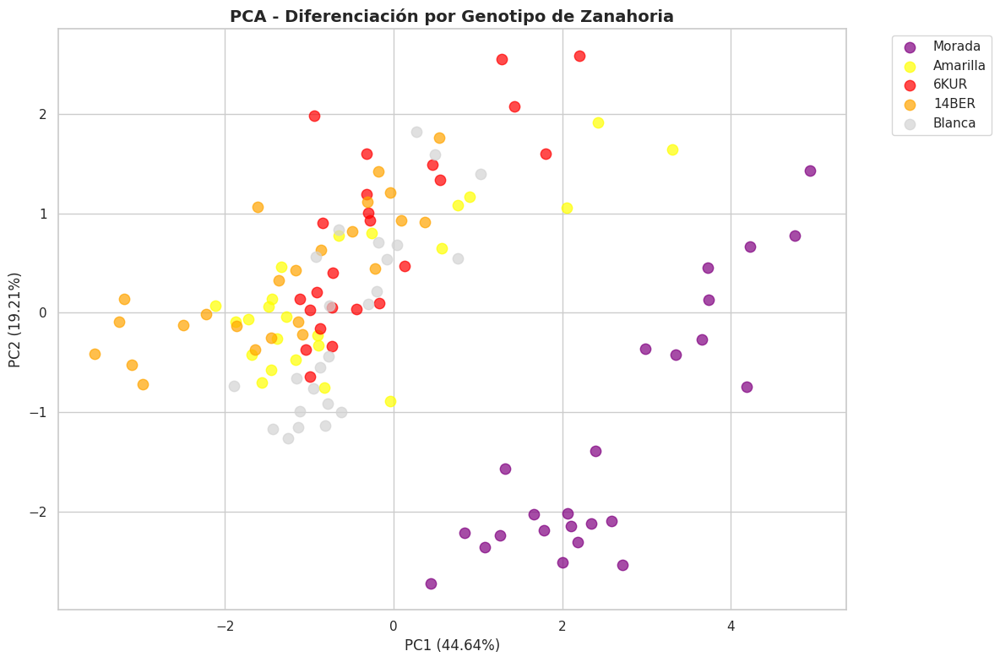


=== ANÁLISIS CLUSTER K-MEANS POR VARIEDAD ===


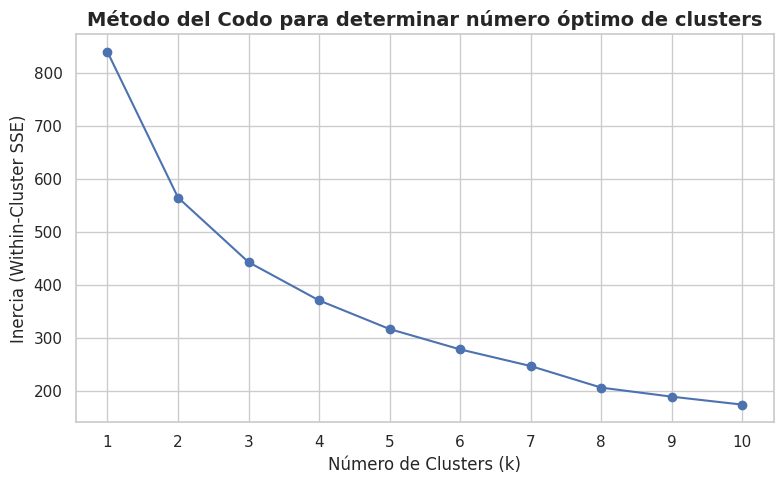

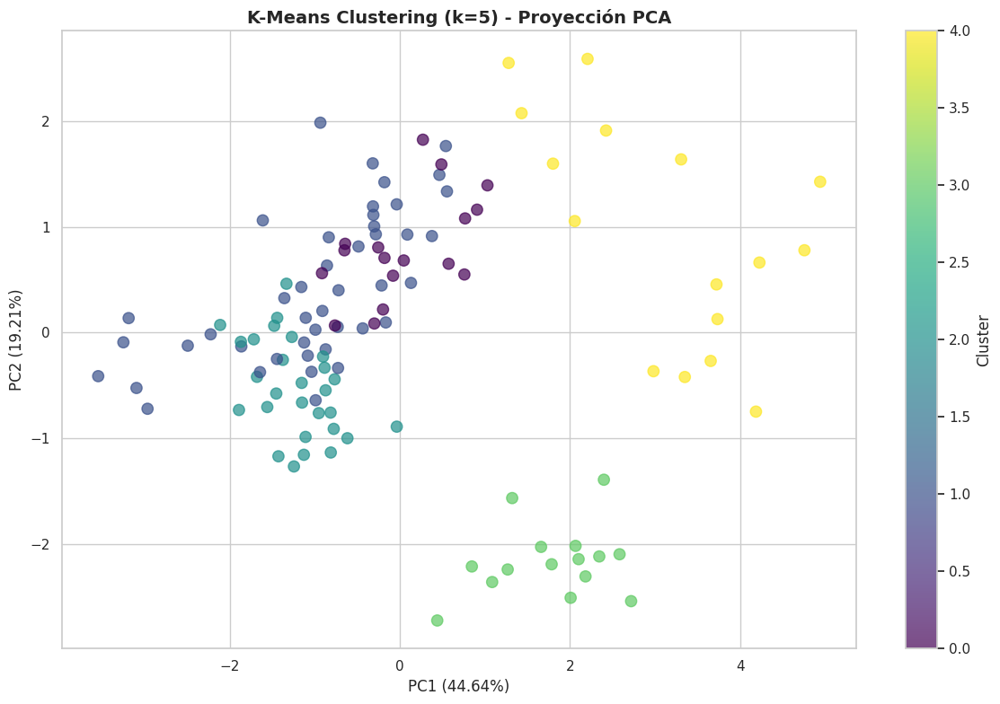


=== VISUALIZACIÓN PCA CON ELIPSES DE CONFIANZA POR VARIEDAD ===


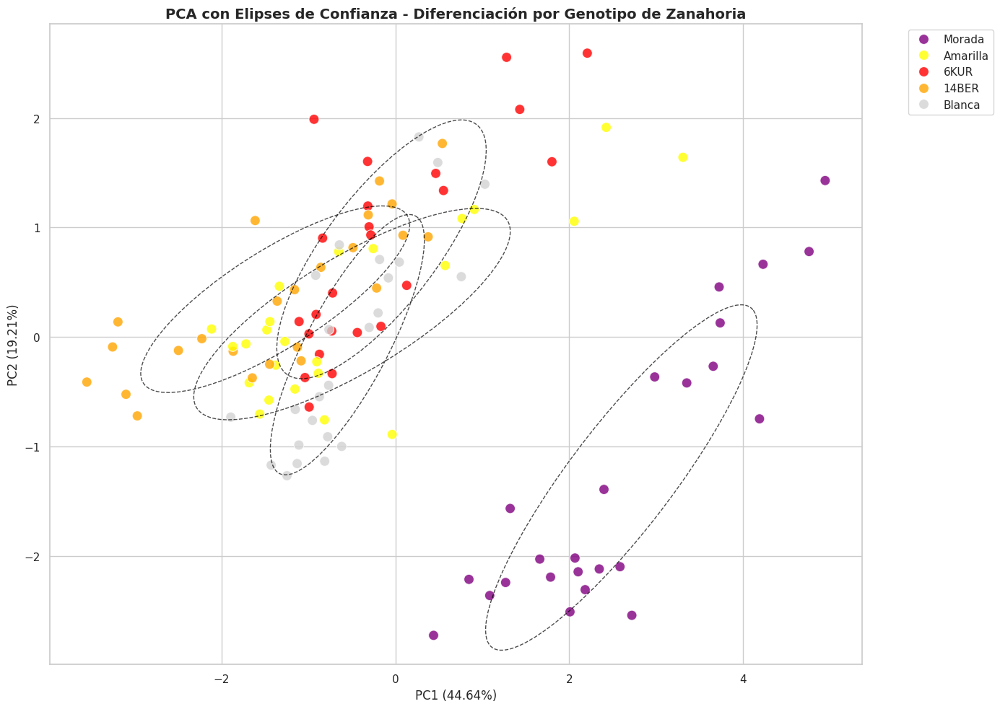


=== ANÁLISIS DE VARIANZA (ANOVA) POR PARÁMETRO Y VARIEDAD ===

ANOVA para L* por variedad:
F-statistic: 232.1673, p-value: 0.0000
Diferencias significativas encontradas. Realizando test de Tukey:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
 group1   group2  meandiff p-adj   lower    upper   reject
----------------------------------------------------------
   14BER     6KUR  -3.3104 0.0052  -5.9043  -0.7166   True
   14BER Amarilla   2.2367 0.1255  -0.3572   4.8305  False
   14BER   Blanca   8.0721    0.0   5.4782  10.6659   True
   14BER   Morada    -18.8    0.0 -21.3938 -16.2062   True
    6KUR Amarilla   5.5471    0.0   2.9532   8.1409   True
    6KUR   Blanca  11.3825    0.0   8.7887  13.9763   True
    6KUR   Morada -15.4896    0.0 -18.0834 -12.8957   True
Amarilla   Blanca   5.8354    0.0   3.2416   8.4293   True
Amarilla   Morada -21.0367    0.0 -23.6305 -18.4428   True
  Blanca   Morada -26.8721    0.0 -29.4659 -24.2782   True
------------------------------------

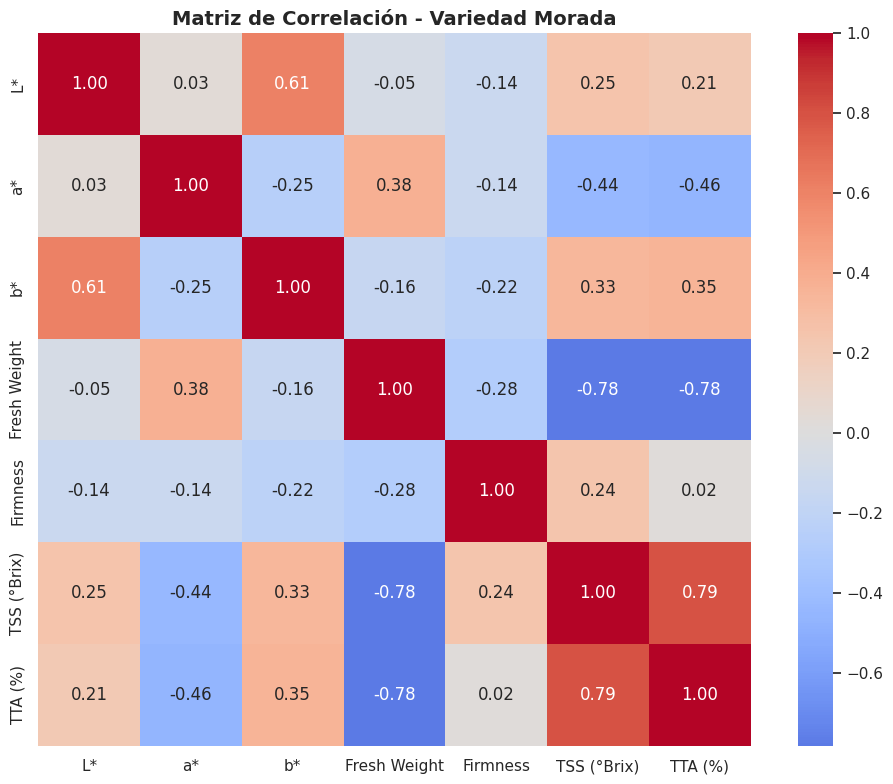

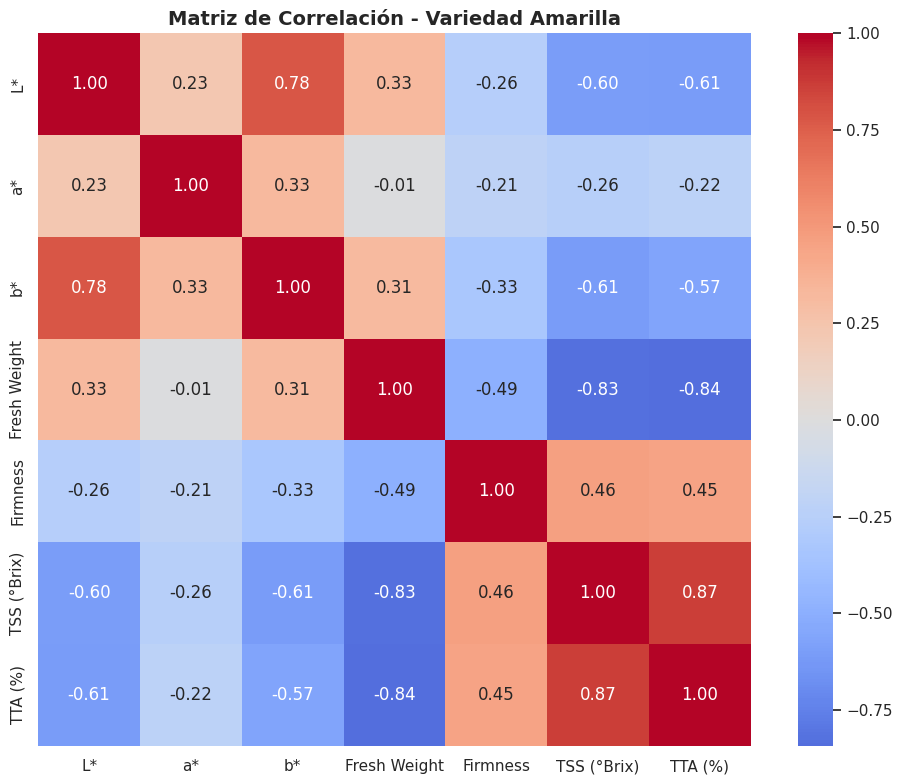

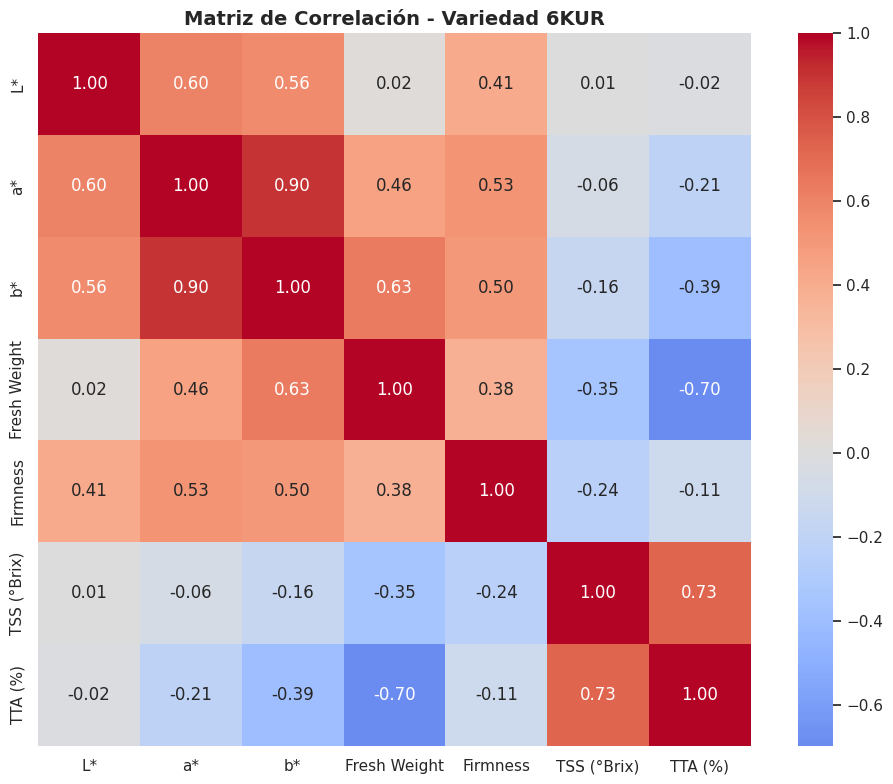

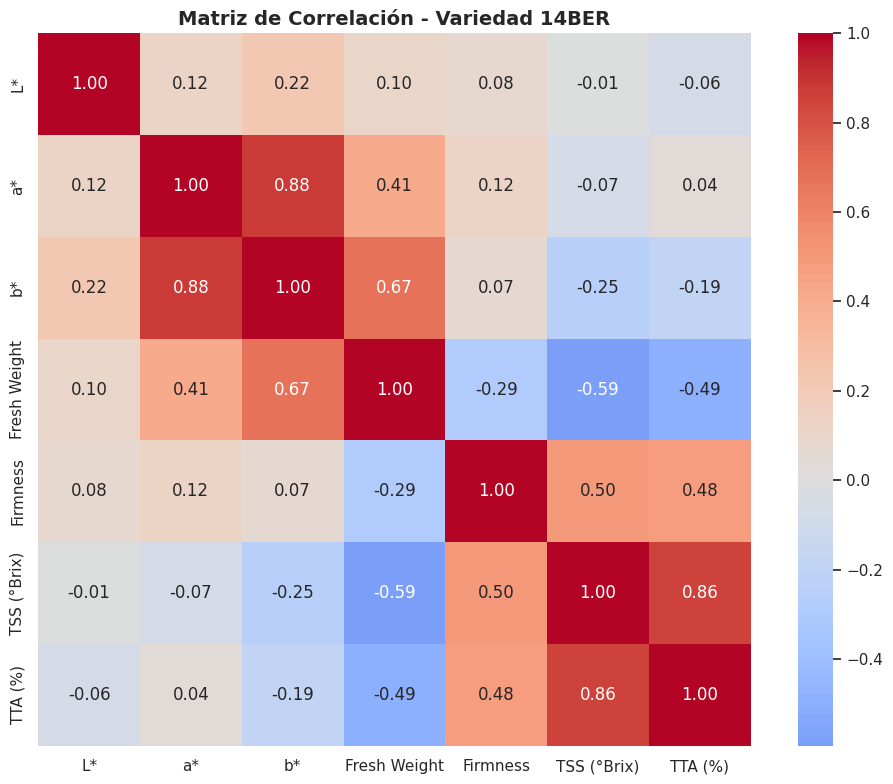

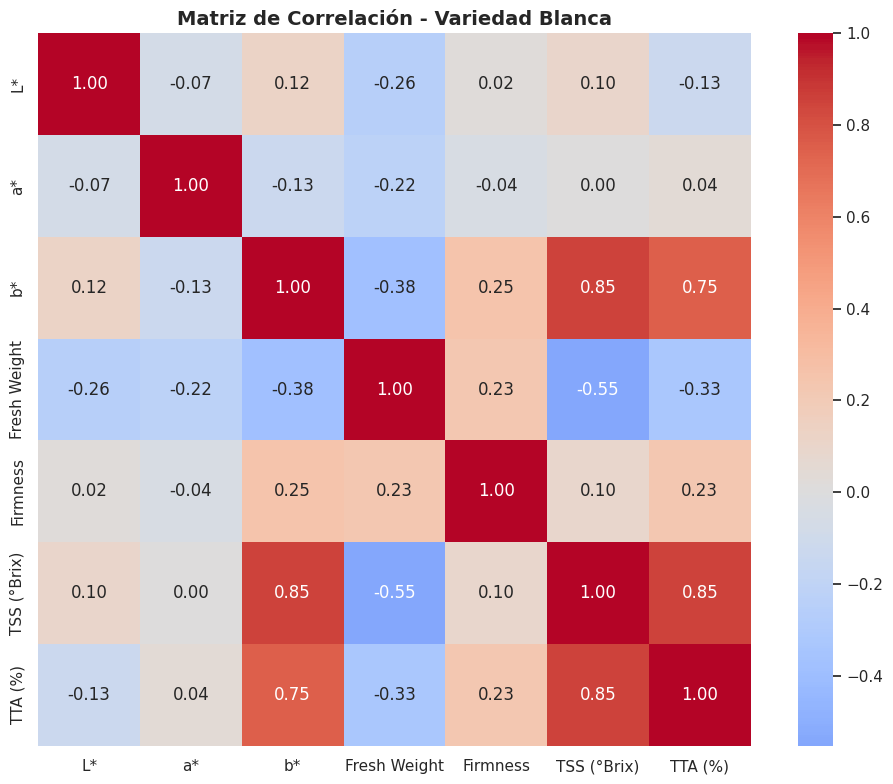


=== BOXPLOTS COMPARATIVOS POR VARIEDAD ===


/tmp/ipython-input-691210880.py:291: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Variedad', y=param,
/tmp/ipython-input-691210880.py:291: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Variedad', y=param,
/tmp/ipython-input-691210880.py:291: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Variedad', y=param,
/tmp/ipython-input-691210880.py:291: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to 

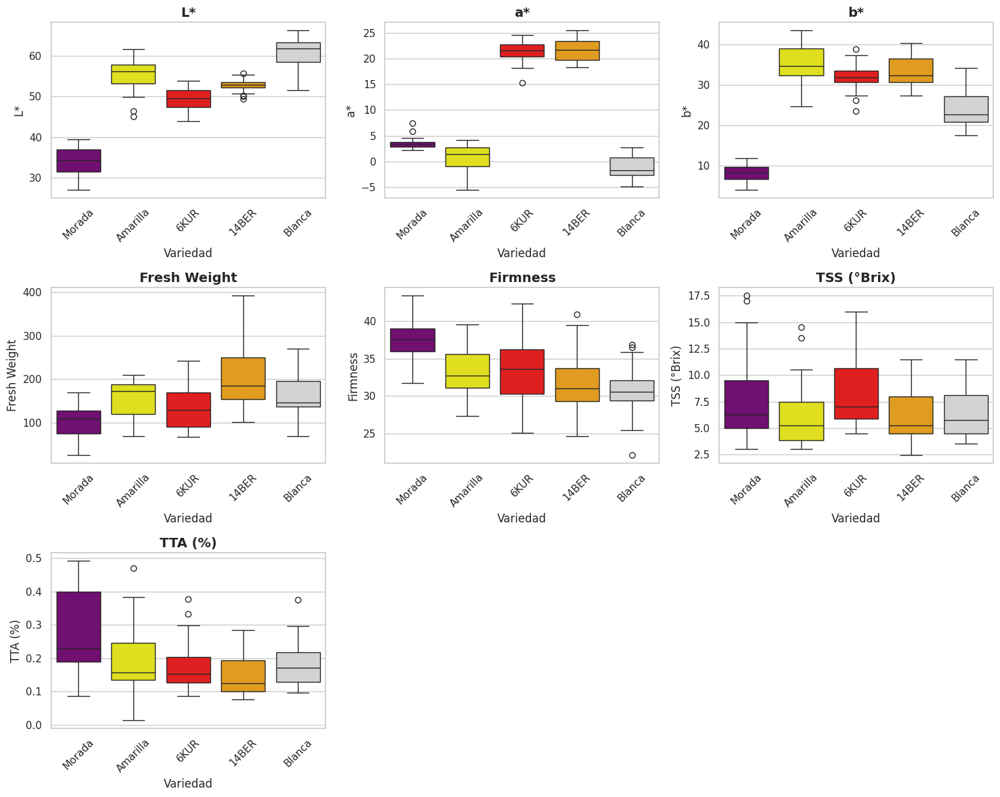


=== CARGAS DE LOS COMPONENTES PRINCIPALES ===
Variables con mayor peso en PC1:
TTA (%)         0.469270
Fresh Weight    0.444492
b*              0.404706
L*              0.392364
TSS (°Brix)     0.357134
Name: PC1, dtype: float64

Variables con mayor peso en PC2:
TSS (°Brix)    0.607521
b*             0.498394
L*             0.362952
TTA (%)        0.316377
a*             0.286818
Name: PC2, dtype: float64


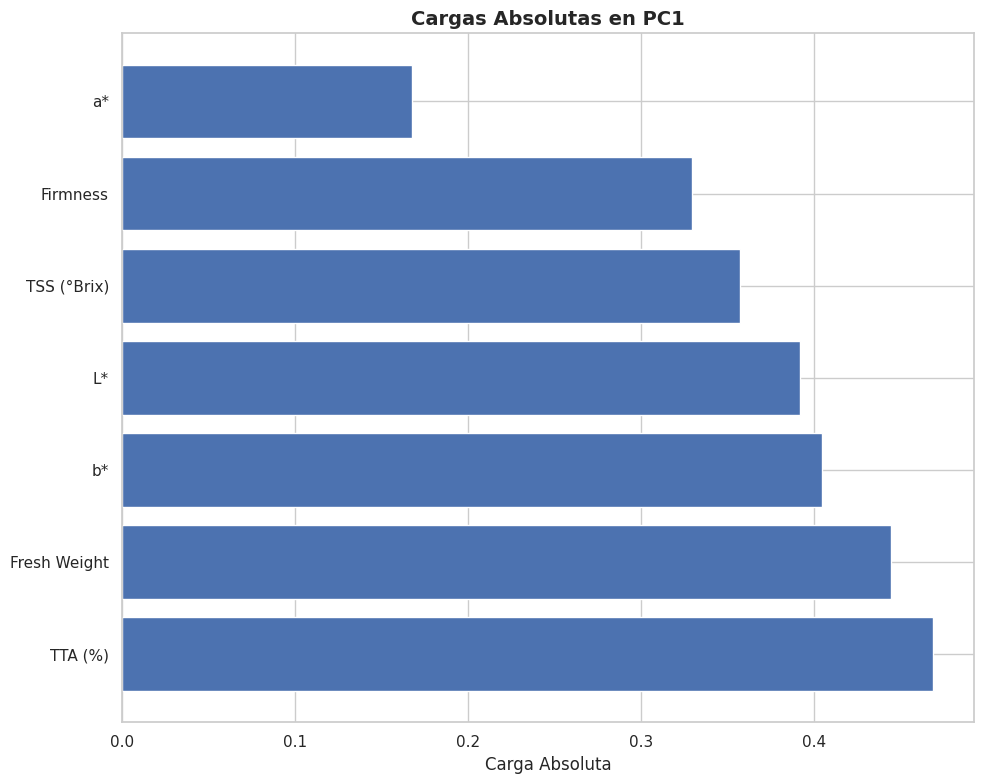

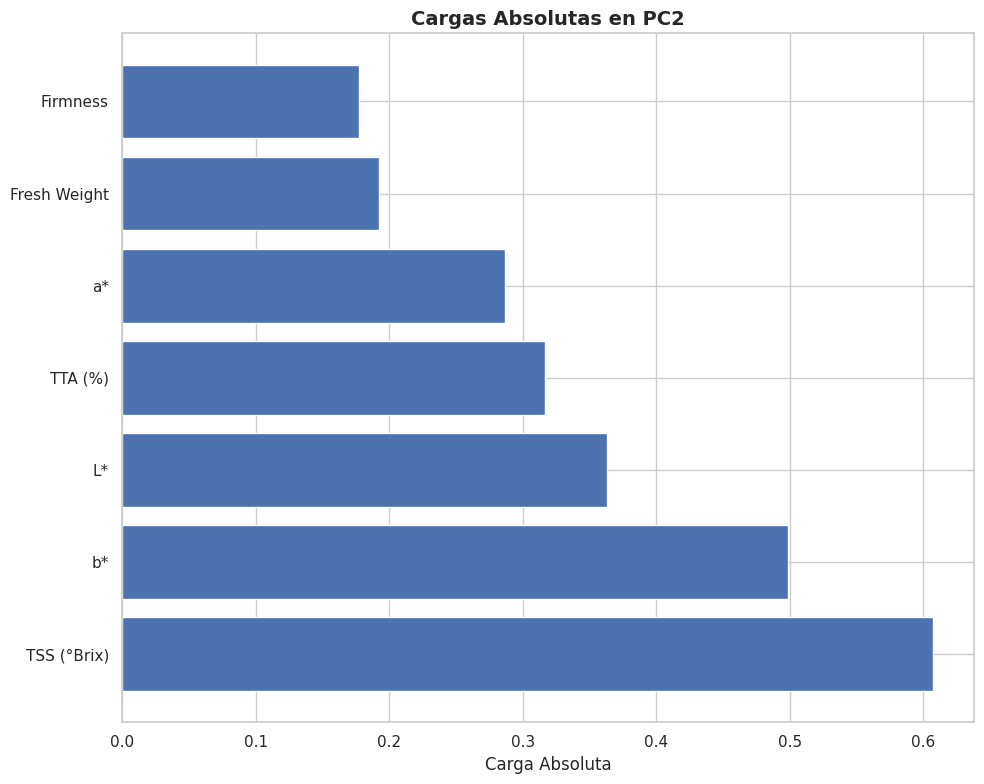


=== COEFICIENTES DE LA FUNCIÓN DISCRIMINANTE ===
Coeficientes de la función discriminante:
                 L*         a*         b*  Fresh Weight  Firmness  \
14BER     -0.071728  32.286143  -2.364981      0.542824 -1.311931   
6KUR      -4.636684  31.802278  -0.252762     -1.806983 -0.706312   
Amarilla   1.263663 -29.528427  12.175199     -0.794172  0.290763   
Blanca    14.198242 -28.743951  -2.329366      2.096997 -0.136188   
Morada   -10.753494  -5.816043  -7.228090     -0.038666  1.863668   

          TSS (°Brix)   TTA (%)  
14BER        1.127397  0.048696  
6KUR         2.271542 -2.211933  
Amarilla    -1.671370  0.251343  
Blanca      -0.761995  1.381657  
Morada      -0.965575  0.530236  


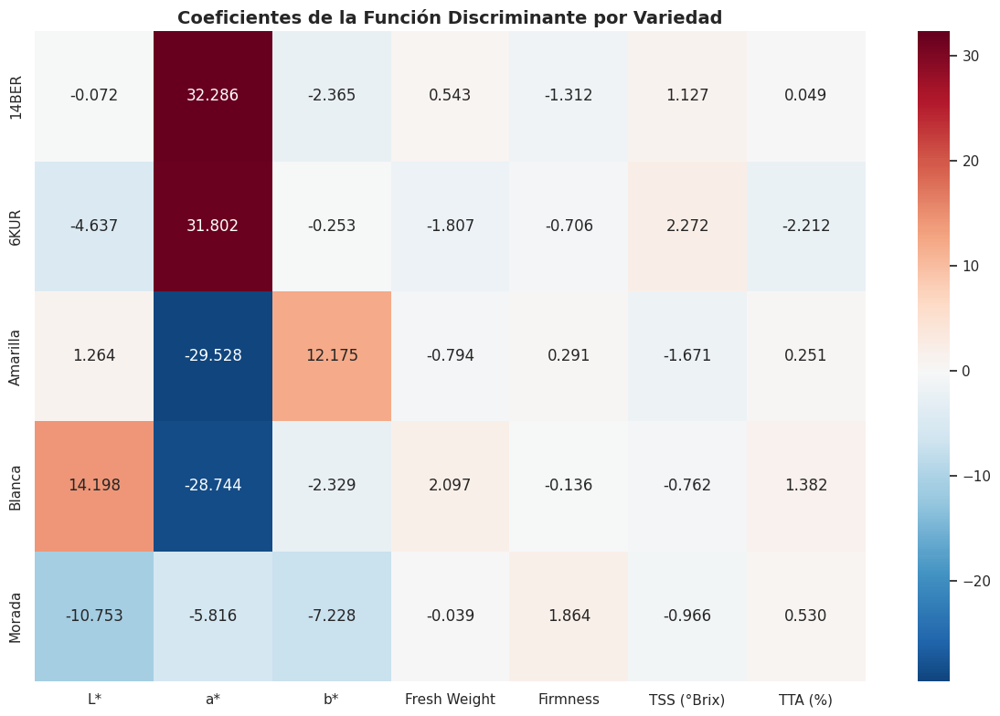


=== RESUMEN ESTADÍSTICO POR VARIEDAD ===
Medias por variedad para cada parámetro:
                 L*         a*         b*  Fresh Weight   Firmness  \
Variedad                                                             
14BER     52.785000  21.824583  33.301250    211.223750  31.712917   
6KUR      49.474583  21.210000  31.870833    135.236667  33.491250   
Amarilla  55.021667   0.823750  35.120000    155.588333  33.015417   
Blanca    60.857083  -1.184583  24.362083    164.860417  30.920833   
Morada    33.985000   3.532083   8.175833    101.347500  37.449583   

          TSS (°Brix)   TTA (%)  
Variedad                         
14BER        6.174583  0.151906  
6KUR         8.625000  0.175141  
Amarilla     6.312500  0.196474  
Blanca       6.500000  0.185679  
Morada       7.750000  0.277977  

Desviaciones estándar por variedad:
                L*        a*        b*  Fresh Weight  Firmness  TSS (°Brix)  \
Variedad                                                                

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from matplotlib.patches import Ellipse
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scipy.stats as stats

# Configuración de estilo
plt.style.use('default')
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.titleweight'] = 'bold'

# Paleta de colores para variedades
variety_palette = {
    "6KUR": "red",
    "14BER": "orange",
    "Amarilla": "yellow",
    "Blanca": "lightgray",
    "Morada": "purple"
}

# Traducción de parámetros
param_translation = {
    'L*': 'L*',
    'a*': 'a*',
    'b*': 'b*',
    'Peso_Fresco': 'Fresh Weight',
    'Firmeza': 'Firmness',
    'IC': 'IC',
    'SST_Corregido': 'TSS (°Brix)',
    'ATT': 'TTA (%)'
}

def load_carrot_data(file_path, week):
    """Cargar datos de zanahorias desde archivos Excel"""
    try:
        amb_data = pd.read_excel(file_path, sheet_name='Ambiente')
        refri_data = pd.read_excel(file_path, sheet_name='Refrigeración')

        amb_data['Week'] = week
        amb_data['Treatment'] = 'Ambiente'
        refri_data['Week'] = week
        refri_data['Treatment'] = 'Refrigeración'

        combined_data = pd.concat([amb_data, refri_data], ignore_index=True)
        combined_data.columns = combined_data.columns.str.strip()

        combined_data['Variedad'] = combined_data['Variedad'].str.strip()
        combined_data['Variedad'] = combined_data['Variedad'].replace({
            'YELLOW': 'Amarilla',
            'WHITE': 'Blanca',
            'PURPLE': 'Morada'
        })

        numeric_cols = ['L*', 'a*', 'b*', 'Diametro', 'Longitud', 'Peso_Fresco',
                       'Peso_fresco_kg', 'm', 'Respiración', 'ATAN', 'Hue',
                       'Croma', 'Firmeza', 'SST', 'SST_Corregido', 'NaOH',
                       'Acidez_Peso_Muestra', 'Factor_D', 'ATT']

        for col in numeric_cols:
            if col in combined_data.columns:
                combined_data[col] = pd.to_numeric(combined_data[col], errors='coerce')

        # Renombrar columnas a inglés
        combined_data = combined_data.rename(columns=param_translation)

        return combined_data
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return pd.DataFrame()

# Cargar datos
files_weeks = [
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/7 10.xlsx", 1),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 15 10 24  Colab_CadenaF_TAmb.xlsx", 2),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 21 10 024.xlsx", 3),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/ Muestreo 28 10 024.xlsx", 4)
]

all_data = []
for file_path, week in files_weeks:
    data = load_carrot_data(file_path, week)
    if not data.empty:
        all_data.append(data)

data = pd.concat(all_data, ignore_index=True)
data = data.dropna(how='all')
data['Variedad'] = data['Variedad'].str.strip()

# Seleccionar variables numéricas para análisis
numeric_params = ['L*', 'a*', 'b*', 'Fresh Weight',
                 'Firmness', 'TSS (°Brix)', 'TTA (%)']

# Filtrar datos completos (solo por variedad, sin tratamiento)
analysis_data = data[['Variedad'] + numeric_params].dropna()

print("Datos cargados para análisis multivariado por genotipo:")
print(f"Muestras totales: {len(analysis_data)}")
print(f"Variedades únicas: {analysis_data['Variedad'].nunique()}")
print(analysis_data['Variedad'].value_counts())

# 1. ANÁLISIS DISCRIMINANTE LINEAL (LDA) POR VARIEDAD
print("\n=== ANÁLISIS DISCRIMINANTE LINEAL (LDA) POR VARIEDAD ===")

# Preparar datos para LDA
X = analysis_data[numeric_params]
y = analysis_data['Variedad']

# Escalado
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# LDA con 2 componentes
lda = LinearDiscriminantAnalysis(n_components=2)
X_lda = lda.fit_transform(X_scaled, y)

# Visualización LDA
plt.figure(figsize=(12, 8))
for variedad in analysis_data['Variedad'].unique():
    mask = analysis_data['Variedad'] == variedad
    plt.scatter(X_lda[mask, 0], X_lda[mask, 1],
                label=variedad, s=80, alpha=0.7, c=variety_palette.get(variedad, 'gray'))

plt.title('Análisis Discriminante Lineal - Diferenciación por Genotipo de Zanahoria')
plt.xlabel('LD1')
plt.ylabel('LD2')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

# 2. ANÁLISIS DE COMPONENTES PRINCIPALES (PCA) POR VARIEDAD
print("\n=== ANÁLISIS DE COMPONENTES PRINCIPALES (PCA) POR VARIEDAD ===")

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Crear DataFrame para visualización
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['Variedad'] = analysis_data['Variedad'].values

# Visualización PCA
plt.figure(figsize=(12, 8))
for variedad in pca_df['Variedad'].unique():
    mask = pca_df['Variedad'] == variedad
    plt.scatter(pca_df.loc[mask, 'PC1'], pca_df.loc[mask, 'PC2'],
                label=variedad, s=80, alpha=0.7, c=variety_palette.get(variedad, 'gray'))

plt.title('PCA - Diferenciación por Genotipo de Zanahoria')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

# 3. ANÁLISIS CLUSTER K-MEANS POR VARIEDAD
print("\n=== ANÁLISIS CLUSTER K-MEANS POR VARIEDAD ===")

# Método del codo para determinar número óptimo de clusters
inertias = []
k_range = range(1, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)

# Graficar el método del codo
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertias, marker='o')
plt.title("Método del Codo para determinar número óptimo de clusters")
plt.xlabel("Número de Clusters (k)")
plt.ylabel("Inercia (Within-Cluster SSE)")
plt.xticks(k_range)
plt.grid(True)
plt.tight_layout()
plt.show()

# Aplicar KMeans con número óptimo de clusters
optimal_k = analysis_data['Variedad'].nunique()  # Usar el número de variedades como clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Visualizar clusters
plt.figure(figsize=(12, 8))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='viridis', s=80, alpha=0.7)
plt.colorbar(scatter, label='Cluster')
plt.title(f'K-Means Clustering (k={optimal_k}) - Proyección PCA')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.grid(True)
plt.tight_layout()
plt.show()

# 4. VISUALIZACIÓN ELABORADA PCA CON ELIPSES POR VARIEDAD
print("\n=== VISUALIZACIÓN PCA CON ELIPSES DE CONFIANZA POR VARIEDAD ===")

plt.figure(figsize=(14, 10))

# Scatterplot PCA
scatter = sns.scatterplot(
    data=pca_df,
    x='PC1', y='PC2',
    hue='Variedad',
    palette=variety_palette,
    s=100,
    alpha=0.8
)

# Elipses de confianza para cada variedad
for variedad in pca_df['Variedad'].unique():
    subset = pca_df[pca_df['Variedad'] == variedad]
    if len(subset) >= 2:
        cov = np.cov(subset[['PC1', 'PC2']].values.T)
        lambda_, v = np.linalg.eig(cov)
        lambda_ = np.sqrt(lambda_)
        angle = np.rad2deg(np.arccos(v[0, 0]))
        ellipse = Ellipse(
            xy=subset[['PC1', 'PC2']].mean().values,
            width=lambda_[0] * 2.5,
            height=lambda_[1] * 2.5,
            angle=angle,
            edgecolor='black',
            facecolor='none',
            linestyle='--',
            alpha=0.7
        )
        plt.gca().add_patch(ellipse)

plt.title('PCA con Elipses de Confianza - Diferenciación por Genotipo de Zanahoria')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

# 5. ANÁLISIS DE VARIANZA (ANOVA) PARA CADA PARÁMETRO POR VARIEDAD
print("\n=== ANÁLISIS DE VARIANZA (ANOVA) POR PARÁMETRO Y VARIEDAD ===")

for param in numeric_params:
    print(f"\nANOVA para {param} por variedad:")
    groups = [analysis_data[analysis_data['Variedad'] == variedad][param].values
              for variedad in analysis_data['Variedad'].unique()]

    # ANOVA
    f_stat, p_value = stats.f_oneway(*groups)
    print(f"F-statistic: {f_stat:.4f}, p-value: {p_value:.4f}")

    # Test de Tukey si ANOVA es significativo
    if p_value < 0.05:
        print("Diferencias significativas encontradas. Realizando test de Tukey:")
        tukey = pairwise_tukeyhsd(analysis_data[param], analysis_data['Variedad'], alpha=0.05)
        print(tukey)
    else:
        print("No se encontraron diferencias significativas entre variedades")

# 6. MATRIZ DE CORRELACIÓN POR VARIEDAD
print("\n=== MATRICES DE CORRELACIÓN POR VARIEDAD ===")

# Calcular y visualizar matrices de correlación para cada variedad
for variedad in analysis_data['Variedad'].unique():
    variedad_data = analysis_data[analysis_data['Variedad'] == variedad][numeric_params]
    corr_matrix = variedad_data.corr()

    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0,
                square=True, fmt='.2f')
    plt.title(f'Matriz de Correlación - Variedad {variedad}')
    plt.tight_layout()
    plt.show()

# 7. BOXPLOTS COMPARATIVOS POR VARIEDAD
print("\n=== BOXPLOTS COMPARATIVOS POR VARIEDAD ===")

fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

for i, param in enumerate(numeric_params):
    if i < len(axes):
        sns.boxplot(data=analysis_data, x='Variedad', y=param,
                   ax=axes[i], palette=variety_palette)
        axes[i].set_title(param)
        axes[i].tick_params(axis='x', rotation=45)

# Eliminar ejes vacíos si los hay
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# 8. CARGAS DE LOS COMPONENTES PRINCIPALES
print("\n=== CARGAS DE LOS COMPONENTES PRINCIPALES ===")

# Obtener las cargas de los componentes
loadings = pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2'],
    index=numeric_params
)

# Ordenar por peso absoluto en cada componente
loadings_PC1 = loadings['PC1'].abs().sort_values(ascending=False)
loadings_PC2 = loadings['PC2'].abs().sort_values(ascending=False)

print("Variables con mayor peso en PC1:")
print(loadings_PC1.head())

print("\nVariables con mayor peso en PC2:")
print(loadings_PC2.head())

# Visualizar cargas
plt.figure(figsize=(10, 8))
plt.barh(range(len(loadings_PC1)), loadings_PC1.values)
plt.yticks(range(len(loadings_PC1)), loadings_PC1.index)
plt.title('Cargas Absolutas en PC1')
plt.xlabel('Carga Absoluta')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 8))
plt.barh(range(len(loadings_PC2)), loadings_PC2.values)
plt.yticks(range(len(loadings_PC2)), loadings_PC2.index)
plt.title('Cargas Absolutas en PC2')
plt.xlabel('Carga Absoluta')
plt.tight_layout()
plt.show()

# 9. COEFICIENTES DE LA FUNCIÓN DISCRIMINANTE
print("\n=== COEFICIENTES DE LA FUNCIÓN DISCRIMINANTE ===")

lda_coef = pd.DataFrame(lda.coef_,
                       columns=numeric_params,
                       index=lda.classes_)
print("Coeficientes de la función discriminante:")
print(lda_coef)

# Visualizar coeficientes discriminantes
plt.figure(figsize=(12, 8))
sns.heatmap(lda_coef, annot=True, cmap='RdBu_r', center=0, fmt='.3f')
plt.title('Coeficientes de la Función Discriminante por Variedad')
plt.tight_layout()
plt.show()

# 10. RESULTADOS ESTADÍSTICOS RESUMEN
print("\n=== RESUMEN ESTADÍSTICO POR VARIEDAD ===")

# Medias por variedad
print("Medias por variedad para cada parámetro:")
summary_stats = analysis_data.groupby('Variedad')[numeric_params].mean()
print(summary_stats)

# Desviaciones estándar por variedad
print("\nDesviaciones estándar por variedad:")
std_stats = analysis_data.groupby('Variedad')[numeric_params].std()
print(std_stats)

# Coeficientes de variación por variedad
print("\nCoeficientes de variación por variedad:")
cv_stats = (analysis_data.groupby('Variedad')[numeric_params].std() /
           analysis_data.groupby('Variedad')[numeric_params].mean()) * 100
print(cv_stats)

print("\nAnálisis multivariado por genotipo completado.")

Datos cargados para análisis multivariado por tratamiento y genotipo:
Muestras totales: 120
Tratamientos únicos: 2
Variedades únicas: 5
Combinaciones únicas: 10

Distribución por tratamiento:
Treatment
Ambiente         60
Refrigeración    60
Name: count, dtype: int64

Distribución por variedad:
Variedad
Morada      24
Amarilla    24
6KUR        24
14BER       24
Blanca      24
Name: count, dtype: int64

Distribución por combinación:
Treatment_Variety
Ambiente_Morada           12
Ambiente_Amarilla         12
Ambiente_6KUR             12
Ambiente_14BER            12
Ambiente_Blanca           12
Refrigeración_Morada      12
Refrigeración_Amarilla    12
Refrigeración_6KUR        12
Refrigeración_14BER       12
Refrigeración_Blanca      12
Name: count, dtype: int64

=== ANÁLISIS DE COMPONENTES PRINCIPALES (PCA) POR TRATAMIENTO Y VARIEDAD ===


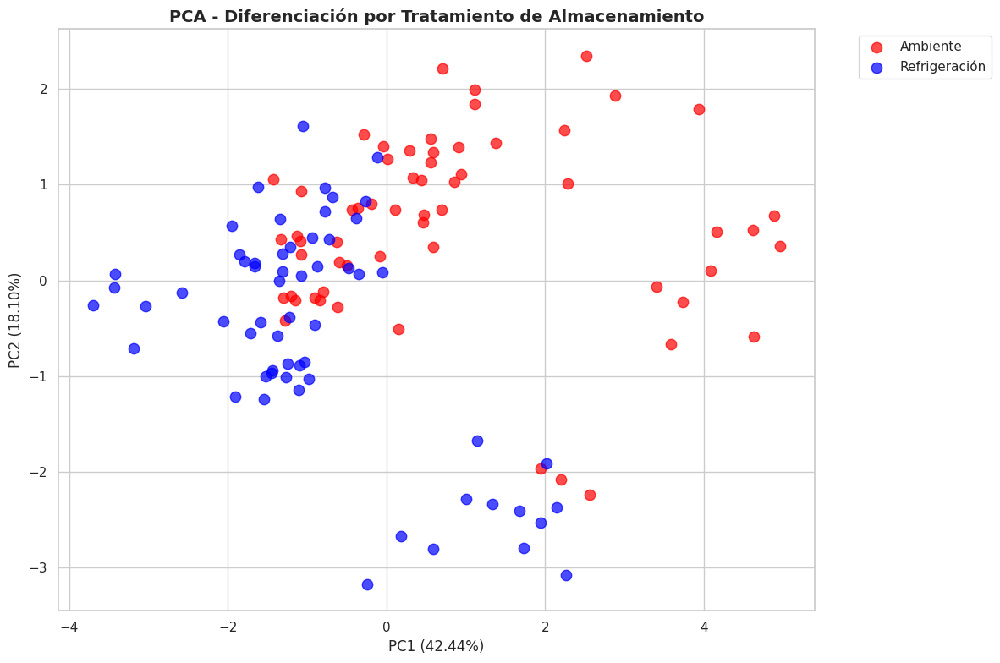

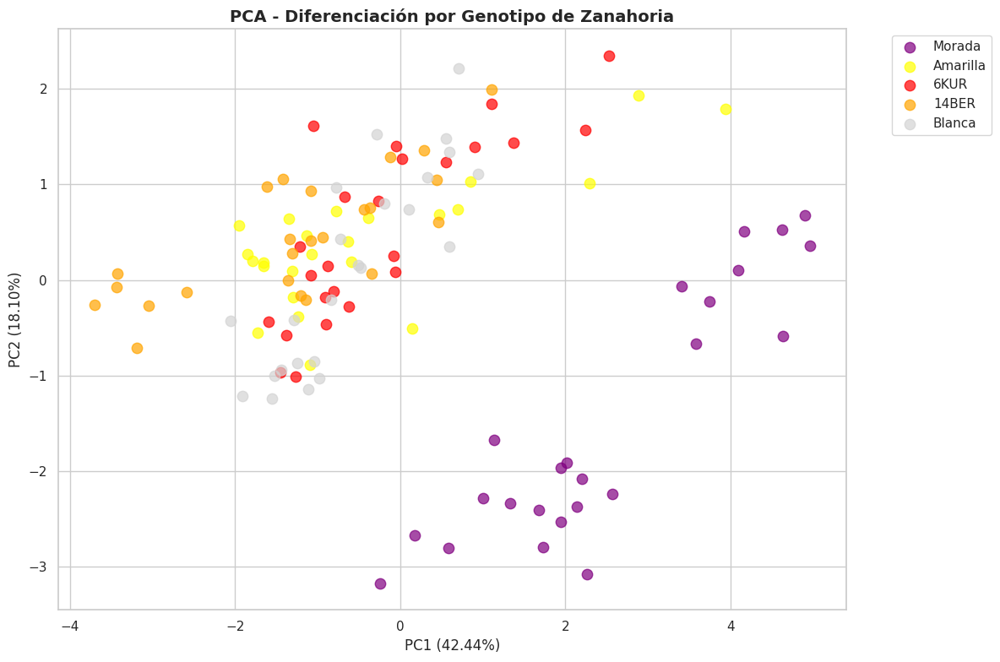

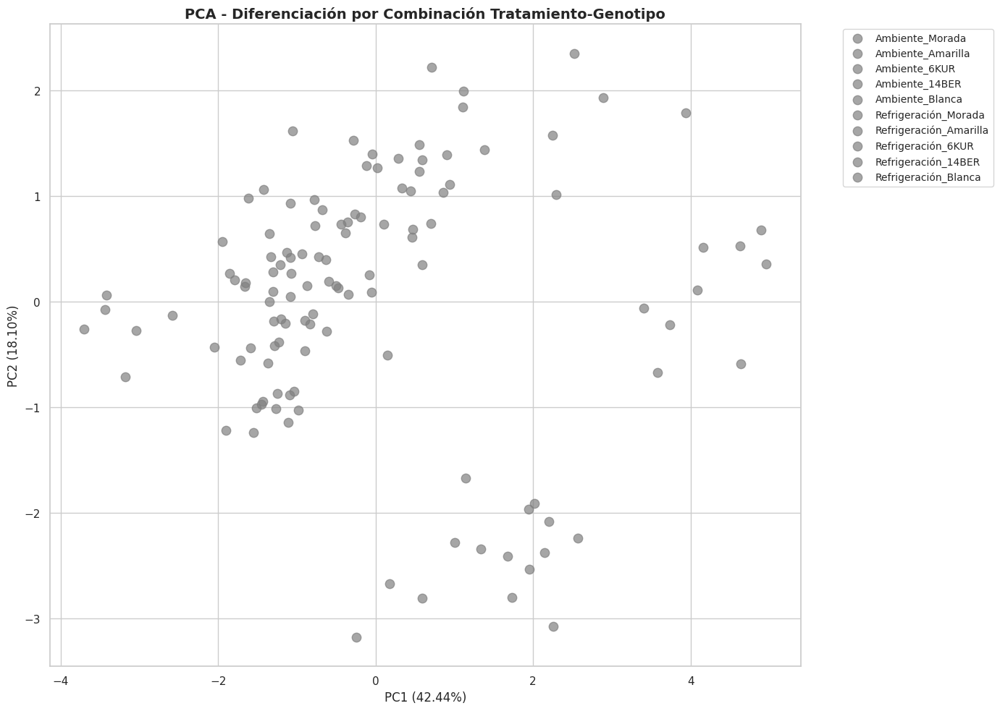


=== ANÁLISIS DISCRIMINANTE LINEAL POR VARIEDAD EN CADA TRATAMIENTO ===

--- LDA para tratamiento: Ambiente ---


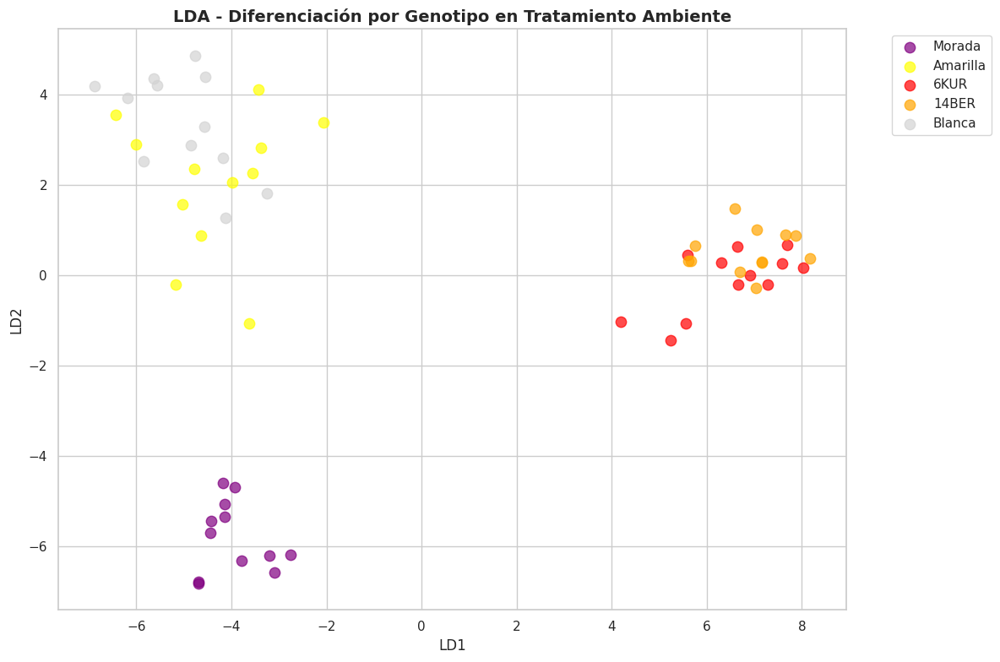


--- LDA para tratamiento: Refrigeración ---


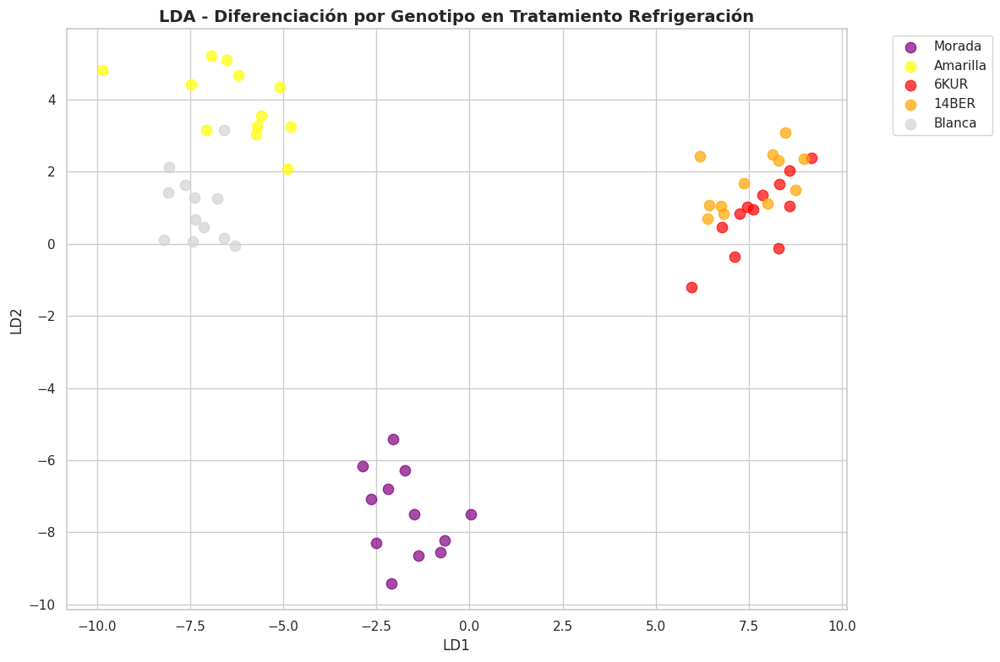


=== ANÁLISIS CLUSTER K-MEANS POR TRATAMIENTO Y VARIEDAD ===


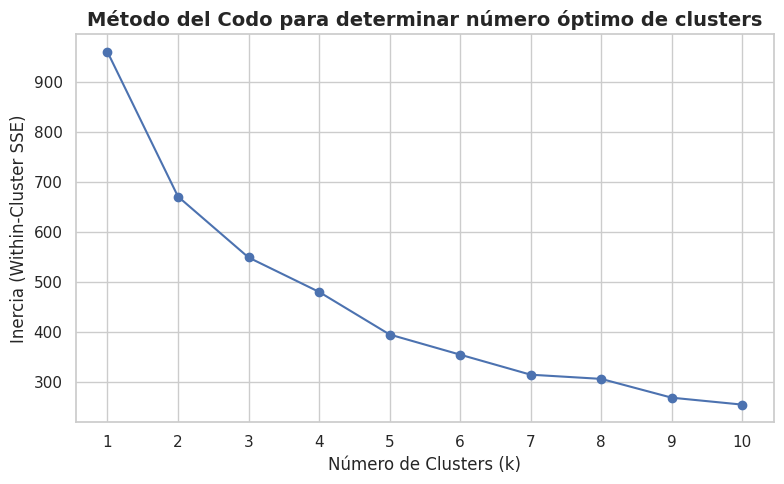

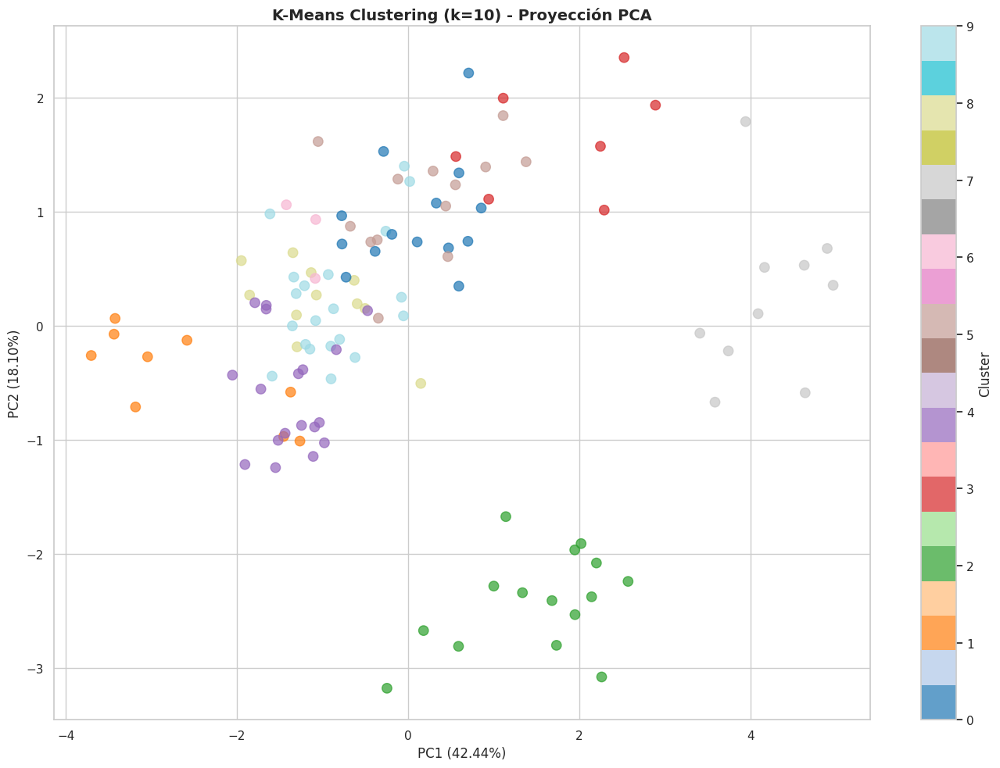


=== ANÁLISIS DE VARIANZA (ANOVA) POR PARÁMETRO ===

ANOVA para L*:


AttributeError: module 'scipy.stats' has no attribute 'ols'

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from matplotlib.patches import Ellipse
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import scipy.stats as stats

# Configuración de estilo
plt.style.use('default')
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.titleweight'] = 'bold'

# Paletas de colores
treatment_palette = {
    "Ambiente": "red",
    "Refrigeración": "blue"
}

variety_palette = {
    "6KUR": "red",
    "14BER": "orange",
    "Amarilla": "yellow",
    "Blanca": "lightgray",
    "Morada": "purple"
}

# Combinación tratamiento + variedad
combined_palette = {
    "6KUR_Ambiente": "darkred",
    "6KUR_Refrigeración": "lightcoral",
    "14BER_Ambiente": "darkorange",
    "14BER_Refrigeración": "navajowhite",
    "Amarilla_Ambiente": "goldenrod",
    "Amarilla_Refrigeración": "lightyellow",
    "Blanca_Ambiente": "dimgray",
    "Blanca_Refrigeración": "lightgray",
    "Morada_Ambiente": "indigo",
    "Morada_Refrigeración": "mediumpurple"
}

# Traducción de parámetros
param_translation = {
    'L*': 'L*',
    'a*': 'a*',
    'b*': 'b*',
    'Peso_Fresco': 'Fresh Weight',
    'Firmeza': 'Firmness',
    'Respiración': 'rCO₂ (mg kg⁻¹ h⁻¹)',
    'IC': 'IC',
    'SST_Corregido': 'TSS (°Brix)',
    'ATT': 'TTA (%)'
}

def load_carrot_data(file_path, week):
    """Cargar datos de zanahorias desde archivos Excel"""
    try:
        amb_data = pd.read_excel(file_path, sheet_name='Ambiente')
        refri_data = pd.read_excel(file_path, sheet_name='Refrigeración')

        amb_data['Week'] = week
        amb_data['Treatment'] = 'Ambiente'
        refri_data['Week'] = week
        refri_data['Treatment'] = 'Refrigeración'

        combined_data = pd.concat([amb_data, refri_data], ignore_index=True)
        combined_data.columns = combined_data.columns.str.strip()

        combined_data['Variedad'] = combined_data['Variedad'].str.strip()
        combined_data['Variedad'] = combined_data['Variedad'].replace({
            'YELLOW': 'Amarilla',
            'WHITE': 'Blanca',
            'PURPLE': 'Morada'
        })

        numeric_cols = ['L*', 'a*', 'b*', 'Diametro', 'Longitud', 'Peso_Fresco',
                       'Peso_fresco_kg', 'm', 'Respiración', 'ATAN', 'Hue',
                       'Croma', 'Firmeza', 'SST', 'SST_Corregido', 'NaOH',
                       'Acidez_Peso_Muestra', 'Factor_D', 'ATT']

        for col in numeric_cols:
            if col in combined_data.columns:
                combined_data[col] = pd.to_numeric(combined_data[col], errors='coerce')

        # Renombrar columnas a inglés
        combined_data = combined_data.rename(columns=param_translation)

        return combined_data
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return pd.DataFrame()

# Cargar datos
files_weeks = [
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/7 10.xlsx", 1),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 15 10 24  Colab_CadenaF_TAmb.xlsx", 2),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 21 10 024.xlsx", 3),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/ Muestreo 28 10 024.xlsx", 4)
]

all_data = []
for file_path, week in files_weeks:
    data = load_carrot_data(file_path, week)
    if not data.empty:
        all_data.append(data)

data = pd.concat(all_data, ignore_index=True)
data = data.dropna(how='all')
data['Variedad'] = data['Variedad'].str.strip()

# Crear columna combinada de tratamiento y variedad
data['Treatment_Variety'] = data['Treatment'] + '_' + data['Variedad']

# Seleccionar variables numéricas para análisis
numeric_params = ['L*', 'a*', 'b*', 'Fresh Weight', 'rCO₂ (mg kg⁻¹ h⁻¹)',
                 'Firmness', 'TSS (°Brix)', 'TTA (%)']

# Filtrar datos completos
analysis_data = data[['Treatment', 'Variedad', 'Treatment_Variety'] + numeric_params].dropna()

print("Datos cargados para análisis multivariado por tratamiento y genotipo:")
print(f"Muestras totales: {len(analysis_data)}")
print(f"Tratamientos únicos: {analysis_data['Treatment'].nunique()}")
print(f"Variedades únicas: {analysis_data['Variedad'].nunique()}")
print(f"Combinaciones únicas: {analysis_data['Treatment_Variety'].nunique()}")
print("\nDistribución por tratamiento:")
print(analysis_data['Treatment'].value_counts())
print("\nDistribución por variedad:")
print(analysis_data['Variedad'].value_counts())
print("\nDistribución por combinación:")
print(analysis_data['Treatment_Variety'].value_counts())

# 1. ANÁLISIS DE COMPONENTES PRINCIPALES (PCA) POR TRATAMIENTO Y VARIEDAD
print("\n=== ANÁLISIS DE COMPONENTES PRINCIPALES (PCA) POR TRATAMIENTO Y VARIEDAD ===")

# Preparar datos para PCA
X = analysis_data[numeric_params]
y_combined = analysis_data['Treatment_Variety']

# Escalado
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# PCA con 2 componentes
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Crear DataFrame para visualización
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['Treatment'] = analysis_data['Treatment'].values
pca_df['Variedad'] = analysis_data['Variedad'].values
pca_df['Treatment_Variety'] = analysis_data['Treatment_Variety'].values

# Visualización PCA - Por tratamiento
plt.figure(figsize=(12, 8))
for treatment in pca_df['Treatment'].unique():
    mask = pca_df['Treatment'] == treatment
    plt.scatter(pca_df.loc[mask, 'PC1'], pca_df.loc[mask, 'PC2'],
                label=treatment, s=80, alpha=0.7, c=treatment_palette.get(treatment, 'gray'))

plt.title('PCA - Diferenciación por Tratamiento de Almacenamiento')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

# Visualización PCA - Por variedad
plt.figure(figsize=(12, 8))
for variedad in pca_df['Variedad'].unique():
    mask = pca_df['Variedad'] == variedad
    plt.scatter(pca_df.loc[mask, 'PC1'], pca_df.loc[mask, 'PC2'],
                label=variedad, s=80, alpha=0.7, c=variety_palette.get(variedad, 'gray'))

plt.title('PCA - Diferenciación por Genotipo de Zanahoria')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

# Visualización PCA - Por combinación tratamiento-variedad
plt.figure(figsize=(14, 10))
for combination in pca_df['Treatment_Variety'].unique():
    mask = pca_df['Treatment_Variety'] == combination
    plt.scatter(pca_df.loc[mask, 'PC1'], pca_df.loc[mask, 'PC2'],
                label=combination, s=80, alpha=0.7, c=combined_palette.get(combination, 'gray'))

plt.title('PCA - Diferenciación por Combinación Tratamiento-Genotipo')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True)
plt.tight_layout()
plt.show()

# 2. ANÁLISIS DISCRIMINANTE LINEAL (LDA) POR VARIEDAD (dentro de cada tratamiento)
print("\n=== ANÁLISIS DISCRIMINANTE LINEAL POR VARIEDAD EN CADA TRATAMIENTO ===")

for treatment in analysis_data['Treatment'].unique():
    print(f"\n--- LDA para tratamiento: {treatment} ---")
    treatment_data = analysis_data[analysis_data['Treatment'] == treatment]

    if len(treatment_data['Variedad'].unique()) > 1:  # Solo si hay múltiples variedades
        X_treatment = treatment_data[numeric_params]
        y_variety = treatment_data['Variedad']

        # Escalado
        X_treatment_scaled = scaler.fit_transform(X_treatment)

        # LDA con componentes adecuados
        n_components = min(len(numeric_params), len(y_variety.unique()) - 1)
        if n_components > 0:
            lda = LinearDiscriminantAnalysis(n_components=n_components)
            X_lda = lda.fit_transform(X_treatment_scaled, y_variety)

            # Visualización LDA
            plt.figure(figsize=(12, 8))
            for variedad in y_variety.unique():
                mask = y_variety == variedad
                if n_components == 1:
                    plt.scatter(X_lda[mask], np.zeros_like(X_lda[mask]),
                               label=variedad, s=80, alpha=0.7, c=variety_palette.get(variedad, 'gray'))
                    plt.ylabel('Arbitrary Axis')
                else:
                    plt.scatter(X_lda[mask, 0], X_lda[mask, 1],
                               label=variedad, s=80, alpha=0.7, c=variety_palette.get(variedad, 'gray'))

            plt.title(f'LDA - Diferenciación por Genotipo en Tratamiento {treatment}')
            plt.xlabel('LD1')
            if n_components > 1:
                plt.ylabel('LD2')
            plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
            plt.grid(True)
            plt.tight_layout()
            plt.show()
        else:
            print(f"No se puede realizar LDA para {treatment} - solo una variedad presente")

# 3. ANÁLISIS CLUSTER K-MEANS
print("\n=== ANÁLISIS CLUSTER K-MEANS POR TRATAMIENTO Y VARIEDAD ===")

# Método del codo para determinar número óptimo de clusters
inertias = []
k_range = range(1, 11)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)

# Graficar el método del codo
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertias, marker='o')
plt.title("Método del Codo para determinar número óptimo de clusters")
plt.xlabel("Número de Clusters (k)")
plt.ylabel("Inercia (Within-Cluster SSE)")
plt.xticks(k_range)
plt.grid(True)
plt.tight_layout()
plt.show()

# Aplicar KMeans con número óptimo de clusters
optimal_k = analysis_data['Treatment_Variety'].nunique()
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Visualizar clusters
plt.figure(figsize=(14, 10))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='tab20', s=80, alpha=0.7)
plt.colorbar(scatter, label='Cluster')
plt.title(f'K-Means Clustering (k={optimal_k}) - Proyección PCA')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.grid(True)
plt.tight_layout()
plt.show()

# 4. ANÁLISIS DE VARIANZA (ANOVA) POR TRATAMIENTO Y VARIEDAD
print("\n=== ANÁLISIS DE VARIANZA (ANOVA) POR PARÁMETRO ===")

# ANOVA para cada parámetro considerando tratamiento y variedad
for param in numeric_params:
    print(f"\nANOVA para {param}:")

    # ANOVA de dos vías
    formula = f'{param} ~ C(Treatment) + C(Variedad) + C(Treatment):C(Variedad)'
    lm = stats.ols(formula, data=analysis_data).fit()
    anova_table = stats.anova_lm(lm, typ=2)
    print(anova_table)

    # Test de Tukey para interacciones significativas
    if 'C(Treatment):C(Variedad)' in anova_table.index and anova_table.loc['C(Treatment):C(Variedad)', 'PR(>F)'] < 0.05:
        print(f"\nInteracción significativa encontrada para {param}. Realizando test de Tukey:")
        tukey = pairwise_tukeyhsd(analysis_data[param], analysis_data['Treatment_Variety'], alpha=0.05)
        print(tukey)

# 5. MATRICES DE CORRELACIÓN POR TRATAMIENTO
print("\n=== MATRICES DE CORRELACIÓN POR TRATAMIENTO ===")

for treatment in analysis_data['Treatment'].unique():
    treatment_data = analysis_data[analysis_data['Treatment'] == treatment][numeric_params]
    corr_matrix = treatment_data.corr()

    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0,
                square=True, fmt='.2f')
    plt.title(f'Matriz de Correlación - Tratamiento {treatment}')
    plt.tight_layout()
    plt.show()

# 6. BOXPLOTS COMPARATIVOS
print("\n=== BOXPLOTS COMPARATIVOS ===")

# Boxplots por tratamiento
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

for i, param in enumerate(numeric_params):
    if i < len(axes):
        sns.boxplot(data=analysis_data, x='Treatment', y=param,
                   ax=axes[i], palette=treatment_palette)
        axes[i].set_title(param)
        axes[i].tick_params(axis='x', rotation=45)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# Boxplots por variedad
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

for i, param in enumerate(numeric_params):
    if i < len(axes):
        sns.boxplot(data=analysis_data, x='Variedad', y=param,
                   ax=axes[i], palette=variety_palette)
        axes[i].set_title(param)
        axes[i].tick_params(axis='x', rotation=45)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# 7. CARGAS DE LOS COMPONENTES PRINCIPALES
print("\n=== CARGAS DE LOS COMPONENTES PRINCIPALES ===")

loadings = pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2'],
    index=numeric_params
)

loadings_PC1 = loadings['PC1'].abs().sort_values(ascending=False)
loadings_PC2 = loadings['PC2'].abs().sort_values(ascending=False)

print("Variables con mayor peso en PC1:")
print(loadings_PC1.head())

print("\nVariables con mayor peso en PC2:")
print(loadings_PC2.head())

# Visualizar cargas
plt.figure(figsize=(10, 8))
plt.barh(range(len(loadings_PC1)), loadings_PC1.values)
plt.yticks(range(len(loadings_PC1)), loadings_PC1.index)
plt.title('Cargas Absolutas en PC1')
plt.xlabel('Carga Absoluta')
plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 8))
plt.barh(range(len(loadings_PC2)), loadings_PC2.values)
plt.yticks(range(len(loadings_PC2)), loadings_PC2.index)
plt.title('Cargas Absolutas en PC2')
plt.xlabel('Carga Absoluta')
plt.tight_layout()
plt.show()

# 8. RESULTADOS ESTADÍSTICOS RESUMEN
print("\n=== RESUMEN ESTADÍSTICO ===")

# Medias por tratamiento y variedad
print("Medias por tratamiento y variedad:")
summary_stats = analysis_data.groupby(['Treatment', 'Variedad'])[numeric_params].mean()
print(summary_stats)

# Medias por tratamiento
print("\nMedias por tratamiento:")
treatment_stats = analysis_data.groupby('Treatment')[numeric_params].mean()
print(treatment_stats)

# Medias por variedad
print("\nMedias por variedad:")
variety_stats = analysis_data.groupby('Variedad')[numeric_params].mean()
print(variety_stats)

print("\nAnálisis multivariado por tratamiento y genotipo completado.")

Data loaded for multivariate analysis by treatment and genotype:
Total samples: 120
Unique treatments: 2
Unique varieties: 5
Unique combinations: 10

Distribution by treatment:
Treatment
Room Temperature    60
Refrigeration       60
Name: count, dtype: int64

Distribution by variety:
Variedad
Purple    24
Yellow    24
6KUR      24
14BER     24
White     24
Name: count, dtype: int64

Distribution by combination:
Treatment_Variety
Room Temperature_Purple    12
Room Temperature_Yellow    12
Room Temperature_6KUR      12
Room Temperature_14BER     12
Room Temperature_White     12
Refrigeration_Purple       12
Refrigeration_Yellow       12
Refrigeration_6KUR         12
Refrigeration_14BER        12
Refrigeration_White        12
Name: count, dtype: int64

=== PRINCIPAL COMPONENT ANALYSIS (PCA) ===


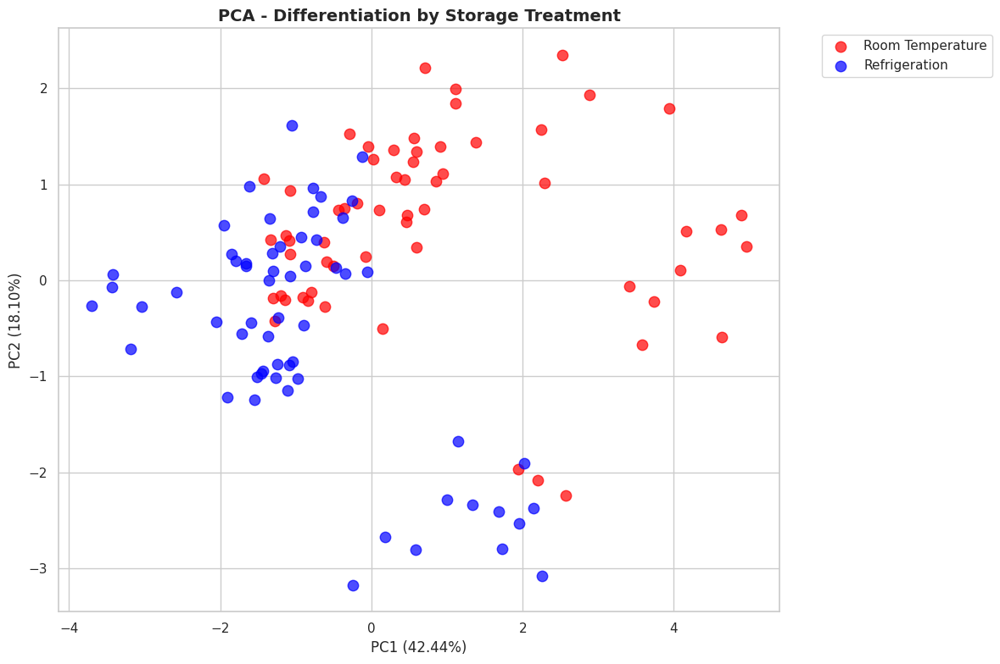

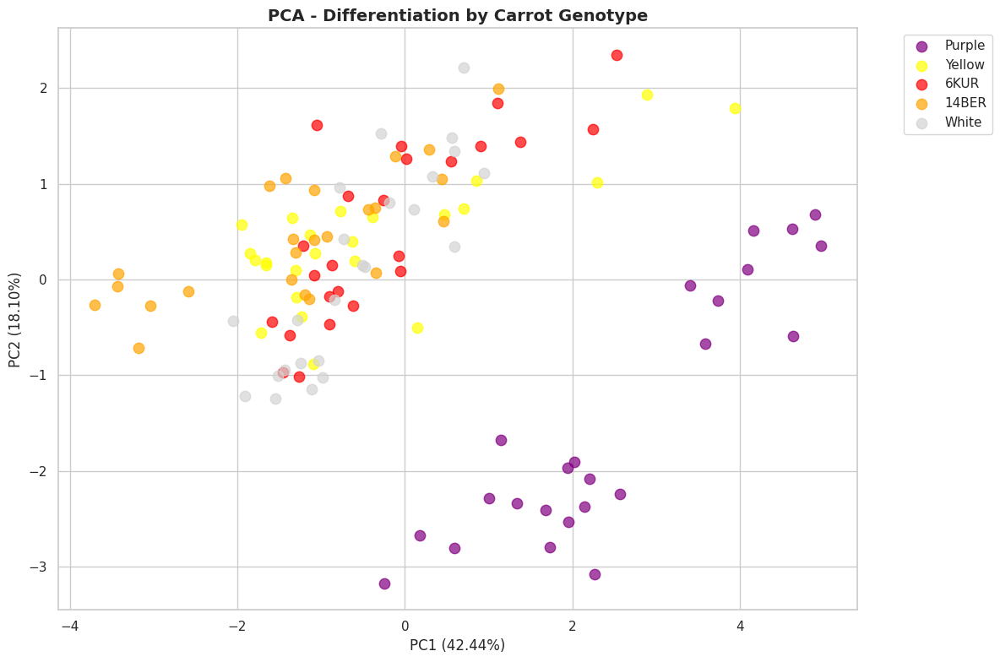

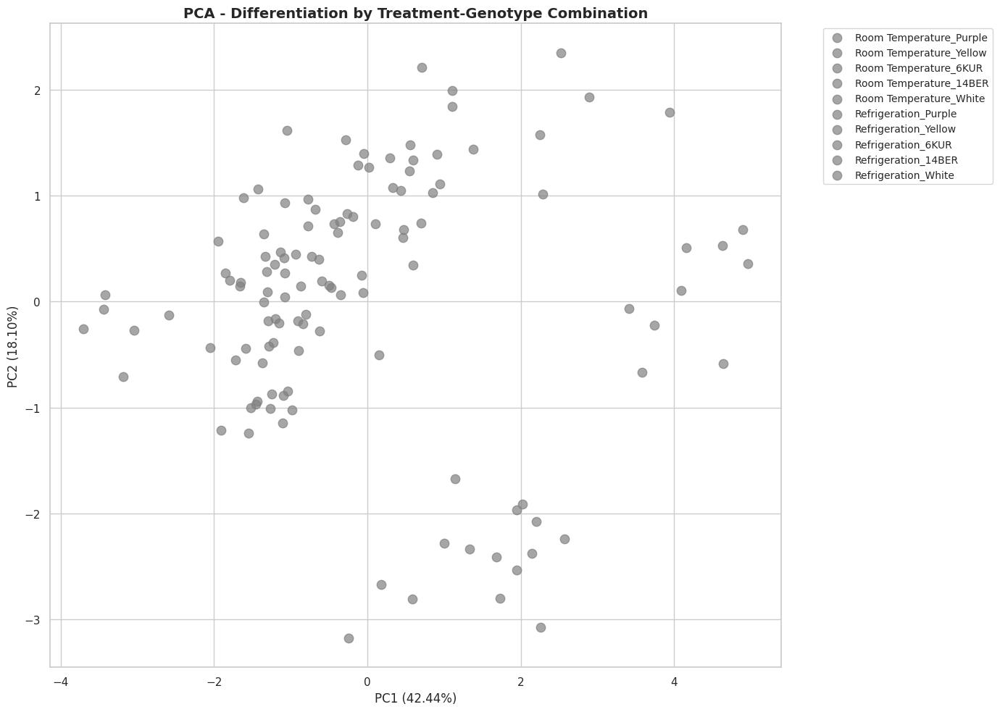


=== LINEAR DISCRIMINANT ANALYSIS BY VARIETY IN EACH TREATMENT ===

--- LDA for treatment: Room Temperature ---


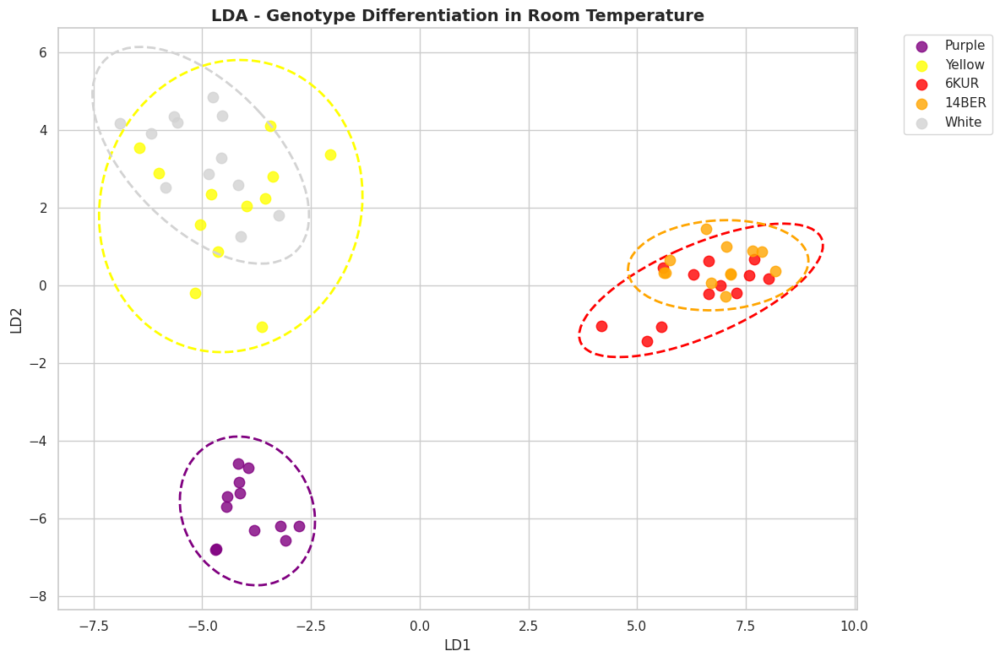


--- LDA for treatment: Refrigeration ---


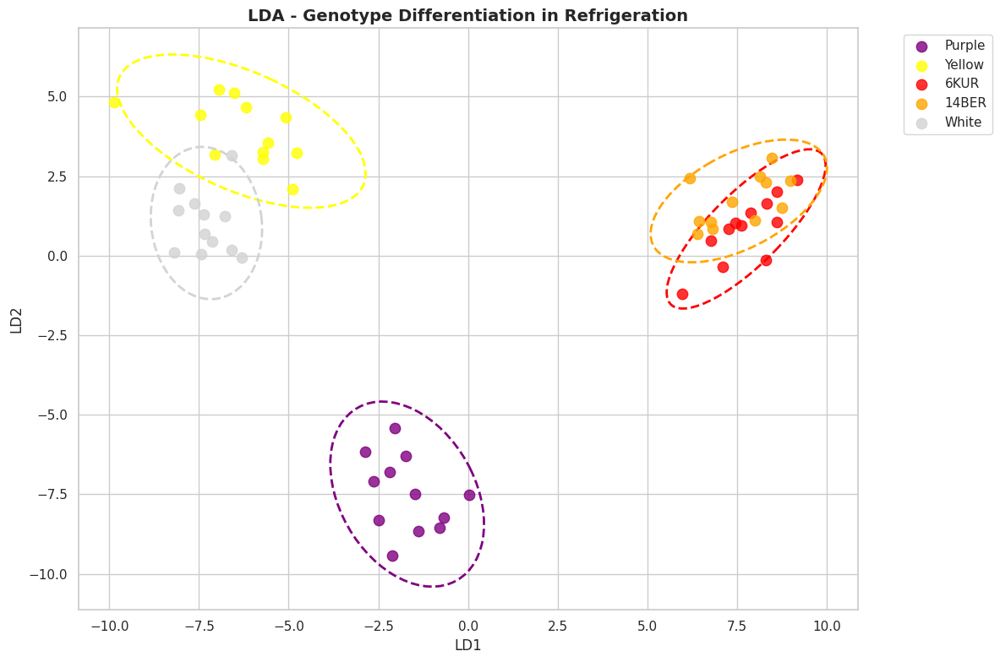


=== K-MEANS CLUSTER ANALYSIS ===


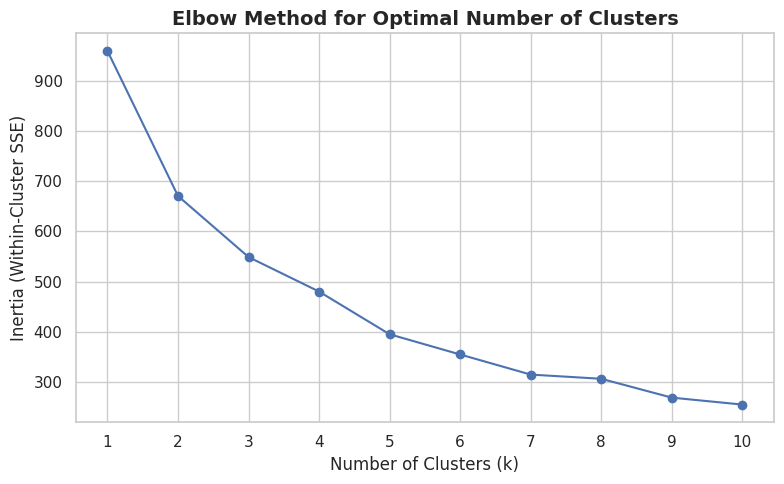

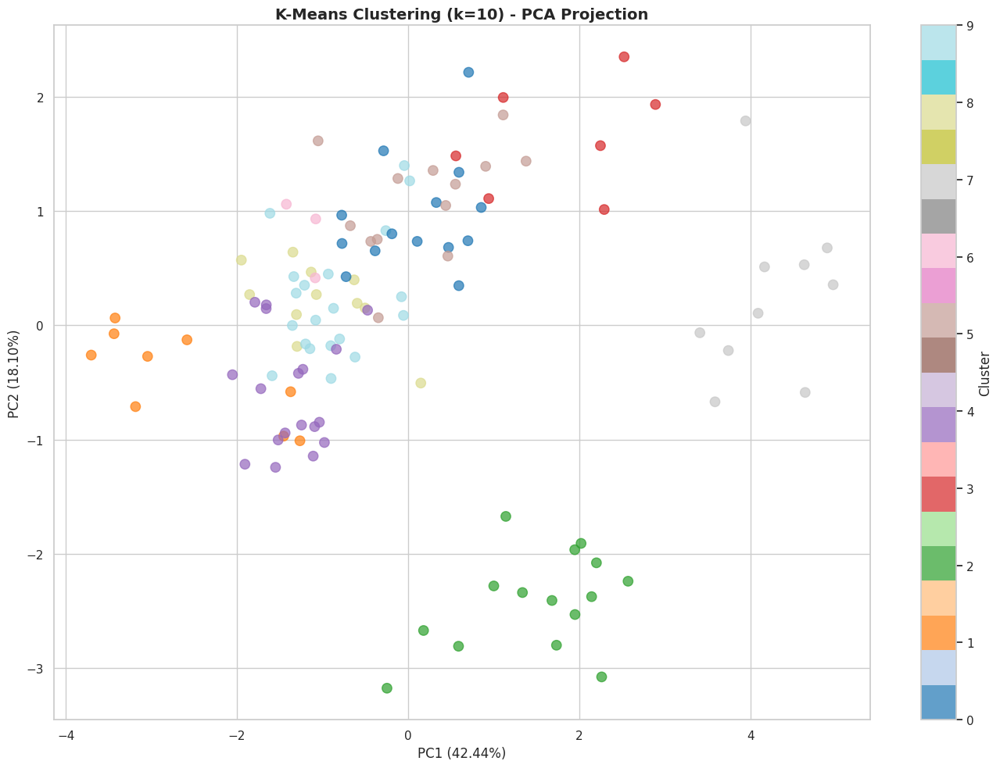


=== ANALYSIS OF VARIANCE (ANOVA) BY PARAMETER ===

ANOVA for L*:
                               sum_sq     df           F        PR(>F)
C(Treatment)                 4.469880    1.0    0.470711  4.941039e-01
C(Variedad)               9760.900762    4.0  256.973451  7.868030e-55
C(Treatment):C(Variedad)   159.690478    4.0    4.204142  3.316235e-03
Residual                  1044.562267  110.0         NaN           NaN

Significant interaction for L*. Tukey HSD on Treatment_Variety:
                  Multiple Comparison of Means - Tukey HSD, FWER=0.05                   
         group1                  group2         meandiff p-adj   lower    upper   reject
----------------------------------------------------------------------------------------
    Refrigeration_14BER      Refrigeration_6KUR  -3.5917 0.1315  -7.6547   0.4713  False
    Refrigeration_14BER    Refrigeration_Purple -19.6442    0.0 -23.7072 -15.5812   True
    Refrigeration_14BER     Refrigeration_White   7.4708    0.0   3.4

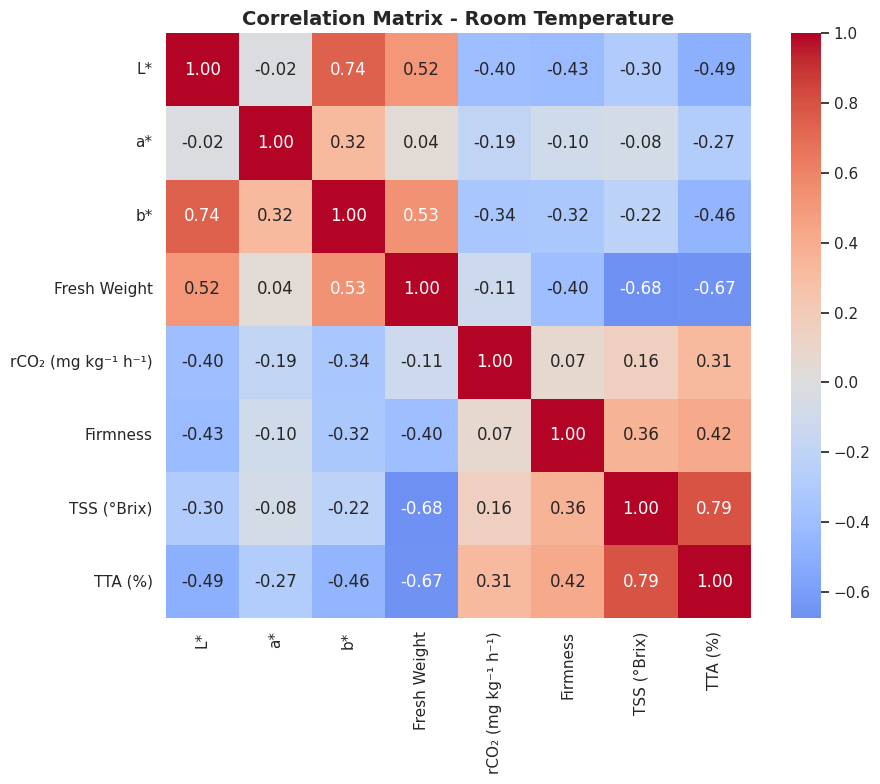

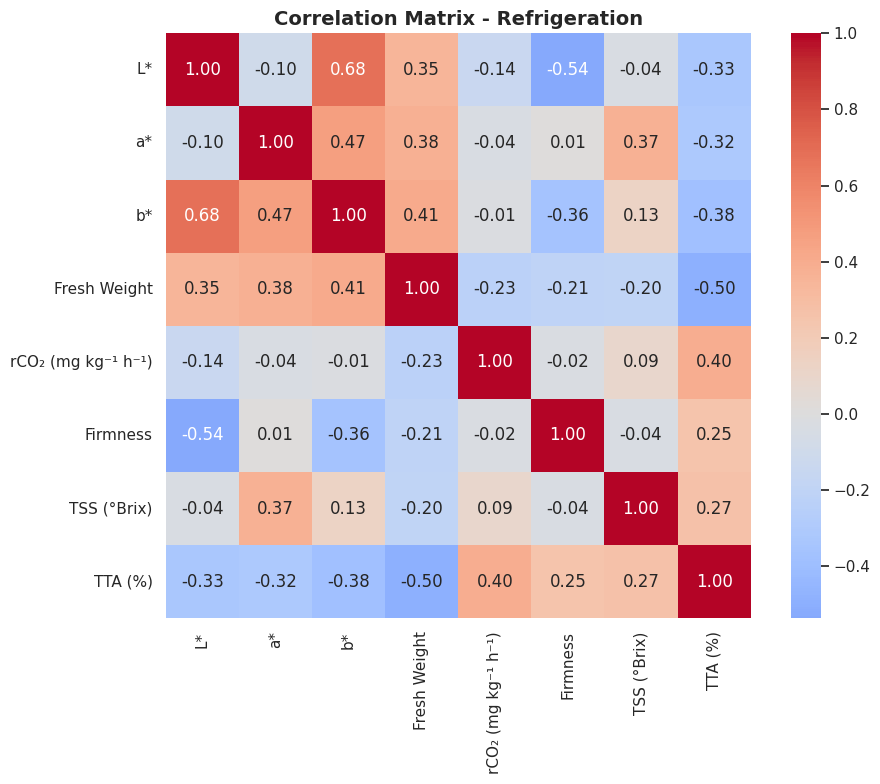


=== COMPARATIVE BOXPLOTS ===


/tmp/ipython-input-1859698061.py:368: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Treatment', y=param,
/tmp/ipython-input-1859698061.py:368: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Treatment', y=param,
/tmp/ipython-input-1859698061.py:368: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Treatment', y=param,
/tmp/ipython-input-1859698061.py:368: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` varia

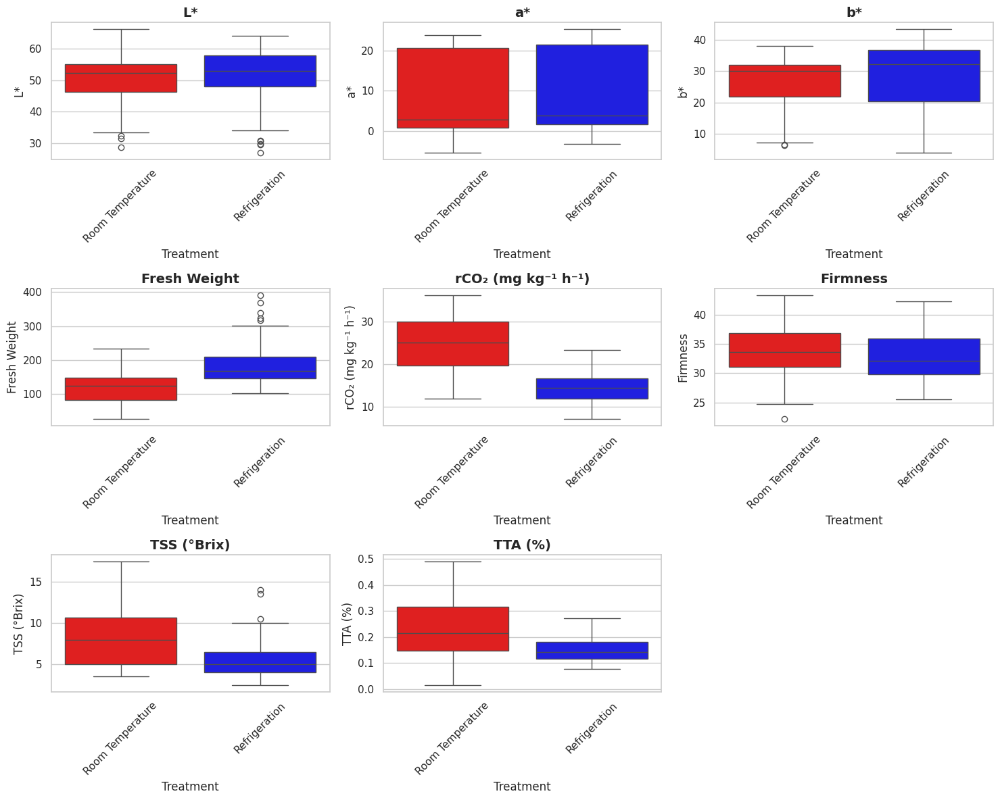

/tmp/ipython-input-1859698061.py:380: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Variedad', y=param,
/tmp/ipython-input-1859698061.py:380: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Variedad', y=param,
/tmp/ipython-input-1859698061.py:380: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Variedad', y=param,
/tmp/ipython-input-1859698061.py:380: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable

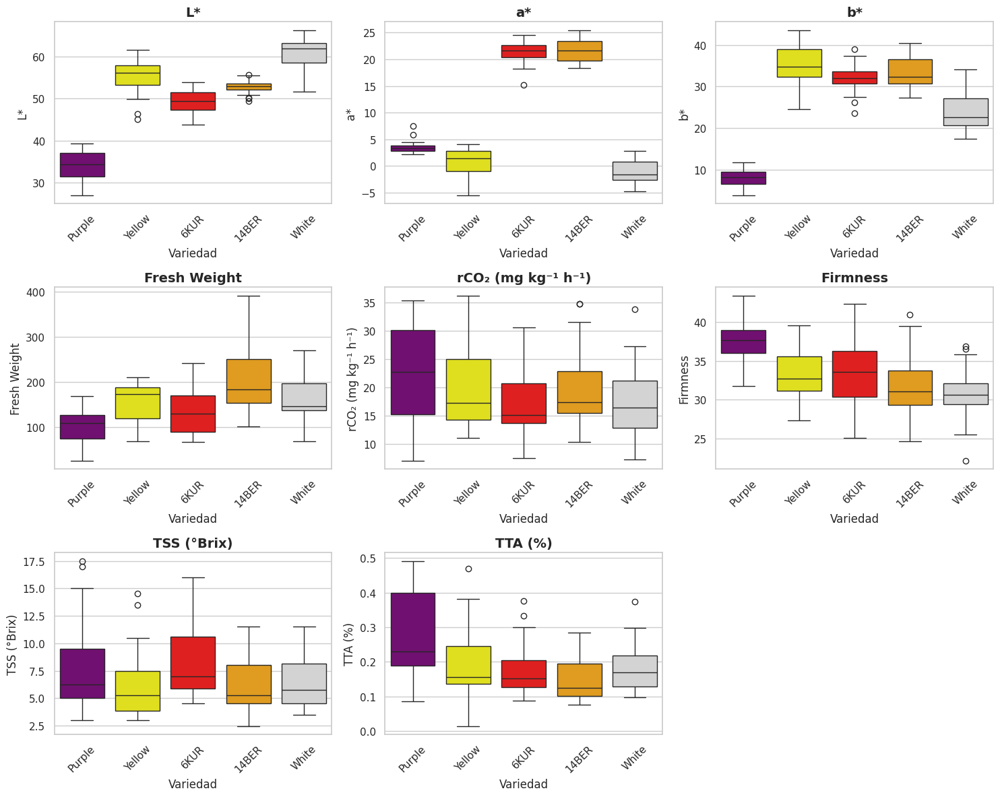


=== PRINCIPAL COMPONENT LOADINGS ===
Variables with highest loadings on PC1:
TTA (%)         0.464391
Fresh Weight    0.433307
b*              0.362353
TSS (°Brix)     0.360200
L*              0.354047
Name: PC1, dtype: float64

Variables with highest loadings on PC2:
b*                    0.506830
TSS (°Brix)           0.484937
L*                    0.432359
rCO₂ (mg kg⁻¹ h⁻¹)    0.337726
Firmness              0.303603
Name: PC2, dtype: float64


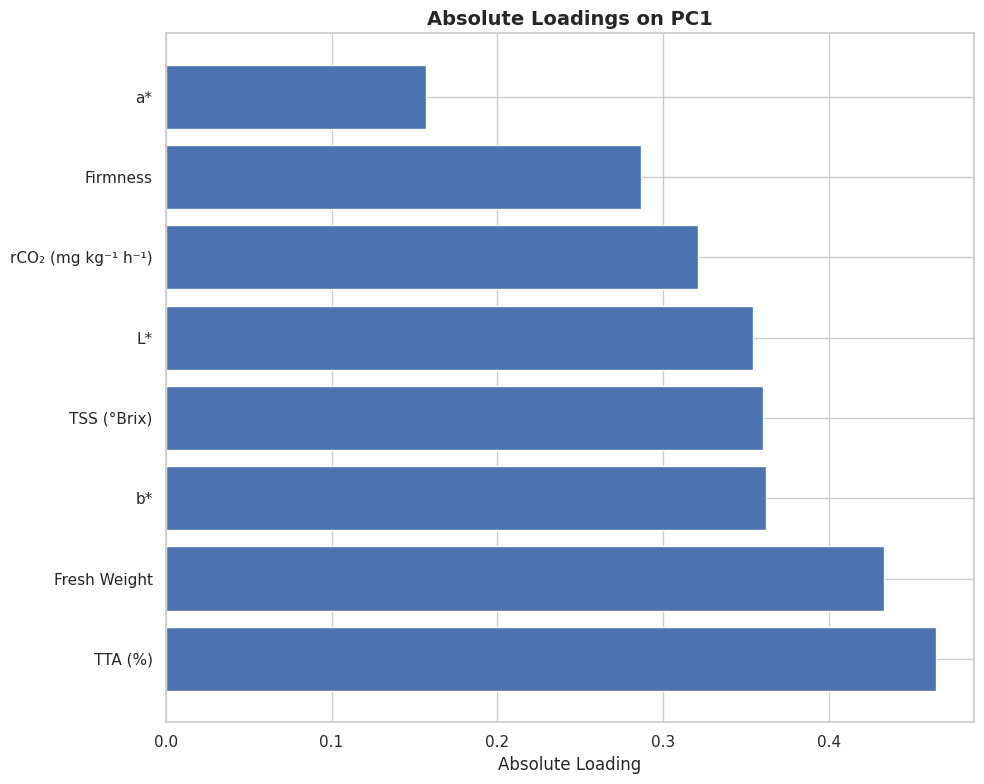

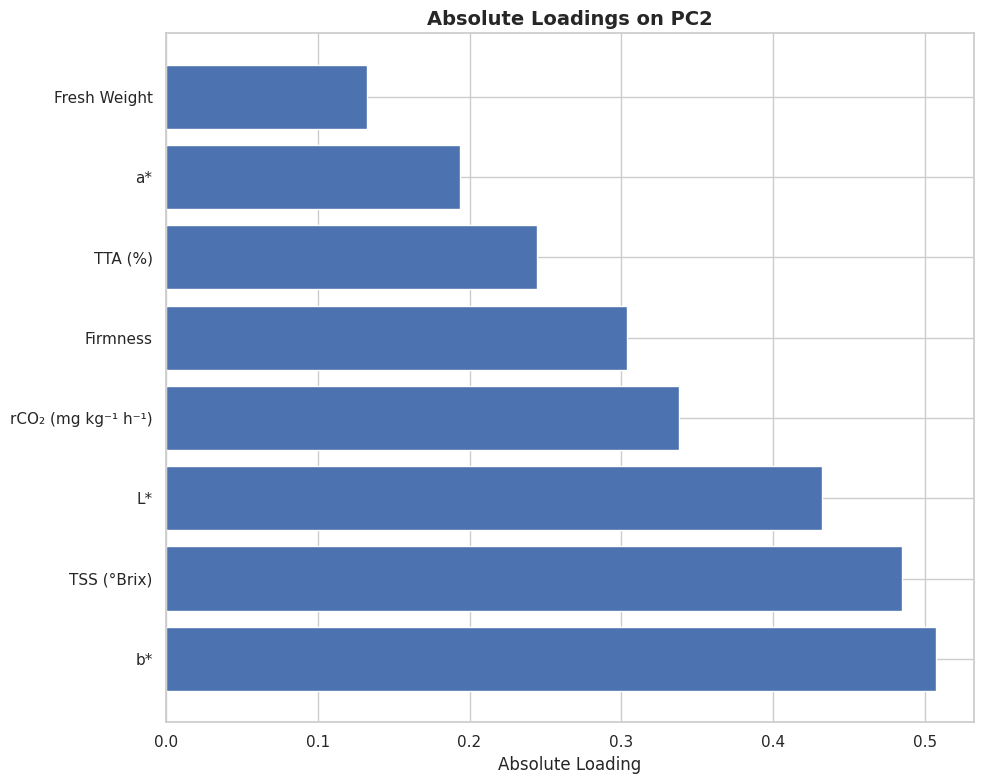


=== STATISTICAL SUMMARY ===
Means by treatment and variety:
                                  L*         a*         b*  Fresh Weight  \
Treatment        Variedad                                                  
Refrigeration    14BER     52.850833  22.417500  35.509167    261.380833   
                 6KUR      49.259167  21.865000  33.570000    174.711667   
                 Purple    33.206667   3.975833   7.728333    131.984167   
                 White     60.321667  -1.747500  22.100833    198.215833   
                 Yellow    57.450000   2.268333  38.149167    164.210000   
Room Temperature 14BER     52.719167  21.231667  31.093333    161.066667   
                 6KUR      49.690000  20.555000  30.171667     95.761667   
                 Purple    34.763333   3.088333   8.623333     70.710833   
                 White     61.392500  -0.621667  26.623333    131.505000   
                 Yellow    52.593333  -0.620833  32.090833    146.966667   

                          

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from matplotlib.patches import Ellipse
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scipy.stats as stats

# --------------------
# Style
# --------------------
plt.style.use('default')
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.titleweight'] = 'bold'

# --------------------
# Translations
# --------------------
param_translation = {
    'L*': 'L*',
    'a*': 'a*',
    'b*': 'b*',
    'Peso_Fresco': 'Fresh Weight',
    'Firmeza': 'Firmness',
    'Respiración': 'rCO₂ (mg kg⁻¹ h⁻¹)',
    'IC': 'IC',
    'SST_Corregido': 'TSS (°Brix)',
    'ATT': 'TTA (%)'
}

variety_translation = {
    "6KUR": "6KUR",
    "14BER": "14BER",
    "Amarilla": "Yellow",
    "Blanca": "White",
    "Morada": "Purple",
    "YELLOW": "Yellow",
    "WHITE": "White",
    "PURPLE": "Purple"
}

# Palettes in English
treatment_palette = {
    "Room Temperature": "red",
    "Refrigeration": "blue"
}
variety_palette = {
    "6KUR": "red",
    "14BER": "orange",
    "Yellow": "yellow",
    "White": "lightgray",
    "Purple": "purple"
}
combined_palette = {
    "6KUR_Room Temperature": "darkred",
    "6KUR_Refrigeration": "lightcoral",
    "14BER_Room Temperature": "darkorange",
    "14BER_Refrigeration": "navajowhite",
    "Yellow_Room Temperature": "goldenrod",
    "Yellow_Refrigeration": "lightyellow",
    "White_Room Temperature": "dimgray",
    "White_Refrigeration": "lightgray",
    "Purple_Room Temperature": "indigo",
    "Purple_Refrigeration": "mediumpurple"
}

# --------------------
# Data loader
# --------------------
def load_carrot_data(file_path, week):
    """Load carrot data from Excel and translate/standardize columns."""
    try:
        amb_data = pd.read_excel(file_path, sheet_name='Ambiente')
        refri_data = pd.read_excel(file_path, sheet_name='Refrigeración')

        amb_data['Week'] = week
        amb_data['Treatment'] = 'Room Temperature'
        refri_data['Week'] = week
        refri_data['Treatment'] = 'Refrigeration'

        combined = pd.concat([amb_data, refri_data], ignore_index=True)
        combined.columns = combined.columns.str.strip()

        # Normalize/translate variety names
        if 'Variedad' in combined.columns:
            combined['Variedad'] = combined['Variedad'].astype(str).str.strip().replace(variety_translation)

        # Ensure numeric columns are numeric
        numeric_cols = ['L*', 'a*', 'b*', 'Diametro', 'Longitud', 'Peso_Fresco',
                        'Peso_fresco_kg', 'm', 'Respiración', 'ATAN', 'Hue',
                        'Croma', 'Firmeza', 'SST', 'SST_Corregido', 'NaOH',
                        'Acidez_Peso_Muestra', 'Factor_D', 'ATT']
        for col in numeric_cols:
            if col in combined.columns:
                combined[col] = pd.to_numeric(combined[col], errors='coerce')

        # Translate parameter names to English
        combined = combined.rename(columns=param_translation)
        return combined

    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return pd.DataFrame()

# --------------------
# Load all files
# --------------------
files_weeks = [
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/7 10.xlsx", 1),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 15 10 24  Colab_CadenaF_TAmb.xlsx", 2),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 21 10 024.xlsx", 3),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/ Muestreo 28 10 024.xlsx", 4)
]

all_data = []
for file_path, week in files_weeks:
    df = load_carrot_data(file_path, week)
    if not df.empty:
        all_data.append(df)

data = pd.concat(all_data, ignore_index=True)
data = data.dropna(how='all')

# Clean/translate varieties
if 'Variedad' in data.columns:
    data['Variedad'] = data['Variedad'].astype(str).str.strip().replace(variety_translation)

# Combined key
data['Treatment_Variety'] = data['Treatment'] + '_' + data['Variedad']

# --------------------
# Variables for analysis
# --------------------
numeric_params = [
    'L*', 'a*', 'b*',
    'Fresh Weight',
    'rCO₂ (mg kg⁻¹ h⁻¹)',
    'Firmness',
    'TSS (°Brix)',
    'TTA (%)'
]

# Keep only complete rows
cols_needed = ['Treatment', 'Variedad', 'Treatment_Variety'] + numeric_params
analysis_data = data[cols_needed].dropna()

print("Data loaded for multivariate analysis by treatment and genotype:")
print(f"Total samples: {len(analysis_data)}")
print(f"Unique treatments: {analysis_data['Treatment'].nunique()}")
print(f"Unique varieties: {analysis_data['Variedad'].nunique()}")
print(f"Unique combinations: {analysis_data['Treatment_Variety'].nunique()}")
print("\nDistribution by treatment:")
print(analysis_data['Treatment'].value_counts())
print("\nDistribution by variety:")
print(analysis_data['Variedad'].value_counts())
print("\nDistribution by combination:")
print(analysis_data['Treatment_Variety'].value_counts())

# --------------------
# 1) PCA
# --------------------
print("\n=== PRINCIPAL COMPONENT ANALYSIS (PCA) ===")
X = analysis_data[numeric_params]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['Treatment'] = analysis_data['Treatment'].to_numpy()
pca_df['Variedad'] = analysis_data['Variedad'].to_numpy()
pca_df['Treatment_Variety'] = analysis_data['Treatment_Variety'].to_numpy()

# PCA by treatment
plt.figure(figsize=(12, 8))
for treatment in pca_df['Treatment'].unique():
    mask = pca_df['Treatment'] == treatment
    plt.scatter(pca_df.loc[mask, 'PC1'], pca_df.loc[mask, 'PC2'],
                label=treatment, s=80, alpha=0.7,
                c=treatment_palette.get(treatment, 'gray'))
plt.title('PCA - Differentiation by Storage Treatment')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True); plt.tight_layout(); plt.show()

# PCA by variety
plt.figure(figsize=(12, 8))
for variety in pca_df['Variedad'].unique():
    mask = pca_df['Variedad'] == variety
    plt.scatter(pca_df.loc[mask, 'PC1'], pca_df.loc[mask, 'PC2'],
                label=variety, s=80, alpha=0.7,
                c=variety_palette.get(variety, 'gray'))
plt.title('PCA - Differentiation by Carrot Genotype')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True); plt.tight_layout(); plt.show()

# PCA by combination
plt.figure(figsize=(14, 10))
for comb in pca_df['Treatment_Variety'].unique():
    mask = pca_df['Treatment_Variety'] == comb
    plt.scatter(pca_df.loc[mask, 'PC1'], pca_df.loc[mask, 'PC2'],
                label=comb, s=80, alpha=0.7,
                c=combined_palette.get(comb, 'gray'))
plt.title('PCA - Differentiation by Treatment-Genotype Combination')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
plt.grid(True); plt.tight_layout(); plt.show()

# --------------------
# Helper: confidence ellipse
# --------------------
def add_confidence_ellipse(ax, x, y, edgecolor='black', conf=0.95, lw=2, ls='--'):
    """
    Draw a confidence ellipse of level `conf` for points (x,y).
    """
    if len(x) < 2:
        return
    x = np.asarray(x); y = np.asarray(y)
    cov = np.cov(x, y)
    if np.linalg.matrix_rank(cov) < 2:
        return
    vals, vecs = np.linalg.eigh(cov)  # sorted ascending
    order = vals.argsort()[::-1]
    vals, vecs = vals[order], vecs[:, order]
    theta = np.degrees(np.arctan2(*vecs[:, 0][::-1]))
    # scale to desired confidence using chi-square quantile with 2 df
    s = np.sqrt(stats.chi2.ppf(conf, 2))
    width, height = 2 * s * np.sqrt(vals)  # 2*radius for full width/height
    mean_x, mean_y = x.mean(), y.mean()
    ellipse = Ellipse((mean_x, mean_y), width, height, angle=theta,
                      fill=False, lw=lw, ls=ls, edgecolor=edgecolor)
    ax.add_patch(ellipse)

# --------------------
# 2) LDA by variety within each treatment (WITH 95% CONFIDENCE ELLIPSES)
# --------------------
print("\n=== LINEAR DISCRIMINANT ANALYSIS BY VARIETY IN EACH TREATMENT ===")
for treatment in analysis_data['Treatment'].unique():
    print(f"\n--- LDA for treatment: {treatment} ---")
    subset = analysis_data[analysis_data['Treatment'] == treatment].copy()
    classes = subset['Variedad'].unique()

    if len(classes) <= 1:
        print(f"Cannot perform LDA for {treatment} - only one variety present")
        continue

    X_t = subset[numeric_params].to_numpy()
    y_t = subset['Variedad'].to_numpy()

    X_t_scaled = StandardScaler().fit_transform(X_t)
    n_components = min(len(classes) - 1, 2)
    lda = LinearDiscriminantAnalysis(n_components=n_components)
    X_lda = lda.fit_transform(X_t_scaled, y_t)

    # Plot
    if n_components == 1:
        plt.figure(figsize=(12, 4))
        for variety in classes:
            mask = (y_t == variety)
            plt.scatter(X_lda[mask, 0], np.zeros(mask.sum()),
                        label=variety, s=80, alpha=0.8,
                        c=variety_palette.get(variety, 'gray'))
        plt.title(f'LDA (LD1) - Genotype Differentiation in {treatment}')
        plt.xlabel('LD1')
        plt.yticks([])
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True); plt.tight_layout(); plt.show()
    else:
        plt.figure(figsize=(12, 8))
        ax = plt.gca()
        for variety in classes:
            mask = (y_t == variety)
            x1 = X_lda[mask, 0]; x2 = X_lda[mask, 1]
            plt.scatter(x1, x2,
                        label=variety, s=80, alpha=0.8,
                        c=variety_palette.get(variety, 'gray'))
            # 95% confidence ellipse for each class
            add_confidence_ellipse(ax, x1, x2,
                                   edgecolor=variety_palette.get(variety, 'black'),
                                   conf=0.95, lw=2, ls='--')
        plt.title(f'LDA - Genotype Differentiation in {treatment}')
        plt.xlabel('LD1'); plt.ylabel('LD2')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True); plt.tight_layout(); plt.show()

# --------------------
# 3) K-Means (on PCA projection)
# --------------------
print("\n=== K-MEANS CLUSTER ANALYSIS ===")
inertias = []
k_range = range(1, 11)
for k in k_range:
    km = KMeans(n_clusters=k, random_state=42, n_init='auto')
    km.fit(X_scaled)
    inertias.append(km.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(list(k_range), inertias, marker='o')
plt.title("Elbow Method for Optimal Number of Clusters")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Inertia (Within-Cluster SSE)")
plt.xticks(list(k_range))
plt.grid(True); plt.tight_layout(); plt.show()

optimal_k = analysis_data['Treatment_Variety'].nunique()
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init='auto')
clusters = kmeans.fit_predict(X_scaled)

plt.figure(figsize=(14, 10))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='tab20', s=80, alpha=0.7)
plt.colorbar(scatter, label='Cluster')
plt.title(f'K-Means Clustering (k={optimal_k}) - PCA Projection')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
plt.grid(True); plt.tight_layout(); plt.show()

# --------------------
# 4) Two-way ANOVA + Tukey when interaction significant
# --------------------
print("\n=== ANALYSIS OF VARIANCE (ANOVA) BY PARAMETER ===")
for param in numeric_params:
    print(f"\nANOVA for {param}:")
    formula = f'Q("{param}") ~ C(Treatment) + C(Variedad) + C(Treatment):C(Variedad)'
    model = ols(formula, data=analysis_data).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    print(anova_table)

    if 'C(Treatment):C(Variedad)' in anova_table.index and anova_table.loc['C(Treatment):C(Variedad)', 'PR(>F)'] < 0.05:
        print(f"\nSignificant interaction for {param}. Tukey HSD on Treatment_Variety:")
        tukey = pairwise_tukeyhsd(analysis_data[param], analysis_data['Treatment_Variety'], alpha=0.05)
        print(tukey)

# --------------------
# 5) Correlation matrices by treatment
# --------------------
print("\n=== CORRELATION MATRICES BY TREATMENT ===")
for treatment in analysis_data['Treatment'].unique():
    corr = analysis_data.loc[analysis_data['Treatment'] == treatment, numeric_params].corr()
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr, annot=True, cmap='coolwarm', center=0, square=True, fmt='.2f')
    plt.title(f'Correlation Matrix - {treatment}')
    plt.tight_layout(); plt.show()

# --------------------
# 6) Comparative boxplots
# --------------------
print("\n=== COMPARATIVE BOXPLOTS ===")
# By treatment
rows, cols = 3, 3
fig, axes = plt.subplots(rows, cols, figsize=(15, 12))
axes = axes.flatten()
for i, param in enumerate(numeric_params):
    if i < len(axes):
        sns.boxplot(data=analysis_data, x='Treatment', y=param,
                    ax=axes[i], palette=treatment_palette)
        axes[i].set_title(param); axes[i].tick_params(axis='x', rotation=45)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout(); plt.show()

# By variety
fig, axes = plt.subplots(rows, cols, figsize=(15, 12))
axes = axes.flatten()
for i, param in enumerate(numeric_params):
    if i < len(axes):
        sns.boxplot(data=analysis_data, x='Variedad', y=param,
                    ax=axes[i], palette=variety_palette)
        axes[i].set_title(param); axes[i].tick_params(axis='x', rotation=45)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout(); plt.show()

# --------------------
# 7) PCA loadings
# --------------------
print("\n=== PRINCIPAL COMPONENT LOADINGS ===")
loadings = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2'], index=numeric_params)
load_PC1 = loadings['PC1'].abs().sort_values(ascending=False)
load_PC2 = loadings['PC2'].abs().sort_values(ascending=False)

print("Variables with highest loadings on PC1:")
print(load_PC1.head())
print("\nVariables with highest loadings on PC2:")
print(load_PC2.head())

plt.figure(figsize=(10, 8))
plt.barh(range(len(load_PC1)), load_PC1.values)
plt.yticks(range(len(load_PC1)), load_PC1.index)
plt.title('Absolute Loadings on PC1')
plt.xlabel('Absolute Loading'); plt.tight_layout(); plt.show()

plt.figure(figsize=(10, 8))
plt.barh(range(len(load_PC2)), load_PC2.values)
plt.yticks(range(len(load_PC2)), load_PC2.index)
plt.title('Absolute Loadings on PC2')
plt.xlabel('Absolute Loading'); plt.tight_layout(); plt.show()

# --------------------
# 8) Summary stats
# --------------------
print("\n=== STATISTICAL SUMMARY ===")
print("Means by treatment and variety:")
print(analysis_data.groupby(['Treatment', 'Variedad'])[numeric_params].mean())

print("\nMeans by treatment:")
print(analysis_data.groupby('Treatment')[numeric_params].mean())

print("\nMeans by variety:")
print(analysis_data.groupby('Variedad')[numeric_params].mean())

print("\nMultivariate analysis by treatment and genotype completed.")



=== LINEAR DISCRIMINANT ANALYSIS BY VARIETY IN EACH TREATMENT ===

--- LDA for treatment: Room Temperature ---


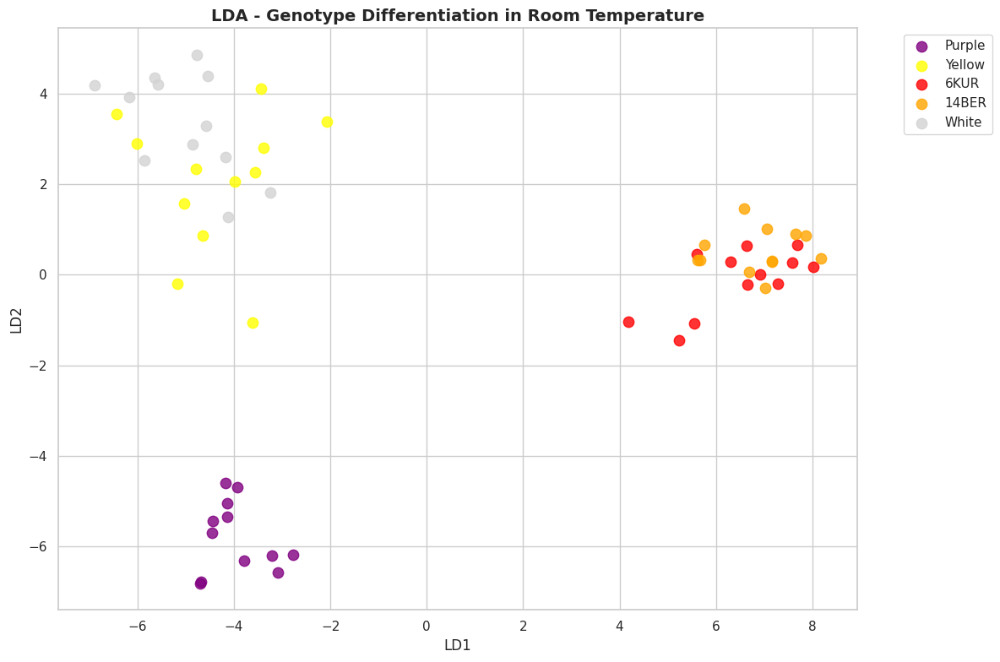


--- LDA for treatment: Refrigeration ---


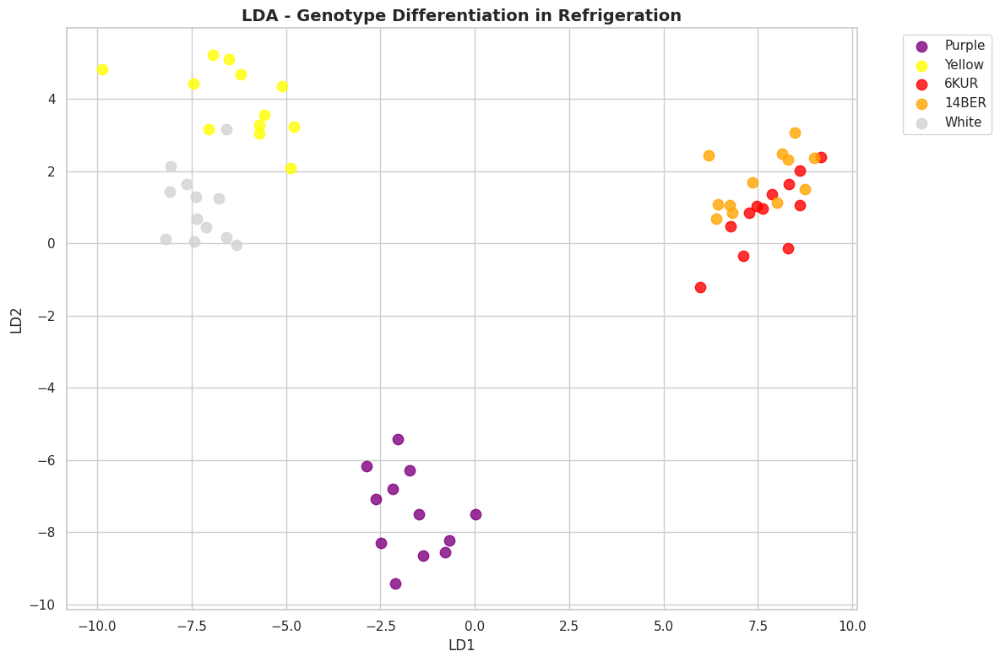

In [ ]:
# --------------------
# 2) LDA by variety within each treatment (NO CONFIDENCE ELLIPSES)
# --------------------
print("\n=== LINEAR DISCRIMINANT ANALYSIS BY VARIETY IN EACH TREATMENT ===")
for treatment in analysis_data['Treatment'].unique():
    print(f"\n--- LDA for treatment: {treatment} ---")
    subset = analysis_data[analysis_data['Treatment'] == treatment].copy()
    classes = subset['Variedad'].unique()

    if len(classes) <= 1:
        print(f"Cannot perform LDA for {treatment} - only one variety present")
        continue

    X_t = subset[numeric_params].to_numpy()
    y_t = subset['Variedad'].to_numpy()

    X_t_scaled = StandardScaler().fit_transform(X_t)
    n_components = min(len(classes) - 1, 2)
    lda = LinearDiscriminantAnalysis(n_components=n_components)
    X_lda = lda.fit_transform(X_t_scaled, y_t)

    # Plot
    if n_components == 1:
        plt.figure(figsize=(12, 4))
        for variety in classes:
            mask = (y_t == variety)
            plt.scatter(X_lda[mask, 0], np.zeros(mask.sum()),
                        label=variety, s=80, alpha=0.8,
                        c=variety_palette.get(variety, 'gray'))
        plt.title(f'LDA (LD1) - Genotype Differentiation in {treatment}')
        plt.xlabel('LD1')
        plt.yticks([])
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True); plt.tight_layout(); plt.show()
    else:
        plt.figure(figsize=(12, 8))
        for variety in classes:
            mask = (y_t == variety)
            x1 = X_lda[mask, 0]; x2 = X_lda[mask, 1]
            plt.scatter(x1, x2,
                        label=variety, s=80, alpha=0.8,
                        c=variety_palette.get(variety, 'gray'))
        plt.title(f'LDA - Genotype Differentiation in {treatment}')
        plt.xlabel('LD1'); plt.ylabel('LD2')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True); plt.tight_layout(); plt.show()


Spectral data loaded successfully. Shape: (80, 1557)
Selected 15 key wavelengths for analysis
Combined data shape: (121, 42)

Data loaded for multivariate analysis:
Total samples: 120
Unique treatments: 2
Unique varieties: 5
Unique combinations: 10

Distribution by treatment:
Treatment
Room Temperature    60
Refrigeration       60
Name: count, dtype: int64

Distribution by variety:
Variedad
Purple    24
Yellow    24
6KUR      24
14BER     24
White     24
Name: count, dtype: int64

Distribution by combination:
Treatment_Variety
Room Temperature_Purple    12
Room Temperature_Yellow    12
Room Temperature_6KUR      12
Room Temperature_14BER     12
Room Temperature_White     12
Refrigeration_Purple       12
Refrigeration_Yellow       12
Refrigeration_6KUR         12
Refrigeration_14BER        12
Refrigeration_White        12
Name: count, dtype: int64

=== PRINCIPAL COMPONENT ANALYSIS (PCA) ON COMBINED DATA ===


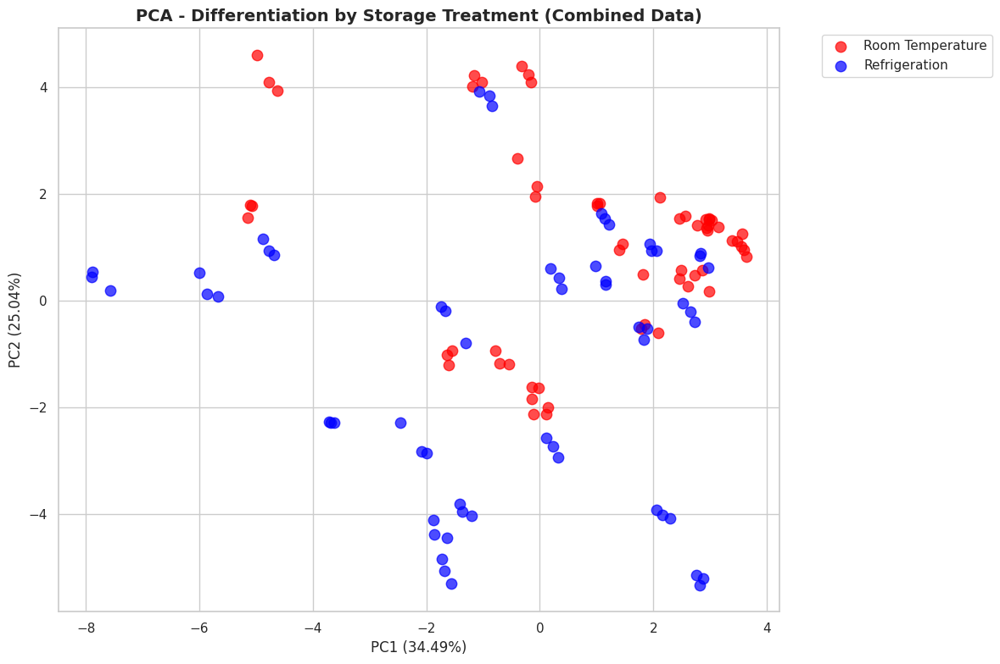

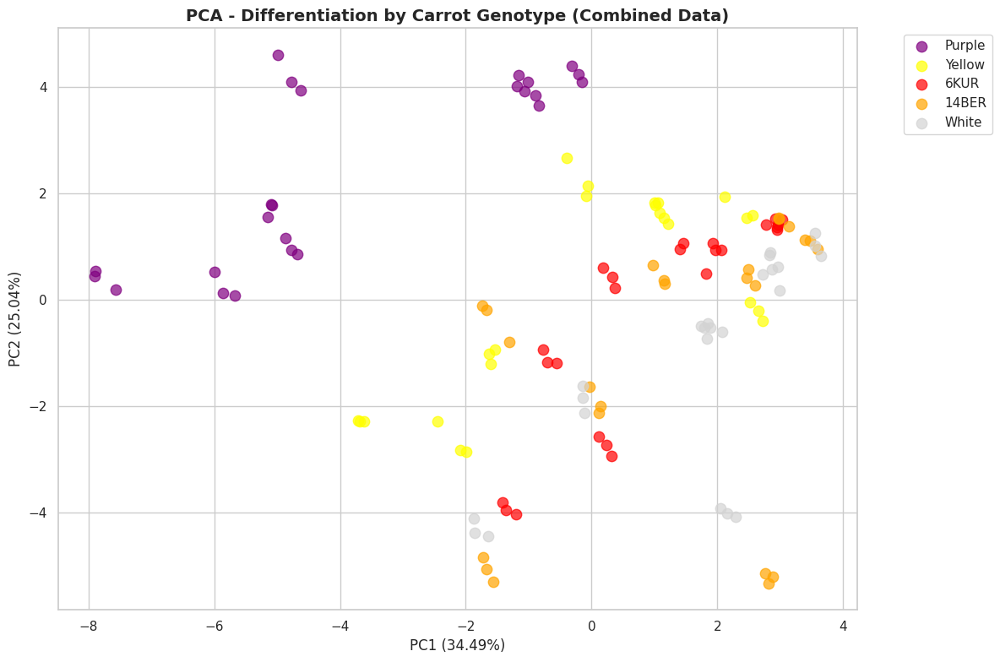


=== LINEAR DISCRIMINANT ANALYSIS BY VARIETY IN EACH TREATMENT (COMBINED DATA) ===

--- LDA for treatment: Room Temperature ---


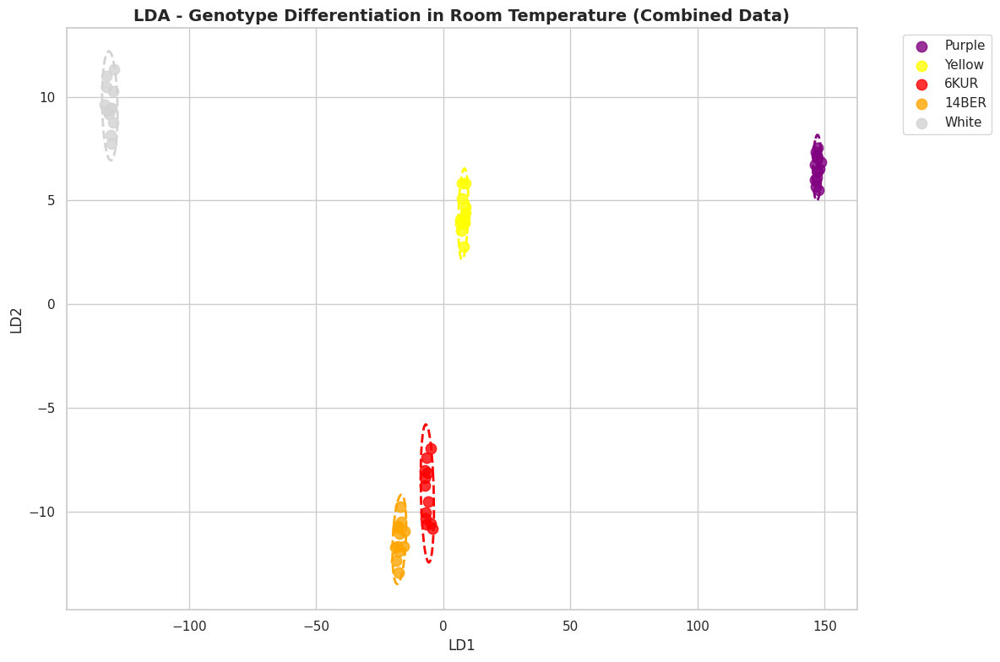


--- LDA for treatment: Refrigeration ---


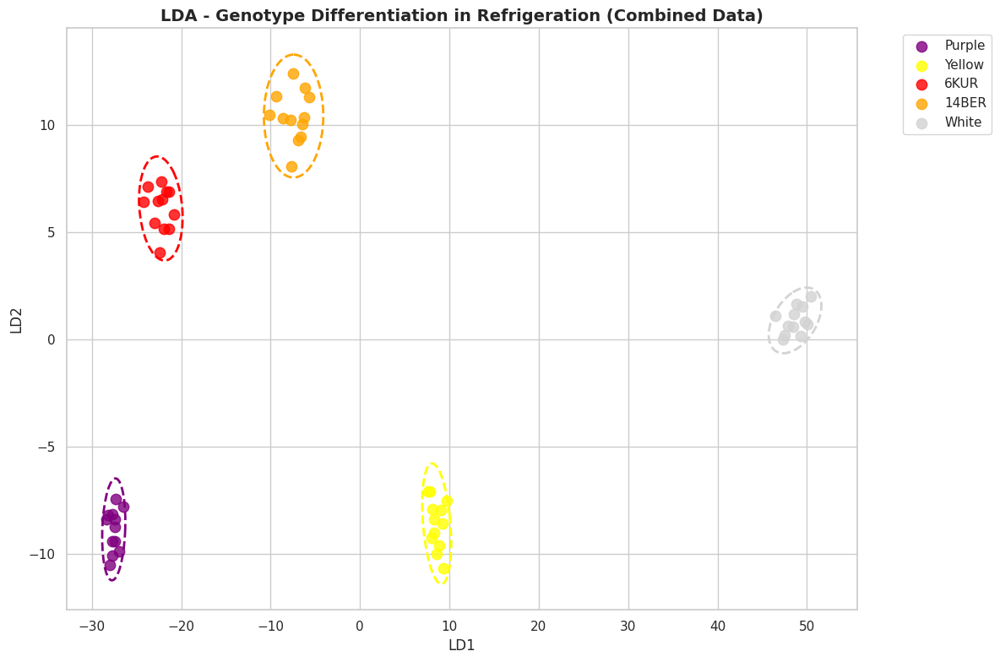


=== K-MEANS CLUSTER ANALYSIS (COMBINED DATA) ===


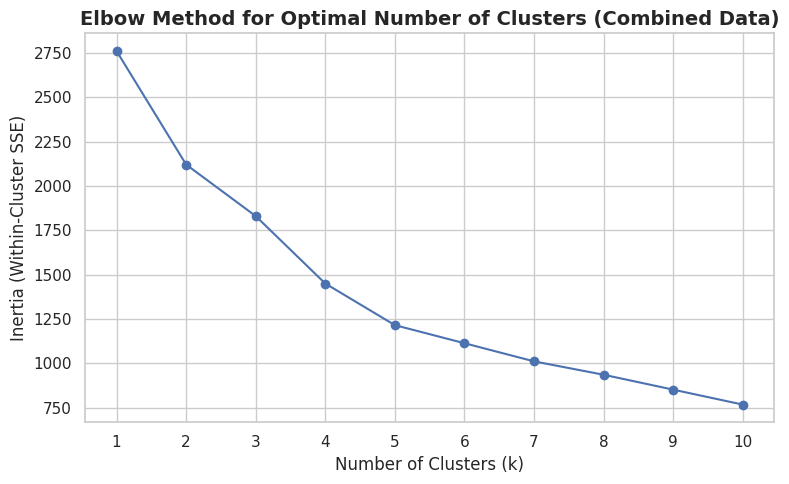

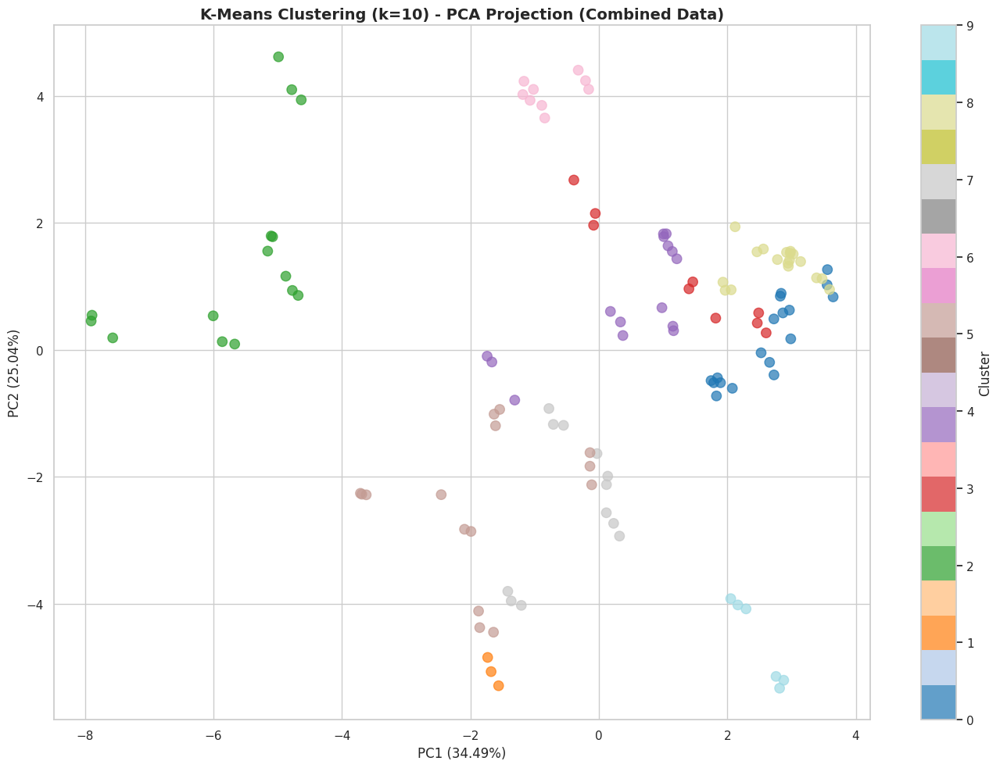


=== ANALYSIS OF VARIANCE (ANOVA) BY PARAMETER (COMBINED DATA) ===

ANOVA for L*:
                               sum_sq     df           F        PR(>F)
C(Treatment)                 4.469880    1.0    0.470711  4.941039e-01
C(Variedad)               9760.900762    4.0  256.973451  7.868030e-55
C(Treatment):C(Variedad)   159.690478    4.0    4.204142  3.316235e-03
Residual                  1044.562267  110.0         NaN           NaN

Significant interaction for L*. Tukey HSD on Treatment_Variety:
                  Multiple Comparison of Means - Tukey HSD, FWER=0.05                   
         group1                  group2         meandiff p-adj   lower    upper   reject
----------------------------------------------------------------------------------------
    Refrigeration_14BER      Refrigeration_6KUR  -3.5917 0.1315  -7.6547   0.4713  False
    Refrigeration_14BER    Refrigeration_Purple -19.6442    0.0 -23.7072 -15.5812   True
    Refrigeration_14BER     Refrigeration_White   7.4

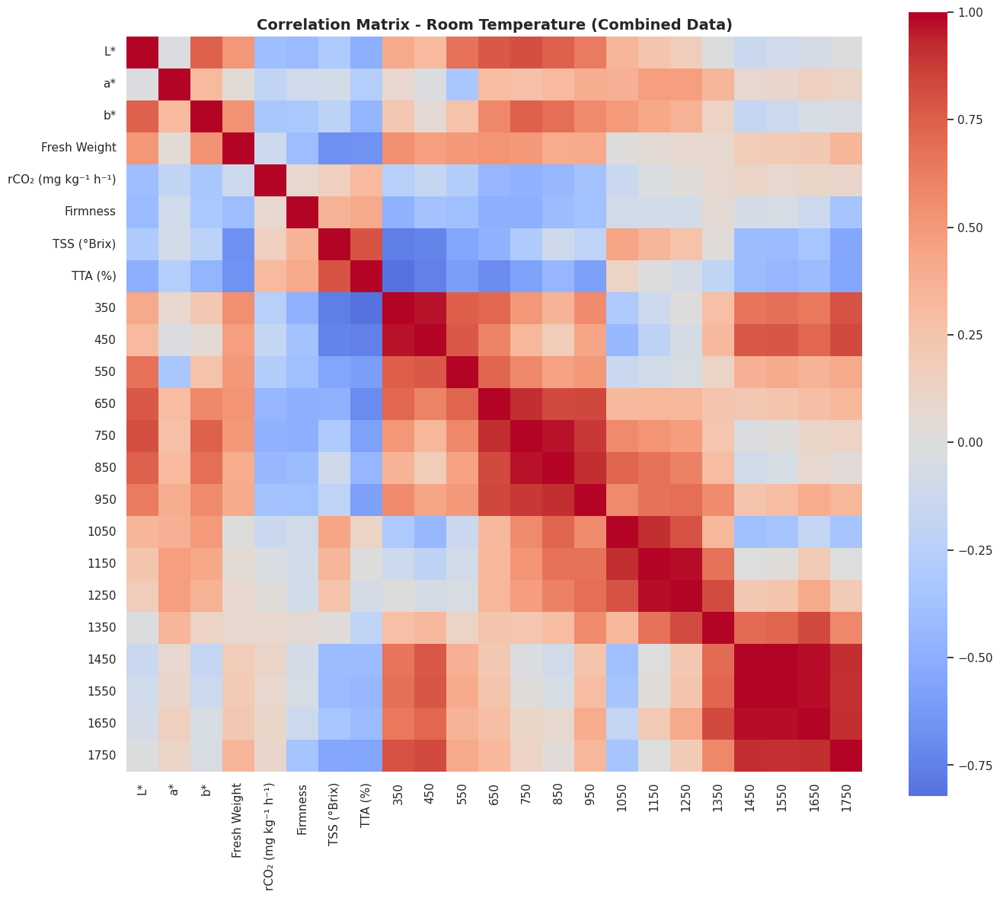

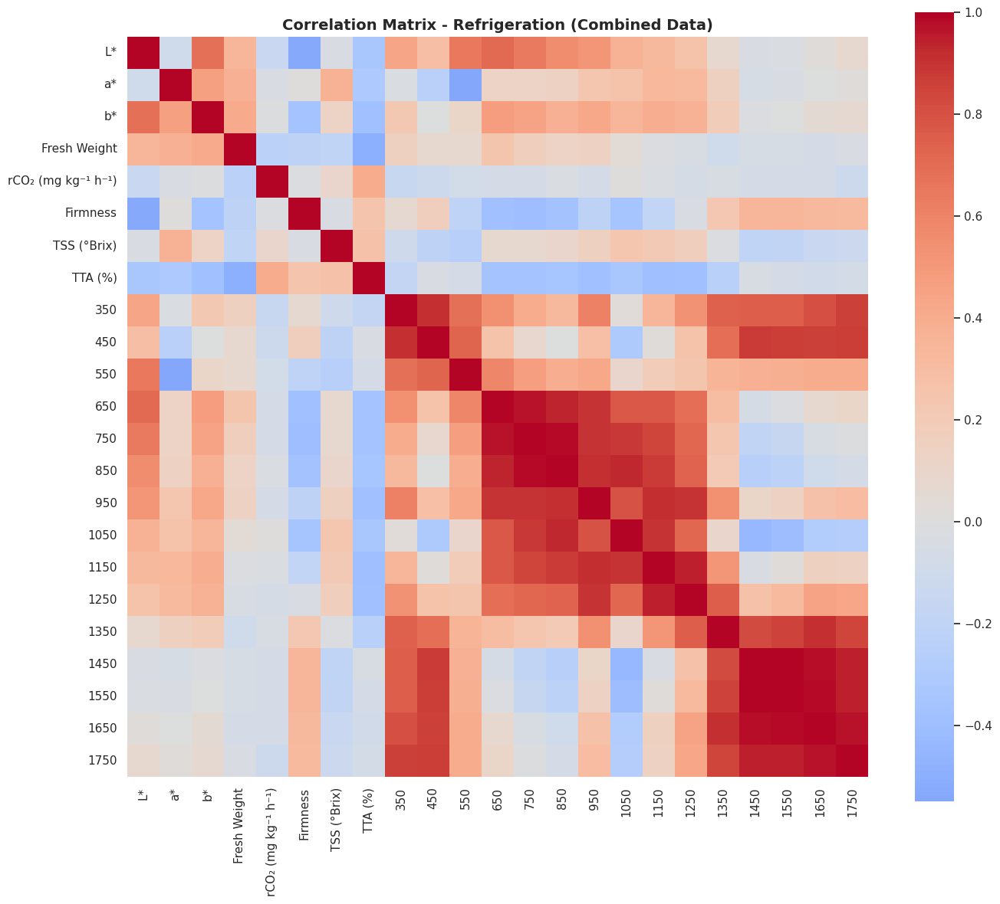


=== COMPARATIVE BOXPLOTS (COMBINED DATA) ===


/tmp/ipython-input-2004374037.py:520: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Treatment', y=param,
/tmp/ipython-input-2004374037.py:520: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Treatment', y=param,
/tmp/ipython-input-2004374037.py:520: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Treatment', y=param,
/tmp/ipython-input-2004374037.py:520: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` varia

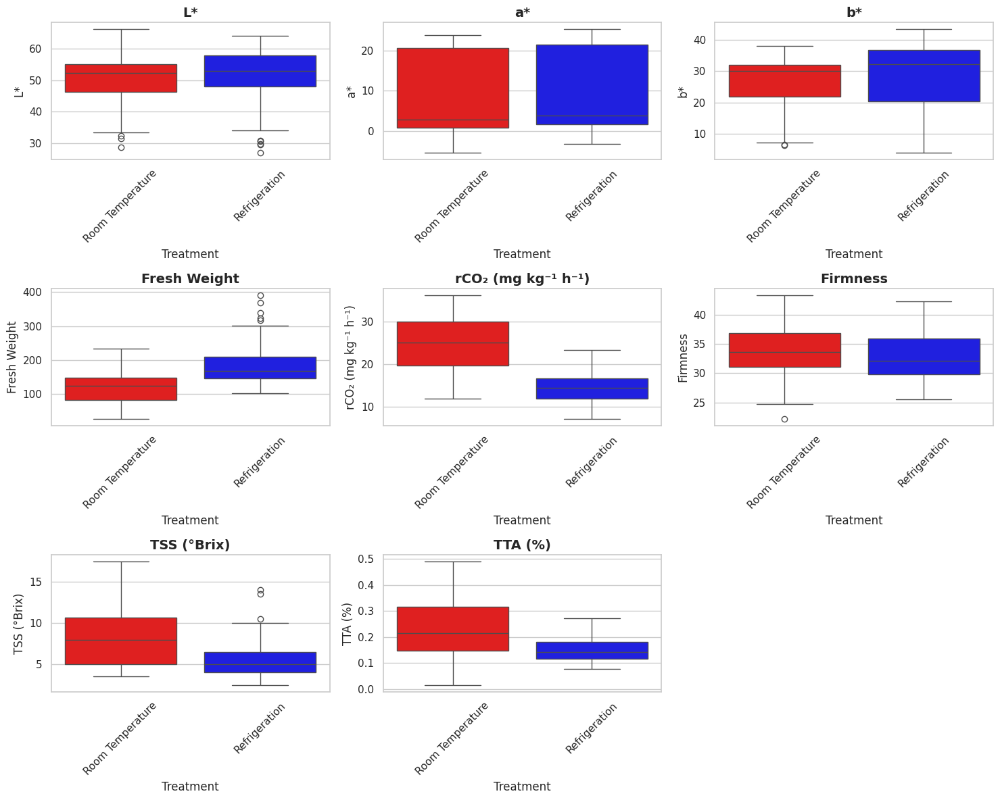

/tmp/ipython-input-2004374037.py:532: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Variedad', y=param,
/tmp/ipython-input-2004374037.py:532: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Variedad', y=param,
/tmp/ipython-input-2004374037.py:532: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=analysis_data, x='Variedad', y=param,
/tmp/ipython-input-2004374037.py:532: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable

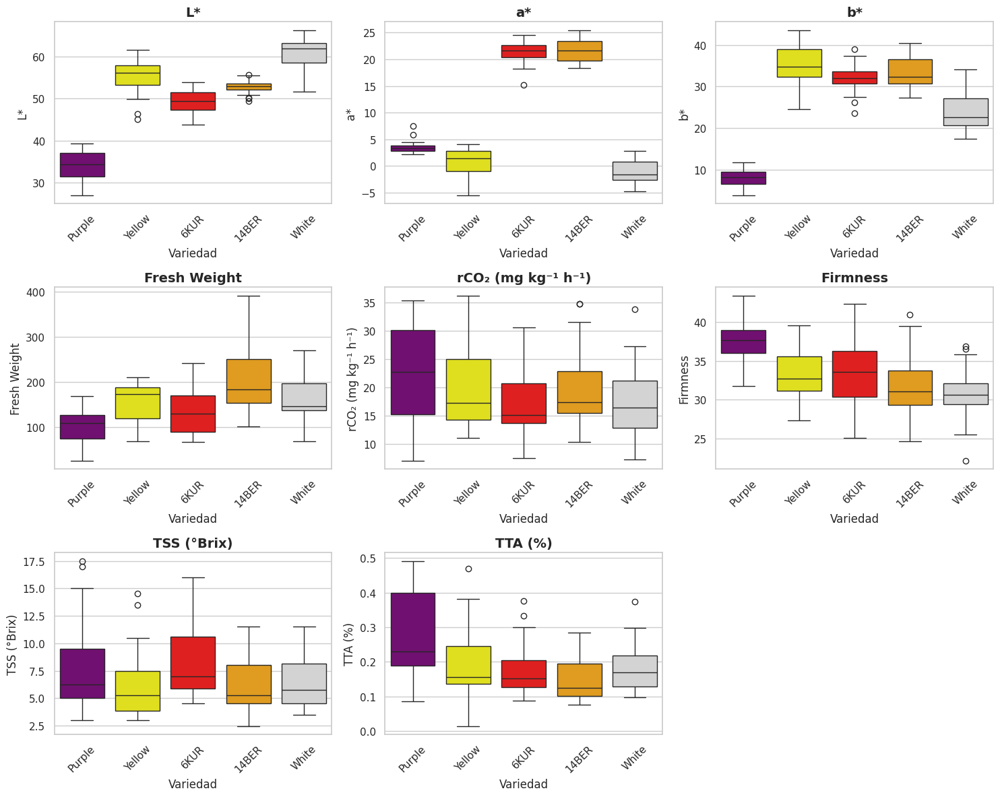


=== PRINCIPAL COMPONENT LOADINGS (COMBINED DATA) ===
Variables with highest loadings on PC1:
950     0.321911
350     0.279404
650     0.278715
750     0.268784
1250    0.262202
850     0.255479
1350    0.245245
1150    0.242608
450     0.230096
1750    0.227229
Name: PC1, dtype: float64

Variables with highest loadings on PC2:
1450    0.344898
1550    0.336942
1650    0.318595
1750    0.293674
750     0.254340
850     0.251054
1350    0.243513
1050    0.232008
650     0.220722
L*      0.209968
Name: PC2, dtype: float64


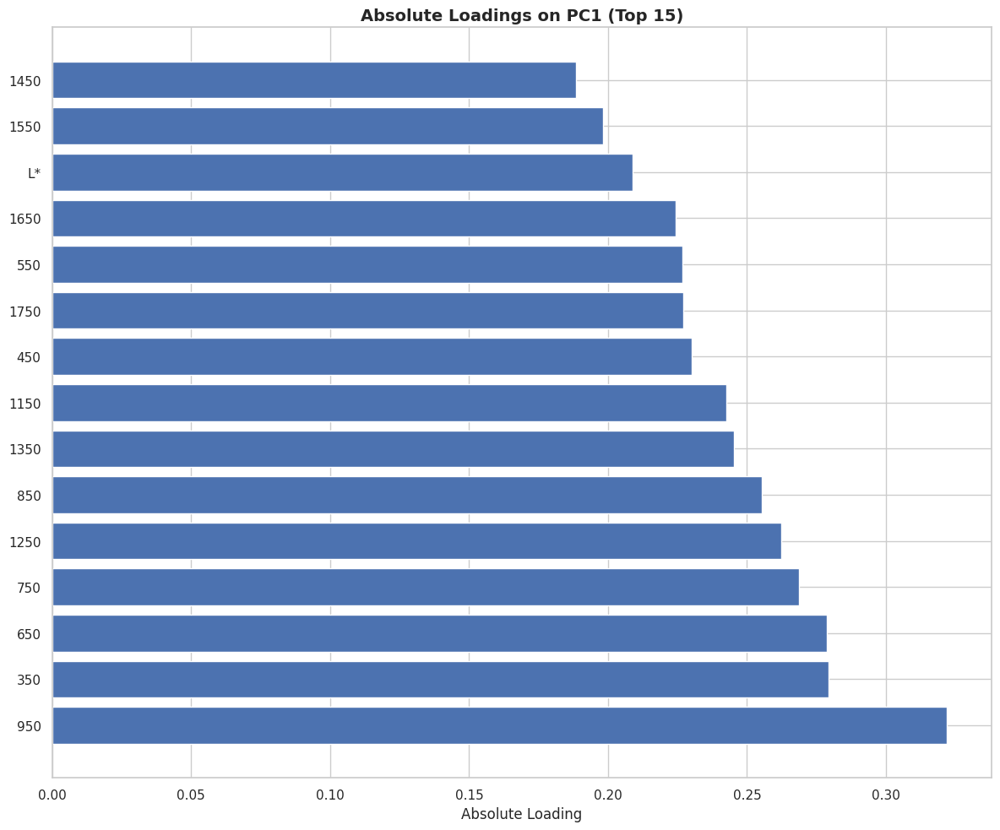

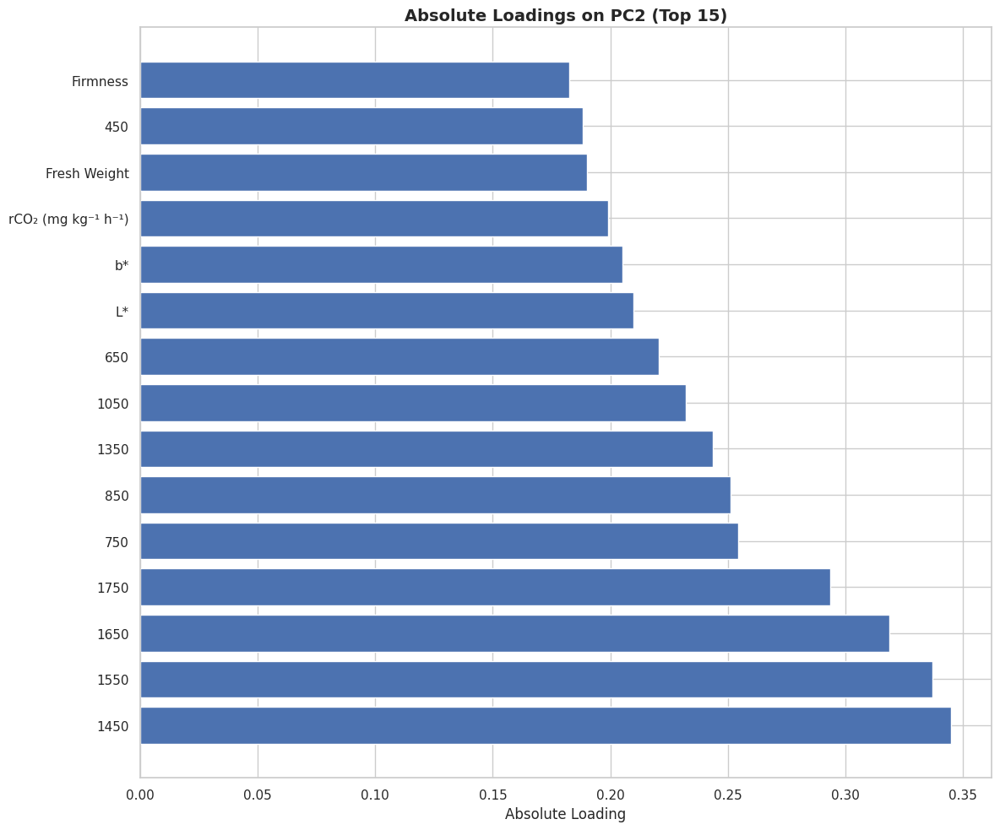


=== STATISTICAL SUMMARY (COMBINED DATA) ===
Means by treatment and variety:
                                  L*         a*         b*  Fresh Weight  \
Treatment        Variedad                                                  
Refrigeration    14BER     52.850833  22.417500  35.509167    261.380833   
                 6KUR      49.259167  21.865000  33.570000    174.711667   
                 Purple    33.206667   3.975833   7.728333    131.984167   
                 White     60.321667  -1.747500  22.100833    198.215833   
                 Yellow    57.450000   2.268333  38.149167    164.210000   
Room Temperature 14BER     52.719167  21.231667  31.093333    161.066667   
                 6KUR      49.690000  20.555000  30.171667     95.761667   
                 Purple    34.763333   3.088333   8.623333     70.710833   
                 White     61.392500  -0.621667  26.623333    131.505000   
                 Yellow    52.593333  -0.620833  32.090833    146.966667   

          

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from matplotlib.patches import Ellipse
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scipy.stats as stats
import os

# --------------------
# Style
# --------------------
plt.style.use('default')
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.titleweight'] = 'bold'

# --------------------
# Translations
# --------------------
param_translation = {
    'L*': 'L*',
    'a*': 'a*',
    'b*': 'b*',
    'Peso_Fresco': 'Fresh Weight',
    'Firmeza': 'Firmness',
    'Respiración': 'rCO₂ (mg kg⁻¹ h⁻¹)',
    'IC': 'IC',
    'SST_Corregido': 'TSS (°Brix)',
    'ATT': 'TTA (%)'
}

variety_translation = {
    "6KUR": "6KUR",
    "14BER": "14BER",
    "Amarilla": "Yellow",
    "Blanca": "White",
    "Morada": "Purple",
    "YELLOW": "Yellow",
    "WHITE": "White",
    "PURPLE": "Purple"
}

material_translation = {
    "6KUR": "6KUR",
    "14BER": "14BER",
    "AMARILLO": "Yellow",
    "BLANCA": "White",
    "MORADA": "Purple",
    "YELLOW": "Yellow",
    "WHITE": "White",
    "PURPLE": "Purple"
}

# Palettes in English
treatment_palette = {
    "Room Temperature": "red",
    "Refrigeration": "blue"
}
variety_palette = {
    "6KUR": "red",
    "14BER": "orange",
    "Yellow": "yellow",
    "White": "lightgray",
    "Purple": "purple"
}
combined_palette = {
    "6KUR_Room Temperature": "darkred",
    "6KUR_Refrigeration": "lightcoral",
    "14BER_Room Temperature": "darkorange",
    "14BER_Refrigeration": "navajowhite",
    "Yellow_Room Temperature": "goldenrod",
    "Yellow_Refrigeration": "lightyellow",
    "White_Room Temperature": "dimgray",
    "White_Refrigeration": "lightgray",
    "Purple_Room Temperature": "indigo",
    "Purple_Refrigeration": "mediumpurple"
}

# --------------------
# Data loader for physicochemical data
# --------------------
def load_carrot_data(file_path, week):
    """Load carrot data from Excel and translate/standardize columns."""
    try:
        amb_data = pd.read_excel(file_path, sheet_name='Ambiente')
        refri_data = pd.read_excel(file_path, sheet_name='Refrigeración')

        amb_data['Week'] = week
        amb_data['Treatment'] = 'Room Temperature'
        refri_data['Week'] = week
        refri_data['Treatment'] = 'Refrigeration'

        combined = pd.concat([amb_data, refri_data], ignore_index=True)
        combined.columns = combined.columns.str.strip()

        # Normalize/translate variety names
        if 'Variedad' in combined.columns:
            combined['Variedad'] = combined['Variedad'].astype(str).str.strip().replace(variety_translation)

        # Ensure numeric columns are numeric
        numeric_cols = ['L*', 'a*', 'b*', 'Diametro', 'Longitud', 'Peso_Fresco',
                        'Peso_fresco_kg', 'm', 'Respiración', 'ATAN', 'Hue',
                        'Croma', 'Firmeza', 'SST', 'SST_Corregido', 'NaOH',
                        'Acidez_Peso_Muestra', 'Factor_D', 'ATT']
        for col in numeric_cols:
            if col in combined.columns:
                combined[col] = pd.to_numeric(combined[col], errors='coerce')

        # Translate parameter names to English
        combined = combined.rename(columns=param_translation)
        return combined

    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return pd.DataFrame()

# --------------------
# Spectral data loader
# --------------------
def load_spectral_data(file_path, week, sample_type):
    """Load spectral data from CSV file with proper formatting."""
    try:
        # Check if file exists
        if not os.path.exists(file_path):
            print(f"File not found: {file_path}")
            return pd.DataFrame()

        # Load the spectral data
        df = pd.read_csv(file_path)

        # Check if the data has the expected format with Wvl and Reflect. % columns
        if 'Wvl' not in df.columns or 'Reflect. %' not in df.columns:
            print(f"Unexpected format in {file_path}. Expected columns: Wvl, Reflect. %, Material")
            return pd.DataFrame()

        # Pivot the data to have wavelengths as columns
        spectral_df = df.pivot_table(index='Material', columns='Wvl', values='Reflect. %', aggfunc='mean')
        spectral_df = spectral_df.reset_index()

        # Add metadata
        spectral_df['Week'] = week
        spectral_df['Sample_Type'] = sample_type
        spectral_df['File'] = file_path.split('/')[-1]

        # Clean and translate material names
        spectral_df['Material'] = spectral_df['Material'].astype(str).str.strip().replace(material_translation)

        return spectral_df

    except Exception as e:
        print(f"Error loading spectral data from {file_path}: {e}")
        return pd.DataFrame()

# --------------------
# Load all physicochemical data
# --------------------
files_weeks = [
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/7 10.xlsx", 1),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 15 10 24  Colab_CadenaF_TAmb.xlsx", 2),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/Muestreo 21 10 024.xlsx", 3),
    ("/content/drive/MyDrive/Proyecto Zanahoria/Muestreos/3er tiempo/ Muestreo 28 10 024.xlsx", 4)
]

all_physicochemical_data = []
for file_path, week in files_weeks:
    df = load_carrot_data(file_path, week)
    if not df.empty:
        all_physicochemical_data.append(df)

physicochemical_data = pd.concat(all_physicochemical_data, ignore_index=True)
physicochemical_data = physicochemical_data.dropna(how='all')

# Clean/translate varieties
if 'Variedad' in physicochemical_data.columns:
    physicochemical_data['Variedad'] = physicochemical_data['Variedad'].astype(str).str.strip().replace(variety_translation)

# Combined key
physicochemical_data['Treatment_Variety'] = physicochemical_data['Treatment'] + '_' + physicochemical_data['Variedad']

# --------------------
# Load all spectral data
# --------------------
# Define file paths for each week and sample type with corrected paths
spectral_files = {
    1: {
        'Refrigeration_Exterior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_09/2024_Oct_09/REFRI/2024_OCT_09 (1).csv'],
        'Room_Temperature_Exterior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_09/2024_Oct_09/AMBIENTE/2024_OCT_09_AMBIENTE_NOR (1).csv'],
        'Refrigeration_Interior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_09/CORTADAS/REFRI/2024_OCT_09_REFRI_CORT (1).csv'],
        'Room_Temperature_Interior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_09/CORTADAS/AMBIENTE/2024_OCT_09_AMB_CORT (1).csv']
    },
    2: {
        'Refrigeration_Exterior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/REFRI/2024_OCT_16_REFRI_NOR (1).csv'],
        'Room_Temperature_Exterior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_16/SM-1900_15B82D3/2024_Oct_16/AMBIENTE/2024_OCT_16_AMB_NOR (1).csv'],
        'Refrigeration_Interior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_16/SM-1900_15B82D3/CORTADAS/REFRI/2024_OCT_16_REFRI_CORT (1).csv'],
        'Room_Temperature_Interior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_16/SM-1900_15B82D3/CORTADAS/AMBIENTE/2024_OCT_16_AMB_CORT (1).csv']
    },
    3: {
        'Refrigeration_Exterior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/REFRI/2024_OCT_23_REFRI_NORM (1).csv'],
        'Room_Temperature_Exterior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_23/SM-1900_15B82D3/2024_Oct_23/AMBIENTE/2024_OCT_23_AMB_NORM (1).csv'],
        'Refrigeration_Interior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_23/SM-1900_15B82D3/CORTADAS/REFRI/2024_OCT_23_REFRI_CORT (1).csv'],
        'Room_Temperature_Interior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_23/SM-1900_15B82D3/CORTADAS/AMBIENTE/2024_OCT_23_AMB_CORT (1).csv']
    },
    4: {
        'Refrigeration_Exterior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_30/2024_Oct_30/REFRI/2024_OCT_30_REFRI_NORM (1).csv'],
        'Room_Temperature_Exterior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_30/2024_Oct_30/AMBIENTE/2024_OCT_30_AMB_NORM (1).csv'],
        'Refrigeration_Interior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_30/2024_Oct_30/CORTADA/REFRI/2024_OCT_30_REFRI_CORT (1).csv'],
        'Room_Temperature_Interior': ['/content/drive/MyDrive/Colab Notebooks/Espectral/Data/2024_Oct_30/2024_Oct_30/CORTADA/AMBIENTE/2024_OCT_30_AMB_CORT (1).csv']
    }
}

all_spectral_data = []
for week, sample_types in spectral_files.items():
    for sample_type, file_paths in sample_types.items():
        for file_path in file_paths:
            spectral_df = load_spectral_data(file_path, week, sample_type)
            if not spectral_df.empty:
                all_spectral_data.append(spectral_df)

if all_spectral_data:
    spectral_data = pd.concat(all_spectral_data, ignore_index=True)

    # Extract treatment and sample location information from sample type
    spectral_data['Treatment'] = spectral_data['Sample_Type'].apply(
        lambda x: 'Refrigeration' if 'Refrigeration' in x else 'Room Temperature'
    )
    spectral_data['Sample_Location'] = spectral_data['Sample_Type'].apply(
        lambda x: 'Exterior' if 'Exterior' in x else 'Interior'
    )

    print(f"Spectral data loaded successfully. Shape: {spectral_data.shape}")

    # Convert wavelength columns to strings to avoid sklearn error
    wavelength_cols = [col for col in spectral_data.columns if isinstance(col, (int, float)) or (isinstance(col, str) and col.replace('.', '').isdigit())]
    for col in wavelength_cols:
        if col in spectral_data.columns:
            spectral_data = spectral_data.rename(columns={col: str(col)})

    # Get updated wavelength column names
    wavelength_cols = [col for col in spectral_data.columns if col.replace('.', '').isdigit()]

    # Promediar mediciones espectrales por tratamiento y variedad (simplificación)
    grouping_cols = ['Week', 'Treatment', 'Material']
    spectral_means = spectral_data.groupby(grouping_cols)[wavelength_cols].mean().reset_index()

    # Seleccionar solo algunas longitudes de onda clave para reducir dimensionalidad
    # Usamos bandas representativas en diferentes regiones del espectro
    key_wavelengths = ['350', '450', '550', '650', '750', '850', '950', '1050', '1150', '1250',
                      '1350', '1450', '1550', '1650', '1750']

    # Filtrar solo las longitudes de onda que existen en los datos
    available_key_wavelengths = [w for w in key_wavelengths if w in spectral_means.columns]
    selected_wavelengths = available_key_wavelengths

    print(f"Selected {len(selected_wavelengths)} key wavelengths for analysis")

else:
    print("No spectral data was loaded. Continuing with physicochemical data only.")
    spectral_data = pd.DataFrame()
    selected_wavelengths = []

# --------------------
# Combine physicochemical and spectral data
# --------------------
if not spectral_data.empty:
    # Merge with physicochemical data
    combined_data = physicochemical_data.merge(
        spectral_means[grouping_cols + selected_wavelengths],
        left_on=['Week', 'Treatment', 'Variedad'],
        right_on=['Week', 'Treatment', 'Material'],
        how='left'
    )

    print(f"Combined data shape: {combined_data.shape}")
else:
    print("Using only physicochemical data (no spectral data available)")
    combined_data = physicochemical_data.copy()

# --------------------
# Variables for analysis
# --------------------
numeric_params = [
    'L*', 'a*', 'b*',
    'Fresh Weight',
    'rCO₂ (mg kg⁻¹ h⁻¹)',
    'Firmness',
    'TSS (°Brix)',
    'TTA (%)'
]

# Add spectral parameters if available
all_params = numeric_params + selected_wavelengths

# Keep only complete rows for analysis
cols_needed = ['Treatment', 'Variedad', 'Treatment_Variety'] + all_params
analysis_data = combined_data[cols_needed].dropna()

print("\nData loaded for multivariate analysis:")
print(f"Total samples: {len(analysis_data)}")
print(f"Unique treatments: {analysis_data['Treatment'].nunique()}")
print(f"Unique varieties: {analysis_data['Variedad'].nunique()}")
print(f"Unique combinations: {analysis_data['Treatment_Variety'].nunique()}")
print("\nDistribution by treatment:")
print(analysis_data['Treatment'].value_counts())
print("\nDistribution by variety:")
print(analysis_data['Variedad'].value_counts())
print("\nDistribution by combination:")
print(analysis_data['Treatment_Variety'].value_counts())

# --------------------
# 1) PCA on combined data
# --------------------
print("\n=== PRINCIPAL COMPONENT ANALYSIS (PCA) ON COMBINED DATA ===")
if len(all_params) > 1:
    X = analysis_data[all_params]

    # Convert all column names to strings to avoid sklearn error
    X.columns = X.columns.astype(str)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
    pca_df['Treatment'] = analysis_data['Treatment'].to_numpy()
    pca_df['Variedad'] = analysis_data['Variedad'].to_numpy()
    pca_df['Treatment_Variety'] = analysis_data['Treatment_Variety'].to_numpy()

    # PCA by treatment
    plt.figure(figsize=(12, 8))
    for treatment in pca_df['Treatment'].unique():
        mask = pca_df['Treatment'] == treatment
        plt.scatter(pca_df.loc[mask, 'PC1'], pca_df.loc[mask, 'PC2'],
                    label=treatment, s=80, alpha=0.7,
                    c=treatment_palette.get(treatment, 'gray'))
    plt.title('PCA - Differentiation by Storage Treatment (Combined Data)')
    plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
    plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True); plt.tight_layout(); plt.show()

    # PCA by variety
    plt.figure(figsize=(12, 8))
    for variety in pca_df['Variedad'].unique():
        mask = pca_df['Variedad'] == variety
        plt.scatter(pca_df.loc[mask, 'PC1'], pca_df.loc[mask, 'PC2'],
                    label=variety, s=80, alpha=0.7,
                    c=variety_palette.get(variety, 'gray'))
    plt.title('PCA - Differentiation by Carrot Genotype (Combined Data)')
    plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
    plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True); plt.tight_layout(); plt.show()

else:
    print("Not enough parameters for PCA analysis")

# --------------------
# Helper: confidence ellipse
# --------------------
def add_confidence_ellipse(ax, x, y, edgecolor='black', conf=0.95, lw=2, ls='--'):
    """
    Draw a confidence ellipse of level `conf` for points (x,y).
    """
    if len(x) < 2:
        return
    x = np.asarray(x); y = np.asarray(y)
    cov = np.cov(x, y)
    if np.linalg.matrix_rank(cov) < 2:
        return
    vals, vecs = np.linalg.eigh(cov)  # sorted ascending
    order = vals.argsort()[::-1]
    vals, vecs = vals[order], vecs[:, order]
    theta = np.degrees(np.arctan2(*vecs[:, 0][::-1]))
    # scale to desired confidence using chi-square quantile with 2 df
    s = np.sqrt(stats.chi2.ppf(conf, 2))
    width, height = 2 * s * np.sqrt(vals)  # 2*radius for full width/height
    mean_x, mean_y = x.mean(), y.mean()
    ellipse = Ellipse((mean_x, mean_y), width, height, angle=theta,
                      fill=False, lw=lw, ls=ls, edgecolor=edgecolor)
    ax.add_patch(ellipse)

# --------------------
# 2) LDA by variety within each treatment (WITH 95% CONFIDENCE ELLIPSES)
# --------------------
print("\n=== LINEAR DISCRIMINANT ANALYSIS BY VARIETY IN EACH TREATMENT (COMBINED DATA) ===")
for treatment in analysis_data['Treatment'].unique():
    print(f"\n--- LDA for treatment: {treatment} ---")
    subset = analysis_data[analysis_data['Treatment'] == treatment].copy()
    classes = subset['Variedad'].unique()

    if len(classes) <= 1:
        print(f"Cannot perform LDA for {treatment} - only one variety present")
        continue

    X_t = subset[all_params].to_numpy()
    y_t = subset['Variedad'].to_numpy()

    X_t_scaled = StandardScaler().fit_transform(X_t)
    n_components = min(len(classes) - 1, 2)
    lda = LinearDiscriminantAnalysis(n_components=n_components)
    X_lda = lda.fit_transform(X_t_scaled, y_t)

    # Plot
    if n_components == 1:
        plt.figure(figsize=(12, 4))
        for variety in classes:
            mask = (y_t == variety)
            plt.scatter(X_lda[mask, 0], np.zeros(mask.sum()),
                        label=variety, s=80, alpha=0.8,
                        c=variety_palette.get(variety, 'gray'))
        plt.title(f'LDA (LD1) - Genotype Differentiation in {treatment} (Combined Data)')
        plt.xlabel('LD1')
        plt.yticks([])
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True); plt.tight_layout(); plt.show()
    else:
        plt.figure(figsize=(12, 8))
        ax = plt.gca()
        for variety in classes:
            mask = (y_t == variety)
            x1 = X_lda[mask, 0]; x2 = X_lda[mask, 1]
            plt.scatter(x1, x2,
                        label=variety, s=80, alpha=0.8,
                        c=variety_palette.get(variety, 'gray'))
            # 95% confidence ellipse for each class
            add_confidence_ellipse(ax, x1, x2,
                                   edgecolor=variety_palette.get(variety, 'black'),
                                   conf=0.95, lw=2, ls='--')
        plt.title(f'LDA - Genotype Differentiation in {treatment} (Combined Data)')
        plt.xlabel('LD1'); plt.ylabel('LD2')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.grid(True); plt.tight_layout(); plt.show()

# --------------------
# 3) K-Means (on PCA projection)
# --------------------
print("\n=== K-MEANS CLUSTER ANALYSIS (COMBINED DATA) ===")
if len(all_params) > 1:
    inertias = []
    k_range = range(1, 11)
    for k in k_range:
        km = KMeans(n_clusters=k, random_state=42, n_init='auto')
        km.fit(X_scaled)
        inertias.append(km.inertia_)

    plt.figure(figsize=(8, 5))
    plt.plot(list(k_range), inertias, marker='o')
    plt.title("Elbow Method for Optimal Number of Clusters (Combined Data)")
    plt.xlabel("Number of Clusters (k)")
    plt.ylabel("Inertia (Within-Cluster SSE)")
    plt.xticks(list(k_range))
    plt.grid(True); plt.tight_layout(); plt.show()

    optimal_k = analysis_data['Treatment_Variety'].nunique()
    kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init='auto')
    clusters = kmeans.fit_predict(X_scaled)

    plt.figure(figsize=(14, 10))
    scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='tab20', s=80, alpha=0.7)
    plt.colorbar(scatter, label='Cluster')
    plt.title(f'K-Means Clustering (k={optimal_k}) - PCA Projection (Combined Data)')
    plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.2f}%)')
    plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.2f}%)')
    plt.grid(True); plt.tight_layout(); plt.show()

# --------------------
# 4) Two-way ANOVA + Tukey when interaction significant
# --------------------
print("\n=== ANALYSIS OF VARIANCE (ANOVA) BY PARAMETER (COMBINED DATA) ===")
# For this analysis, we'll focus on the original physicochemical parameters
for param in numeric_params:
    if param in analysis_data.columns:
        print(f"\nANOVA for {param}:")
        formula = f'Q("{param}") ~ C(Treatment) + C(Variedad) + C(Treatment):C(Variedad)'
        model = ols(formula, data=analysis_data).fit()
        anova_table = sm.stats.anova_lm(model, typ=2)
        print(anova_table)

        if 'C(Treatment):C(Variedad)' in anova_table.index and anova_table.loc['C(Treatment):C(Variedad)', 'PR(>F)'] < 0.05:
            print(f"\nSignificant interaction for {param}. Tukey HSD on Treatment_Variety:")
            tukey = pairwise_tukeyhsd(analysis_data[param], analysis_data['Treatment_Variety'], alpha=0.05)
            print(tukey)

# --------------------
# 5) Correlation matrices by treatment
# --------------------
print("\n=== CORRELATION MATRICES BY TREATMENT (COMBINED DATA) ===")
for treatment in analysis_data['Treatment'].unique():
    treatment_data = analysis_data.loc[analysis_data['Treatment'] == treatment, all_params]
    # Convert column names to strings
    treatment_data.columns = treatment_data.columns.astype(str)
    corr = treatment_data.corr()

    plt.figure(figsize=(14, 12))
    sns.heatmap(corr, annot=False, cmap='coolwarm', center=0, square=True)
    plt.title(f'Correlation Matrix - {treatment} (Combined Data)')
    plt.tight_layout(); plt.show()

# --------------------
# 6) Comparative boxplots
# --------------------
print("\n=== COMPARATIVE BOXPLOTS (COMBINED DATA) ===")
# By treatment
rows, cols = 3, 3
fig, axes = plt.subplots(rows, cols, figsize=(15, 12))
axes = axes.flatten()
for i, param in enumerate(numeric_params):
    if i < len(axes) and param in analysis_data.columns:
        sns.boxplot(data=analysis_data, x='Treatment', y=param,
                    ax=axes[i], palette=treatment_palette)
        axes[i].set_title(param); axes[i].tick_params(axis='x', rotation=45)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout(); plt.show()

# By variety
fig, axes = plt.subplots(rows, cols, figsize=(15, 12))
axes = axes.flatten()
for i, param in enumerate(numeric_params):
    if i < len(axes) and param in analysis_data.columns:
        sns.boxplot(data=analysis_data, x='Variedad', y=param,
                    ax=axes[i], palette=variety_palette)
        axes[i].set_title(param); axes[i].tick_params(axis='x', rotation=45)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout(); plt.show()

# --------------------
# 7) PCA loadings
# --------------------
print("\n=== PRINCIPAL COMPONENT LOADINGS (COMBINED DATA) ===")
if len(all_params) > 1:
    loadings = pd.DataFrame(pca.components_.T, columns=['PC1', 'PC2'], index=all_params)
    load_PC1 = loadings['PC1'].abs().sort_values(ascending=False)
    load_PC2 = loadings['PC2'].abs().sort_values(ascending=False)

    print("Variables with highest loadings on PC1:")
    print(load_PC1.head(10))
    print("\nVariables with highest loadings on PC2:")
    print(load_PC2.head(10))

    plt.figure(figsize=(12, 10))
    plt.barh(range(len(load_PC1.head(15))), load_PC1.head(15).values)
    plt.yticks(range(len(load_PC1.head(15))), load_PC1.head(15).index)
    plt.title('Absolute Loadings on PC1 (Top 15)')
    plt.xlabel('Absolute Loading'); plt.tight_layout(); plt.show()

    plt.figure(figsize=(12, 10))
    plt.barh(range(len(load_PC2.head(15))), load_PC2.head(15).values)
    plt.yticks(range(len(load_PC2.head(15))), load_PC2.head(15).index)
    plt.title('Absolute Loadings on PC2 (Top 15)')
    plt.xlabel('Absolute Loading'); plt.tight_layout(); plt.show()

# --------------------
# 8) Summary stats
# --------------------
print("\n=== STATISTICAL SUMMARY (COMBINED DATA) ===")
print("Means by treatment and variety:")
print(analysis_data.groupby(['Treatment', 'Variedad'])[numeric_params].mean())

print("\nMeans by treatment:")
print(analysis_data.groupby('Treatment')[numeric_params].mean())

print("\nMeans by variety:")
print(analysis_data.groupby('Variedad')[numeric_params].mean())

print("\nMultivariate analysis of combined physicochemical and spectral data completed.")